# Introduction
The purpose of the project was to build an automated, multi-task deep learning system.
The intention of this system was to efficiently detect common surface damage found in buildings in urban areas.
- Cracks
- Spalling
- Rebar

# Data source
https://sail.cive.uh.edu/quakecity/

# Exploratory Analysis of Data Tasks
**Name:** QuakeCity  

**Source:** Generated using Physics-Based Graphics Models (PBGM) from Hoskere et al. (2021)  

**Purpose:** Simulates realistic earthquake-induced damage on urban buildings for vision-based inspection models.  

**Number of images:**  
- 4809 images
- 6 masks per image
- Total image count = 4809 * 7 = 33663 images

**Number of classes:** 6 classes for each image  
- *crack:* surface-level damage
- *spall:* concrete peeling
- *rebar:* exposed reinforcement
- *component:* structural parts (wall, beam, window, slab, etc.)
- *ds:* damage severity (none, light, moderate, severe)
- *depth:* distance from UAV camera (for 3D awareness)

**Size of each image:** 1920x1080

**Pre-processing modifications:**
- Image size was too large, making things computationally expensive. Each model therefore downsized the images to speed up the training process
- For the CustomFCN model, labels were converted to binary images, with the intention of increasing training speed

**Challenging aspects across all models:**
- The *rebar* class performed poorly across the board. Even after implementing class imbalance, there was no improvement

# Table of contents
0. Model explanation and hyperparameter settings (Mohamad's model - CustomFCN)
1. Import packages  
2. Cracks model 
    1. Create model
    2. Prepare data
    3. Choose criterion and optimizer
    4. Train model
    5. Download model 
    6. Test model
3. Spalls model  
    1. Create model
    2. Prepare data
    3. Choose criterion and optimizer
    4. Train model
    5. Download model 
    6. Test model
4. Rebar model  
    1. Compile 2000 images
    2. Create model
    3. Prepare data
    4. Choose criterion and optimizer
    5. Train model
    6. Download model 
    7. Test model
5. Results
    1. Crack detection
    2. Spall detection
    3. Rebar detection
6. Discussion

# 0. Model explanation and hyperparameter settings (Mohamad's model - CustomFCN)
![CustomFCN architecture.](notebook_images/CustomFCNV2.png)  
Three "Sub-CustomFCN"'s were trained for each class as it proved to be difficult for the model to produce all three classes at once with one model.

Each Sub-CustomFCN was trained for 50 epochs using Binary Cross Entropy with Logits Loss (BCEWithLogitsLoss). We used Stochastic Gradient Descent with a high learning rate of 0.8 and momentum of 0.9. The batch size was set to 64, and training was conducted on a local RTX 4070 GPU. Input images were resized to 480×640 pixels, and the dataset was evenly split with 640 images for training, validation, and testing respectively. Batch normalization was applied in all convolution blocks to accelerate convergence and improve generalization.

Our model is a custom Fully Convolutional Network (FCN) with a symmetric encoder-decoder architecture, as shown in the diagram. The input is a 480×640 RGB image, passed through a series of three convolutional blocks in the encoder (top side of the image). Each block consists of a 3×3 convolution followed by Batch Normalization and a ReLU activation. After each block, MaxPooling is applied to halve the spatial resolution from 480×640, to 240×320, to 120x160, and finally to 60x80, whilst also increasing the channel depth from 3 to 8, 16, and 32 respectively. This process aims to train the network to capture increasingly abstract features as the image is compressed.

The decoder (bottom side) mirrors the encoder. It begins by upsampling the compressed feature maps back to their original resolution using bilinear interpolation. At each stage, the upsampled features are concatenated with their corresponding encoder outputs. These skip connections help preserve fine spatial details that might otherwise be lost during downsampling. Each upsampled+concatenated output is then passed through another convolutional block (same 3×3 conv + batch norm + ReLU) to refine the features.

At the end of the decoder, the network applies a final 1×1 convolution to reduce the depth back to 1 channel, which represents the segmentation mask. Then a sigmoid activation is applied to squash the output into the [0, 1] range, giving a pixel-wise probability map.



# 1. Import packages

In [49]:
import os
import torch
import random
from PIL import Image
import torch.nn as nn
import matplotlib.pyplot as plt
import torchvision.transforms as transforms

# 2. Cracks model

## 2.1. Create model

In [ ]:
class CustomFCN(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super(CustomFCN, self).__init__()

        # Downsampling (Encoder)
        self.enc1 = self.conv_chain(in_channels, 3, 3, 8, 1, 1)
        self.pool1 = nn.MaxPool2d(2, stride=2)

        self.enc2 = self.conv_chain(8, 3, 3, 16, 1, 1)
        self.pool2 = nn.MaxPool2d(2, stride=2)

        self.enc3 = self.conv_chain(16, 3, 3, 32, 1, 1)
        self.pool3 = nn.MaxPool2d(2, stride=2)

       # Upsampling (Decoder)
        self.up1 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dec1 = self.conv_chain(32, 3, 3, 16, 1, 1)

        self.up2 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dec2 = self.conv_chain(32, 3, 3, 8, 1, 1)

        self.up3 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dec3 = nn.Conv2d(in_channels=16, out_channels=out_channels, kernel_size=1, padding=0, stride=1)

    def conv_chain(self, Din, L, M, D, S, P):
      return nn.Sequential(
          nn.Conv2d(in_channels=Din, out_channels=D, kernel_size=(L, M), padding=P, stride=S),
          nn.BatchNorm2d(D),
          nn.ReLU(inplace=True)
      )

    def forward(self, x):
        # Encoder
        x1 = self.pool1(self.enc1(x))
        x2 = self.pool2(self.enc2(x1))
        x3 = self.pool3(self.enc3(x2))

        # Decoder
        y = self.up1(x3)
        y = self.dec1(y)
        y = torch.cat([y, x2], dim=1)

        y = self.up2(y)
        y = self.dec2(y)
        y = torch.cat([y, x1], dim=1)

        y = self.up3(y)
        y = self.dec3(y)

        return y

# Create model instance
model = CustomFCN()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)


CustomFCN(
  (enc1): Sequential(
    (0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (enc2): Sequential(
    (0): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (enc3): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (up1): Upsample(scale_factor=2.0, mode='bilinear')
  (dec1): Sequential(
    (0

## 2.2. Prepare data

In [ ]:
IMAGE_PATH = "../QuakeCity/image"
LABEL_PATH = "../QuakeCity/label"

def load_image(path, isLabel=False):
    """Load an RGB image and convert to a tensor"""
    img = Image.open(path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((480, 640)),  # Resize images
        transforms.ToTensor(),  # Convert to tensor

    ])
    if isLabel:
        transform = transforms.Compose([
            transforms.Grayscale(num_output_channels=1),
            transforms.Resize((480, 640)),  # Resize images
            transforms.ToTensor(),  # Convert to tensor
        ])
        return (transform(img) > 0).float()
    return transform(img)  # Apply transform

class QuakeCityDataset(torch.utils.data.Dataset):
    def __init__(self, file_list):
        self.file_list = file_list

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        filename = self.file_list[idx]
        img = load_image(os.path.join(IMAGE_PATH, filename))
        crack = load_image(os.path.join(LABEL_PATH, "crack", filename), isLabel=True)
        return img, crack

total = 1920
all_files = sorted(os.listdir(IMAGE_PATH))[:total]
random.shuffle(all_files)
split_size = total//3
train_files = all_files[:split_size]
val_files = all_files[split_size:2*split_size]
test_files = all_files[2*split_size:3*split_size]

train_dataset = QuakeCityDataset(train_files)
validation_dataset = QuakeCityDataset(val_files)
test_dataset = QuakeCityDataset(test_files)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=split_size//10, shuffle=True)
validation_loader = torch.utils.data.DataLoader(validation_dataset, batch_size=split_size//10, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=split_size//10, shuffle=False)


img_test_batch, label_test_batch = next(iter(validation_loader))
print("Test image batch shape:", img_test_batch.shape)
print("Test label batch shape:", label_test_batch.shape)


Test image batch shape: torch.Size([64, 3, 480, 640])
Test label batch shape: torch.Size([64, 1, 480, 640])


## 2.3. Choose criterion and optimizer

In [ ]:
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.8, momentum=0.9)

## 2.4. Train model

Epoch   1, Batch   1: loss =  0.7088, output_mean =  0.4993, target_mean =  0.0310
Epoch   1, Batch   2: loss =  0.2461, output_mean =  0.1721, target_mean =  0.0302
Epoch   1, Batch   3: loss =  0.1597, output_mean =  0.0333, target_mean =  0.0334
Epoch   1, Batch   4: loss =  0.1832, output_mean =  0.0065, target_mean =  0.0325
Epoch   1, Batch   5: loss =  0.1914, output_mean =  0.0018, target_mean =  0.0286
Epoch   1, Batch   6: loss =  0.2023, output_mean =  0.0008, target_mean =  0.0273
Epoch   1, Batch   7: loss =  0.2553, output_mean =  0.0006, target_mean =  0.0336
Epoch   1, Batch   8: loss =  0.2028, output_mean =  0.0009, target_mean =  0.0275
Epoch   1, Batch   9: loss =  0.1995, output_mean =  0.0019, target_mean =  0.0276
Epoch   1, Batch  10: loss =  0.2110, output_mean =  0.0029, target_mean =  0.0307
Epoch 1 Average Loss: 0.2560 Validation loss: 0.3663
Validation accuracy: 0.9685


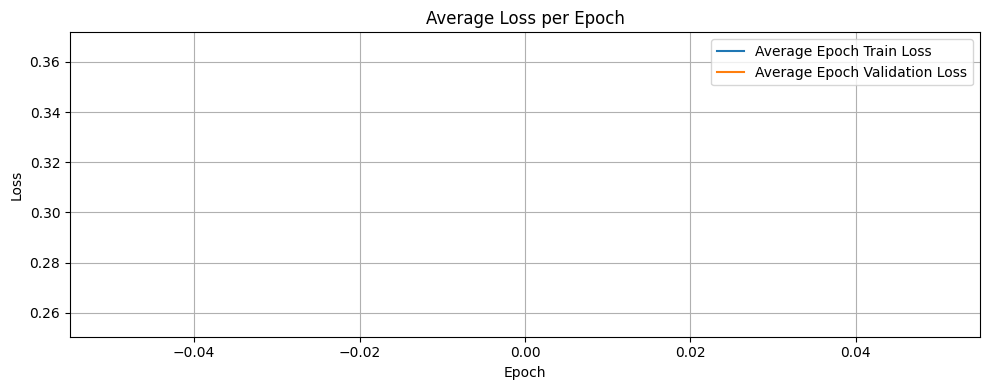

Epoch   2, Batch   1: loss =  0.2059, output_mean =  0.0043, target_mean =  0.0321
Epoch   2, Batch   2: loss =  0.1919, output_mean =  0.0051, target_mean =  0.0299
Epoch   2, Batch   3: loss =  0.1780, output_mean =  0.0067, target_mean =  0.0326
Epoch   2, Batch   4: loss =  0.1528, output_mean =  0.0125, target_mean =  0.0315
Epoch   2, Batch   5: loss =  0.1472, output_mean =  0.0212, target_mean =  0.0294
Epoch   2, Batch   6: loss =  0.1146, output_mean =  0.0216, target_mean =  0.0239
Epoch   2, Batch   7: loss =  0.1411, output_mean =  0.0249, target_mean =  0.0306
Epoch   2, Batch   8: loss =  0.1400, output_mean =  0.0254, target_mean =  0.0325
Epoch   2, Batch   9: loss =  0.1193, output_mean =  0.0311, target_mean =  0.0284
Epoch   2, Batch  10: loss =  0.1314, output_mean =  0.0317, target_mean =  0.0316
Epoch 2 Average Loss: 0.1522 Validation loss: 0.2441
Validation accuracy: 0.9685


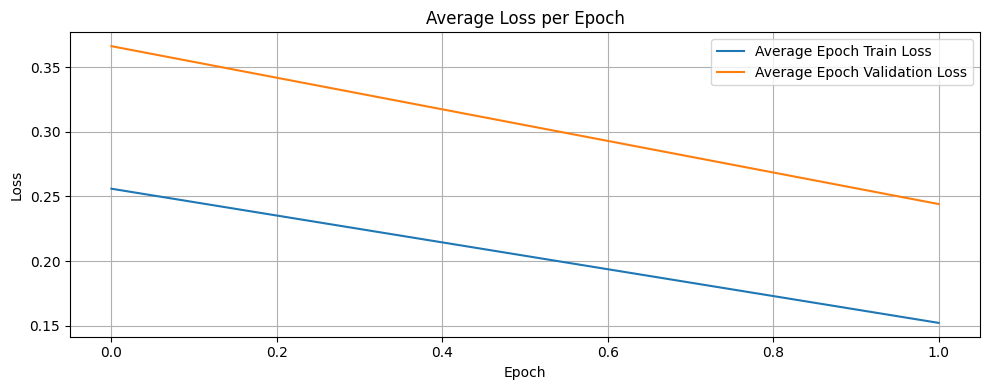

Epoch   3, Batch   1: loss =  0.1240, output_mean =  0.0357, target_mean =  0.0292
Epoch   3, Batch   2: loss =  0.1293, output_mean =  0.0373, target_mean =  0.0305
Epoch   3, Batch   3: loss =  0.1229, output_mean =  0.0381, target_mean =  0.0279
Epoch   3, Batch   4: loss =  0.1233, output_mean =  0.0392, target_mean =  0.0286
Epoch   3, Batch   5: loss =  0.1280, output_mean =  0.0384, target_mean =  0.0303
Epoch   3, Batch   6: loss =  0.1383, output_mean =  0.0385, target_mean =  0.0334
Epoch   3, Batch   7: loss =  0.1196, output_mean =  0.0401, target_mean =  0.0276
Epoch   3, Batch   8: loss =  0.1327, output_mean =  0.0368, target_mean =  0.0314
Epoch   3, Batch   9: loss =  0.1316, output_mean =  0.0349, target_mean =  0.0325
Epoch   3, Batch  10: loss =  0.1282, output_mean =  0.0324, target_mean =  0.0312
Epoch 3 Average Loss: 0.1278 Validation loss: 0.1388
Validation accuracy: 0.9685


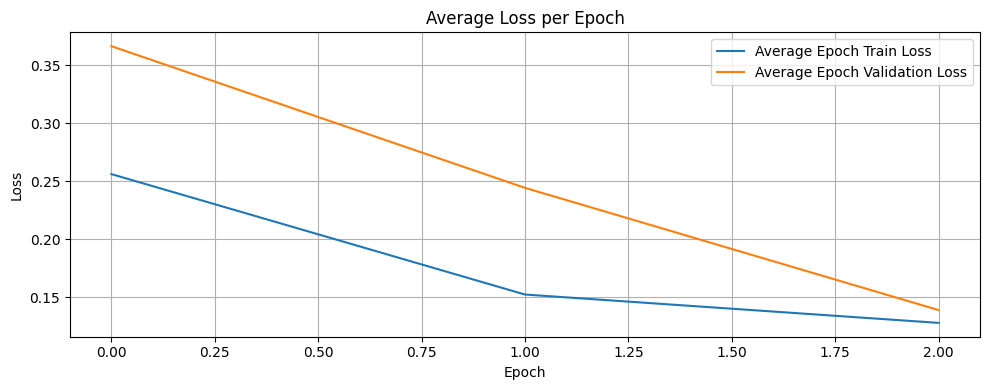

Epoch   4, Batch   1: loss =  0.1220, output_mean =  0.0318, target_mean =  0.0295
Epoch   4, Batch   2: loss =  0.1183, output_mean =  0.0283, target_mean =  0.0285
Epoch   4, Batch   3: loss =  0.1218, output_mean =  0.0270, target_mean =  0.0298
Epoch   4, Batch   4: loss =  0.1116, output_mean =  0.0256, target_mean =  0.0268
Epoch   4, Batch   5: loss =  0.1410, output_mean =  0.0240, target_mean =  0.0354
Epoch   4, Batch   6: loss =  0.1256, output_mean =  0.0223, target_mean =  0.0305
Epoch   4, Batch   7: loss =  0.1193, output_mean =  0.0236, target_mean =  0.0291
Epoch   4, Batch   8: loss =  0.1302, output_mean =  0.0234, target_mean =  0.0321
Epoch   4, Batch   9: loss =  0.1239, output_mean =  0.0238, target_mean =  0.0303
Epoch   4, Batch  10: loss =  0.1222, output_mean =  0.0239, target_mean =  0.0303
Epoch 4 Average Loss: 0.1236 Validation loss: 0.1355
Validation accuracy: 0.9685


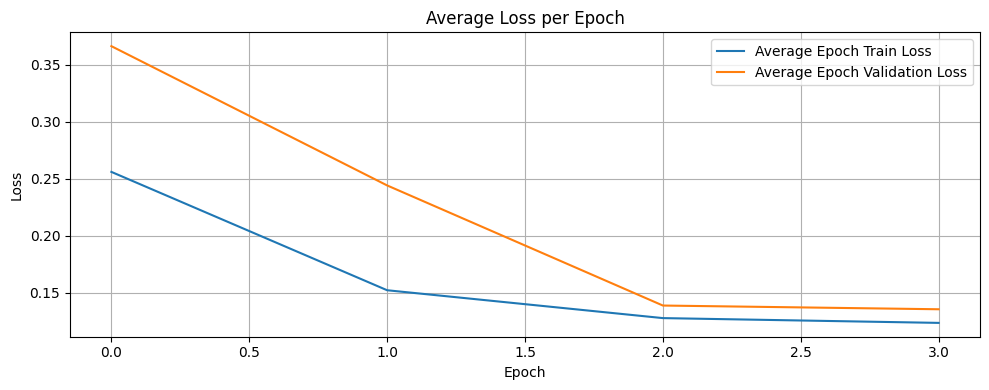

Epoch   5, Batch   1: loss =  0.1331, output_mean =  0.0244, target_mean =  0.0332
Epoch   5, Batch   2: loss =  0.1069, output_mean =  0.0260, target_mean =  0.0253
Epoch   5, Batch   3: loss =  0.1311, output_mean =  0.0275, target_mean =  0.0327
Epoch   5, Batch   4: loss =  0.1256, output_mean =  0.0279, target_mean =  0.0319
Epoch   5, Batch   5: loss =  0.1309, output_mean =  0.0281, target_mean =  0.0334
Epoch   5, Batch   6: loss =  0.1267, output_mean =  0.0278, target_mean =  0.0319
Epoch   5, Batch   7: loss =  0.1007, output_mean =  0.0275, target_mean =  0.0234
Epoch   5, Batch   8: loss =  0.1299, output_mean =  0.0275, target_mean =  0.0332
Epoch   5, Batch   9: loss =  0.1178, output_mean =  0.0268, target_mean =  0.0297
Epoch   5, Batch  10: loss =  0.1123, output_mean =  0.0295, target_mean =  0.0276
Epoch 5 Average Loss: 0.1215 Validation loss: 0.1398
Validation accuracy: 0.9685


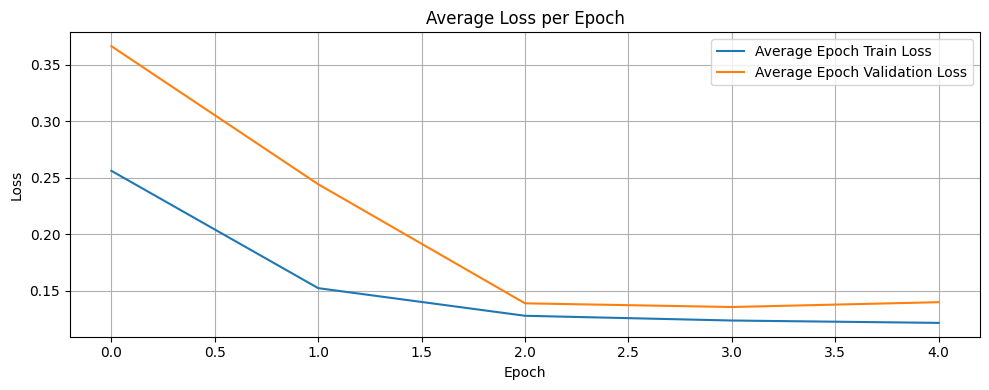

Epoch   6, Batch   1: loss =  0.1149, output_mean =  0.0301, target_mean =  0.0275
Epoch   6, Batch   2: loss =  0.1210, output_mean =  0.0301, target_mean =  0.0311
Epoch   6, Batch   3: loss =  0.1209, output_mean =  0.0295, target_mean =  0.0308
Epoch   6, Batch   4: loss =  0.1316, output_mean =  0.0283, target_mean =  0.0336
Epoch   6, Batch   5: loss =  0.1205, output_mean =  0.0267, target_mean =  0.0301
Epoch   6, Batch   6: loss =  0.1291, output_mean =  0.0290, target_mean =  0.0340
Epoch   6, Batch   7: loss =  0.1217, output_mean =  0.0297, target_mean =  0.0313
Epoch   6, Batch   8: loss =  0.1063, output_mean =  0.0274, target_mean =  0.0261
Epoch   6, Batch   9: loss =  0.1178, output_mean =  0.0253, target_mean =  0.0297
Epoch   6, Batch  10: loss =  0.1146, output_mean =  0.0254, target_mean =  0.0283
Epoch 6 Average Loss: 0.1198 Validation loss: 0.1266
Validation accuracy: 0.9685


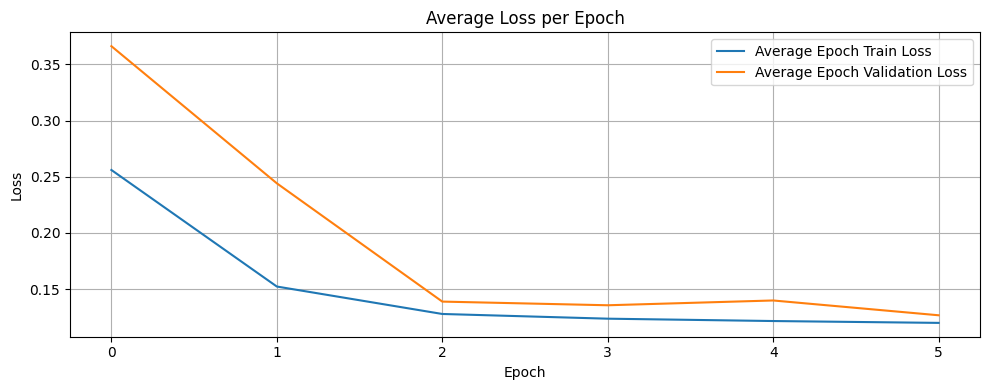

Epoch   7, Batch   1: loss =  0.1159, output_mean =  0.0271, target_mean =  0.0295
Epoch   7, Batch   2: loss =  0.1159, output_mean =  0.0278, target_mean =  0.0302
Epoch   7, Batch   3: loss =  0.1054, output_mean =  0.0313, target_mean =  0.0255
Epoch   7, Batch   4: loss =  0.1106, output_mean =  0.0311, target_mean =  0.0274
Epoch   7, Batch   5: loss =  0.1268, output_mean =  0.0287, target_mean =  0.0324
Epoch   7, Batch   6: loss =  0.1172, output_mean =  0.0276, target_mean =  0.0296
Epoch   7, Batch   7: loss =  0.1199, output_mean =  0.0282, target_mean =  0.0307
Epoch   7, Batch   8: loss =  0.1324, output_mean =  0.0284, target_mean =  0.0347
Epoch   7, Batch   9: loss =  0.1181, output_mean =  0.0304, target_mean =  0.0313
Epoch   7, Batch  10: loss =  0.1226, output_mean =  0.0327, target_mean =  0.0313
Epoch 7 Average Loss: 0.1185 Validation loss: 0.1280
Validation accuracy: 0.9685


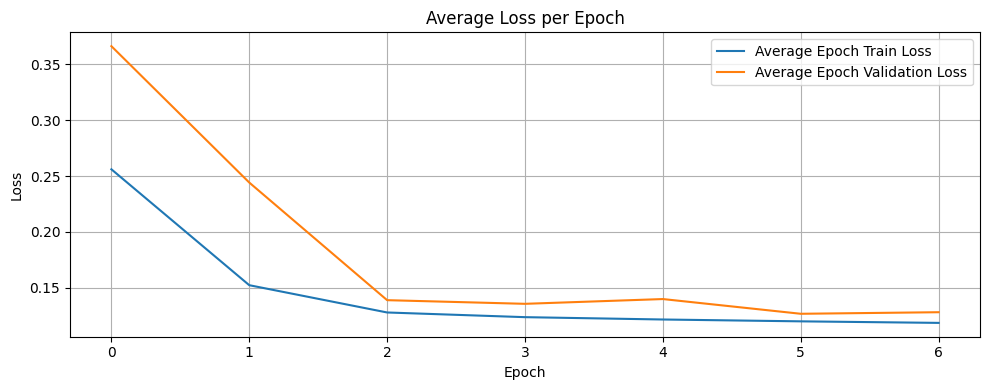

Epoch   8, Batch   1: loss =  0.1168, output_mean =  0.0324, target_mean =  0.0294
Epoch   8, Batch   2: loss =  0.1211, output_mean =  0.0296, target_mean =  0.0313
Epoch   8, Batch   3: loss =  0.1154, output_mean =  0.0300, target_mean =  0.0291
Epoch   8, Batch   4: loss =  0.1071, output_mean =  0.0284, target_mean =  0.0279
Epoch   8, Batch   5: loss =  0.1211, output_mean =  0.0281, target_mean =  0.0318
Epoch   8, Batch   6: loss =  0.1054, output_mean =  0.0271, target_mean =  0.0265
Epoch   8, Batch   7: loss =  0.1224, output_mean =  0.0306, target_mean =  0.0322
Epoch   8, Batch   8: loss =  0.1295, output_mean =  0.0301, target_mean =  0.0346
Epoch   8, Batch   9: loss =  0.1169, output_mean =  0.0287, target_mean =  0.0304
Epoch   8, Batch  10: loss =  0.1126, output_mean =  0.0283, target_mean =  0.0292
Epoch 8 Average Loss: 0.1168 Validation loss: 0.1209
Validation accuracy: 0.9685


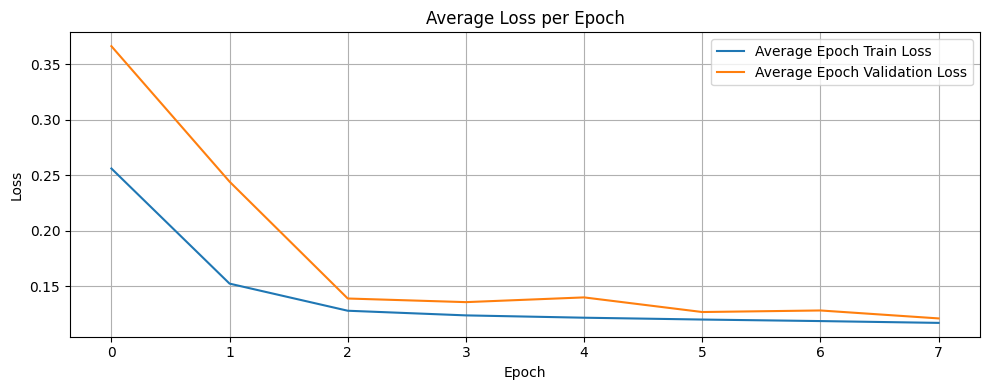

Epoch   9, Batch   1: loss =  0.1248, output_mean =  0.0291, target_mean =  0.0322
Epoch   9, Batch   2: loss =  0.1174, output_mean =  0.0279, target_mean =  0.0310
Epoch   9, Batch   3: loss =  0.1089, output_mean =  0.0294, target_mean =  0.0274
Epoch   9, Batch   4: loss =  0.1091, output_mean =  0.0300, target_mean =  0.0277
Epoch   9, Batch   5: loss =  0.1189, output_mean =  0.0288, target_mean =  0.0310
Epoch   9, Batch   6: loss =  0.1220, output_mean =  0.0297, target_mean =  0.0338
Epoch   9, Batch   7: loss =  0.1236, output_mean =  0.0327, target_mean =  0.0342
Epoch   9, Batch   8: loss =  0.1177, output_mean =  0.0392, target_mean =  0.0314
Epoch   9, Batch   9: loss =  0.1164, output_mean =  0.0346, target_mean =  0.0300
Epoch   9, Batch  10: loss =  0.0987, output_mean =  0.0284, target_mean =  0.0238
Epoch 9 Average Loss: 0.1157 Validation loss: 0.1239
Validation accuracy: 0.9685


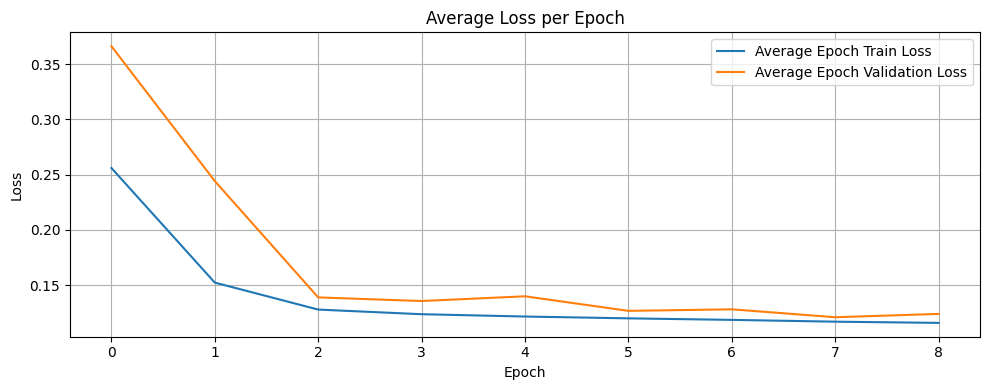

Epoch  10, Batch   1: loss =  0.1131, output_mean =  0.0257, target_mean =  0.0291
Epoch  10, Batch   2: loss =  0.1268, output_mean =  0.0262, target_mean =  0.0335
Epoch  10, Batch   3: loss =  0.1065, output_mean =  0.0257, target_mean =  0.0275
Epoch  10, Batch   4: loss =  0.1095, output_mean =  0.0259, target_mean =  0.0286
Epoch  10, Batch   5: loss =  0.1175, output_mean =  0.0299, target_mean =  0.0316
Epoch  10, Batch   6: loss =  0.0967, output_mean =  0.0276, target_mean =  0.0256
Epoch  10, Batch   7: loss =  0.1164, output_mean =  0.0256, target_mean =  0.0312
Epoch  10, Batch   8: loss =  0.1116, output_mean =  0.0260, target_mean =  0.0297
Epoch  10, Batch   9: loss =  0.1147, output_mean =  0.0292, target_mean =  0.0300
Epoch  10, Batch  10: loss =  0.1301, output_mean =  0.0373, target_mean =  0.0357
Epoch 10 Average Loss: 0.1143 Validation loss: 0.1199
Validation accuracy: 0.9685


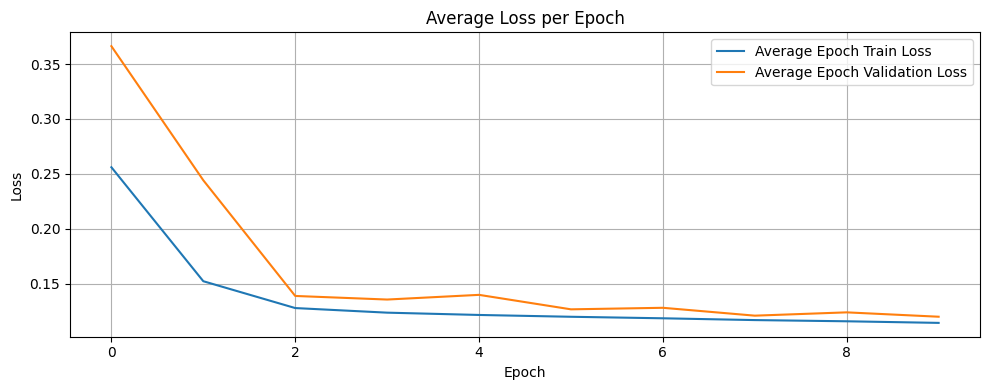

Epoch  11, Batch   1: loss =  0.1107, output_mean =  0.0310, target_mean =  0.0299
Epoch  11, Batch   2: loss =  0.1101, output_mean =  0.0278, target_mean =  0.0294
Epoch  11, Batch   3: loss =  0.1168, output_mean =  0.0283, target_mean =  0.0314
Epoch  11, Batch   4: loss =  0.1262, output_mean =  0.0304, target_mean =  0.0340
Epoch  11, Batch   5: loss =  0.1201, output_mean =  0.0297, target_mean =  0.0329
Epoch  11, Batch   6: loss =  0.1109, output_mean =  0.0352, target_mean =  0.0293
Epoch  11, Batch   7: loss =  0.1044, output_mean =  0.0361, target_mean =  0.0261
Epoch  11, Batch   8: loss =  0.1213, output_mean =  0.0301, target_mean =  0.0343
Epoch  11, Batch   9: loss =  0.1068, output_mean =  0.0269, target_mean =  0.0280
Epoch  11, Batch  10: loss =  0.1044, output_mean =  0.0237, target_mean =  0.0273
Epoch 11 Average Loss: 0.1132 Validation loss: 0.1304
Validation accuracy: 0.9685


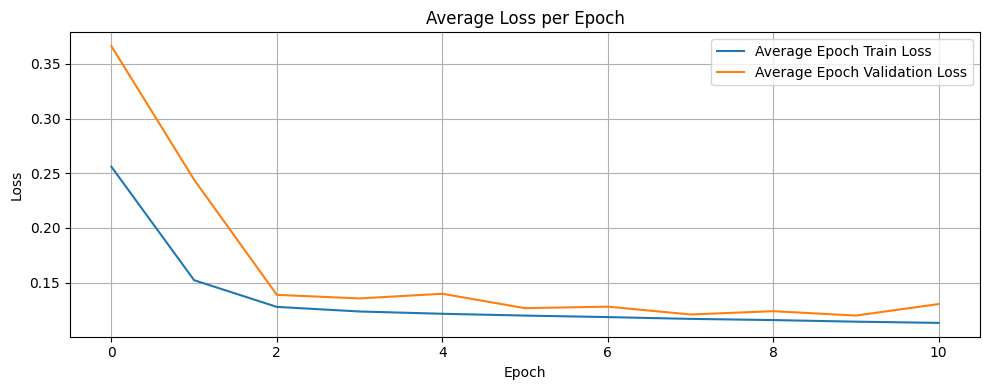

Epoch  12, Batch   1: loss =  0.1141, output_mean =  0.0233, target_mean =  0.0304
Epoch  12, Batch   2: loss =  0.1193, output_mean =  0.0247, target_mean =  0.0317
Epoch  12, Batch   3: loss =  0.1073, output_mean =  0.0293, target_mean =  0.0296
Epoch  12, Batch   4: loss =  0.1168, output_mean =  0.0334, target_mean =  0.0328
Epoch  12, Batch   5: loss =  0.1072, output_mean =  0.0365, target_mean =  0.0276
Epoch  12, Batch   6: loss =  0.1057, output_mean =  0.0332, target_mean =  0.0277
Epoch  12, Batch   7: loss =  0.1092, output_mean =  0.0336, target_mean =  0.0291
Epoch  12, Batch   8: loss =  0.1140, output_mean =  0.0295, target_mean =  0.0318
Epoch  12, Batch   9: loss =  0.1185, output_mean =  0.0294, target_mean =  0.0327
Epoch  12, Batch  10: loss =  0.1041, output_mean =  0.0245, target_mean =  0.0290
Epoch 12 Average Loss: 0.1116 Validation loss: 0.1236
Validation accuracy: 0.9685


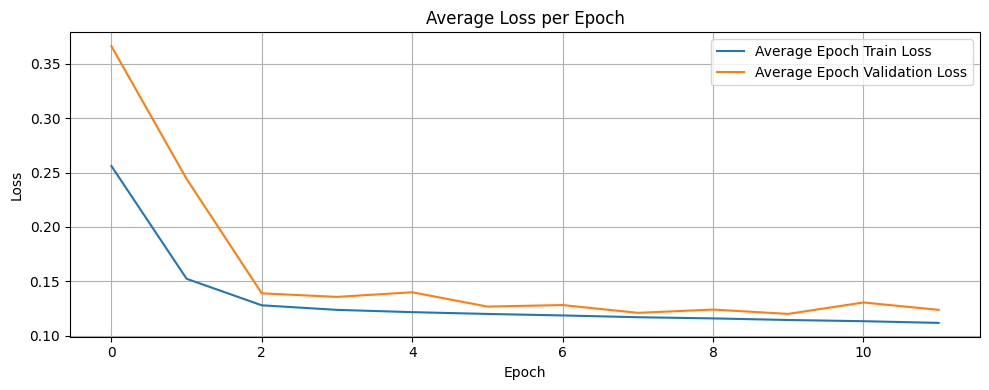

Epoch  13, Batch   1: loss =  0.1089, output_mean =  0.0271, target_mean =  0.0306
Epoch  13, Batch   2: loss =  0.1156, output_mean =  0.0275, target_mean =  0.0311
Epoch  13, Batch   3: loss =  0.1094, output_mean =  0.0261, target_mean =  0.0300
Epoch  13, Batch   4: loss =  0.1173, output_mean =  0.0271, target_mean =  0.0323
Epoch  13, Batch   5: loss =  0.1075, output_mean =  0.0275, target_mean =  0.0312
Epoch  13, Batch   6: loss =  0.1002, output_mean =  0.0315, target_mean =  0.0277
Epoch  13, Batch   7: loss =  0.1071, output_mean =  0.0315, target_mean =  0.0304
Epoch  13, Batch   8: loss =  0.1090, output_mean =  0.0304, target_mean =  0.0318
Epoch  13, Batch   9: loss =  0.0981, output_mean =  0.0323, target_mean =  0.0270
Epoch  13, Batch  10: loss =  0.1090, output_mean =  0.0303, target_mean =  0.0304
Epoch 13 Average Loss: 0.1082 Validation loss: 0.1169
Validation accuracy: 0.9685


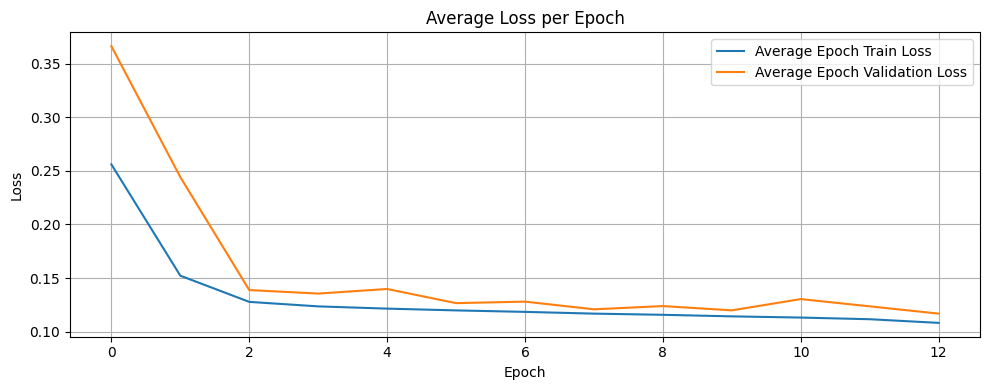

Epoch  14, Batch   1: loss =  0.1139, output_mean =  0.0293, target_mean =  0.0319
Epoch  14, Batch   2: loss =  0.1108, output_mean =  0.0256, target_mean =  0.0317
Epoch  14, Batch   3: loss =  0.1065, output_mean =  0.0235, target_mean =  0.0311
Epoch  14, Batch   4: loss =  0.0969, output_mean =  0.0262, target_mean =  0.0280
Epoch  14, Batch   5: loss =  0.0958, output_mean =  0.0306, target_mean =  0.0273
Epoch  14, Batch   6: loss =  0.1026, output_mean =  0.0316, target_mean =  0.0288
Epoch  14, Batch   7: loss =  0.1076, output_mean =  0.0301, target_mean =  0.0298
Epoch  14, Batch   8: loss =  0.1112, output_mean =  0.0288, target_mean =  0.0315
Epoch  14, Batch   9: loss =  0.1033, output_mean =  0.0292, target_mean =  0.0317
Epoch  14, Batch  10: loss =  0.1043, output_mean =  0.0313, target_mean =  0.0307
Epoch 14 Average Loss: 0.1053 Validation loss: 0.1128
Validation accuracy: 0.9686


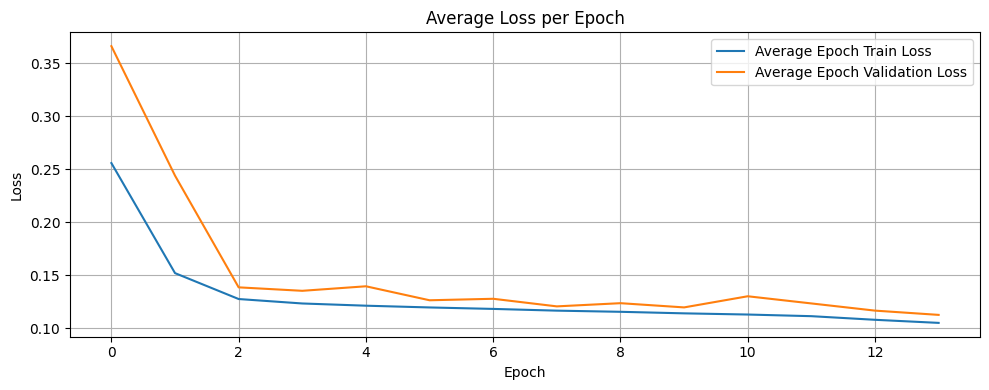

Epoch  15, Batch   1: loss =  0.1075, output_mean =  0.0290, target_mean =  0.0313
Epoch  15, Batch   2: loss =  0.1142, output_mean =  0.0311, target_mean =  0.0344
Epoch  15, Batch   3: loss =  0.1100, output_mean =  0.0316, target_mean =  0.0329
Epoch  15, Batch   4: loss =  0.1012, output_mean =  0.0320, target_mean =  0.0303
Epoch  15, Batch   5: loss =  0.0981, output_mean =  0.0326, target_mean =  0.0287
Epoch  15, Batch   6: loss =  0.1040, output_mean =  0.0250, target_mean =  0.0312
Epoch  15, Batch   7: loss =  0.0913, output_mean =  0.0241, target_mean =  0.0257
Epoch  15, Batch   8: loss =  0.1106, output_mean =  0.0262, target_mean =  0.0300
Epoch  15, Batch   9: loss =  0.1044, output_mean =  0.0257, target_mean =  0.0310
Epoch  15, Batch  10: loss =  0.0904, output_mean =  0.0302, target_mean =  0.0269
Epoch 15 Average Loss: 0.1032 Validation loss: 0.1158
Validation accuracy: 0.9676


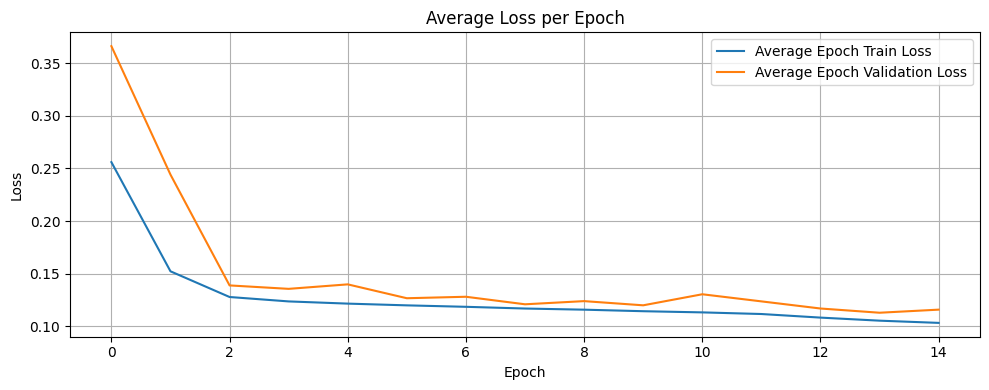

Epoch  16, Batch   1: loss =  0.0962, output_mean =  0.0299, target_mean =  0.0274
Epoch  16, Batch   2: loss =  0.1107, output_mean =  0.0312, target_mean =  0.0331
Epoch  16, Batch   3: loss =  0.1007, output_mean =  0.0291, target_mean =  0.0295
Epoch  16, Batch   4: loss =  0.1078, output_mean =  0.0298, target_mean =  0.0334
Epoch  16, Batch   5: loss =  0.1100, output_mean =  0.0293, target_mean =  0.0355
Epoch  16, Batch   6: loss =  0.1015, output_mean =  0.0299, target_mean =  0.0293
Epoch  16, Batch   7: loss =  0.0927, output_mean =  0.0256, target_mean =  0.0273
Epoch  16, Batch   8: loss =  0.0994, output_mean =  0.0249, target_mean =  0.0301
Epoch  16, Batch   9: loss =  0.0958, output_mean =  0.0273, target_mean =  0.0271
Epoch  16, Batch  10: loss =  0.0964, output_mean =  0.0252, target_mean =  0.0297
Epoch 16 Average Loss: 0.1011 Validation loss: 0.1081
Validation accuracy: 0.9687


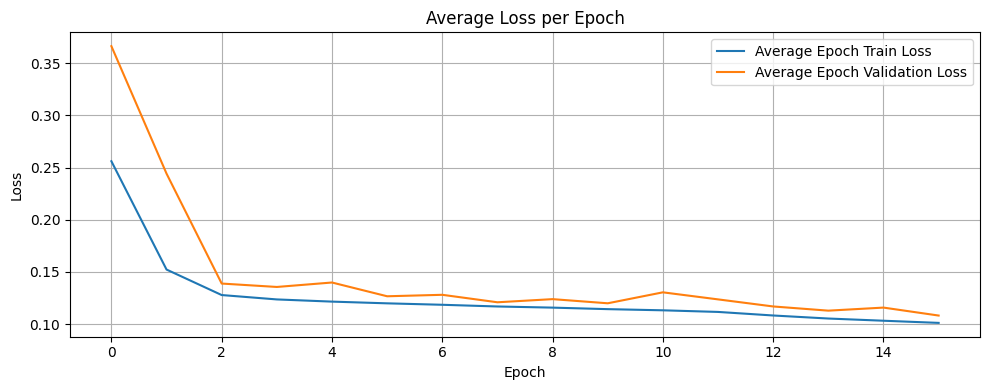

Epoch  17, Batch   1: loss =  0.1137, output_mean =  0.0325, target_mean =  0.0330
Epoch  17, Batch   2: loss =  0.1079, output_mean =  0.0304, target_mean =  0.0346
Epoch  17, Batch   3: loss =  0.0981, output_mean =  0.0354, target_mean =  0.0296
Epoch  17, Batch   4: loss =  0.0989, output_mean =  0.0327, target_mean =  0.0298
Epoch  17, Batch   5: loss =  0.0894, output_mean =  0.0258, target_mean =  0.0282
Epoch  17, Batch   6: loss =  0.0923, output_mean =  0.0252, target_mean =  0.0282
Epoch  17, Batch   7: loss =  0.1065, output_mean =  0.0283, target_mean =  0.0325
Epoch  17, Batch   8: loss =  0.0920, output_mean =  0.0246, target_mean =  0.0286
Epoch  17, Batch   9: loss =  0.0955, output_mean =  0.0294, target_mean =  0.0287
Epoch  17, Batch  10: loss =  0.0966, output_mean =  0.0271, target_mean =  0.0293
Epoch 17 Average Loss: 0.0991 Validation loss: 0.1221
Validation accuracy: 0.9659


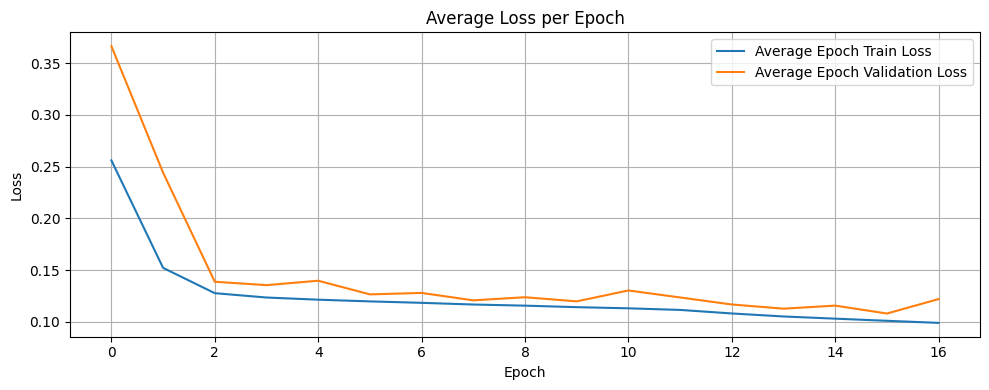

Epoch  18, Batch   1: loss =  0.1030, output_mean =  0.0274, target_mean =  0.0305
Epoch  18, Batch   2: loss =  0.0997, output_mean =  0.0301, target_mean =  0.0303
Epoch  18, Batch   3: loss =  0.0999, output_mean =  0.0303, target_mean =  0.0317
Epoch  18, Batch   4: loss =  0.0920, output_mean =  0.0298, target_mean =  0.0299
Epoch  18, Batch   5: loss =  0.1017, output_mean =  0.0357, target_mean =  0.0313
Epoch  18, Batch   6: loss =  0.0773, output_mean =  0.0273, target_mean =  0.0235
Epoch  18, Batch   7: loss =  0.1017, output_mean =  0.0215, target_mean =  0.0320
Epoch  18, Batch   8: loss =  0.0891, output_mean =  0.0210, target_mean =  0.0265
Epoch  18, Batch   9: loss =  0.0987, output_mean =  0.0286, target_mean =  0.0321
Epoch  18, Batch  10: loss =  0.1086, output_mean =  0.0299, target_mean =  0.0347
Epoch 18 Average Loss: 0.0972 Validation loss: 0.1186
Validation accuracy: 0.9666


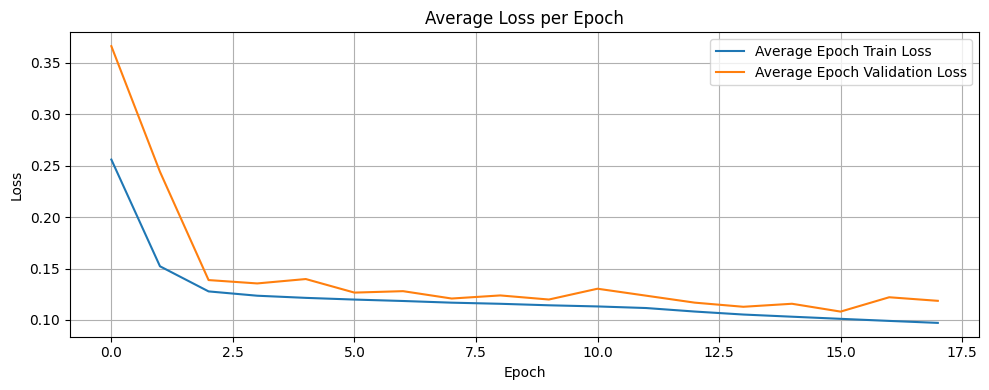

Epoch  19, Batch   1: loss =  0.1039, output_mean =  0.0385, target_mean =  0.0335
Epoch  19, Batch   2: loss =  0.0896, output_mean =  0.0334, target_mean =  0.0284
Epoch  19, Batch   3: loss =  0.0812, output_mean =  0.0276, target_mean =  0.0256
Epoch  19, Batch   4: loss =  0.0804, output_mean =  0.0204, target_mean =  0.0249
Epoch  19, Batch   5: loss =  0.1147, output_mean =  0.0235, target_mean =  0.0360
Epoch  19, Batch   6: loss =  0.0906, output_mean =  0.0252, target_mean =  0.0292
Epoch  19, Batch   7: loss =  0.1025, output_mean =  0.0269, target_mean =  0.0326
Epoch  19, Batch   8: loss =  0.0997, output_mean =  0.0291, target_mean =  0.0309
Epoch  19, Batch   9: loss =  0.0978, output_mean =  0.0369, target_mean =  0.0328
Epoch  19, Batch  10: loss =  0.0914, output_mean =  0.0332, target_mean =  0.0286
Epoch 19 Average Loss: 0.0952 Validation loss: 0.0964
Validation accuracy: 0.9691


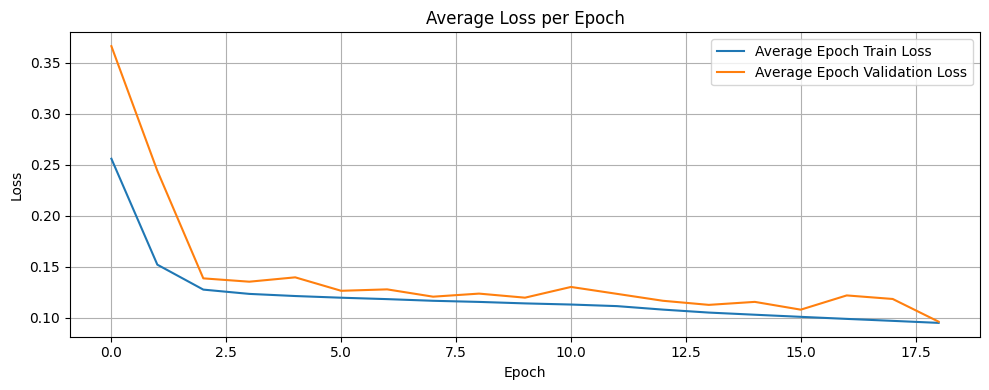

Epoch  20, Batch   1: loss =  0.0918, output_mean =  0.0340, target_mean =  0.0300
Epoch  20, Batch   2: loss =  0.0924, output_mean =  0.0313, target_mean =  0.0299
Epoch  20, Batch   3: loss =  0.1011, output_mean =  0.0280, target_mean =  0.0319
Epoch  20, Batch   4: loss =  0.0942, output_mean =  0.0280, target_mean =  0.0298
Epoch  20, Batch   5: loss =  0.0947, output_mean =  0.0254, target_mean =  0.0308
Epoch  20, Batch   6: loss =  0.0933, output_mean =  0.0294, target_mean =  0.0297
Epoch  20, Batch   7: loss =  0.0932, output_mean =  0.0317, target_mean =  0.0308
Epoch  20, Batch   8: loss =  0.0918, output_mean =  0.0312, target_mean =  0.0289
Epoch  20, Batch   9: loss =  0.0867, output_mean =  0.0260, target_mean =  0.0313
Epoch  20, Batch  10: loss =  0.0886, output_mean =  0.0256, target_mean =  0.0292
Epoch 20 Average Loss: 0.0928 Validation loss: 0.1151
Validation accuracy: 0.9684


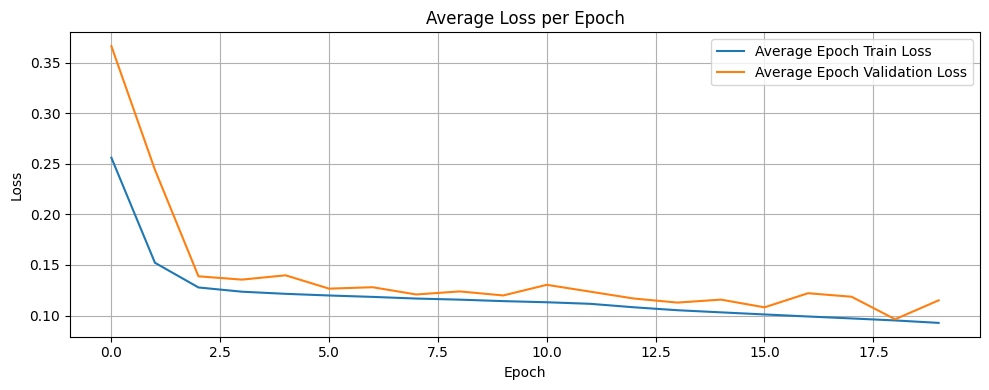

Epoch  21, Batch   1: loss =  0.1040, output_mean =  0.0262, target_mean =  0.0344
Epoch  21, Batch   2: loss =  0.0827, output_mean =  0.0238, target_mean =  0.0266
Epoch  21, Batch   3: loss =  0.0886, output_mean =  0.0298, target_mean =  0.0290
Epoch  21, Batch   4: loss =  0.0765, output_mean =  0.0310, target_mean =  0.0251
Epoch  21, Batch   5: loss =  0.0921, output_mean =  0.0286, target_mean =  0.0296
Epoch  21, Batch   6: loss =  0.0970, output_mean =  0.0323, target_mean =  0.0322
Epoch  21, Batch   7: loss =  0.0915, output_mean =  0.0274, target_mean =  0.0305
Epoch  21, Batch   8: loss =  0.1035, output_mean =  0.0262, target_mean =  0.0346
Epoch  21, Batch   9: loss =  0.0914, output_mean =  0.0312, target_mean =  0.0306
Epoch  21, Batch  10: loss =  0.0865, output_mean =  0.0319, target_mean =  0.0298
Epoch 21 Average Loss: 0.0914 Validation loss: 0.0994
Validation accuracy: 0.9696


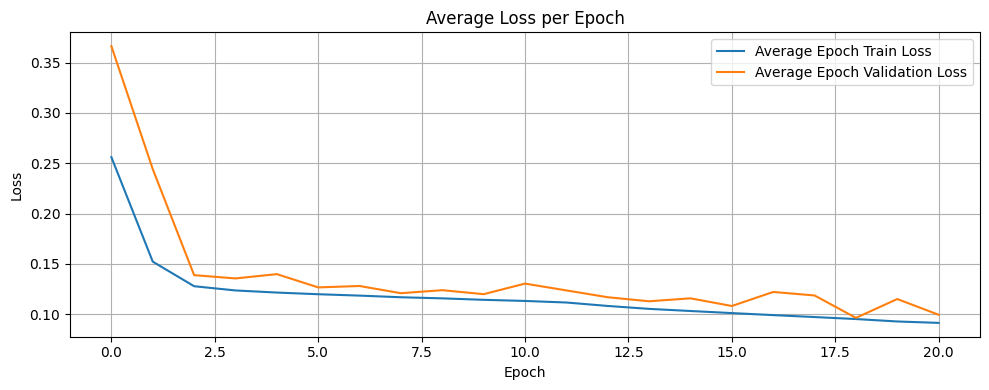

Epoch  22, Batch   1: loss =  0.0932, output_mean =  0.0315, target_mean =  0.0304
Epoch  22, Batch   2: loss =  0.0971, output_mean =  0.0357, target_mean =  0.0350
Epoch  22, Batch   3: loss =  0.1016, output_mean =  0.0334, target_mean =  0.0353
Epoch  22, Batch   4: loss =  0.0861, output_mean =  0.0262, target_mean =  0.0289
Epoch  22, Batch   5: loss =  0.1017, output_mean =  0.0280, target_mean =  0.0334
Epoch  22, Batch   6: loss =  0.0885, output_mean =  0.0270, target_mean =  0.0315
Epoch  22, Batch   7: loss =  0.0920, output_mean =  0.0323, target_mean =  0.0319
Epoch  22, Batch   8: loss =  0.0788, output_mean =  0.0296, target_mean =  0.0240
Epoch  22, Batch   9: loss =  0.0842, output_mean =  0.0247, target_mean =  0.0262
Epoch  22, Batch  10: loss =  0.0828, output_mean =  0.0283, target_mean =  0.0259
Epoch 22 Average Loss: 0.0906 Validation loss: 0.0983
Validation accuracy: 0.9695


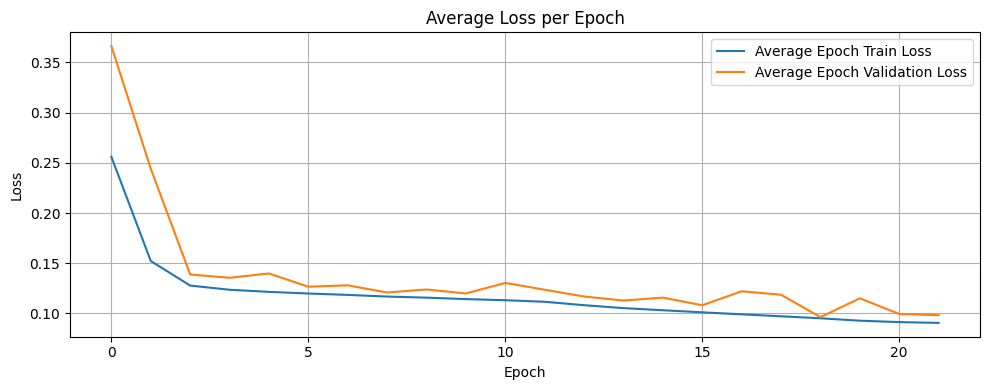

Epoch  23, Batch   1: loss =  0.1006, output_mean =  0.0358, target_mean =  0.0339
Epoch  23, Batch   2: loss =  0.1015, output_mean =  0.0205, target_mean =  0.0292
Epoch  23, Batch   3: loss =  0.0858, output_mean =  0.0213, target_mean =  0.0274
Epoch  23, Batch   4: loss =  0.1023, output_mean =  0.0282, target_mean =  0.0348
Epoch  23, Batch   5: loss =  0.0887, output_mean =  0.0334, target_mean =  0.0270
Epoch  23, Batch   6: loss =  0.0983, output_mean =  0.0291, target_mean =  0.0321
Epoch  23, Batch   7: loss =  0.0876, output_mean =  0.0276, target_mean =  0.0276
Epoch  23, Batch   8: loss =  0.0950, output_mean =  0.0265, target_mean =  0.0300
Epoch  23, Batch   9: loss =  0.0999, output_mean =  0.0345, target_mean =  0.0317
Epoch  23, Batch  10: loss =  0.0905, output_mean =  0.0305, target_mean =  0.0288
Epoch 23 Average Loss: 0.0950 Validation loss: 0.1163
Validation accuracy: 0.9680


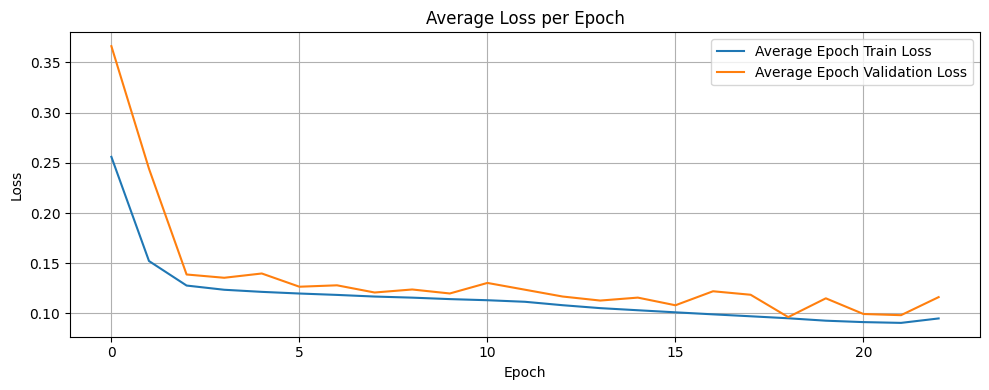

Epoch  24, Batch   1: loss =  0.0943, output_mean =  0.0317, target_mean =  0.0310
Epoch  24, Batch   2: loss =  0.0965, output_mean =  0.0359, target_mean =  0.0319
Epoch  24, Batch   3: loss =  0.0827, output_mean =  0.0322, target_mean =  0.0282
Epoch  24, Batch   4: loss =  0.0856, output_mean =  0.0278, target_mean =  0.0284
Epoch  24, Batch   5: loss =  0.0908, output_mean =  0.0264, target_mean =  0.0312
Epoch  24, Batch   6: loss =  0.0907, output_mean =  0.0360, target_mean =  0.0299
Epoch  24, Batch   7: loss =  0.0998, output_mean =  0.0272, target_mean =  0.0331
Epoch  24, Batch   8: loss =  0.0950, output_mean =  0.0316, target_mean =  0.0309
Epoch  24, Batch   9: loss =  0.0887, output_mean =  0.0300, target_mean =  0.0299
Epoch  24, Batch  10: loss =  0.0864, output_mean =  0.0305, target_mean =  0.0281
Epoch 24 Average Loss: 0.0911 Validation loss: 0.1056
Validation accuracy: 0.9697


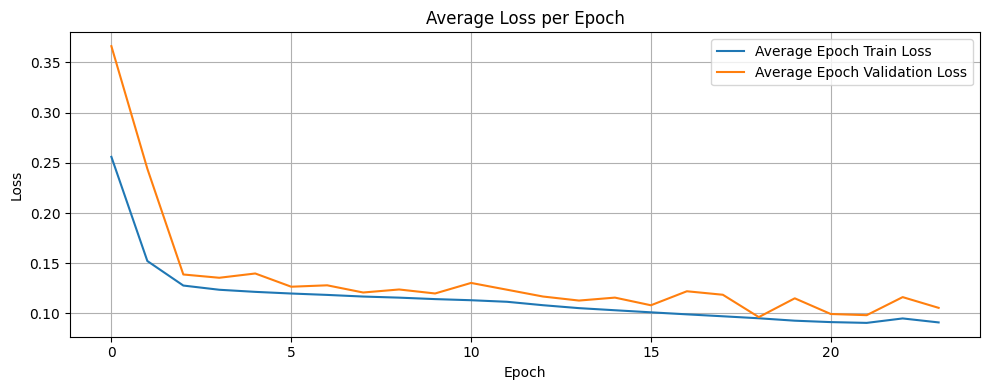

Epoch  25, Batch   1: loss =  0.0824, output_mean =  0.0302, target_mean =  0.0278
Epoch  25, Batch   2: loss =  0.0847, output_mean =  0.0280, target_mean =  0.0290
Epoch  25, Batch   3: loss =  0.0865, output_mean =  0.0280, target_mean =  0.0304
Epoch  25, Batch   4: loss =  0.0881, output_mean =  0.0230, target_mean =  0.0291
Epoch  25, Batch   5: loss =  0.0981, output_mean =  0.0259, target_mean =  0.0323
Epoch  25, Batch   6: loss =  0.0882, output_mean =  0.0307, target_mean =  0.0303
Epoch  25, Batch   7: loss =  0.0853, output_mean =  0.0341, target_mean =  0.0264
Epoch  25, Batch   8: loss =  0.0883, output_mean =  0.0285, target_mean =  0.0322
Epoch  25, Batch   9: loss =  0.0959, output_mean =  0.0286, target_mean =  0.0344
Epoch  25, Batch  10: loss =  0.0882, output_mean =  0.0320, target_mean =  0.0307
Epoch 25 Average Loss: 0.0886 Validation loss: 0.0953
Validation accuracy: 0.9702


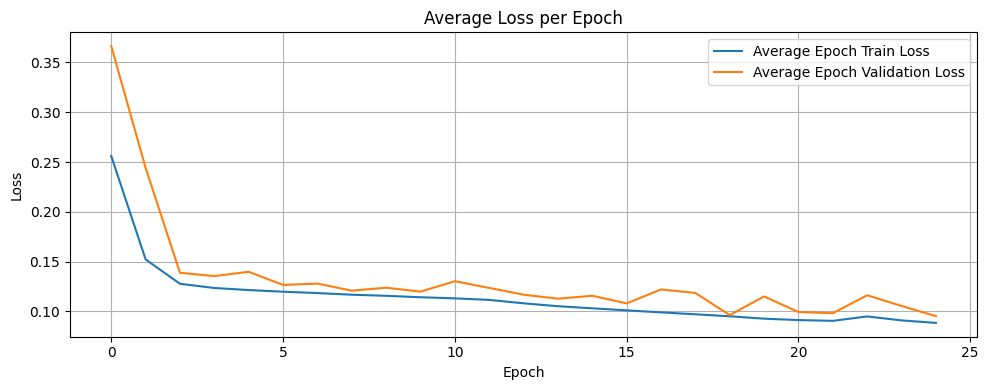

Epoch  26, Batch   1: loss =  0.0955, output_mean =  0.0294, target_mean =  0.0325
Epoch  26, Batch   2: loss =  0.0805, output_mean =  0.0253, target_mean =  0.0278
Epoch  26, Batch   3: loss =  0.0869, output_mean =  0.0259, target_mean =  0.0293
Epoch  26, Batch   4: loss =  0.0877, output_mean =  0.0283, target_mean =  0.0286
Epoch  26, Batch   5: loss =  0.0973, output_mean =  0.0336, target_mean =  0.0335
Epoch  26, Batch   6: loss =  0.0787, output_mean =  0.0302, target_mean =  0.0268
Epoch  26, Batch   7: loss =  0.0902, output_mean =  0.0320, target_mean =  0.0331
Epoch  26, Batch   8: loss =  0.0774, output_mean =  0.0286, target_mean =  0.0275
Epoch  26, Batch   9: loss =  0.0804, output_mean =  0.0262, target_mean =  0.0278
Epoch  26, Batch  10: loss =  0.0962, output_mean =  0.0262, target_mean =  0.0355
Epoch 26 Average Loss: 0.0871 Validation loss: 0.0946
Validation accuracy: 0.9693


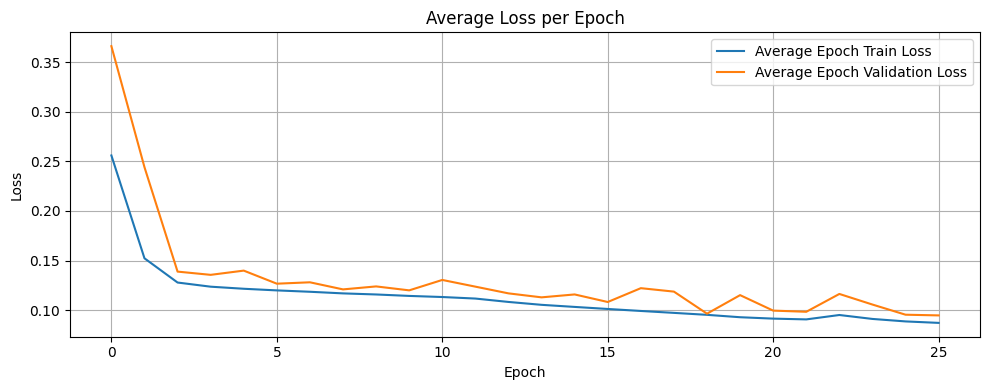

Epoch  27, Batch   1: loss =  0.0977, output_mean =  0.0307, target_mean =  0.0360
Epoch  27, Batch   2: loss =  0.0853, output_mean =  0.0332, target_mean =  0.0303
Epoch  27, Batch   3: loss =  0.0910, output_mean =  0.0380, target_mean =  0.0296
Epoch  27, Batch   4: loss =  0.0891, output_mean =  0.0329, target_mean =  0.0307
Epoch  27, Batch   5: loss =  0.0876, output_mean =  0.0256, target_mean =  0.0307
Epoch  27, Batch   6: loss =  0.0773, output_mean =  0.0218, target_mean =  0.0261
Epoch  27, Batch   7: loss =  0.0734, output_mean =  0.0250, target_mean =  0.0256
Epoch  27, Batch   8: loss =  0.0824, output_mean =  0.0276, target_mean =  0.0282
Epoch  27, Batch   9: loss =  0.0873, output_mean =  0.0287, target_mean =  0.0316
Epoch  27, Batch  10: loss =  0.0932, output_mean =  0.0371, target_mean =  0.0337
Epoch 27 Average Loss: 0.0864 Validation loss: 0.0889
Validation accuracy: 0.9707


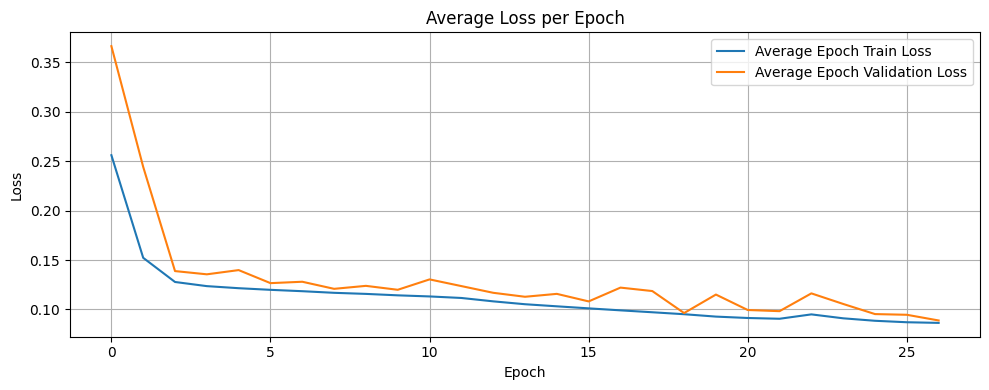

Epoch  28, Batch   1: loss =  0.0859, output_mean =  0.0318, target_mean =  0.0289
Epoch  28, Batch   2: loss =  0.0841, output_mean =  0.0274, target_mean =  0.0301
Epoch  28, Batch   3: loss =  0.0848, output_mean =  0.0251, target_mean =  0.0307
Epoch  28, Batch   4: loss =  0.0962, output_mean =  0.0302, target_mean =  0.0349
Epoch  28, Batch   5: loss =  0.0745, output_mean =  0.0310, target_mean =  0.0285
Epoch  28, Batch   6: loss =  0.0966, output_mean =  0.0350, target_mean =  0.0371
Epoch  28, Batch   7: loss =  0.0782, output_mean =  0.0312, target_mean =  0.0266
Epoch  28, Batch   8: loss =  0.0778, output_mean =  0.0322, target_mean =  0.0255
Epoch  28, Batch   9: loss =  0.0827, output_mean =  0.0233, target_mean =  0.0281
Epoch  28, Batch  10: loss =  0.0921, output_mean =  0.0227, target_mean =  0.0321
Epoch 28 Average Loss: 0.0853 Validation loss: 0.0926
Validation accuracy: 0.9705


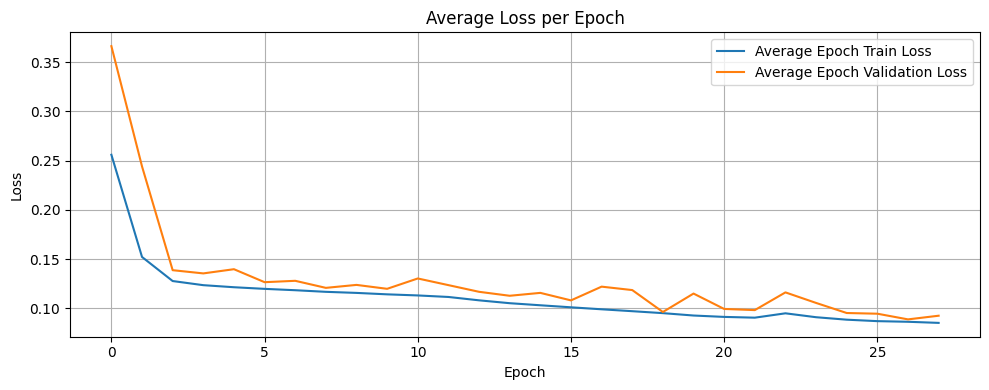

Epoch  29, Batch   1: loss =  0.0850, output_mean =  0.0251, target_mean =  0.0311
Epoch  29, Batch   2: loss =  0.0919, output_mean =  0.0322, target_mean =  0.0332
Epoch  29, Batch   3: loss =  0.0921, output_mean =  0.0368, target_mean =  0.0333
Epoch  29, Batch   4: loss =  0.0837, output_mean =  0.0295, target_mean =  0.0269
Epoch  29, Batch   5: loss =  0.0714, output_mean =  0.0293, target_mean =  0.0231
Epoch  29, Batch   6: loss =  0.0840, output_mean =  0.0288, target_mean =  0.0299
Epoch  29, Batch   7: loss =  0.0838, output_mean =  0.0266, target_mean =  0.0307
Epoch  29, Batch   8: loss =  0.0969, output_mean =  0.0306, target_mean =  0.0360
Epoch  29, Batch   9: loss =  0.0756, output_mean =  0.0340, target_mean =  0.0278
Epoch  29, Batch  10: loss =  0.0815, output_mean =  0.0313, target_mean =  0.0305
Epoch 29 Average Loss: 0.0846 Validation loss: 0.0866
Validation accuracy: 0.9713


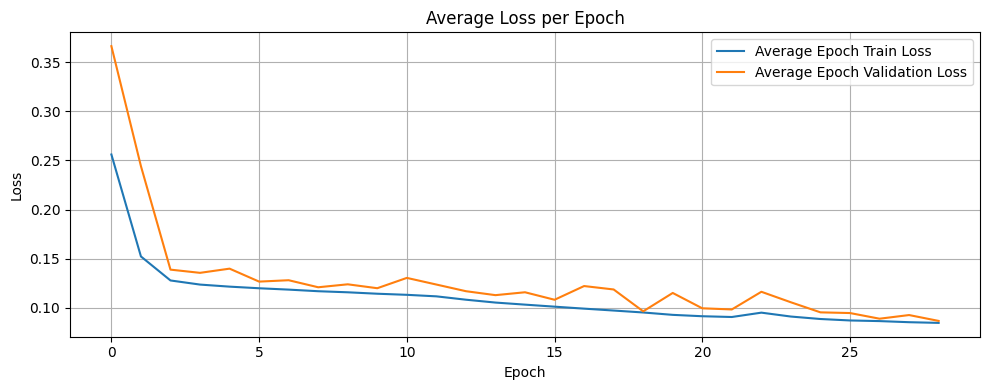

Epoch  30, Batch   1: loss =  0.0658, output_mean =  0.0252, target_mean =  0.0228
Epoch  30, Batch   2: loss =  0.0844, output_mean =  0.0255, target_mean =  0.0290
Epoch  30, Batch   3: loss =  0.0863, output_mean =  0.0236, target_mean =  0.0325
Epoch  30, Batch   4: loss =  0.0900, output_mean =  0.0197, target_mean =  0.0315
Epoch  30, Batch   5: loss =  0.0898, output_mean =  0.0320, target_mean =  0.0324
Epoch  30, Batch   6: loss =  0.0967, output_mean =  0.0438, target_mean =  0.0319
Epoch  30, Batch   7: loss =  0.0964, output_mean =  0.0371, target_mean =  0.0285
Epoch  30, Batch   8: loss =  0.1030, output_mean =  0.0234, target_mean =  0.0340
Epoch  30, Batch   9: loss =  0.0997, output_mean =  0.0200, target_mean =  0.0312
Epoch  30, Batch  10: loss =  0.0994, output_mean =  0.0281, target_mean =  0.0287
Epoch 30 Average Loss: 0.0912 Validation loss: 0.1284
Validation accuracy: 0.9688


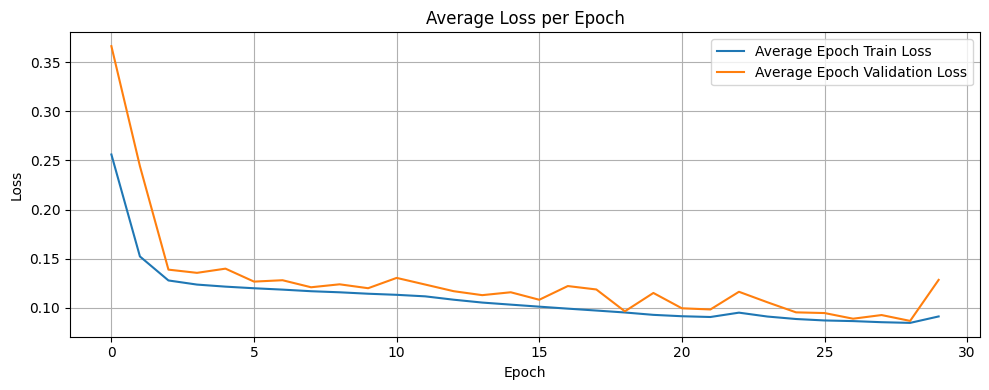

Epoch  31, Batch   1: loss =  0.1027, output_mean =  0.0310, target_mean =  0.0307
Epoch  31, Batch   2: loss =  0.1003, output_mean =  0.0260, target_mean =  0.0333
Epoch  31, Batch   3: loss =  0.0931, output_mean =  0.0287, target_mean =  0.0282
Epoch  31, Batch   4: loss =  0.0855, output_mean =  0.0305, target_mean =  0.0268
Epoch  31, Batch   5: loss =  0.0898, output_mean =  0.0373, target_mean =  0.0292
Epoch  31, Batch   6: loss =  0.0830, output_mean =  0.0332, target_mean =  0.0267
Epoch  31, Batch   7: loss =  0.1027, output_mean =  0.0290, target_mean =  0.0344
Epoch  31, Batch   8: loss =  0.0787, output_mean =  0.0332, target_mean =  0.0268
Epoch  31, Batch   9: loss =  0.0905, output_mean =  0.0330, target_mean =  0.0336
Epoch  31, Batch  10: loss =  0.0947, output_mean =  0.0352, target_mean =  0.0329
Epoch 31 Average Loss: 0.0921 Validation loss: 0.0950
Validation accuracy: 0.9702


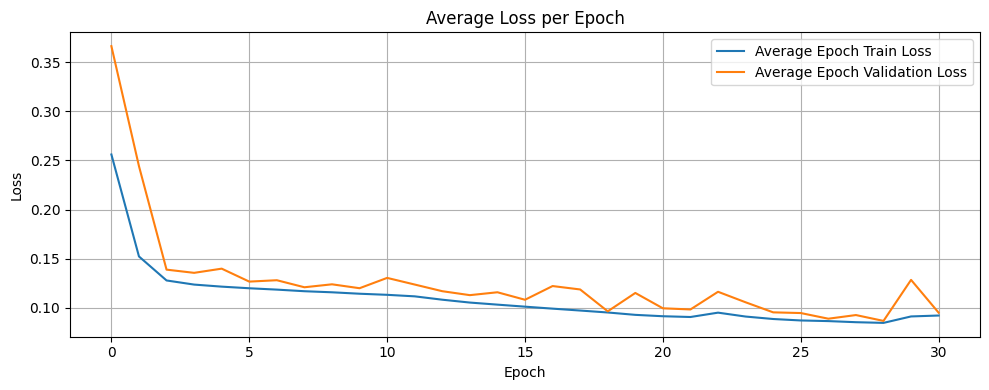

Epoch  32, Batch   1: loss =  0.0844, output_mean =  0.0280, target_mean =  0.0278
Epoch  32, Batch   2: loss =  0.0852, output_mean =  0.0281, target_mean =  0.0287
Epoch  32, Batch   3: loss =  0.0895, output_mean =  0.0279, target_mean =  0.0319
Epoch  32, Batch   4: loss =  0.0852, output_mean =  0.0264, target_mean =  0.0289
Epoch  32, Batch   5: loss =  0.0978, output_mean =  0.0285, target_mean =  0.0350
Epoch  32, Batch   6: loss =  0.0789, output_mean =  0.0300, target_mean =  0.0268
Epoch  32, Batch   7: loss =  0.0782, output_mean =  0.0300, target_mean =  0.0279
Epoch  32, Batch   8: loss =  0.0834, output_mean =  0.0263, target_mean =  0.0282
Epoch  32, Batch   9: loss =  0.0982, output_mean =  0.0291, target_mean =  0.0348
Epoch  32, Batch  10: loss =  0.0888, output_mean =  0.0312, target_mean =  0.0326
Epoch 32 Average Loss: 0.0869 Validation loss: 0.1012
Validation accuracy: 0.9686


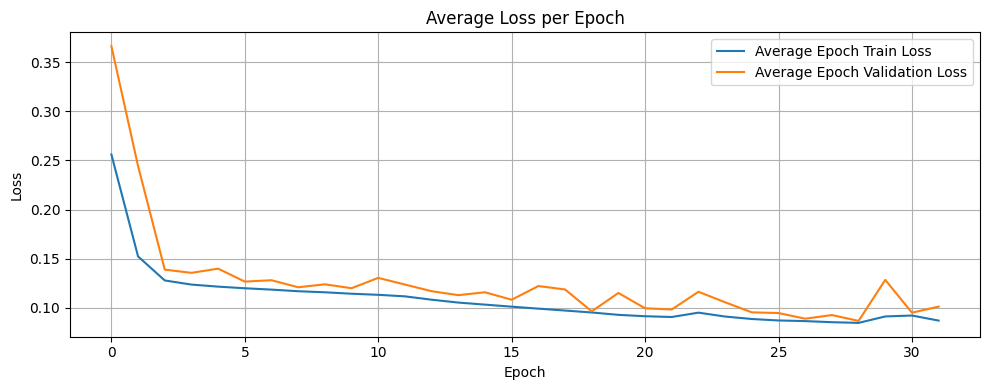

Epoch  33, Batch   1: loss =  0.0959, output_mean =  0.0394, target_mean =  0.0272
Epoch  33, Batch   2: loss =  0.0795, output_mean =  0.0257, target_mean =  0.0280
Epoch  33, Batch   3: loss =  0.0978, output_mean =  0.0239, target_mean =  0.0349
Epoch  33, Batch   4: loss =  0.0872, output_mean =  0.0252, target_mean =  0.0297
Epoch  33, Batch   5: loss =  0.0936, output_mean =  0.0324, target_mean =  0.0341
Epoch  33, Batch   6: loss =  0.0850, output_mean =  0.0383, target_mean =  0.0295
Epoch  33, Batch   7: loss =  0.0857, output_mean =  0.0373, target_mean =  0.0306
Epoch  33, Batch   8: loss =  0.0774, output_mean =  0.0314, target_mean =  0.0256
Epoch  33, Batch   9: loss =  0.0991, output_mean =  0.0279, target_mean =  0.0355
Epoch  33, Batch  10: loss =  0.0812, output_mean =  0.0242, target_mean =  0.0275
Epoch 33 Average Loss: 0.0882 Validation loss: 0.1023
Validation accuracy: 0.9694


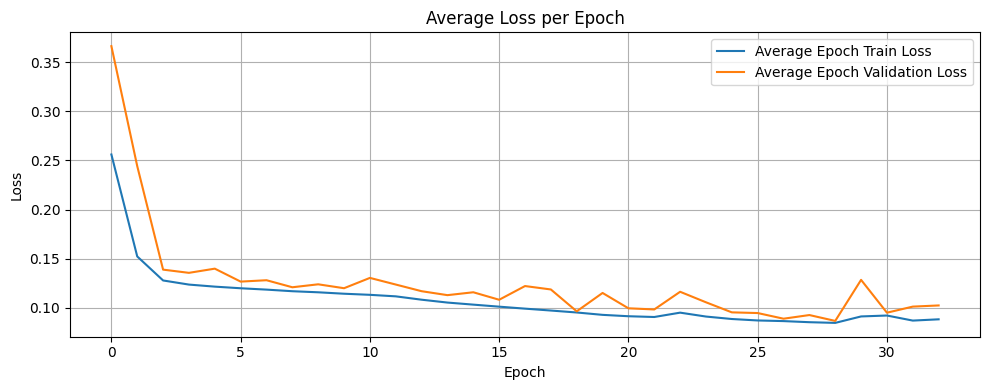

Epoch  34, Batch   1: loss =  0.0882, output_mean =  0.0246, target_mean =  0.0305
Epoch  34, Batch   2: loss =  0.0931, output_mean =  0.0282, target_mean =  0.0334
Epoch  34, Batch   3: loss =  0.0809, output_mean =  0.0300, target_mean =  0.0296
Epoch  34, Batch   4: loss =  0.0824, output_mean =  0.0303, target_mean =  0.0285
Epoch  34, Batch   5: loss =  0.0870, output_mean =  0.0326, target_mean =  0.0319
Epoch  34, Batch   6: loss =  0.0875, output_mean =  0.0344, target_mean =  0.0323
Epoch  34, Batch   7: loss =  0.0808, output_mean =  0.0323, target_mean =  0.0274
Epoch  34, Batch   8: loss =  0.0854, output_mean =  0.0280, target_mean =  0.0297
Epoch  34, Batch   9: loss =  0.0815, output_mean =  0.0294, target_mean =  0.0298
Epoch  34, Batch  10: loss =  0.0833, output_mean =  0.0274, target_mean =  0.0292
Epoch 34 Average Loss: 0.0850 Validation loss: 0.1061
Validation accuracy: 0.9698


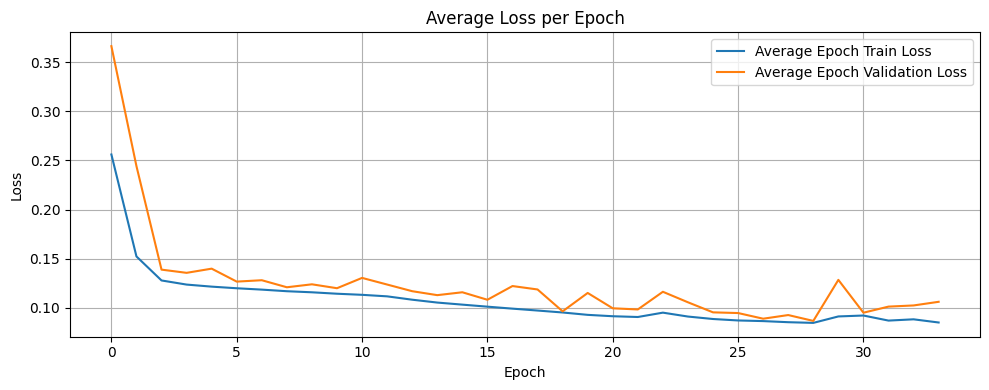

Epoch  35, Batch   1: loss =  0.0918, output_mean =  0.0274, target_mean =  0.0335
Epoch  35, Batch   2: loss =  0.0734, output_mean =  0.0301, target_mean =  0.0258
Epoch  35, Batch   3: loss =  0.0803, output_mean =  0.0291, target_mean =  0.0262
Epoch  35, Batch   4: loss =  0.0818, output_mean =  0.0277, target_mean =  0.0304
Epoch  35, Batch   5: loss =  0.0887, output_mean =  0.0303, target_mean =  0.0352
Epoch  35, Batch   6: loss =  0.0857, output_mean =  0.0269, target_mean =  0.0314
Epoch  35, Batch   7: loss =  0.0745, output_mean =  0.0273, target_mean =  0.0265
Epoch  35, Batch   8: loss =  0.0710, output_mean =  0.0291, target_mean =  0.0254
Epoch  35, Batch   9: loss =  0.0887, output_mean =  0.0359, target_mean =  0.0334
Epoch  35, Batch  10: loss =  0.0949, output_mean =  0.0342, target_mean =  0.0347
Epoch 35 Average Loss: 0.0831 Validation loss: 0.1136
Validation accuracy: 0.9656


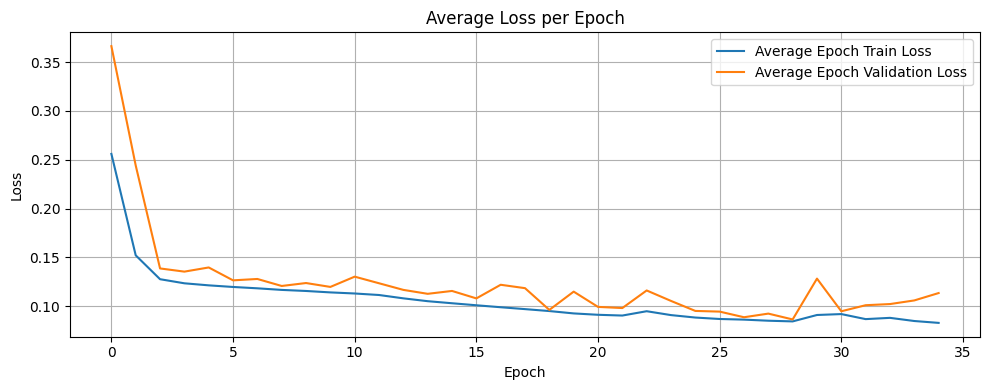

Epoch  36, Batch   1: loss =  0.0783, output_mean =  0.0276, target_mean =  0.0286
Epoch  36, Batch   2: loss =  0.0889, output_mean =  0.0259, target_mean =  0.0317
Epoch  36, Batch   3: loss =  0.0885, output_mean =  0.0283, target_mean =  0.0334
Epoch  36, Batch   4: loss =  0.0821, output_mean =  0.0314, target_mean =  0.0316
Epoch  36, Batch   5: loss =  0.0818, output_mean =  0.0329, target_mean =  0.0283
Epoch  36, Batch   6: loss =  0.0744, output_mean =  0.0366, target_mean =  0.0267
Epoch  36, Batch   7: loss =  0.0877, output_mean =  0.0319, target_mean =  0.0325
Epoch  36, Batch   8: loss =  0.0838, output_mean =  0.0265, target_mean =  0.0296
Epoch  36, Batch   9: loss =  0.0840, output_mean =  0.0283, target_mean =  0.0303
Epoch  36, Batch  10: loss =  0.0804, output_mean =  0.0238, target_mean =  0.0297
Epoch 36 Average Loss: 0.0830 Validation loss: 0.1155
Validation accuracy: 0.9698


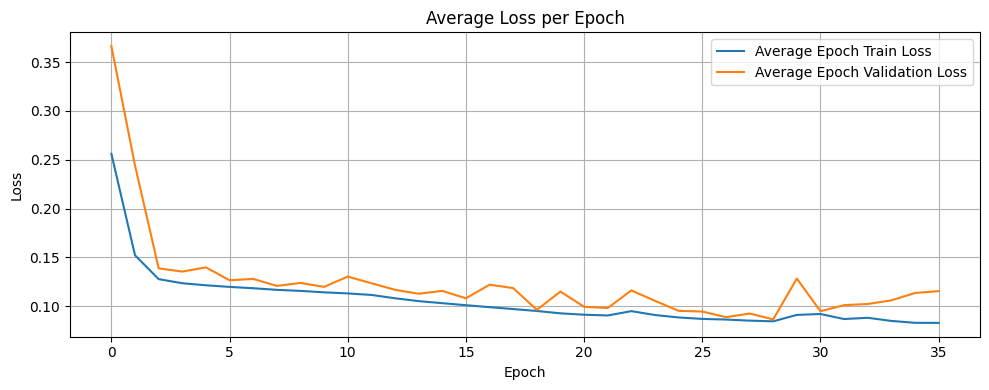

Epoch  37, Batch   1: loss =  0.0784, output_mean =  0.0270, target_mean =  0.0285
Epoch  37, Batch   2: loss =  0.0882, output_mean =  0.0364, target_mean =  0.0306
Epoch  37, Batch   3: loss =  0.0759, output_mean =  0.0291, target_mean =  0.0276
Epoch  37, Batch   4: loss =  0.0834, output_mean =  0.0261, target_mean =  0.0319
Epoch  37, Batch   5: loss =  0.0997, output_mean =  0.0247, target_mean =  0.0344
Epoch  37, Batch   6: loss =  0.0849, output_mean =  0.0287, target_mean =  0.0322
Epoch  37, Batch   7: loss =  0.0807, output_mean =  0.0346, target_mean =  0.0279
Epoch  37, Batch   8: loss =  0.0848, output_mean =  0.0380, target_mean =  0.0320
Epoch  37, Batch   9: loss =  0.0834, output_mean =  0.0340, target_mean =  0.0295
Epoch  37, Batch  10: loss =  0.0801, output_mean =  0.0272, target_mean =  0.0279
Epoch 37 Average Loss: 0.0840 Validation loss: 0.1054
Validation accuracy: 0.9704


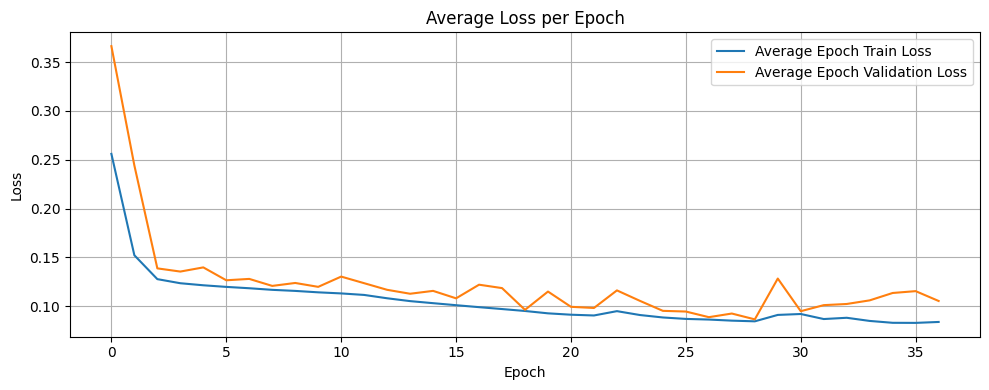

Epoch  38, Batch   1: loss =  0.0850, output_mean =  0.0299, target_mean =  0.0310
Epoch  38, Batch   2: loss =  0.0848, output_mean =  0.0297, target_mean =  0.0329
Epoch  38, Batch   3: loss =  0.0754, output_mean =  0.0308, target_mean =  0.0271
Epoch  38, Batch   4: loss =  0.0788, output_mean =  0.0253, target_mean =  0.0282
Epoch  38, Batch   5: loss =  0.0826, output_mean =  0.0274, target_mean =  0.0326
Epoch  38, Batch   6: loss =  0.0959, output_mean =  0.0279, target_mean =  0.0353
Epoch  38, Batch   7: loss =  0.0877, output_mean =  0.0339, target_mean =  0.0311
Epoch  38, Batch   8: loss =  0.0821, output_mean =  0.0388, target_mean =  0.0301
Epoch  38, Batch   9: loss =  0.0736, output_mean =  0.0292, target_mean =  0.0271
Epoch  38, Batch  10: loss =  0.0754, output_mean =  0.0256, target_mean =  0.0271
Epoch 38 Average Loss: 0.0821 Validation loss: 0.0880
Validation accuracy: 0.9713


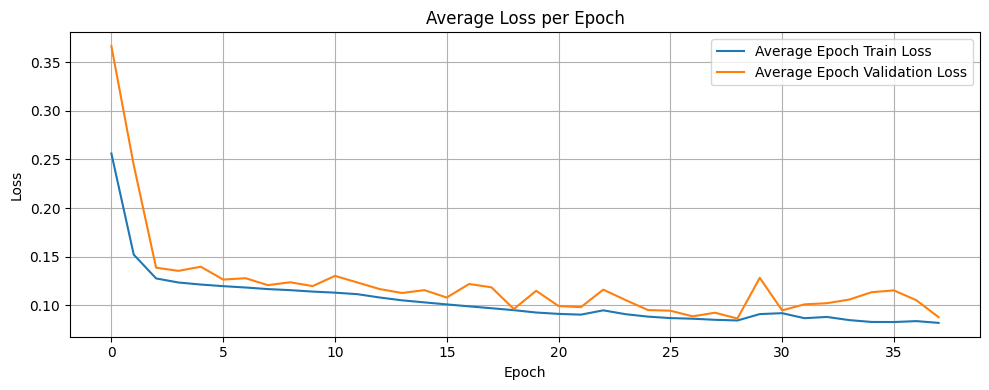

Epoch  39, Batch   1: loss =  0.0802, output_mean =  0.0277, target_mean =  0.0313
Epoch  39, Batch   2: loss =  0.0768, output_mean =  0.0288, target_mean =  0.0294
Epoch  39, Batch   3: loss =  0.0872, output_mean =  0.0281, target_mean =  0.0336
Epoch  39, Batch   4: loss =  0.0800, output_mean =  0.0303, target_mean =  0.0290
Epoch  39, Batch   5: loss =  0.0744, output_mean =  0.0310, target_mean =  0.0258
Epoch  39, Batch   6: loss =  0.0713, output_mean =  0.0284, target_mean =  0.0268
Epoch  39, Batch   7: loss =  0.0924, output_mean =  0.0248, target_mean =  0.0346
Epoch  39, Batch   8: loss =  0.0824, output_mean =  0.0269, target_mean =  0.0306
Epoch  39, Batch   9: loss =  0.0815, output_mean =  0.0312, target_mean =  0.0298
Epoch  39, Batch  10: loss =  0.0823, output_mean =  0.0315, target_mean =  0.0315
Epoch 39 Average Loss: 0.0809 Validation loss: 0.0835
Validation accuracy: 0.9725


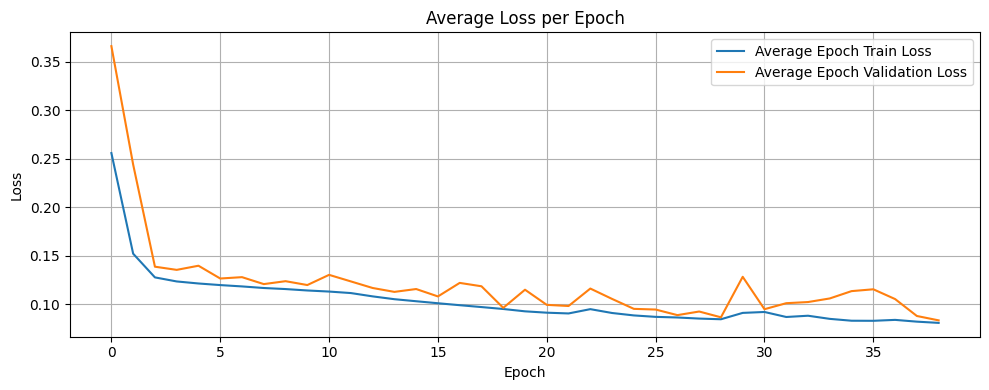

Epoch  40, Batch   1: loss =  0.0879, output_mean =  0.0307, target_mean =  0.0331
Epoch  40, Batch   2: loss =  0.0777, output_mean =  0.0350, target_mean =  0.0289
Epoch  40, Batch   3: loss =  0.0756, output_mean =  0.0317, target_mean =  0.0287
Epoch  40, Batch   4: loss =  0.0674, output_mean =  0.0268, target_mean =  0.0237
Epoch  40, Batch   5: loss =  0.1030, output_mean =  0.0261, target_mean =  0.0390
Epoch  40, Batch   6: loss =  0.0733, output_mean =  0.0272, target_mean =  0.0293
Epoch  40, Batch   7: loss =  0.0772, output_mean =  0.0286, target_mean =  0.0308
Epoch  40, Batch   8: loss =  0.0751, output_mean =  0.0333, target_mean =  0.0287
Epoch  40, Batch   9: loss =  0.0793, output_mean =  0.0296, target_mean =  0.0297
Epoch  40, Batch  10: loss =  0.0814, output_mean =  0.0308, target_mean =  0.0306
Epoch 40 Average Loss: 0.0798 Validation loss: 0.0881
Validation accuracy: 0.9710


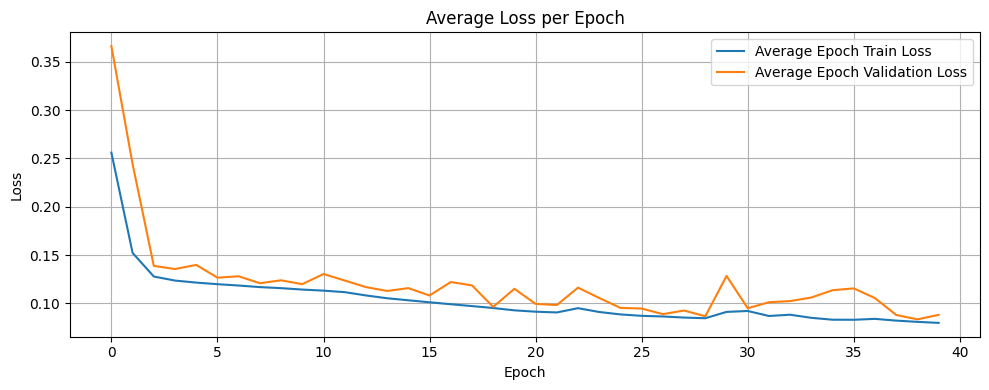

Epoch  41, Batch   1: loss =  0.0743, output_mean =  0.0305, target_mean =  0.0293
Epoch  41, Batch   2: loss =  0.0888, output_mean =  0.0291, target_mean =  0.0341
Epoch  41, Batch   3: loss =  0.0792, output_mean =  0.0292, target_mean =  0.0324
Epoch  41, Batch   4: loss =  0.0745, output_mean =  0.0307, target_mean =  0.0273
Epoch  41, Batch   5: loss =  0.0780, output_mean =  0.0283, target_mean =  0.0285
Epoch  41, Batch   6: loss =  0.0867, output_mean =  0.0299, target_mean =  0.0340
Epoch  41, Batch   7: loss =  0.0729, output_mean =  0.0303, target_mean =  0.0285
Epoch  41, Batch   8: loss =  0.0731, output_mean =  0.0301, target_mean =  0.0279
Epoch  41, Batch   9: loss =  0.0782, output_mean =  0.0291, target_mean =  0.0285
Epoch  41, Batch  10: loss =  0.0759, output_mean =  0.0305, target_mean =  0.0321
Epoch 41 Average Loss: 0.0781 Validation loss: 0.0930
Validation accuracy: 0.9719


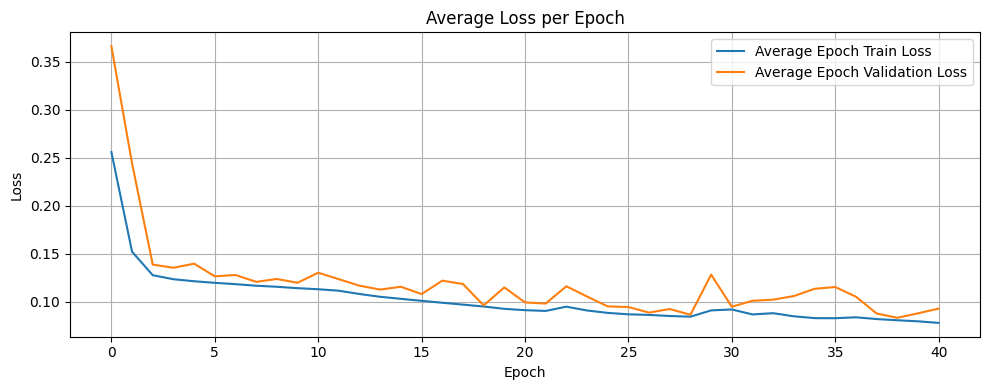

Epoch  42, Batch   1: loss =  0.0934, output_mean =  0.0310, target_mean =  0.0378
Epoch  42, Batch   2: loss =  0.0933, output_mean =  0.0351, target_mean =  0.0354
Epoch  42, Batch   3: loss =  0.0744, output_mean =  0.0271, target_mean =  0.0270
Epoch  42, Batch   4: loss =  0.0744, output_mean =  0.0306, target_mean =  0.0295
Epoch  42, Batch   5: loss =  0.0761, output_mean =  0.0293, target_mean =  0.0296
Epoch  42, Batch   6: loss =  0.0661, output_mean =  0.0272, target_mean =  0.0234
Epoch  42, Batch   7: loss =  0.0800, output_mean =  0.0282, target_mean =  0.0330
Epoch  42, Batch   8: loss =  0.0873, output_mean =  0.0252, target_mean =  0.0311
Epoch  42, Batch   9: loss =  0.0688, output_mean =  0.0294, target_mean =  0.0258
Epoch  42, Batch  10: loss =  0.0781, output_mean =  0.0309, target_mean =  0.0298
Epoch 42 Average Loss: 0.0792 Validation loss: 0.0970
Validation accuracy: 0.9712


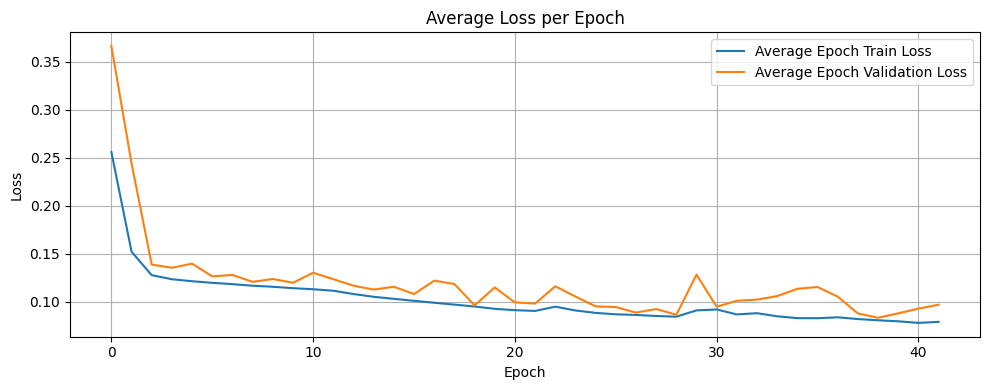

Epoch  43, Batch   1: loss =  0.0755, output_mean =  0.0291, target_mean =  0.0285
Epoch  43, Batch   2: loss =  0.0875, output_mean =  0.0333, target_mean =  0.0353
Epoch  43, Batch   3: loss =  0.0804, output_mean =  0.0240, target_mean =  0.0292
Epoch  43, Batch   4: loss =  0.0893, output_mean =  0.0334, target_mean =  0.0310
Epoch  43, Batch   5: loss =  0.0803, output_mean =  0.0315, target_mean =  0.0306
Epoch  43, Batch   6: loss =  0.0838, output_mean =  0.0292, target_mean =  0.0323
Epoch  43, Batch   7: loss =  0.0751, output_mean =  0.0295, target_mean =  0.0269
Epoch  43, Batch   8: loss =  0.0789, output_mean =  0.0335, target_mean =  0.0308
Epoch  43, Batch   9: loss =  0.0829, output_mean =  0.0288, target_mean =  0.0314
Epoch  43, Batch  10: loss =  0.0703, output_mean =  0.0263, target_mean =  0.0264
Epoch 43 Average Loss: 0.0804 Validation loss: 0.0925
Validation accuracy: 0.9726


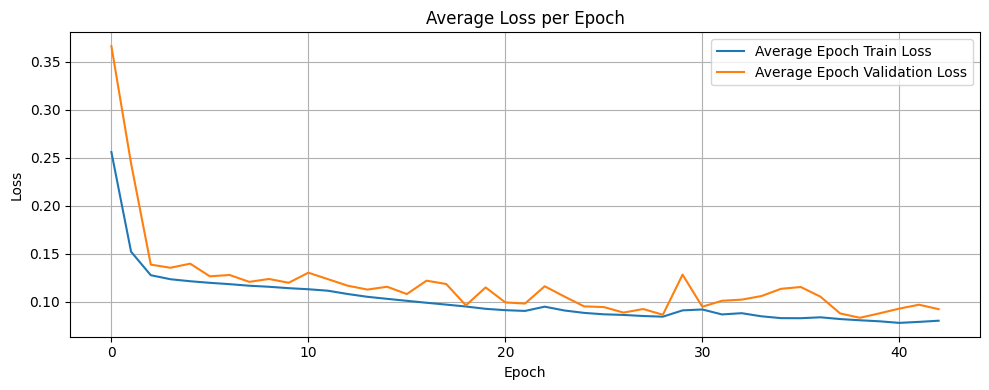

Epoch  44, Batch   1: loss =  0.0765, output_mean =  0.0274, target_mean =  0.0306
Epoch  44, Batch   2: loss =  0.0840, output_mean =  0.0280, target_mean =  0.0323
Epoch  44, Batch   3: loss =  0.0731, output_mean =  0.0316, target_mean =  0.0278
Epoch  44, Batch   4: loss =  0.0838, output_mean =  0.0312, target_mean =  0.0313
Epoch  44, Batch   5: loss =  0.0859, output_mean =  0.0279, target_mean =  0.0340
Epoch  44, Batch   6: loss =  0.0784, output_mean =  0.0298, target_mean =  0.0302
Epoch  44, Batch   7: loss =  0.0708, output_mean =  0.0290, target_mean =  0.0268
Epoch  44, Batch   8: loss =  0.0727, output_mean =  0.0265, target_mean =  0.0266
Epoch  44, Batch   9: loss =  0.0821, output_mean =  0.0300, target_mean =  0.0318
Epoch  44, Batch  10: loss =  0.0827, output_mean =  0.0356, target_mean =  0.0311
Epoch 44 Average Loss: 0.0790 Validation loss: 0.0925
Validation accuracy: 0.9670


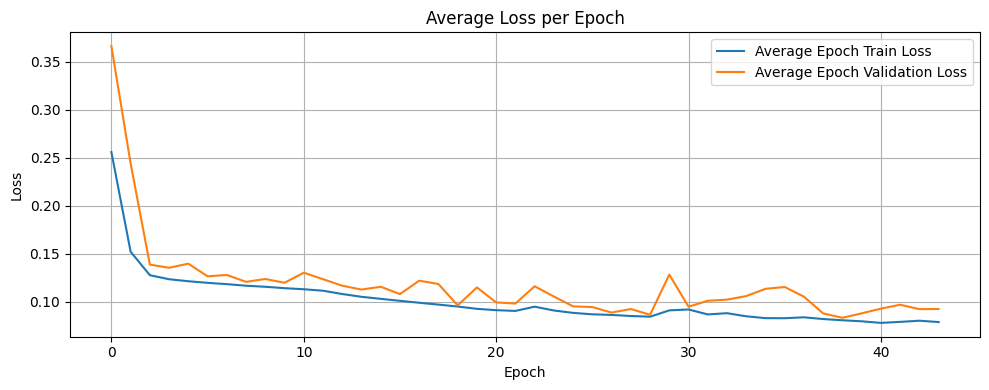

Epoch  45, Batch   1: loss =  0.0795, output_mean =  0.0309, target_mean =  0.0319
Epoch  45, Batch   2: loss =  0.0837, output_mean =  0.0270, target_mean =  0.0297
Epoch  45, Batch   3: loss =  0.0746, output_mean =  0.0272, target_mean =  0.0266
Epoch  45, Batch   4: loss =  0.0787, output_mean =  0.0379, target_mean =  0.0331
Epoch  45, Batch   5: loss =  0.0795, output_mean =  0.0344, target_mean =  0.0313
Epoch  45, Batch   6: loss =  0.0799, output_mean =  0.0234, target_mean =  0.0305
Epoch  45, Batch   7: loss =  0.0769, output_mean =  0.0242, target_mean =  0.0310
Epoch  45, Batch   8: loss =  0.0785, output_mean =  0.0328, target_mean =  0.0286
Epoch  45, Batch   9: loss =  0.0807, output_mean =  0.0294, target_mean =  0.0299
Epoch  45, Batch  10: loss =  0.0774, output_mean =  0.0272, target_mean =  0.0300
Epoch 45 Average Loss: 0.0789 Validation loss: 0.0901
Validation accuracy: 0.9709


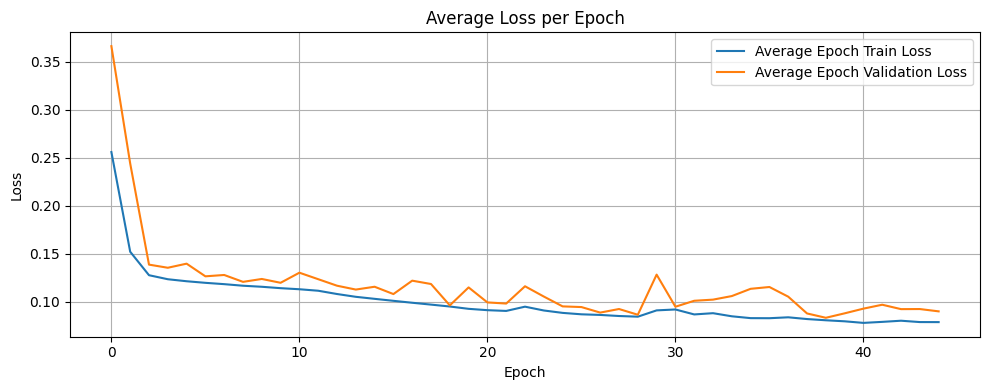

Epoch  46, Batch   1: loss =  0.0806, output_mean =  0.0319, target_mean =  0.0314
Epoch  46, Batch   2: loss =  0.0827, output_mean =  0.0321, target_mean =  0.0327
Epoch  46, Batch   3: loss =  0.0706, output_mean =  0.0305, target_mean =  0.0290
Epoch  46, Batch   4: loss =  0.0823, output_mean =  0.0319, target_mean =  0.0339
Epoch  46, Batch   5: loss =  0.0808, output_mean =  0.0304, target_mean =  0.0303
Epoch  46, Batch   6: loss =  0.0812, output_mean =  0.0317, target_mean =  0.0309
Epoch  46, Batch   7: loss =  0.0706, output_mean =  0.0274, target_mean =  0.0292
Epoch  46, Batch   8: loss =  0.0716, output_mean =  0.0269, target_mean =  0.0264
Epoch  46, Batch   9: loss =  0.0720, output_mean =  0.0238, target_mean =  0.0260
Epoch  46, Batch  10: loss =  0.0804, output_mean =  0.0308, target_mean =  0.0327
Epoch 46 Average Loss: 0.0773 Validation loss: 0.0906
Validation accuracy: 0.9714


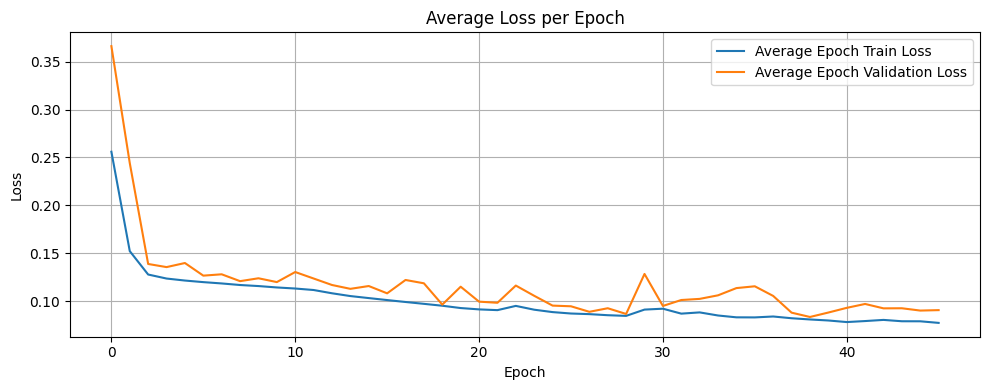

Epoch  47, Batch   1: loss =  0.0682, output_mean =  0.0289, target_mean =  0.0268
Epoch  47, Batch   2: loss =  0.0713, output_mean =  0.0302, target_mean =  0.0278
Epoch  47, Batch   3: loss =  0.0798, output_mean =  0.0331, target_mean =  0.0334
Epoch  47, Batch   4: loss =  0.0840, output_mean =  0.0272, target_mean =  0.0327
Epoch  47, Batch   5: loss =  0.0890, output_mean =  0.0382, target_mean =  0.0330
Epoch  47, Batch   6: loss =  0.0789, output_mean =  0.0285, target_mean =  0.0292
Epoch  47, Batch   7: loss =  0.0740, output_mean =  0.0244, target_mean =  0.0272
Epoch  47, Batch   8: loss =  0.0826, output_mean =  0.0302, target_mean =  0.0335
Epoch  47, Batch   9: loss =  0.0776, output_mean =  0.0287, target_mean =  0.0301
Epoch  47, Batch  10: loss =  0.0755, output_mean =  0.0298, target_mean =  0.0288
Epoch 47 Average Loss: 0.0781 Validation loss: 0.0862
Validation accuracy: 0.9716


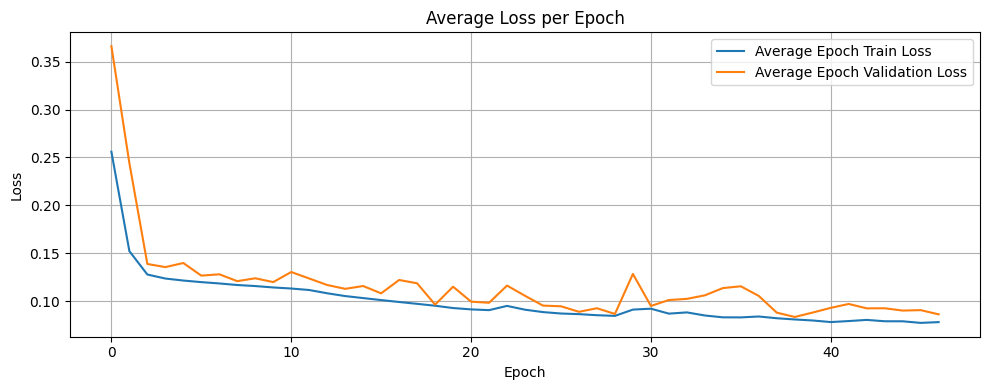

Epoch  48, Batch   1: loss =  0.0834, output_mean =  0.0350, target_mean =  0.0315
Epoch  48, Batch   2: loss =  0.0856, output_mean =  0.0237, target_mean =  0.0311
Epoch  48, Batch   3: loss =  0.0870, output_mean =  0.0262, target_mean =  0.0329
Epoch  48, Batch   4: loss =  0.0781, output_mean =  0.0308, target_mean =  0.0294
Epoch  48, Batch   5: loss =  0.0798, output_mean =  0.0335, target_mean =  0.0301
Epoch  48, Batch   6: loss =  0.0813, output_mean =  0.0391, target_mean =  0.0318
Epoch  48, Batch   7: loss =  0.0700, output_mean =  0.0291, target_mean =  0.0272
Epoch  48, Batch   8: loss =  0.0799, output_mean =  0.0285, target_mean =  0.0321
Epoch  48, Batch   9: loss =  0.0695, output_mean =  0.0262, target_mean =  0.0279
Epoch  48, Batch  10: loss =  0.0707, output_mean =  0.0240, target_mean =  0.0285
Epoch 48 Average Loss: 0.0785 Validation loss: 0.1082
Validation accuracy: 0.9695


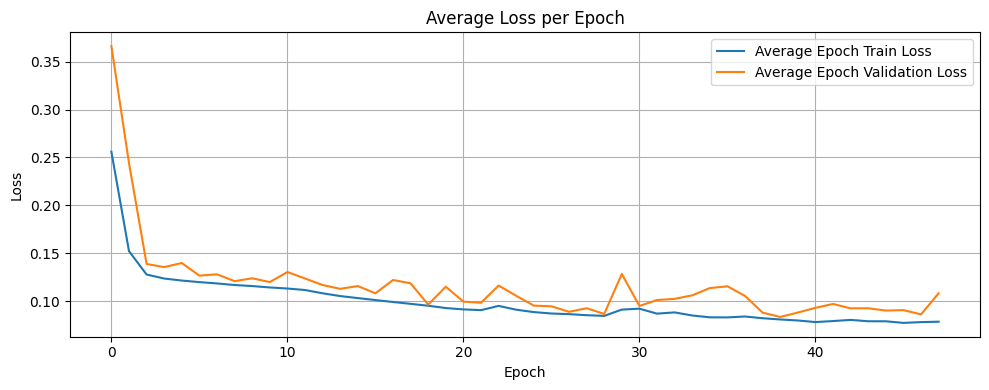

Epoch  49, Batch   1: loss =  0.0804, output_mean =  0.0271, target_mean =  0.0325
Epoch  49, Batch   2: loss =  0.0803, output_mean =  0.0264, target_mean =  0.0287
Epoch  49, Batch   3: loss =  0.0733, output_mean =  0.0294, target_mean =  0.0292
Epoch  49, Batch   4: loss =  0.0784, output_mean =  0.0344, target_mean =  0.0310
Epoch  49, Batch   5: loss =  0.0769, output_mean =  0.0362, target_mean =  0.0306
Epoch  49, Batch   6: loss =  0.0738, output_mean =  0.0289, target_mean =  0.0286
Epoch  49, Batch   7: loss =  0.0855, output_mean =  0.0269, target_mean =  0.0320
Epoch  49, Batch   8: loss =  0.0718, output_mean =  0.0276, target_mean =  0.0250
Epoch  49, Batch   9: loss =  0.0838, output_mean =  0.0322, target_mean =  0.0332
Epoch  49, Batch  10: loss =  0.0832, output_mean =  0.0341, target_mean =  0.0318
Epoch 49 Average Loss: 0.0787 Validation loss: 0.1004
Validation accuracy: 0.9708


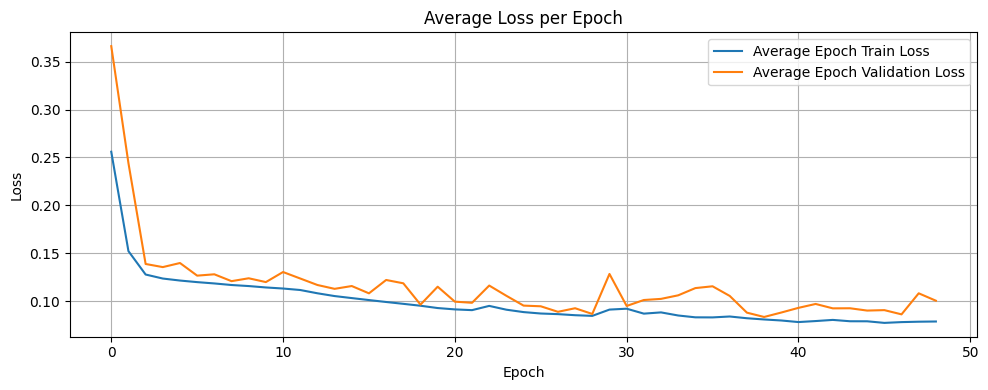

Epoch  50, Batch   1: loss =  0.0784, output_mean =  0.0312, target_mean =  0.0302
Epoch  50, Batch   2: loss =  0.0720, output_mean =  0.0251, target_mean =  0.0267
Epoch  50, Batch   3: loss =  0.0760, output_mean =  0.0265, target_mean =  0.0284
Epoch  50, Batch   4: loss =  0.0693, output_mean =  0.0293, target_mean =  0.0291
Epoch  50, Batch   5: loss =  0.0893, output_mean =  0.0335, target_mean =  0.0343
Epoch  50, Batch   6: loss =  0.0901, output_mean =  0.0268, target_mean =  0.0337
Epoch  50, Batch   7: loss =  0.0735, output_mean =  0.0288, target_mean =  0.0290
Epoch  50, Batch   8: loss =  0.0809, output_mean =  0.0352, target_mean =  0.0335
Epoch  50, Batch   9: loss =  0.0746, output_mean =  0.0370, target_mean =  0.0267
Epoch  50, Batch  10: loss =  0.0744, output_mean =  0.0310, target_mean =  0.0309
Epoch 50 Average Loss: 0.0778 Validation loss: 0.0828
Validation accuracy: 0.9725


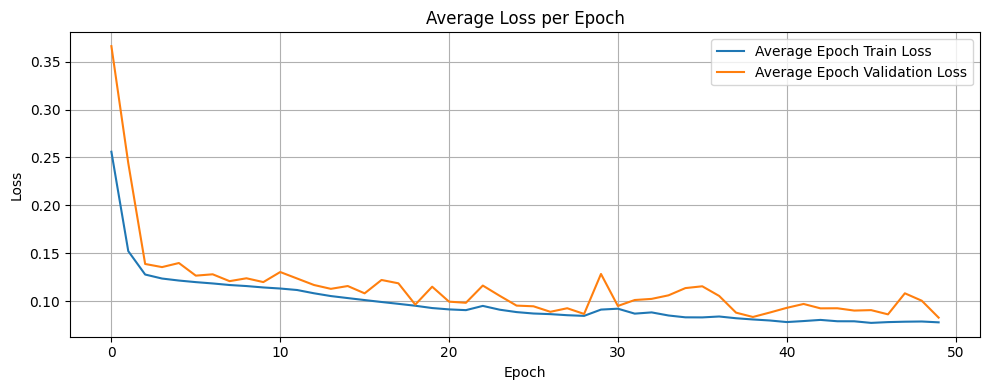

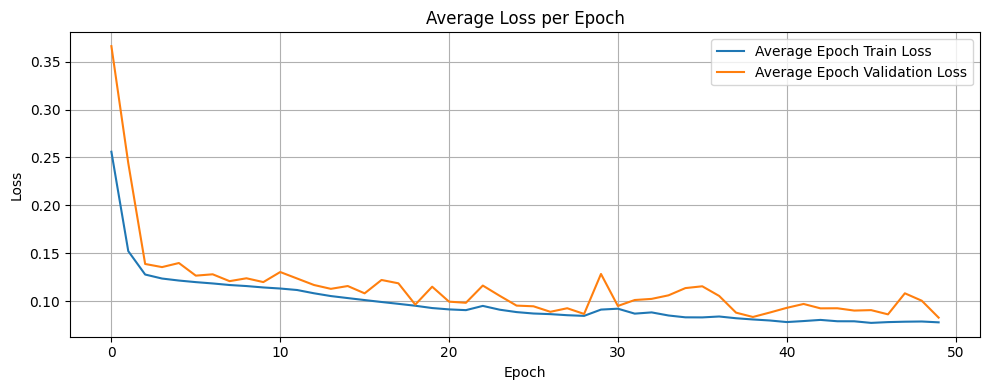

In [ ]:
def savePlot(epoch, batch_id, output, target):
    output_image = torch.sigmoid(output[-1]).cpu().detach().numpy()
    target_image = target[-1].cpu().detach().numpy()

    _, axes = plt.subplots(1, 2, figsize=(20, 10))
    axes[0].imshow(output_image.squeeze(), cmap='gray')
    axes[0].set_title(f"Epoch {epoch + 1} - Output Image")
    axes[0].axis("off")

    axes[1].imshow(target_image.squeeze(), cmap='gray')
    axes[1].set_title("Target Image")
    axes[1].axis("off")

    plt.tight_layout()
    plotDirectory = f"{trainDirectory}/epoch{epoch + 1}"
    os.makedirs(plotDirectory, exist_ok=True)
    plt.savefig(plotDirectory + f"/batch_{batch_id + 1}.png")
    plt.close()

def validate_segmentation_model(model, validation_loader, criterion, device):
    model.eval()
    total_loss = 0.0
    correct_pixels = 0
    total_pixels = 0

    with torch.no_grad():
        for _, (images, masks) in enumerate(validation_loader):
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)

            total_loss += loss.item()

            predicted_masks = (torch.sigmoid(outputs) > 0.5).float()
            correct_pixels += (predicted_masks == masks).sum().item()
            total_pixels += masks.numel()

    avg_loss = total_loss / len(validation_loader)
    accuracy = correct_pixels / total_pixels

    return avg_loss, accuracy

losses = []
epoch_losses = []
validation_epoch_losses = []
epochs = 50
trainDirectory = "D:/COMP9444/cracksV1/training"
os.makedirs(trainDirectory, exist_ok=True)

for epoch in range(epochs):
    epoch_loss_total = 0
    num_batches = 0
    model.train()
    for batch_id, (data, target) in enumerate(train_loader):
        data = data.to(device)
        target = target.to(device)

        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        num_batches += 1

        loss.backward()
        optimizer.step()
        epoch_loss_total += loss.item()

        
        # Save and print loss
        losses.append(loss.item())
        print('Epoch %3d, Batch %3d: loss = %7.4f, output_mean = %7.4f, target_mean = %7.4f' %
        (epoch + 1, batch_id + 1, loss.item(), torch.sigmoid(output).mean().item(), target.mean().item()))
        savePlot(epoch, batch_id, output, target)

       
    # Validation step
    avg_validation_epoch_loss, val_accuracy = validate_segmentation_model(model, validation_loader, criterion, device)


    # Compute and log average loss for this epoch
    avg_epoch_loss = epoch_loss_total / num_batches
    epoch_losses.append(avg_epoch_loss)
    validation_epoch_losses.append(avg_validation_epoch_loss)
    print(f"Epoch {epoch + 1} Average Loss: {avg_epoch_loss:.4f} Validation loss: {avg_validation_epoch_loss:.4f}")
    print(f"Validation accuracy: {val_accuracy:.4f}")
    plt.figure(figsize=(10, 4))
    plt.plot(epoch_losses, label='Average Epoch Train Loss')
    plt.plot(validation_epoch_losses, label='Average Epoch Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Average Loss per Epoch')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


plt.figure(figsize=(10, 4))
plt.plot(epoch_losses, label='Average Epoch Train Loss')
plt.plot(validation_epoch_losses, label='Average Epoch Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Average Loss per Epoch')
plt.legend()
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig(trainDirectory + "/epochLoss.png")


## 2.5. Download model (optional)

In [ ]:
torch.save(model.state_dict(), "finalCracksModel.pth")

## 2.6. Test model

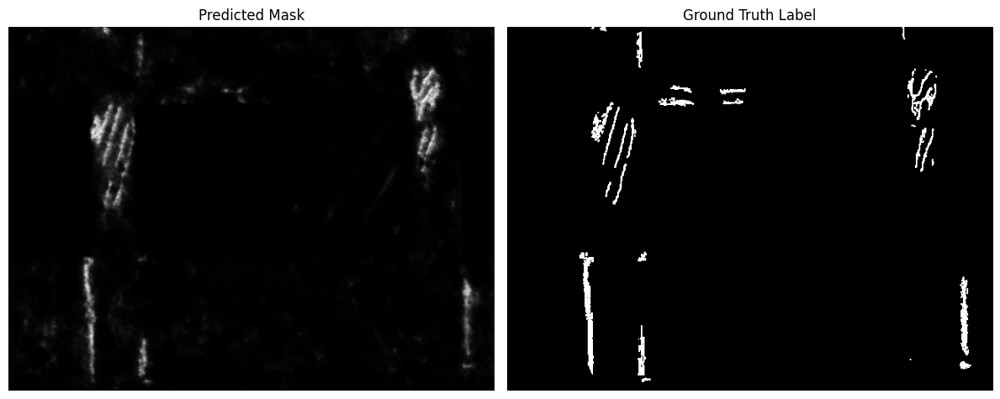

{'iou': 0.2969021201133728, 'precision': 0.4121517539024353, 'recall': 0.514980137348175, 'f1': 0.45786359906196594}


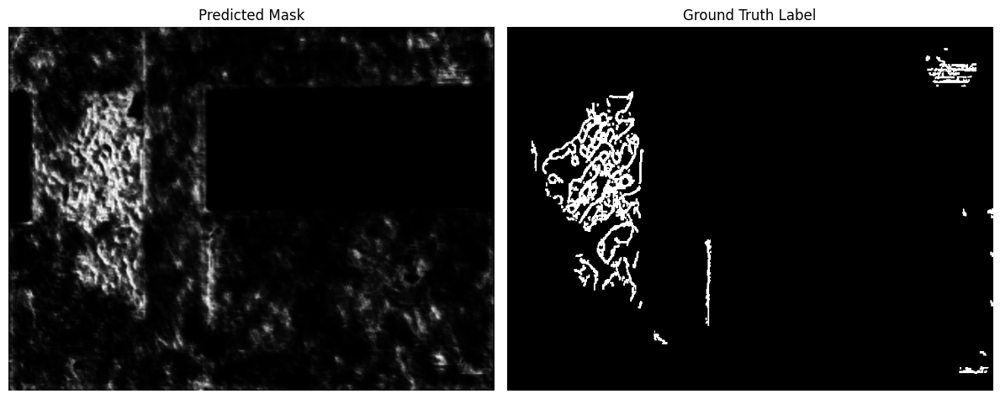

{'iou': 0.32627543807029724, 'precision': 0.42221781611442566, 'recall': 0.5894665122032166, 'f1': 0.49201762676239014}


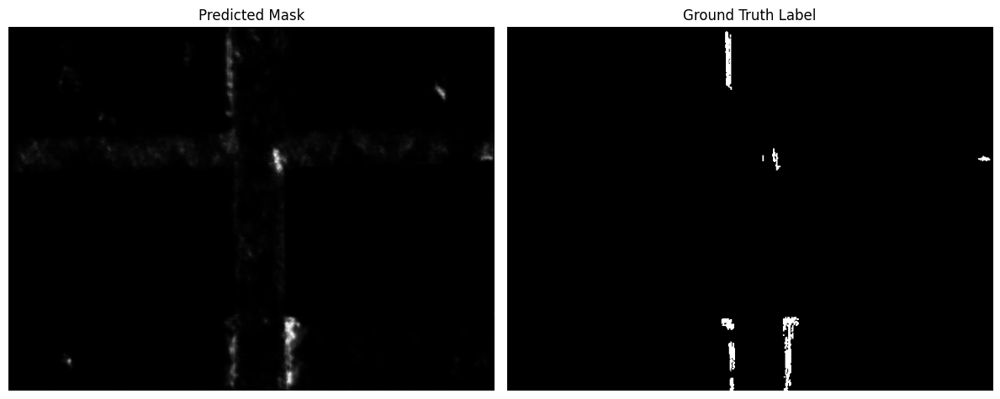

{'iou': 0.29259029030799866, 'precision': 0.40092024207115173, 'recall': 0.5198891758918762, 'f1': 0.4527193009853363}


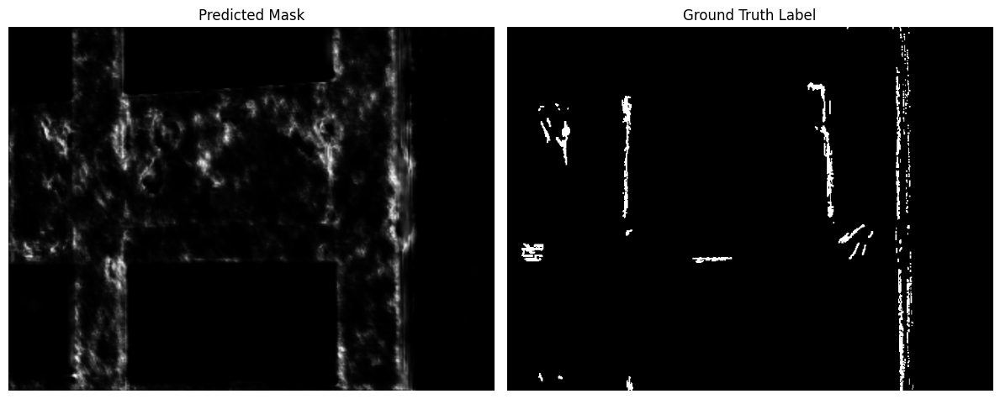

{'iou': 0.32352107763290405, 'precision': 0.4181974232196808, 'recall': 0.588313639163971, 'f1': 0.48887938261032104}


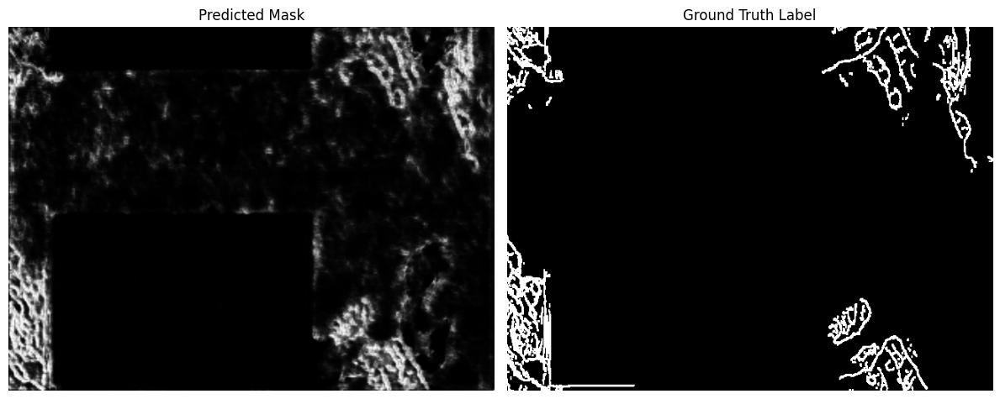

{'iou': 0.301825612783432, 'precision': 0.4008375406265259, 'recall': 0.549935519695282, 'f1': 0.4636959135532379}


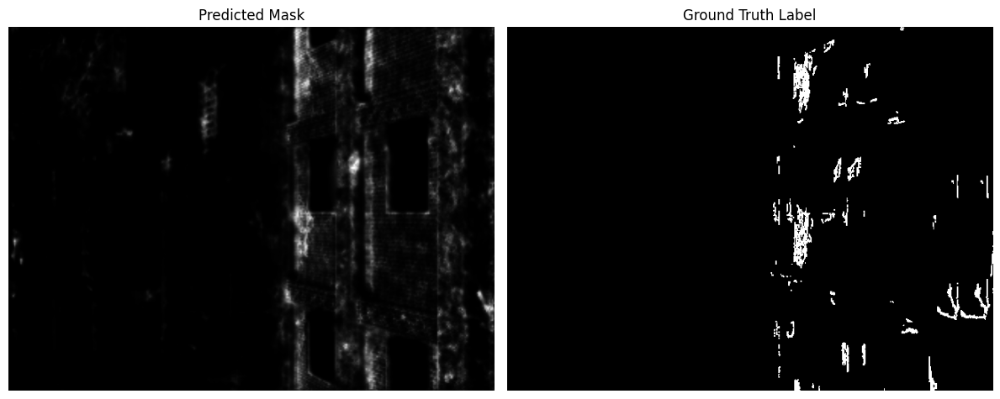

{'iou': 0.3136465847492218, 'precision': 0.4150518774986267, 'recall': 0.5621247291564941, 'f1': 0.47752049565315247}


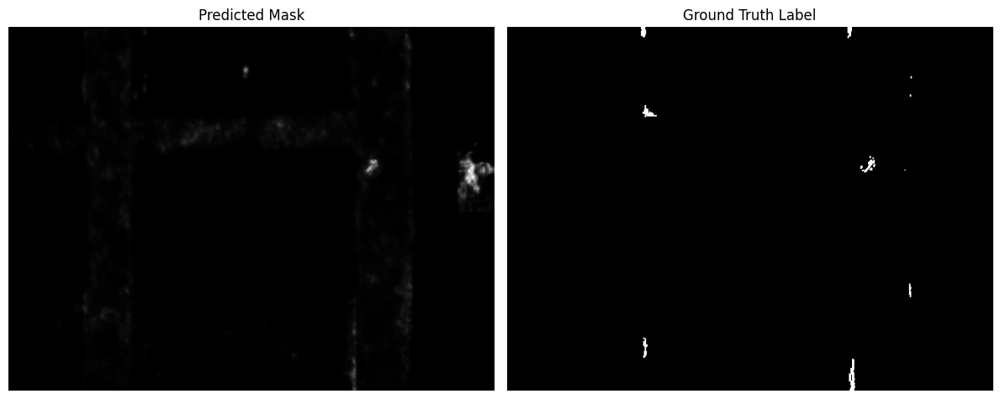

{'iou': 0.28900060057640076, 'precision': 0.3828089237213135, 'recall': 0.5411457419395447, 'f1': 0.4484103322029114}


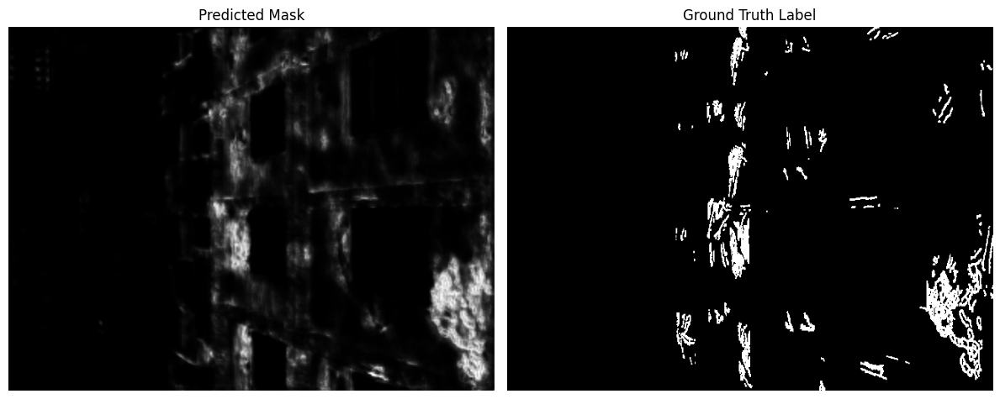

{'iou': 0.31261059641838074, 'precision': 0.41927021741867065, 'recall': 0.551337480545044, 'f1': 0.476318895816803}


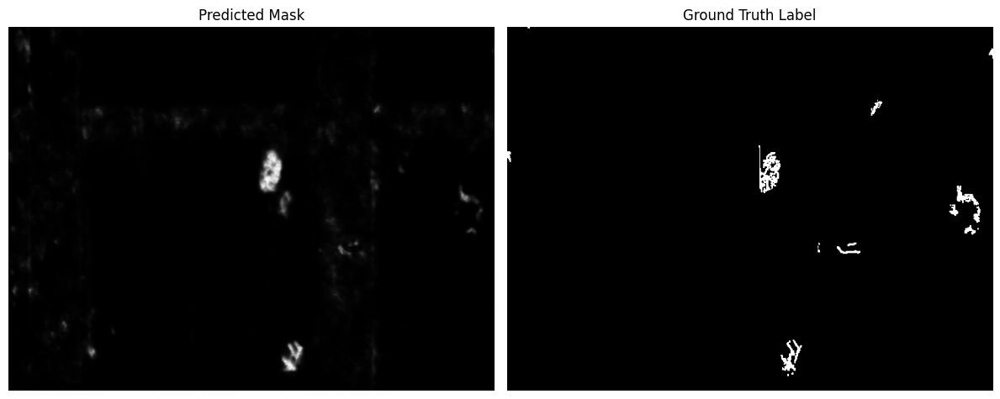

{'iou': 0.3372942805290222, 'precision': 0.438603937625885, 'recall': 0.5935391187667847, 'f1': 0.5044428706169128}


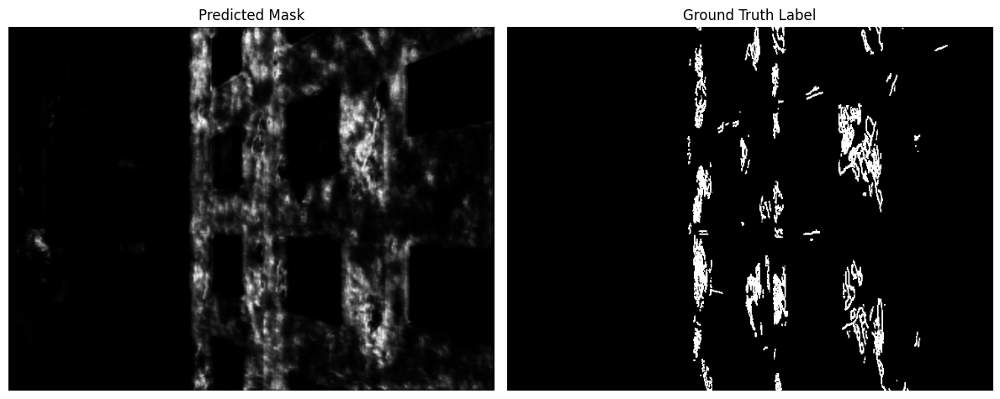

{'iou': 0.29803743958473206, 'precision': 0.4034360945224762, 'recall': 0.5328854322433472, 'f1': 0.45921239256858826}
Validation - IoU: 0.3092, Precision: 0.4113, Recall: 0.5544, F1: 0.4721, 


In [ ]:
from torchmetrics.classification import (
    BinaryJaccardIndex,
    BinaryPrecision,
    BinaryRecall,
    BinaryF1Score
)

def visualize_results(pred_mask, label_mask):
    """Display the predicted and ground truth masks."""
    _, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(pred_mask, cmap='gray')
    axes[0].set_title("Predicted Mask")
    axes[0].axis("off")

    axes[1].imshow(label_mask, cmap='gray')
    axes[1].set_title("Ground Truth Label")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()


def iou_score(outputs, targets, threshold):
    outputs = torch.sigmoid(outputs)

    # --- Visualization only ---
    pred_mask_vis = outputs[-1].squeeze().detach().cpu().numpy()
    label_mask_vis = targets[-1].squeeze().detach().cpu().numpy()
    visualize_results(pred_mask_vis, label_mask_vis)

    # --- Prepare predictions and labels ---
    preds = (outputs > threshold).int().squeeze(1)   # [B, H, W]
    targets = targets.int().squeeze(1)   # [B, H, W]

    # --- Initialize metrics ---
    iou = BinaryJaccardIndex(threshold=threshold).to(outputs.device)
    precision = BinaryPrecision(threshold=threshold).to(outputs.device)
    recall = BinaryRecall(threshold=threshold).to(outputs.device)
    f1 = BinaryF1Score(threshold=threshold).to(outputs.device)

    # --- Update metrics ---
    iou.update(preds, targets)
    precision.update(preds, targets)
    recall.update(preds, targets)
    f1.update(preds, targets)

    # --- Compute metrics ---
    return {
        'iou': iou.compute().item(),
        'precision': precision.compute().item(),
        'recall': recall.compute().item(),
        'f1': f1.compute().item()
    }



model.eval()
total_metrics = {'iou': 0, 'precision': 0, 'recall': 0, 'f1': 0}

with torch.no_grad():
    for images, masks in test_loader:
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)
        scores = iou_score(outputs, masks, 0.2)
        for k in total_metrics:
            total_metrics[k] += scores[k]
        print(scores)

# Average metrics
num_batches = len(test_loader)
avg_metrics = {k: v / num_batches for k, v in total_metrics.items()}
print(
    f"Validation - IoU: {avg_metrics['iou']:.4f}, "
    f"Precision: {avg_metrics['precision']:.4f}, "
    f"Recall: {avg_metrics['recall']:.4f}, "
    f"F1: {avg_metrics['f1']:.4f}, "
)

# 3. Spalls model

## 3.1 Create model

In [ ]:
class CustomFCN(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super(CustomFCN, self).__init__()

        # Downsampling (Encoder)
        self.enc1 = self.conv_chain(in_channels, 3, 3, 8, 1, 1)
        self.pool1 = nn.MaxPool2d(2, stride=2)

        self.enc2 = self.conv_chain(8, 3, 3, 16, 1, 1)
        self.pool2 = nn.MaxPool2d(2, stride=2)

        self.enc3 = self.conv_chain(16, 3, 3, 32, 1, 1)
        self.pool3 = nn.MaxPool2d(2, stride=2)

       # Upsampling (Decoder)
        self.up1 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dec1 = self.conv_chain(32, 3, 3, 16, 1, 1)

        self.up2 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dec2 = self.conv_chain(32, 3, 3, 8, 1, 1)

        self.up3 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dec3 = nn.Conv2d(in_channels=16, out_channels=out_channels, kernel_size=1, padding=0, stride=1)

    def conv_chain(self, Din, L, M, D, S, P):
      return nn.Sequential(
          nn.Conv2d(in_channels=Din, out_channels=D, kernel_size=(L, M), padding=P, stride=S),
          nn.BatchNorm2d(D),
          nn.ReLU(inplace=True)
      )

    def forward(self, x):
        # Encoder
        x1 = self.pool1(self.enc1(x))
        x2 = self.pool2(self.enc2(x1))
        x3 = self.pool3(self.enc3(x2))

        # Decoder
        y = self.up1(x3)
        y = self.dec1(y)
        y = torch.cat([y, x2], dim=1)

        y = self.up2(y)
        y = self.dec2(y)
        y = torch.cat([y, x1], dim=1)

        y = self.up3(y)
        y = self.dec3(y)

        return y
# Create model instance
model = CustomFCN()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)


CustomFCN(
  (enc1): Sequential(
    (0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (enc2): Sequential(
    (0): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (enc3): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (up1): Upsample(scale_factor=2.0, mode='bilinear')
  (dec1): Sequential(
    (0

## 3.2. Prepare data

In [ ]:
IMAGE_PATH = "../QuakeCity/image"
LABEL_PATH = "../QuakeCity/label"

def load_image(path, isLabel=False):
    """Load an RGB image and convert to a tensor"""
    img = Image.open(path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((480, 640)),  # Resize images
        transforms.ToTensor(),  # Convert to tensor

    ])
    if isLabel:
        transform = transforms.Compose([
            transforms.Grayscale(num_output_channels=1),
            transforms.Resize((480, 640)),  # Resize images
            transforms.ToTensor(),  # Convert to tensor
        ])
        return (transform(img) > 0).float()
    return transform(img)  # Apply transform

class QuakeCityDataset(torch.utils.data.Dataset):
    def __init__(self, file_list):
        self.file_list = file_list

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        filename = self.file_list[idx]
        img = load_image(os.path.join(IMAGE_PATH, filename))
        crack = load_image(os.path.join(LABEL_PATH, "spall", filename), isLabel=True)
        return img, crack

total = 1920
all_files = sorted(os.listdir(IMAGE_PATH))[:total]
random.shuffle(all_files)
split_size = total//3
train_files = all_files[:split_size]
val_files = all_files[split_size:2*split_size]
test_files = all_files[2*split_size:3*split_size]

train_dataset = QuakeCityDataset(train_files)
validation_dataset = QuakeCityDataset(val_files)
test_dataset = QuakeCityDataset(test_files)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=split_size//10, shuffle=True)
validation_loader = torch.utils.data.DataLoader(validation_dataset, batch_size=split_size//10, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=split_size//10, shuffle=False)


img_test_batch, label_test_batch = next(iter(validation_loader))
print("Test image batch shape:", img_test_batch.shape)
print("Test label batch shape:", label_test_batch.shape)



Test image batch shape: torch.Size([64, 3, 480, 640])
Test label batch shape: torch.Size([64, 1, 480, 640])


## 3.3. Choose criterion and optimizer

In [ ]:
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.8, momentum=0.9)

## 3.4. Train model

Epoch   1, Batch   1: loss =  0.8230, output_mean =  0.5454, target_mean =  0.0351
Epoch   1, Batch   2: loss =  0.2637, output_mean =  0.1736, target_mean =  0.0425
Epoch   1, Batch   3: loss =  0.1636, output_mean =  0.0278, target_mean =  0.0397
Epoch   1, Batch   4: loss =  0.2034, output_mean =  0.0094, target_mean =  0.0441
Epoch   1, Batch   5: loss =  0.2079, output_mean =  0.0066, target_mean =  0.0412
Epoch   1, Batch   6: loss =  0.2103, output_mean =  0.0071, target_mean =  0.0371
Epoch   1, Batch   7: loss =  0.2269, output_mean =  0.0072, target_mean =  0.0401
Epoch   1, Batch   8: loss =  0.1859, output_mean =  0.0057, target_mean =  0.0294
Epoch   1, Batch   9: loss =  0.2018, output_mean =  0.0030, target_mean =  0.0336
Epoch   1, Batch  10: loss =  0.2221, output_mean =  0.0134, target_mean =  0.0412
Epoch 1 Average Loss: 0.2709 Validation loss: 0.3592
Validation accuracy: 0.9609


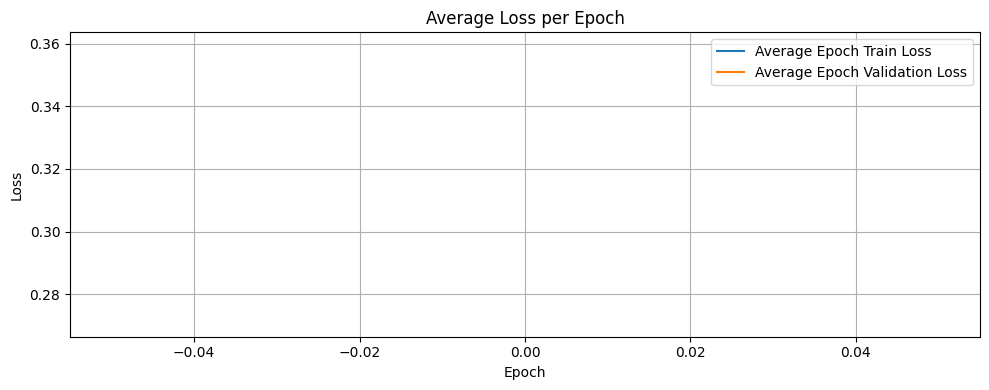

Epoch   2, Batch   1: loss =  0.1848, output_mean =  0.0142, target_mean =  0.0351
Epoch   2, Batch   2: loss =  0.1604, output_mean =  0.0153, target_mean =  0.0299
Epoch   2, Batch   3: loss =  0.1915, output_mean =  0.0169, target_mean =  0.0399
Epoch   2, Batch   4: loss =  0.1891, output_mean =  0.0188, target_mean =  0.0416
Epoch   2, Batch   5: loss =  0.1788, output_mean =  0.0267, target_mean =  0.0429
Epoch   2, Batch   6: loss =  0.1484, output_mean =  0.0280, target_mean =  0.0340
Epoch   2, Batch   7: loss =  0.1730, output_mean =  0.0326, target_mean =  0.0423
Epoch   2, Batch   8: loss =  0.1494, output_mean =  0.0345, target_mean =  0.0355
Epoch   2, Batch   9: loss =  0.1459, output_mean =  0.0339, target_mean =  0.0359
Epoch   2, Batch  10: loss =  0.1795, output_mean =  0.0382, target_mean =  0.0470
Epoch 2 Average Loss: 0.1701 Validation loss: 0.3220
Validation accuracy: 0.9609


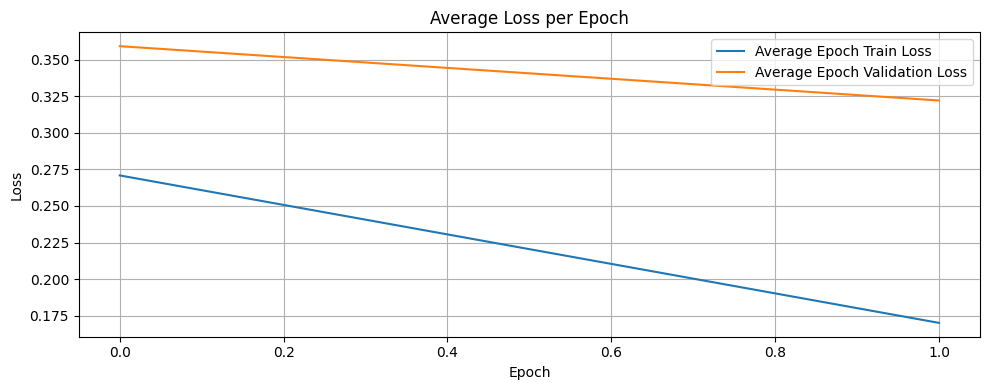

Epoch   3, Batch   1: loss =  0.1600, output_mean =  0.0435, target_mean =  0.0398
Epoch   3, Batch   2: loss =  0.1496, output_mean =  0.0421, target_mean =  0.0365
Epoch   3, Batch   3: loss =  0.1352, output_mean =  0.0425, target_mean =  0.0314
Epoch   3, Batch   4: loss =  0.1862, output_mean =  0.0377, target_mean =  0.0472
Epoch   3, Batch   5: loss =  0.1532, output_mean =  0.0433, target_mean =  0.0385
Epoch   3, Batch   6: loss =  0.1507, output_mean =  0.0444, target_mean =  0.0370
Epoch   3, Batch   7: loss =  0.1541, output_mean =  0.0432, target_mean =  0.0391
Epoch   3, Batch   8: loss =  0.1574, output_mean =  0.0373, target_mean =  0.0401
Epoch   3, Batch   9: loss =  0.1518, output_mean =  0.0347, target_mean =  0.0399
Epoch   3, Batch  10: loss =  0.1382, output_mean =  0.0328, target_mean =  0.0347
Epoch 3 Average Loss: 0.1536 Validation loss: 0.1901
Validation accuracy: 0.9609


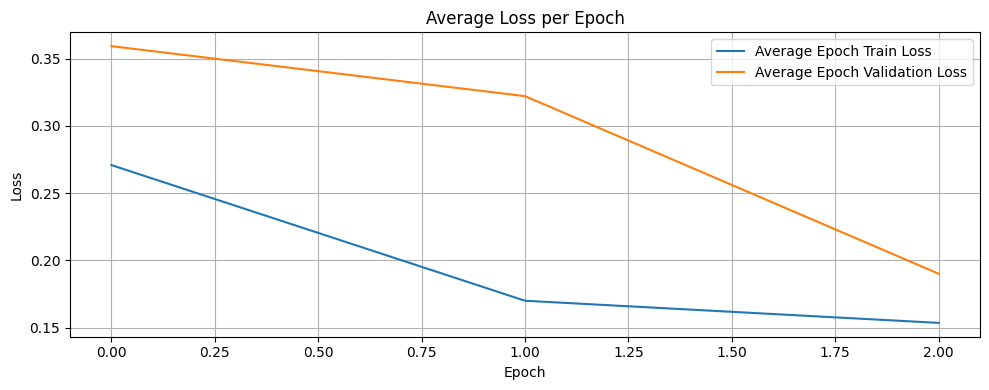

Epoch   4, Batch   1: loss =  0.1421, output_mean =  0.0305, target_mean =  0.0361
Epoch   4, Batch   2: loss =  0.1414, output_mean =  0.0299, target_mean =  0.0358
Epoch   4, Batch   3: loss =  0.1554, output_mean =  0.0303, target_mean =  0.0417
Epoch   4, Batch   4: loss =  0.1396, output_mean =  0.0322, target_mean =  0.0369
Epoch   4, Batch   5: loss =  0.1361, output_mean =  0.0328, target_mean =  0.0358
Epoch   4, Batch   6: loss =  0.1483, output_mean =  0.0329, target_mean =  0.0393
Epoch   4, Batch   7: loss =  0.1477, output_mean =  0.0331, target_mean =  0.0394
Epoch   4, Batch   8: loss =  0.1508, output_mean =  0.0329, target_mean =  0.0398
Epoch   4, Batch   9: loss =  0.1310, output_mean =  0.0320, target_mean =  0.0339
Epoch   4, Batch  10: loss =  0.1601, output_mean =  0.0318, target_mean =  0.0454
Epoch 4 Average Loss: 0.1452 Validation loss: 0.1933
Validation accuracy: 0.9609


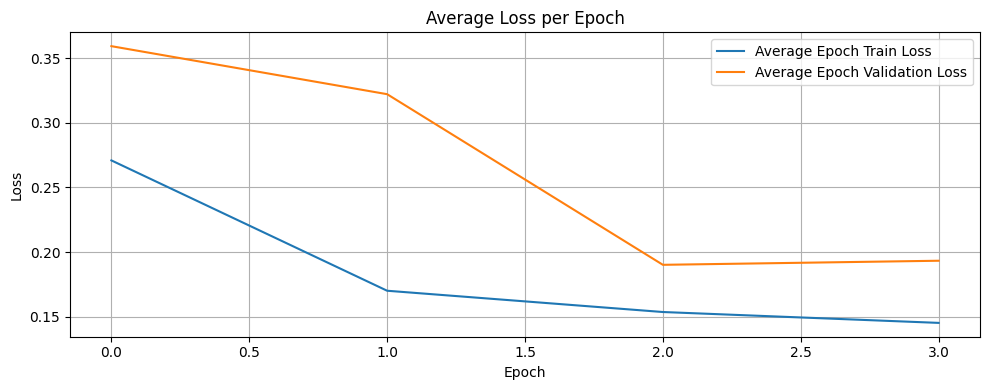

Epoch   5, Batch   1: loss =  0.1497, output_mean =  0.0309, target_mean =  0.0414
Epoch   5, Batch   2: loss =  0.1366, output_mean =  0.0308, target_mean =  0.0365
Epoch   5, Batch   3: loss =  0.1427, output_mean =  0.0324, target_mean =  0.0391
Epoch   5, Batch   4: loss =  0.1384, output_mean =  0.0375, target_mean =  0.0383
Epoch   5, Batch   5: loss =  0.1360, output_mean =  0.0326, target_mean =  0.0374
Epoch   5, Batch   6: loss =  0.1283, output_mean =  0.0316, target_mean =  0.0361
Epoch   5, Batch   7: loss =  0.1452, output_mean =  0.0292, target_mean =  0.0415
Epoch   5, Batch   8: loss =  0.1211, output_mean =  0.0334, target_mean =  0.0335
Epoch   5, Batch   9: loss =  0.1426, output_mean =  0.0340, target_mean =  0.0426
Epoch   5, Batch  10: loss =  0.1338, output_mean =  0.0377, target_mean =  0.0378
Epoch 5 Average Loss: 0.1374 Validation loss: 0.1536
Validation accuracy: 0.9609


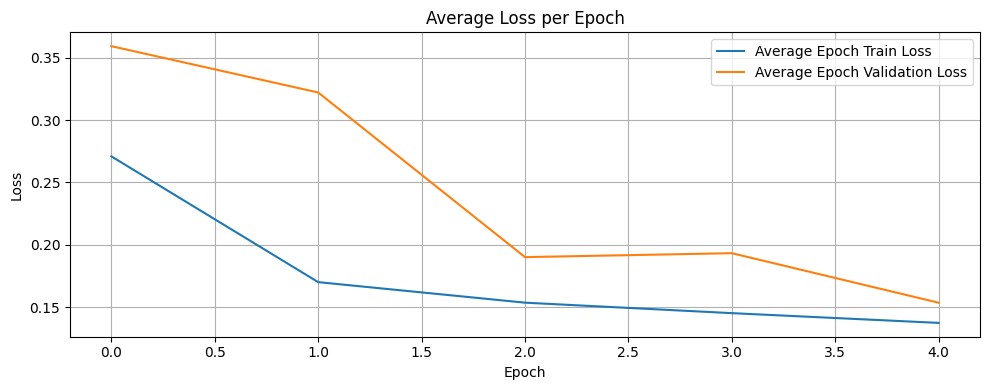

Epoch   6, Batch   1: loss =  0.1398, output_mean =  0.0344, target_mean =  0.0408
Epoch   6, Batch   2: loss =  0.1277, output_mean =  0.0323, target_mean =  0.0364
Epoch   6, Batch   3: loss =  0.1289, output_mean =  0.0312, target_mean =  0.0379
Epoch   6, Batch   4: loss =  0.1397, output_mean =  0.0332, target_mean =  0.0427
Epoch   6, Batch   5: loss =  0.1388, output_mean =  0.0299, target_mean =  0.0410
Epoch   6, Batch   6: loss =  0.1364, output_mean =  0.0397, target_mean =  0.0387
Epoch   6, Batch   7: loss =  0.1119, output_mean =  0.0360, target_mean =  0.0318
Epoch   6, Batch   8: loss =  0.1222, output_mean =  0.0344, target_mean =  0.0358
Epoch   6, Batch   9: loss =  0.1287, output_mean =  0.0325, target_mean =  0.0364
Epoch   6, Batch  10: loss =  0.1412, output_mean =  0.0269, target_mean =  0.0427
Epoch 6 Average Loss: 0.1315 Validation loss: 0.1399
Validation accuracy: 0.9609


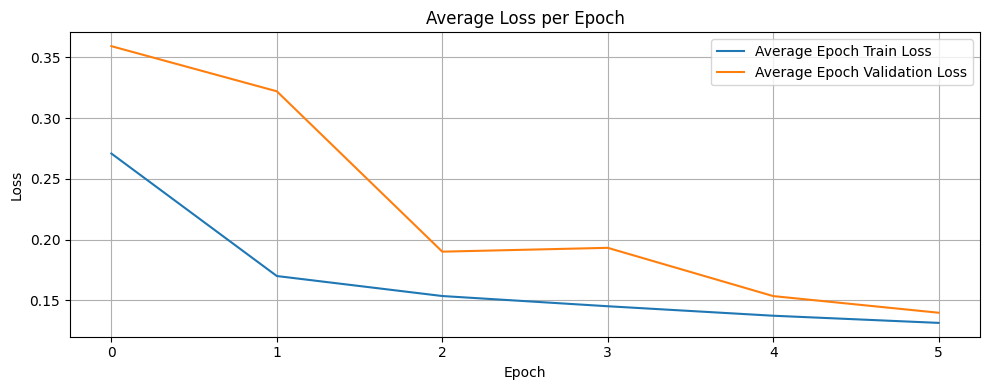

Epoch   7, Batch   1: loss =  0.1156, output_mean =  0.0291, target_mean =  0.0332
Epoch   7, Batch   2: loss =  0.1201, output_mean =  0.0340, target_mean =  0.0370
Epoch   7, Batch   3: loss =  0.1465, output_mean =  0.0431, target_mean =  0.0447
Epoch   7, Batch   4: loss =  0.1175, output_mean =  0.0354, target_mean =  0.0362
Epoch   7, Batch   5: loss =  0.1472, output_mean =  0.0330, target_mean =  0.0438
Epoch   7, Batch   6: loss =  0.1234, output_mean =  0.0370, target_mean =  0.0379
Epoch   7, Batch   7: loss =  0.1401, output_mean =  0.0402, target_mean =  0.0471
Epoch   7, Batch   8: loss =  0.1146, output_mean =  0.0386, target_mean =  0.0358
Epoch   7, Batch   9: loss =  0.1121, output_mean =  0.0363, target_mean =  0.0345
Epoch   7, Batch  10: loss =  0.1072, output_mean =  0.0318, target_mean =  0.0340
Epoch 7 Average Loss: 0.1244 Validation loss: 0.1464
Validation accuracy: 0.9609


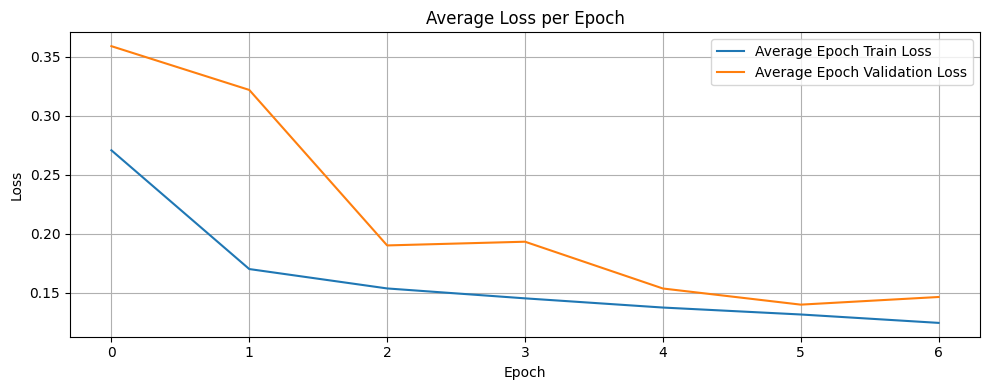

Epoch   8, Batch   1: loss =  0.1248, output_mean =  0.0379, target_mean =  0.0386
Epoch   8, Batch   2: loss =  0.1103, output_mean =  0.0297, target_mean =  0.0349
Epoch   8, Batch   3: loss =  0.1000, output_mean =  0.0306, target_mean =  0.0331
Epoch   8, Batch   4: loss =  0.1285, output_mean =  0.0368, target_mean =  0.0454
Epoch   8, Batch   5: loss =  0.1088, output_mean =  0.0379, target_mean =  0.0383
Epoch   8, Batch   6: loss =  0.1199, output_mean =  0.0340, target_mean =  0.0397
Epoch   8, Batch   7: loss =  0.1025, output_mean =  0.0401, target_mean =  0.0337
Epoch   8, Batch   8: loss =  0.1161, output_mean =  0.0421, target_mean =  0.0384
Epoch   8, Batch   9: loss =  0.1070, output_mean =  0.0291, target_mean =  0.0387
Epoch   8, Batch  10: loss =  0.1197, output_mean =  0.0328, target_mean =  0.0431
Epoch 8 Average Loss: 0.1138 Validation loss: 0.1792
Validation accuracy: 0.9609


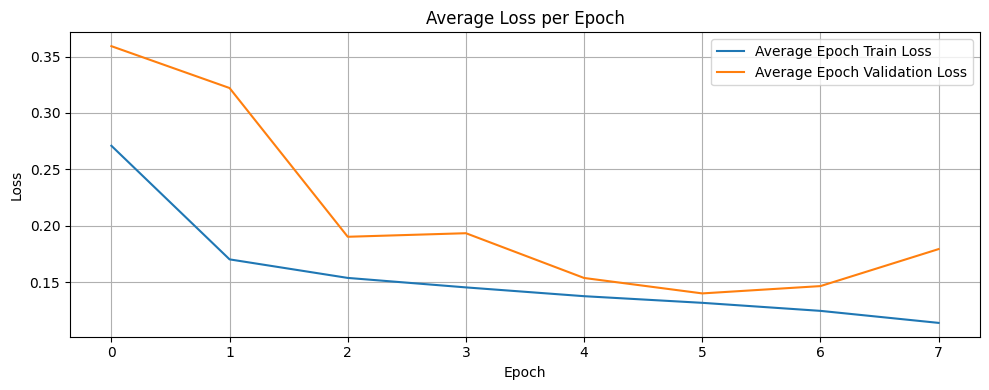

Epoch   9, Batch   1: loss =  0.1126, output_mean =  0.0348, target_mean =  0.0364
Epoch   9, Batch   2: loss =  0.1147, output_mean =  0.0409, target_mean =  0.0406
Epoch   9, Batch   3: loss =  0.1116, output_mean =  0.0280, target_mean =  0.0420
Epoch   9, Batch   4: loss =  0.1042, output_mean =  0.0307, target_mean =  0.0398
Epoch   9, Batch   5: loss =  0.1090, output_mean =  0.0402, target_mean =  0.0396
Epoch   9, Batch   6: loss =  0.1055, output_mean =  0.0371, target_mean =  0.0362
Epoch   9, Batch   7: loss =  0.0989, output_mean =  0.0353, target_mean =  0.0337
Epoch   9, Batch   8: loss =  0.1060, output_mean =  0.0227, target_mean =  0.0383
Epoch   9, Batch   9: loss =  0.1038, output_mean =  0.0379, target_mean =  0.0370
Epoch   9, Batch  10: loss =  0.1039, output_mean =  0.0388, target_mean =  0.0406
Epoch 9 Average Loss: 0.1070 Validation loss: 0.1227
Validation accuracy: 0.9609


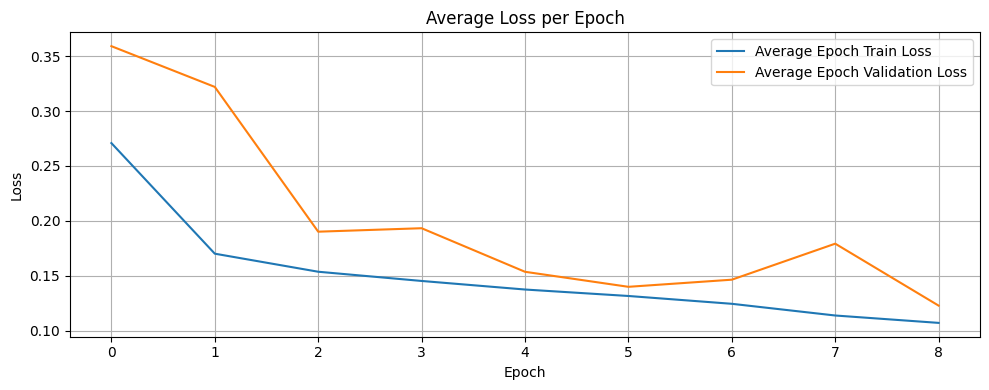

Epoch  10, Batch   1: loss =  0.1040, output_mean =  0.0363, target_mean =  0.0354
Epoch  10, Batch   2: loss =  0.1080, output_mean =  0.0287, target_mean =  0.0382
Epoch  10, Batch   3: loss =  0.0909, output_mean =  0.0360, target_mean =  0.0324
Epoch  10, Batch   4: loss =  0.1025, output_mean =  0.0241, target_mean =  0.0378
Epoch  10, Batch   5: loss =  0.0994, output_mean =  0.0305, target_mean =  0.0371
Epoch  10, Batch   6: loss =  0.1167, output_mean =  0.0349, target_mean =  0.0482
Epoch  10, Batch   7: loss =  0.1035, output_mean =  0.0363, target_mean =  0.0389
Epoch  10, Batch   8: loss =  0.0961, output_mean =  0.0390, target_mean =  0.0334
Epoch  10, Batch   9: loss =  0.1090, output_mean =  0.0436, target_mean =  0.0455
Epoch  10, Batch  10: loss =  0.1034, output_mean =  0.0466, target_mean =  0.0375
Epoch 10 Average Loss: 0.1034 Validation loss: 0.1420
Validation accuracy: 0.9656


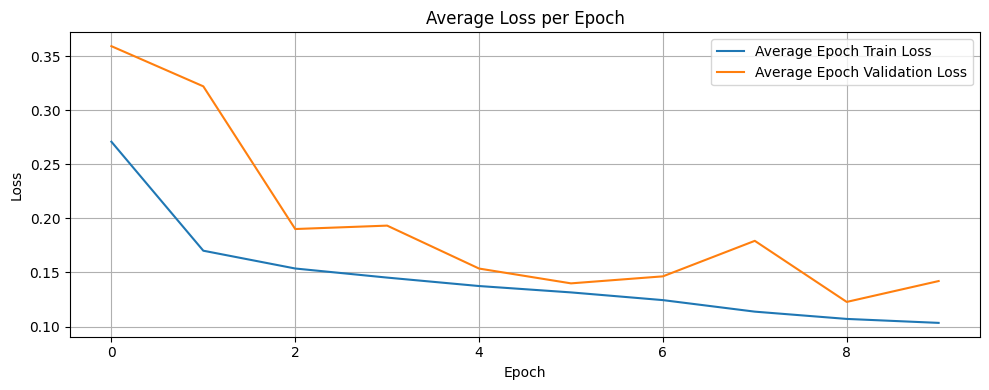

Epoch  11, Batch   1: loss =  0.1097, output_mean =  0.0374, target_mean =  0.0463
Epoch  11, Batch   2: loss =  0.0884, output_mean =  0.0366, target_mean =  0.0361
Epoch  11, Batch   3: loss =  0.1085, output_mean =  0.0458, target_mean =  0.0427
Epoch  11, Batch   4: loss =  0.1054, output_mean =  0.0278, target_mean =  0.0380
Epoch  11, Batch   5: loss =  0.0955, output_mean =  0.0266, target_mean =  0.0334
Epoch  11, Batch   6: loss =  0.0958, output_mean =  0.0360, target_mean =  0.0386
Epoch  11, Batch   7: loss =  0.1143, output_mean =  0.0536, target_mean =  0.0386
Epoch  11, Batch   8: loss =  0.0891, output_mean =  0.0364, target_mean =  0.0366
Epoch  11, Batch   9: loss =  0.1045, output_mean =  0.0272, target_mean =  0.0368
Epoch  11, Batch  10: loss =  0.0959, output_mean =  0.0298, target_mean =  0.0369
Epoch 11 Average Loss: 0.1007 Validation loss: 0.0933
Validation accuracy: 0.9693


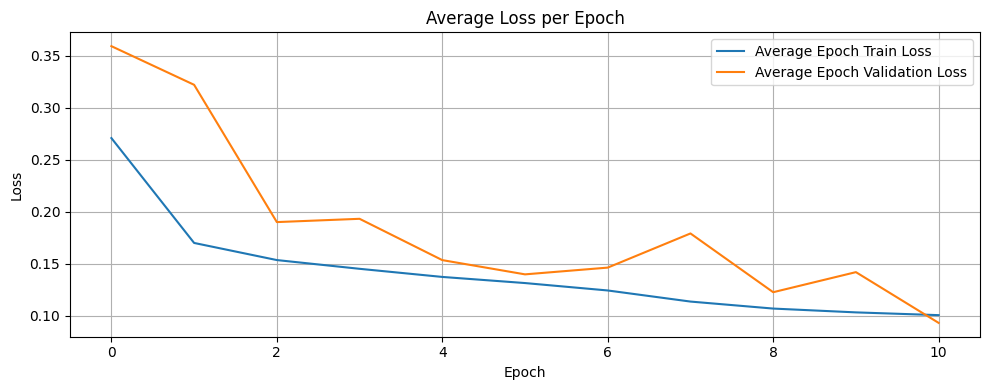

Epoch  12, Batch   1: loss =  0.0894, output_mean =  0.0342, target_mean =  0.0396
Epoch  12, Batch   2: loss =  0.1022, output_mean =  0.0441, target_mean =  0.0423
Epoch  12, Batch   3: loss =  0.0946, output_mean =  0.0427, target_mean =  0.0413
Epoch  12, Batch   4: loss =  0.0928, output_mean =  0.0330, target_mean =  0.0387
Epoch  12, Batch   5: loss =  0.0991, output_mean =  0.0352, target_mean =  0.0408
Epoch  12, Batch   6: loss =  0.0880, output_mean =  0.0362, target_mean =  0.0362
Epoch  12, Batch   7: loss =  0.0883, output_mean =  0.0406, target_mean =  0.0382
Epoch  12, Batch   8: loss =  0.0831, output_mean =  0.0339, target_mean =  0.0345
Epoch  12, Batch   9: loss =  0.0860, output_mean =  0.0282, target_mean =  0.0320
Epoch  12, Batch  10: loss =  0.0956, output_mean =  0.0298, target_mean =  0.0404
Epoch 12 Average Loss: 0.0919 Validation loss: 0.0877
Validation accuracy: 0.9723


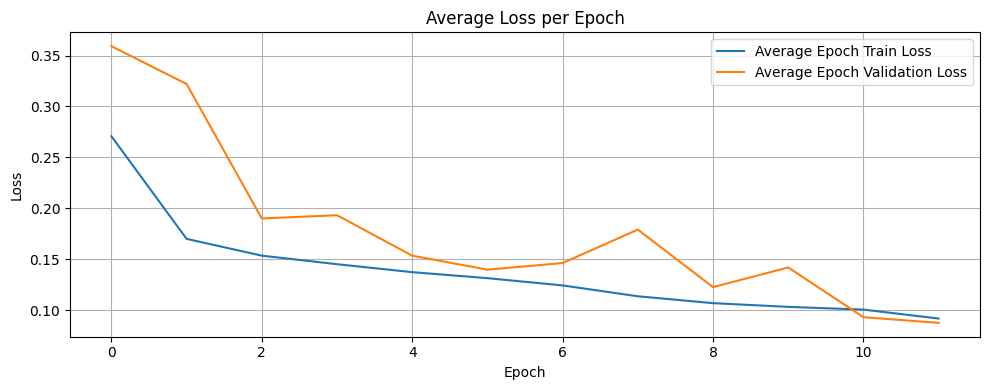

Epoch  13, Batch   1: loss =  0.0886, output_mean =  0.0371, target_mean =  0.0390
Epoch  13, Batch   2: loss =  0.0868, output_mean =  0.0435, target_mean =  0.0375
Epoch  13, Batch   3: loss =  0.0960, output_mean =  0.0418, target_mean =  0.0418
Epoch  13, Batch   4: loss =  0.0800, output_mean =  0.0378, target_mean =  0.0371
Epoch  13, Batch   5: loss =  0.0771, output_mean =  0.0343, target_mean =  0.0313
Epoch  13, Batch   6: loss =  0.0916, output_mean =  0.0319, target_mean =  0.0411
Epoch  13, Batch   7: loss =  0.0999, output_mean =  0.0327, target_mean =  0.0448
Epoch  13, Batch   8: loss =  0.0809, output_mean =  0.0330, target_mean =  0.0355
Epoch  13, Batch   9: loss =  0.0876, output_mean =  0.0412, target_mean =  0.0394
Epoch  13, Batch  10: loss =  0.0860, output_mean =  0.0362, target_mean =  0.0366
Epoch 13 Average Loss: 0.0875 Validation loss: 0.1085
Validation accuracy: 0.9609


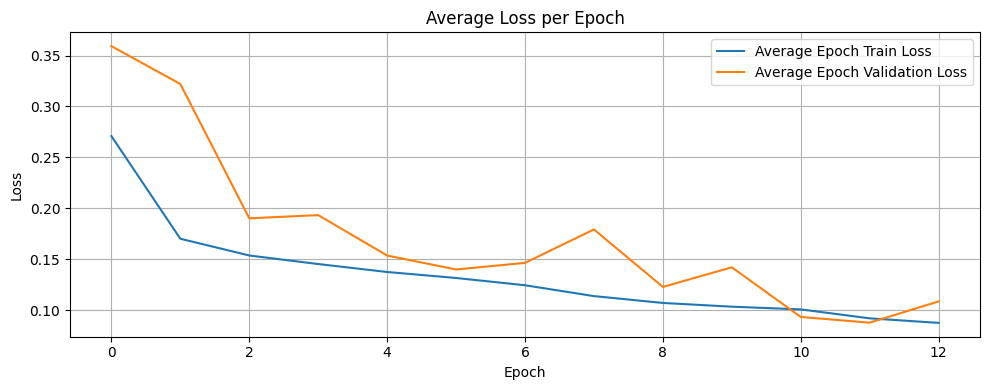

Epoch  14, Batch   1: loss =  0.0899, output_mean =  0.0392, target_mean =  0.0491
Epoch  14, Batch   2: loss =  0.0912, output_mean =  0.0437, target_mean =  0.0386
Epoch  14, Batch   3: loss =  0.0871, output_mean =  0.0371, target_mean =  0.0377
Epoch  14, Batch   4: loss =  0.0806, output_mean =  0.0428, target_mean =  0.0393
Epoch  14, Batch   5: loss =  0.0789, output_mean =  0.0360, target_mean =  0.0347
Epoch  14, Batch   6: loss =  0.0837, output_mean =  0.0310, target_mean =  0.0358
Epoch  14, Batch   7: loss =  0.0863, output_mean =  0.0294, target_mean =  0.0357
Epoch  14, Batch   8: loss =  0.0892, output_mean =  0.0319, target_mean =  0.0430
Epoch  14, Batch   9: loss =  0.0810, output_mean =  0.0386, target_mean =  0.0376
Epoch  14, Batch  10: loss =  0.0791, output_mean =  0.0427, target_mean =  0.0325
Epoch 14 Average Loss: 0.0847 Validation loss: 0.1262
Validation accuracy: 0.9551


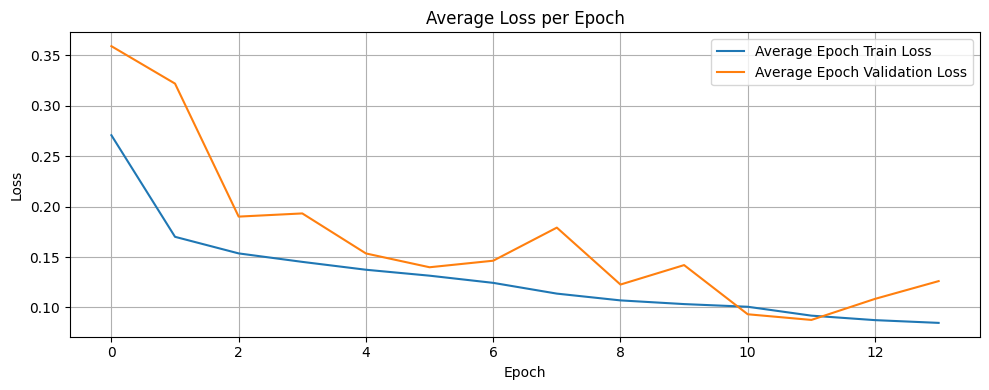

Epoch  15, Batch   1: loss =  0.0872, output_mean =  0.0431, target_mean =  0.0415
Epoch  15, Batch   2: loss =  0.0814, output_mean =  0.0367, target_mean =  0.0410
Epoch  15, Batch   3: loss =  0.0880, output_mean =  0.0366, target_mean =  0.0413
Epoch  15, Batch   4: loss =  0.0740, output_mean =  0.0376, target_mean =  0.0391
Epoch  15, Batch   5: loss =  0.0986, output_mean =  0.0387, target_mean =  0.0413
Epoch  15, Batch   6: loss =  0.0734, output_mean =  0.0322, target_mean =  0.0354
Epoch  15, Batch   7: loss =  0.0737, output_mean =  0.0362, target_mean =  0.0332
Epoch  15, Batch   8: loss =  0.0723, output_mean =  0.0335, target_mean =  0.0331
Epoch  15, Batch   9: loss =  0.0793, output_mean =  0.0317, target_mean =  0.0363
Epoch  15, Batch  10: loss =  0.0930, output_mean =  0.0317, target_mean =  0.0419
Epoch 15 Average Loss: 0.0821 Validation loss: 0.1173
Validation accuracy: 0.9700


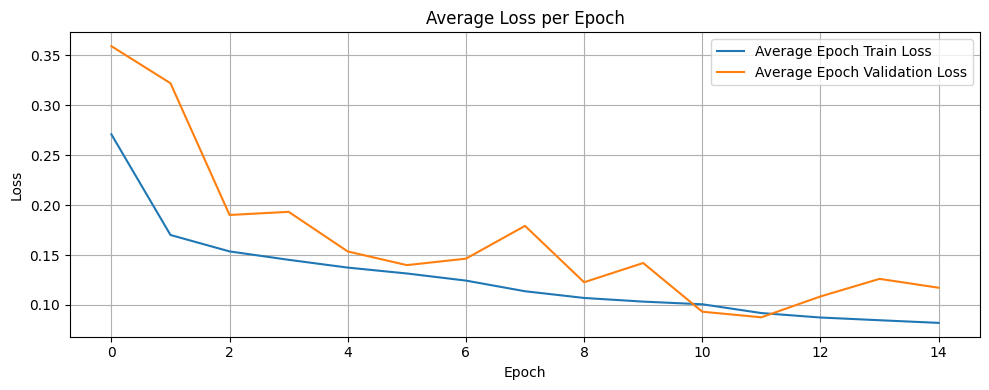

Epoch  16, Batch   1: loss =  0.0831, output_mean =  0.0322, target_mean =  0.0382
Epoch  16, Batch   2: loss =  0.0951, output_mean =  0.0481, target_mean =  0.0491
Epoch  16, Batch   3: loss =  0.0854, output_mean =  0.0489, target_mean =  0.0390
Epoch  16, Batch   4: loss =  0.0851, output_mean =  0.0494, target_mean =  0.0357
Epoch  16, Batch   5: loss =  0.0861, output_mean =  0.0364, target_mean =  0.0412
Epoch  16, Batch   6: loss =  0.0788, output_mean =  0.0263, target_mean =  0.0347
Epoch  16, Batch   7: loss =  0.0828, output_mean =  0.0303, target_mean =  0.0351
Epoch  16, Batch   8: loss =  0.0845, output_mean =  0.0382, target_mean =  0.0350
Epoch  16, Batch   9: loss =  0.0822, output_mean =  0.0389, target_mean =  0.0344
Epoch  16, Batch  10: loss =  0.0785, output_mean =  0.0430, target_mean =  0.0418
Epoch 16 Average Loss: 0.0842 Validation loss: 0.0954
Validation accuracy: 0.9711


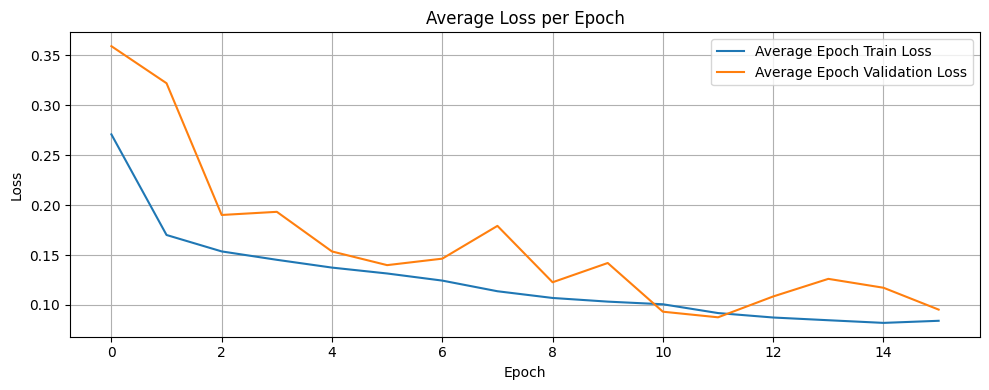

Epoch  17, Batch   1: loss =  0.0916, output_mean =  0.0431, target_mean =  0.0477
Epoch  17, Batch   2: loss =  0.0867, output_mean =  0.0381, target_mean =  0.0406
Epoch  17, Batch   3: loss =  0.0849, output_mean =  0.0383, target_mean =  0.0350
Epoch  17, Batch   4: loss =  0.0809, output_mean =  0.0382, target_mean =  0.0371
Epoch  17, Batch   5: loss =  0.0748, output_mean =  0.0344, target_mean =  0.0378
Epoch  17, Batch   6: loss =  0.0830, output_mean =  0.0339, target_mean =  0.0413
Epoch  17, Batch   7: loss =  0.0697, output_mean =  0.0359, target_mean =  0.0325
Epoch  17, Batch   8: loss =  0.0723, output_mean =  0.0348, target_mean =  0.0334
Epoch  17, Batch   9: loss =  0.0848, output_mean =  0.0353, target_mean =  0.0406
Epoch  17, Batch  10: loss =  0.0748, output_mean =  0.0356, target_mean =  0.0381
Epoch 17 Average Loss: 0.0804 Validation loss: 0.0828
Validation accuracy: 0.9743


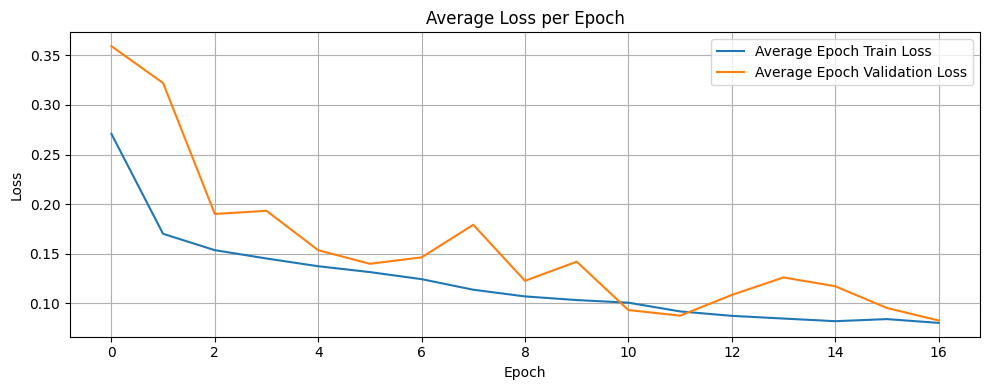

Epoch  18, Batch   1: loss =  0.0745, output_mean =  0.0368, target_mean =  0.0355
Epoch  18, Batch   2: loss =  0.0757, output_mean =  0.0412, target_mean =  0.0374
Epoch  18, Batch   3: loss =  0.0721, output_mean =  0.0362, target_mean =  0.0342
Epoch  18, Batch   4: loss =  0.0824, output_mean =  0.0374, target_mean =  0.0423
Epoch  18, Batch   5: loss =  0.0727, output_mean =  0.0337, target_mean =  0.0370
Epoch  18, Batch   6: loss =  0.0700, output_mean =  0.0386, target_mean =  0.0373
Epoch  18, Batch   7: loss =  0.0761, output_mean =  0.0401, target_mean =  0.0409
Epoch  18, Batch   8: loss =  0.0712, output_mean =  0.0386, target_mean =  0.0386
Epoch  18, Batch   9: loss =  0.0823, output_mean =  0.0393, target_mean =  0.0447
Epoch  18, Batch  10: loss =  0.0696, output_mean =  0.0377, target_mean =  0.0362
Epoch 18 Average Loss: 0.0747 Validation loss: 0.1042
Validation accuracy: 0.9641


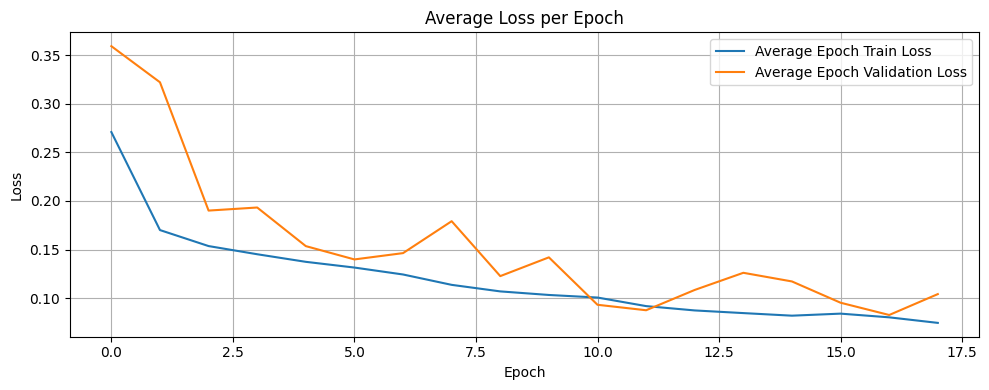

Epoch  19, Batch   1: loss =  0.0762, output_mean =  0.0394, target_mean =  0.0420
Epoch  19, Batch   2: loss =  0.0732, output_mean =  0.0391, target_mean =  0.0417
Epoch  19, Batch   3: loss =  0.0733, output_mean =  0.0386, target_mean =  0.0375
Epoch  19, Batch   4: loss =  0.0775, output_mean =  0.0414, target_mean =  0.0405
Epoch  19, Batch   5: loss =  0.0772, output_mean =  0.0402, target_mean =  0.0420
Epoch  19, Batch   6: loss =  0.0714, output_mean =  0.0402, target_mean =  0.0352
Epoch  19, Batch   7: loss =  0.0722, output_mean =  0.0346, target_mean =  0.0378
Epoch  19, Batch   8: loss =  0.0632, output_mean =  0.0340, target_mean =  0.0364
Epoch  19, Batch   9: loss =  0.0880, output_mean =  0.0373, target_mean =  0.0437
Epoch  19, Batch  10: loss =  0.0674, output_mean =  0.0361, target_mean =  0.0274
Epoch 19 Average Loss: 0.0740 Validation loss: 0.1003
Validation accuracy: 0.9753


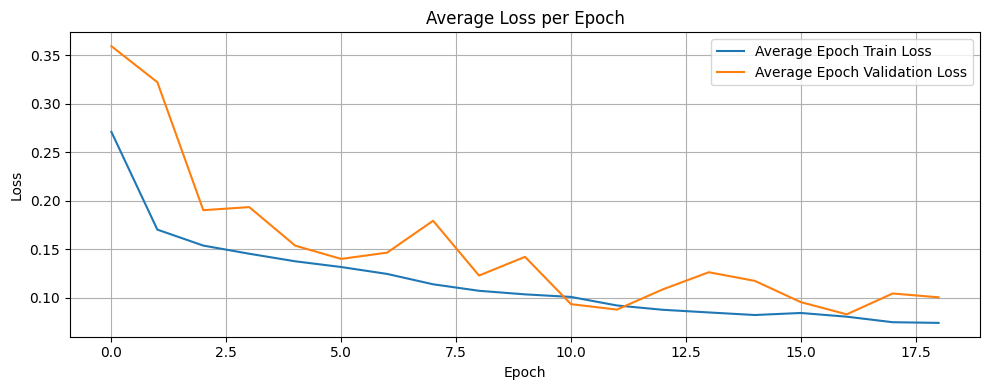

Epoch  20, Batch   1: loss =  0.0642, output_mean =  0.0367, target_mean =  0.0327
Epoch  20, Batch   2: loss =  0.0725, output_mean =  0.0317, target_mean =  0.0377
Epoch  20, Batch   3: loss =  0.0754, output_mean =  0.0295, target_mean =  0.0386
Epoch  20, Batch   4: loss =  0.0711, output_mean =  0.0371, target_mean =  0.0421
Epoch  20, Batch   5: loss =  0.0765, output_mean =  0.0435, target_mean =  0.0476
Epoch  20, Batch   6: loss =  0.0676, output_mean =  0.0456, target_mean =  0.0323
Epoch  20, Batch   7: loss =  0.0738, output_mean =  0.0460, target_mean =  0.0346
Epoch  20, Batch   8: loss =  0.0670, output_mean =  0.0359, target_mean =  0.0389
Epoch  20, Batch   9: loss =  0.0790, output_mean =  0.0324, target_mean =  0.0425
Epoch  20, Batch  10: loss =  0.0707, output_mean =  0.0322, target_mean =  0.0372
Epoch 20 Average Loss: 0.0718 Validation loss: 0.0812
Validation accuracy: 0.9768


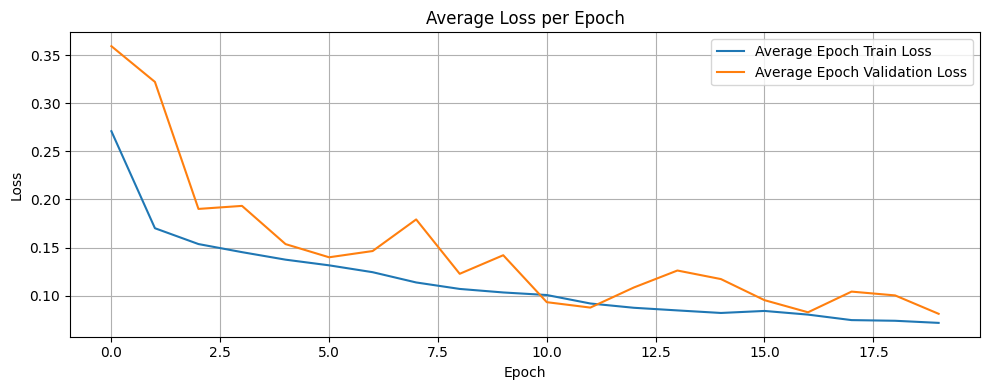

Epoch  21, Batch   1: loss =  0.0772, output_mean =  0.0391, target_mean =  0.0433
Epoch  21, Batch   2: loss =  0.0630, output_mean =  0.0394, target_mean =  0.0320
Epoch  21, Batch   3: loss =  0.0751, output_mean =  0.0430, target_mean =  0.0361
Epoch  21, Batch   4: loss =  0.0654, output_mean =  0.0329, target_mean =  0.0341
Epoch  21, Batch   5: loss =  0.0736, output_mean =  0.0357, target_mean =  0.0438
Epoch  21, Batch   6: loss =  0.0684, output_mean =  0.0330, target_mean =  0.0369
Epoch  21, Batch   7: loss =  0.0798, output_mean =  0.0482, target_mean =  0.0479
Epoch  21, Batch   8: loss =  0.0696, output_mean =  0.0419, target_mean =  0.0335
Epoch  21, Batch   9: loss =  0.0666, output_mean =  0.0361, target_mean =  0.0354
Epoch  21, Batch  10: loss =  0.0665, output_mean =  0.0384, target_mean =  0.0411
Epoch 21 Average Loss: 0.0705 Validation loss: 0.0698
Validation accuracy: 0.9779


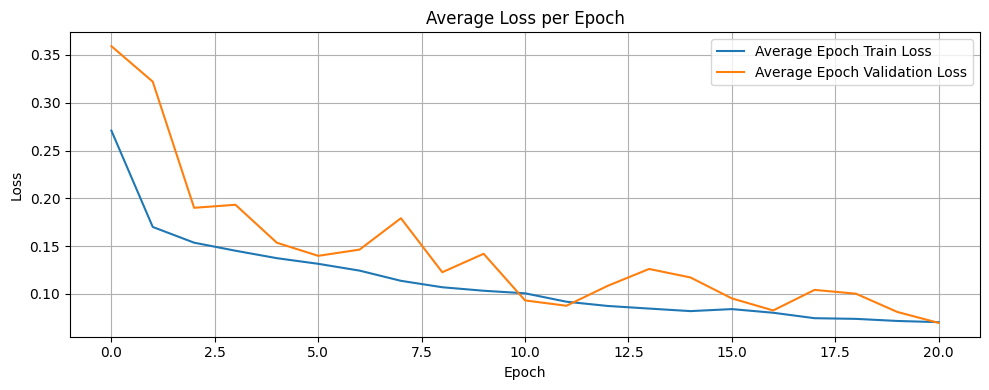

Epoch  22, Batch   1: loss =  0.0647, output_mean =  0.0366, target_mean =  0.0396
Epoch  22, Batch   2: loss =  0.0694, output_mean =  0.0348, target_mean =  0.0414
Epoch  22, Batch   3: loss =  0.0651, output_mean =  0.0383, target_mean =  0.0358
Epoch  22, Batch   4: loss =  0.0649, output_mean =  0.0404, target_mean =  0.0385
Epoch  22, Batch   5: loss =  0.0692, output_mean =  0.0376, target_mean =  0.0394
Epoch  22, Batch   6: loss =  0.0676, output_mean =  0.0347, target_mean =  0.0362
Epoch  22, Batch   7: loss =  0.0663, output_mean =  0.0344, target_mean =  0.0341
Epoch  22, Batch   8: loss =  0.0688, output_mean =  0.0331, target_mean =  0.0396
Epoch  22, Batch   9: loss =  0.0819, output_mean =  0.0398, target_mean =  0.0403
Epoch  22, Batch  10: loss =  0.0666, output_mean =  0.0422, target_mean =  0.0393
Epoch 22 Average Loss: 0.0684 Validation loss: 0.0855
Validation accuracy: 0.9755


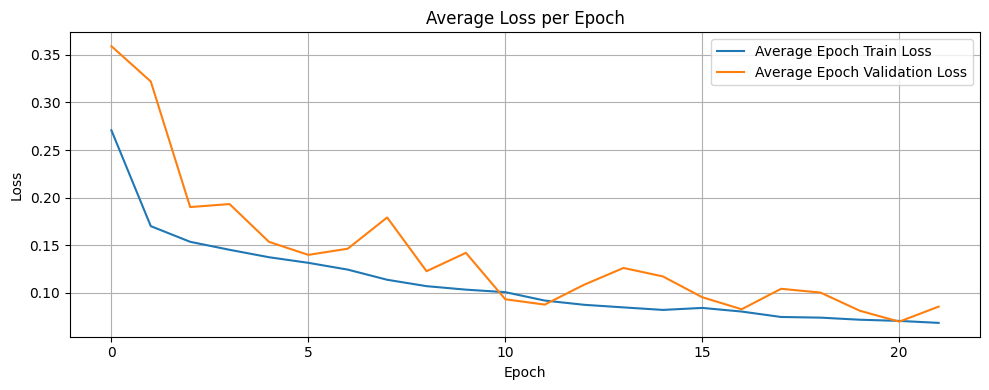

Epoch  23, Batch   1: loss =  0.0721, output_mean =  0.0422, target_mean =  0.0446
Epoch  23, Batch   2: loss =  0.0633, output_mean =  0.0370, target_mean =  0.0336
Epoch  23, Batch   3: loss =  0.0616, output_mean =  0.0407, target_mean =  0.0372
Epoch  23, Batch   4: loss =  0.0656, output_mean =  0.0371, target_mean =  0.0377
Epoch  23, Batch   5: loss =  0.0578, output_mean =  0.0327, target_mean =  0.0317
Epoch  23, Batch   6: loss =  0.0691, output_mean =  0.0350, target_mean =  0.0419
Epoch  23, Batch   7: loss =  0.0691, output_mean =  0.0327, target_mean =  0.0415
Epoch  23, Batch   8: loss =  0.0747, output_mean =  0.0461, target_mean =  0.0452
Epoch  23, Batch   9: loss =  0.0739, output_mean =  0.0535, target_mean =  0.0437
Epoch  23, Batch  10: loss =  0.0648, output_mean =  0.0381, target_mean =  0.0271
Epoch 23 Average Loss: 0.0672 Validation loss: 0.1383
Validation accuracy: 0.9689


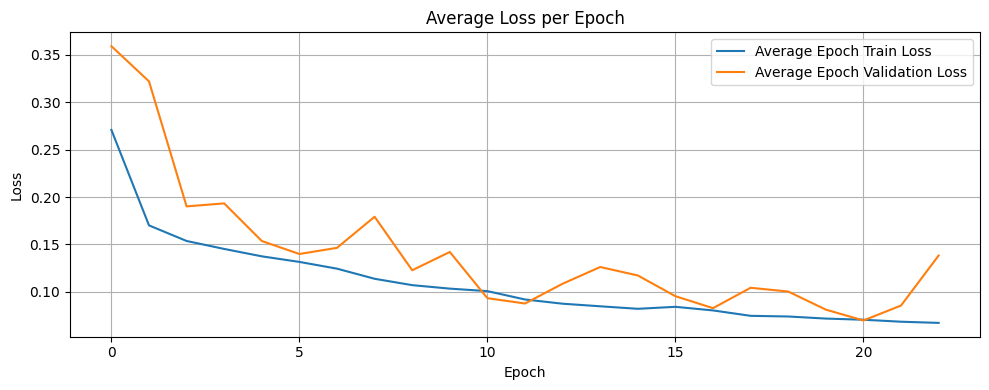

Epoch  24, Batch   1: loss =  0.0746, output_mean =  0.0273, target_mean =  0.0391
Epoch  24, Batch   2: loss =  0.0789, output_mean =  0.0246, target_mean =  0.0384
Epoch  24, Batch   3: loss =  0.0682, output_mean =  0.0349, target_mean =  0.0347
Epoch  24, Batch   4: loss =  0.0688, output_mean =  0.0401, target_mean =  0.0397
Epoch  24, Batch   5: loss =  0.0689, output_mean =  0.0441, target_mean =  0.0402
Epoch  24, Batch   6: loss =  0.0634, output_mean =  0.0456, target_mean =  0.0340
Epoch  24, Batch   7: loss =  0.0658, output_mean =  0.0414, target_mean =  0.0341
Epoch  24, Batch   8: loss =  0.0734, output_mean =  0.0386, target_mean =  0.0479
Epoch  24, Batch   9: loss =  0.0702, output_mean =  0.0348, target_mean =  0.0372
Epoch  24, Batch  10: loss =  0.0717, output_mean =  0.0342, target_mean =  0.0387
Epoch 24 Average Loss: 0.0704 Validation loss: 0.2036
Validation accuracy: 0.9715


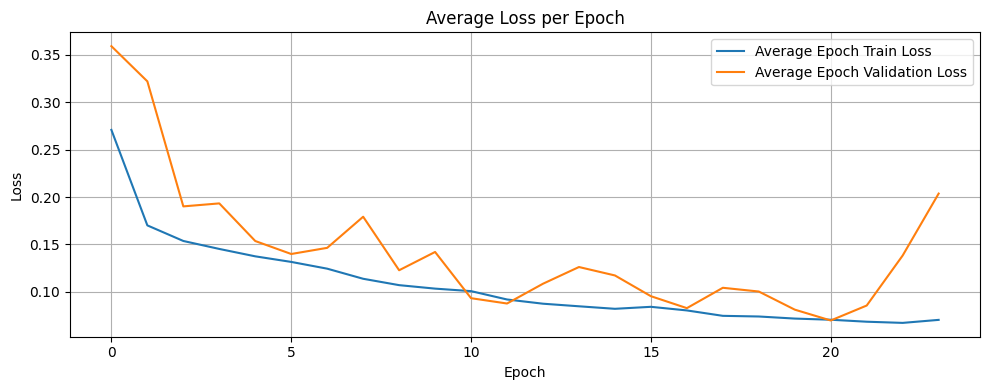

Epoch  25, Batch   1: loss =  0.0792, output_mean =  0.0322, target_mean =  0.0379
Epoch  25, Batch   2: loss =  0.0611, output_mean =  0.0384, target_mean =  0.0389
Epoch  25, Batch   3: loss =  0.0664, output_mean =  0.0420, target_mean =  0.0391
Epoch  25, Batch   4: loss =  0.0741, output_mean =  0.0476, target_mean =  0.0386
Epoch  25, Batch   5: loss =  0.0737, output_mean =  0.0424, target_mean =  0.0424
Epoch  25, Batch   6: loss =  0.0732, output_mean =  0.0345, target_mean =  0.0396
Epoch  25, Batch   7: loss =  0.0638, output_mean =  0.0312, target_mean =  0.0367
Epoch  25, Batch   8: loss =  0.0662, output_mean =  0.0313, target_mean =  0.0337
Epoch  25, Batch   9: loss =  0.0587, output_mean =  0.0390, target_mean =  0.0393
Epoch  25, Batch  10: loss =  0.0691, output_mean =  0.0376, target_mean =  0.0377
Epoch 25 Average Loss: 0.0686 Validation loss: 0.0817
Validation accuracy: 0.9760


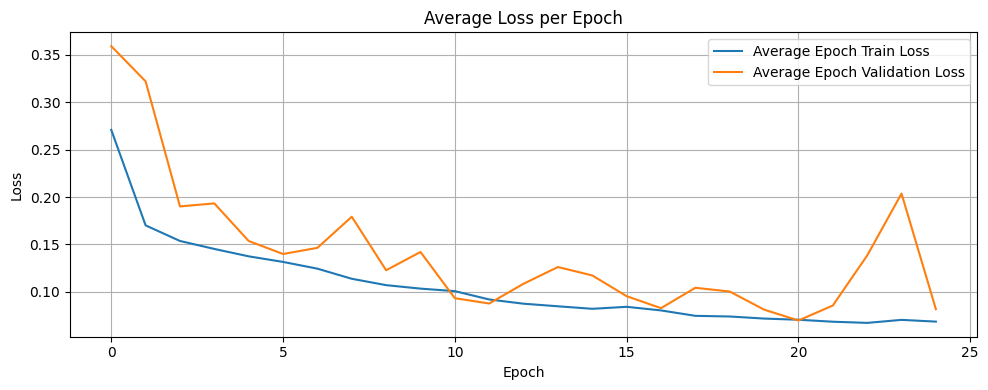

Epoch  26, Batch   1: loss =  0.0799, output_mean =  0.0466, target_mean =  0.0535
Epoch  26, Batch   2: loss =  0.0598, output_mean =  0.0435, target_mean =  0.0336
Epoch  26, Batch   3: loss =  0.0608, output_mean =  0.0397, target_mean =  0.0349
Epoch  26, Batch   4: loss =  0.0606, output_mean =  0.0373, target_mean =  0.0364
Epoch  26, Batch   5: loss =  0.0569, output_mean =  0.0302, target_mean =  0.0337
Epoch  26, Batch   6: loss =  0.0711, output_mean =  0.0319, target_mean =  0.0414
Epoch  26, Batch   7: loss =  0.0609, output_mean =  0.0370, target_mean =  0.0349
Epoch  26, Batch   8: loss =  0.0662, output_mean =  0.0441, target_mean =  0.0398
Epoch  26, Batch   9: loss =  0.0589, output_mean =  0.0356, target_mean =  0.0325
Epoch  26, Batch  10: loss =  0.0661, output_mean =  0.0362, target_mean =  0.0434
Epoch 26 Average Loss: 0.0641 Validation loss: 0.0723
Validation accuracy: 0.9781


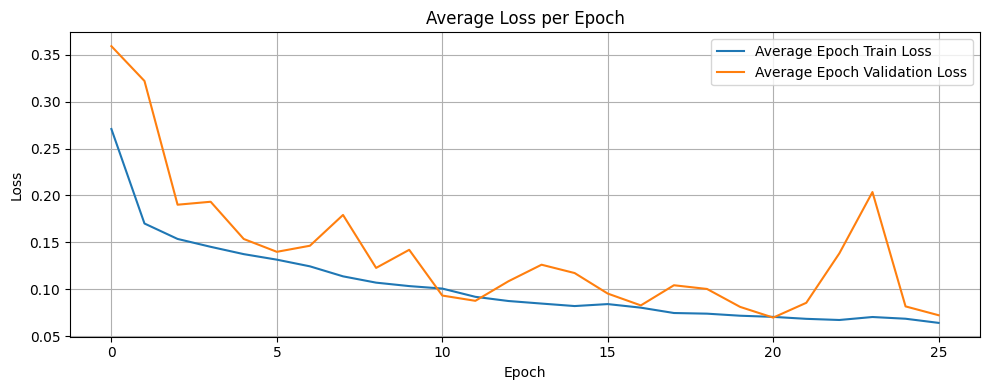

Epoch  27, Batch   1: loss =  0.0653, output_mean =  0.0309, target_mean =  0.0396
Epoch  27, Batch   2: loss =  0.0684, output_mean =  0.0390, target_mean =  0.0420
Epoch  27, Batch   3: loss =  0.0692, output_mean =  0.0521, target_mean =  0.0436
Epoch  27, Batch   4: loss =  0.0572, output_mean =  0.0457, target_mean =  0.0368
Epoch  27, Batch   5: loss =  0.0577, output_mean =  0.0348, target_mean =  0.0375
Epoch  27, Batch   6: loss =  0.0650, output_mean =  0.0320, target_mean =  0.0355
Epoch  27, Batch   7: loss =  0.0667, output_mean =  0.0345, target_mean =  0.0425
Epoch  27, Batch   8: loss =  0.0599, output_mean =  0.0346, target_mean =  0.0348
Epoch  27, Batch   9: loss =  0.0647, output_mean =  0.0385, target_mean =  0.0372
Epoch  27, Batch  10: loss =  0.0563, output_mean =  0.0383, target_mean =  0.0345
Epoch 27 Average Loss: 0.0631 Validation loss: 0.0748
Validation accuracy: 0.9768


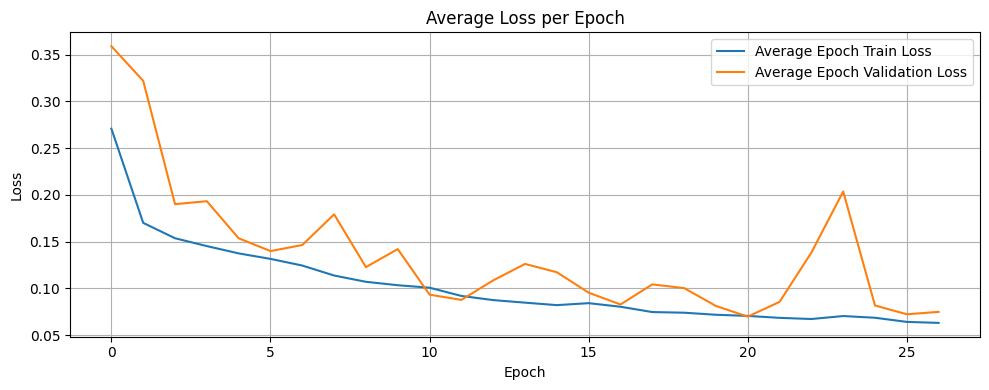

Epoch  28, Batch   1: loss =  0.0622, output_mean =  0.0360, target_mean =  0.0361
Epoch  28, Batch   2: loss =  0.0640, output_mean =  0.0325, target_mean =  0.0350
Epoch  28, Batch   3: loss =  0.0561, output_mean =  0.0309, target_mean =  0.0320
Epoch  28, Batch   4: loss =  0.0647, output_mean =  0.0356, target_mean =  0.0409
Epoch  28, Batch   5: loss =  0.0728, output_mean =  0.0463, target_mean =  0.0416
Epoch  28, Batch   6: loss =  0.0704, output_mean =  0.0471, target_mean =  0.0455
Epoch  28, Batch   7: loss =  0.0608, output_mean =  0.0366, target_mean =  0.0398
Epoch  28, Batch   8: loss =  0.0620, output_mean =  0.0368, target_mean =  0.0368
Epoch  28, Batch   9: loss =  0.0600, output_mean =  0.0357, target_mean =  0.0386
Epoch  28, Batch  10: loss =  0.0598, output_mean =  0.0398, target_mean =  0.0379
Epoch 28 Average Loss: 0.0633 Validation loss: 0.1098
Validation accuracy: 0.9604


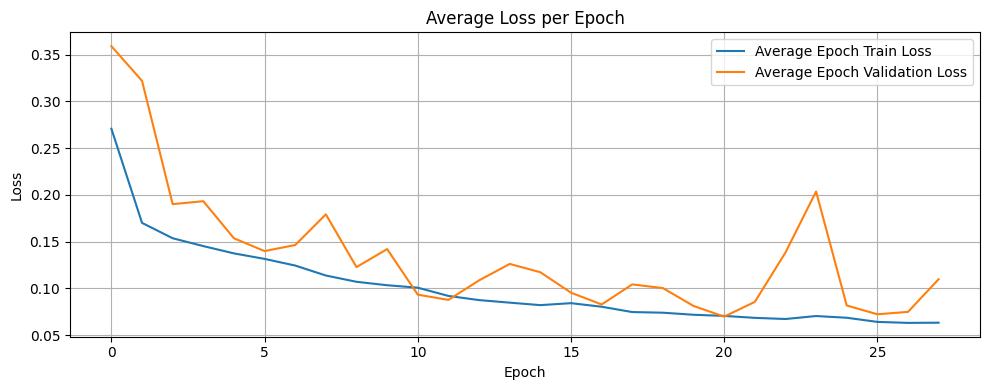

Epoch  29, Batch   1: loss =  0.0608, output_mean =  0.0436, target_mean =  0.0398
Epoch  29, Batch   2: loss =  0.0589, output_mean =  0.0386, target_mean =  0.0383
Epoch  29, Batch   3: loss =  0.0679, output_mean =  0.0359, target_mean =  0.0366
Epoch  29, Batch   4: loss =  0.0621, output_mean =  0.0295, target_mean =  0.0338
Epoch  29, Batch   5: loss =  0.0671, output_mean =  0.0342, target_mean =  0.0409
Epoch  29, Batch   6: loss =  0.0630, output_mean =  0.0409, target_mean =  0.0353
Epoch  29, Batch   7: loss =  0.0562, output_mean =  0.0373, target_mean =  0.0362
Epoch  29, Batch   8: loss =  0.0660, output_mean =  0.0394, target_mean =  0.0419
Epoch  29, Batch   9: loss =  0.0676, output_mean =  0.0354, target_mean =  0.0422
Epoch  29, Batch  10: loss =  0.0698, output_mean =  0.0399, target_mean =  0.0390
Epoch 29 Average Loss: 0.0639 Validation loss: 0.0656
Validation accuracy: 0.9795


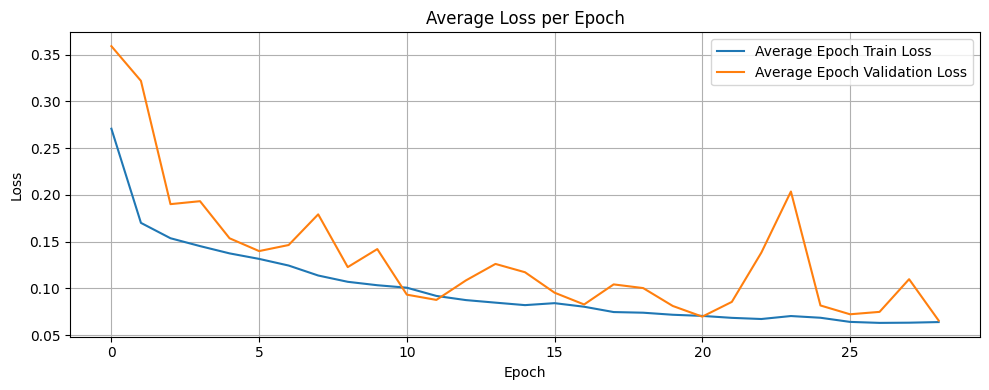

Epoch  30, Batch   1: loss =  0.0606, output_mean =  0.0446, target_mean =  0.0370
Epoch  30, Batch   2: loss =  0.0636, output_mean =  0.0416, target_mean =  0.0391
Epoch  30, Batch   3: loss =  0.0596, output_mean =  0.0369, target_mean =  0.0379
Epoch  30, Batch   4: loss =  0.0665, output_mean =  0.0392, target_mean =  0.0454
Epoch  30, Batch   5: loss =  0.0648, output_mean =  0.0407, target_mean =  0.0413
Epoch  30, Batch   6: loss =  0.0526, output_mean =  0.0380, target_mean =  0.0369
Epoch  30, Batch   7: loss =  0.0676, output_mean =  0.0379, target_mean =  0.0365
Epoch  30, Batch   8: loss =  0.0534, output_mean =  0.0330, target_mean =  0.0341
Epoch  30, Batch   9: loss =  0.0611, output_mean =  0.0356, target_mean =  0.0373
Epoch  30, Batch  10: loss =  0.0588, output_mean =  0.0367, target_mean =  0.0388
Epoch 30 Average Loss: 0.0609 Validation loss: 0.0666
Validation accuracy: 0.9796


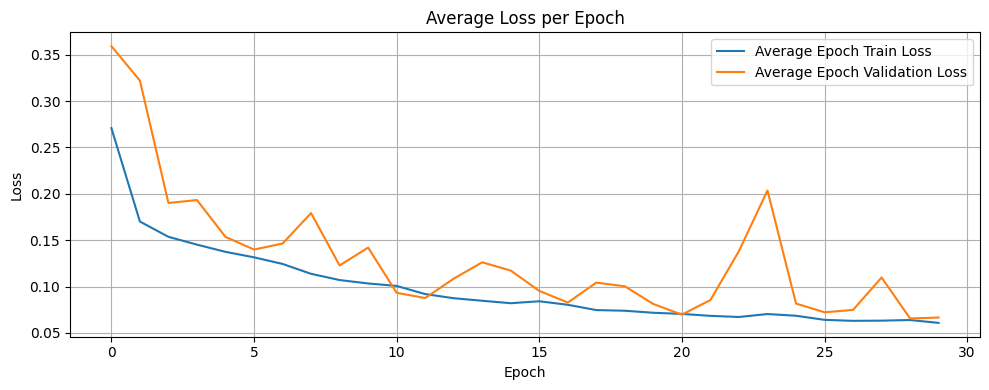

Epoch  31, Batch   1: loss =  0.0572, output_mean =  0.0348, target_mean =  0.0331
Epoch  31, Batch   2: loss =  0.0629, output_mean =  0.0340, target_mean =  0.0376
Epoch  31, Batch   3: loss =  0.0578, output_mean =  0.0382, target_mean =  0.0400
Epoch  31, Batch   4: loss =  0.0590, output_mean =  0.0405, target_mean =  0.0359
Epoch  31, Batch   5: loss =  0.0528, output_mean =  0.0402, target_mean =  0.0392
Epoch  31, Batch   6: loss =  0.0615, output_mean =  0.0404, target_mean =  0.0442
Epoch  31, Batch   7: loss =  0.0582, output_mean =  0.0366, target_mean =  0.0387
Epoch  31, Batch   8: loss =  0.0645, output_mean =  0.0346, target_mean =  0.0382
Epoch  31, Batch   9: loss =  0.0650, output_mean =  0.0382, target_mean =  0.0428
Epoch  31, Batch  10: loss =  0.0598, output_mean =  0.0383, target_mean =  0.0344
Epoch 31 Average Loss: 0.0599 Validation loss: 0.0733
Validation accuracy: 0.9774


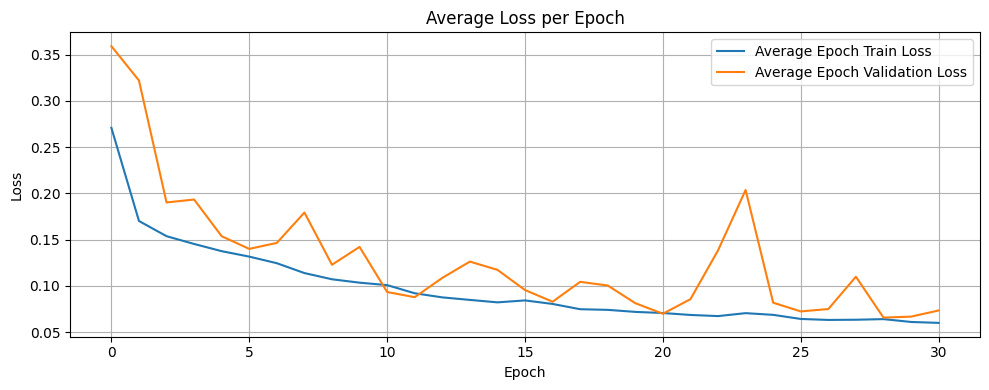

Epoch  32, Batch   1: loss =  0.0585, output_mean =  0.0456, target_mean =  0.0429
Epoch  32, Batch   2: loss =  0.0647, output_mean =  0.0438, target_mean =  0.0378
Epoch  32, Batch   3: loss =  0.0612, output_mean =  0.0362, target_mean =  0.0394
Epoch  32, Batch   4: loss =  0.0665, output_mean =  0.0355, target_mean =  0.0439
Epoch  32, Batch   5: loss =  0.0563, output_mean =  0.0346, target_mean =  0.0335
Epoch  32, Batch   6: loss =  0.0582, output_mean =  0.0385, target_mean =  0.0389
Epoch  32, Batch   7: loss =  0.0570, output_mean =  0.0384, target_mean =  0.0349
Epoch  32, Batch   8: loss =  0.0633, output_mean =  0.0372, target_mean =  0.0348
Epoch  32, Batch   9: loss =  0.0598, output_mean =  0.0395, target_mean =  0.0386
Epoch  32, Batch  10: loss =  0.0567, output_mean =  0.0359, target_mean =  0.0395
Epoch 32 Average Loss: 0.0602 Validation loss: 0.0776
Validation accuracy: 0.9793


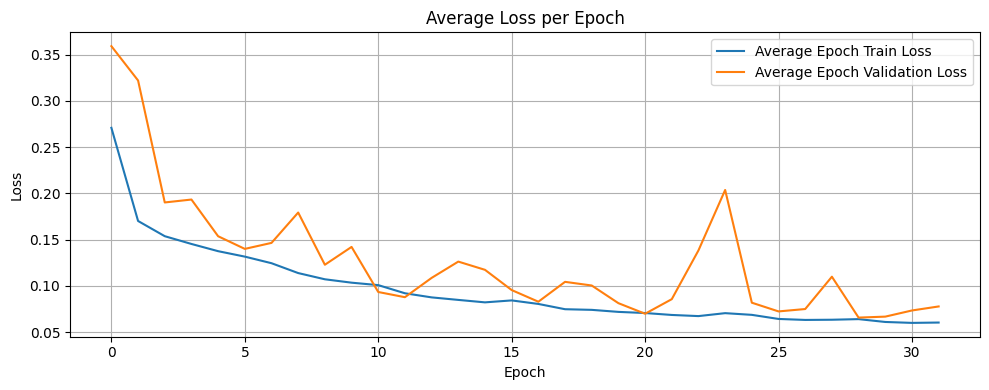

Epoch  33, Batch   1: loss =  0.0607, output_mean =  0.0386, target_mean =  0.0395
Epoch  33, Batch   2: loss =  0.0643, output_mean =  0.0368, target_mean =  0.0386
Epoch  33, Batch   3: loss =  0.0589, output_mean =  0.0317, target_mean =  0.0352
Epoch  33, Batch   4: loss =  0.0563, output_mean =  0.0377, target_mean =  0.0399
Epoch  33, Batch   5: loss =  0.0593, output_mean =  0.0373, target_mean =  0.0386
Epoch  33, Batch   6: loss =  0.0551, output_mean =  0.0386, target_mean =  0.0286
Epoch  33, Batch   7: loss =  0.0578, output_mean =  0.0366, target_mean =  0.0405
Epoch  33, Batch   8: loss =  0.0640, output_mean =  0.0360, target_mean =  0.0443
Epoch  33, Batch   9: loss =  0.0604, output_mean =  0.0383, target_mean =  0.0392
Epoch  33, Batch  10: loss =  0.0580, output_mean =  0.0460, target_mean =  0.0397
Epoch 33 Average Loss: 0.0595 Validation loss: 0.0626
Validation accuracy: 0.9798


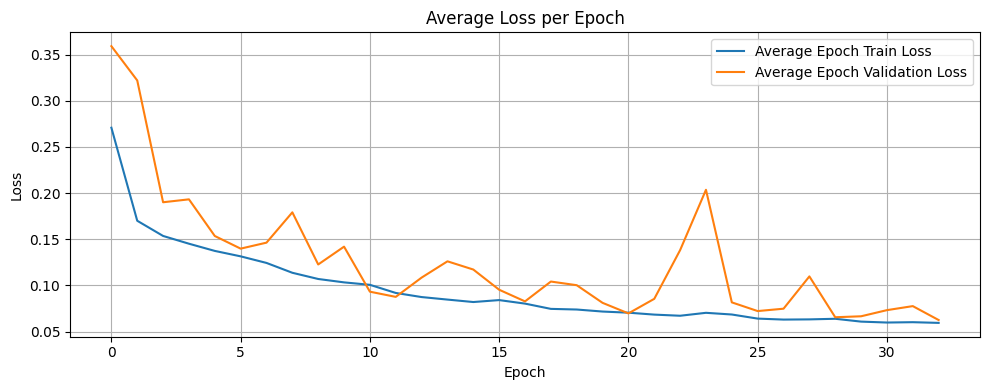

Epoch  34, Batch   1: loss =  0.0634, output_mean =  0.0413, target_mean =  0.0428
Epoch  34, Batch   2: loss =  0.0540, output_mean =  0.0321, target_mean =  0.0307
Epoch  34, Batch   3: loss =  0.0619, output_mean =  0.0355, target_mean =  0.0393
Epoch  34, Batch   4: loss =  0.0631, output_mean =  0.0372, target_mean =  0.0393
Epoch  34, Batch   5: loss =  0.0515, output_mean =  0.0411, target_mean =  0.0318
Epoch  34, Batch   6: loss =  0.0633, output_mean =  0.0417, target_mean =  0.0416
Epoch  34, Batch   7: loss =  0.0610, output_mean =  0.0352, target_mean =  0.0395
Epoch  34, Batch   8: loss =  0.0632, output_mean =  0.0343, target_mean =  0.0388
Epoch  34, Batch   9: loss =  0.0534, output_mean =  0.0329, target_mean =  0.0354
Epoch  34, Batch  10: loss =  0.0649, output_mean =  0.0470, target_mean =  0.0449
Epoch 34 Average Loss: 0.0600 Validation loss: 0.0797
Validation accuracy: 0.9738


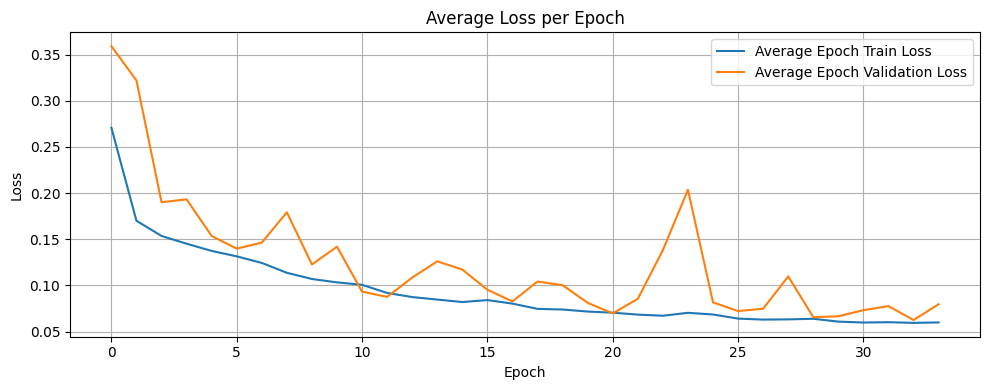

Epoch  35, Batch   1: loss =  0.0567, output_mean =  0.0418, target_mean =  0.0410
Epoch  35, Batch   2: loss =  0.0611, output_mean =  0.0382, target_mean =  0.0368
Epoch  35, Batch   3: loss =  0.0595, output_mean =  0.0364, target_mean =  0.0363
Epoch  35, Batch   4: loss =  0.0522, output_mean =  0.0331, target_mean =  0.0341
Epoch  35, Batch   5: loss =  0.0590, output_mean =  0.0341, target_mean =  0.0398
Epoch  35, Batch   6: loss =  0.0681, output_mean =  0.0401, target_mean =  0.0417
Epoch  35, Batch   7: loss =  0.0560, output_mean =  0.0390, target_mean =  0.0307
Epoch  35, Batch   8: loss =  0.0662, output_mean =  0.0398, target_mean =  0.0464
Epoch  35, Batch   9: loss =  0.0531, output_mean =  0.0339, target_mean =  0.0355
Epoch  35, Batch  10: loss =  0.0609, output_mean =  0.0380, target_mean =  0.0418
Epoch 35 Average Loss: 0.0593 Validation loss: 0.0839
Validation accuracy: 0.9709


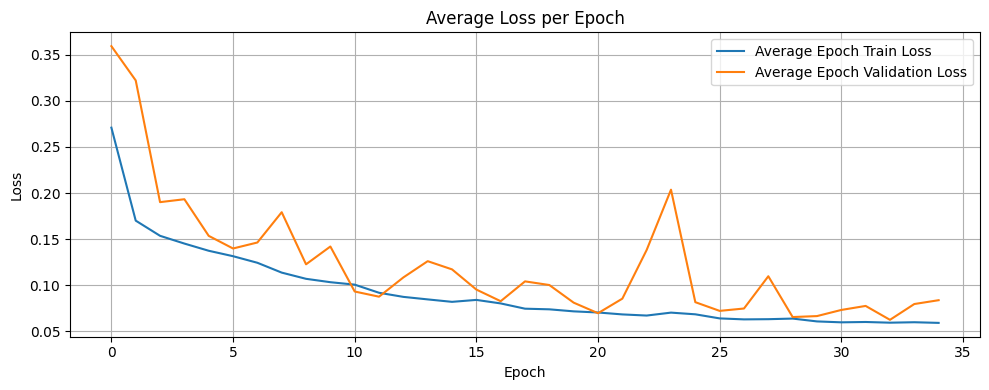

Epoch  36, Batch   1: loss =  0.0607, output_mean =  0.0424, target_mean =  0.0407
Epoch  36, Batch   2: loss =  0.0573, output_mean =  0.0462, target_mean =  0.0374
Epoch  36, Batch   3: loss =  0.0603, output_mean =  0.0424, target_mean =  0.0442
Epoch  36, Batch   4: loss =  0.0584, output_mean =  0.0349, target_mean =  0.0404
Epoch  36, Batch   5: loss =  0.0547, output_mean =  0.0355, target_mean =  0.0382
Epoch  36, Batch   6: loss =  0.0604, output_mean =  0.0403, target_mean =  0.0390
Epoch  36, Batch   7: loss =  0.0538, output_mean =  0.0370, target_mean =  0.0362
Epoch  36, Batch   8: loss =  0.0565, output_mean =  0.0367, target_mean =  0.0349
Epoch  36, Batch   9: loss =  0.0579, output_mean =  0.0321, target_mean =  0.0356
Epoch  36, Batch  10: loss =  0.0573, output_mean =  0.0349, target_mean =  0.0376
Epoch 36 Average Loss: 0.0577 Validation loss: 0.0636
Validation accuracy: 0.9797


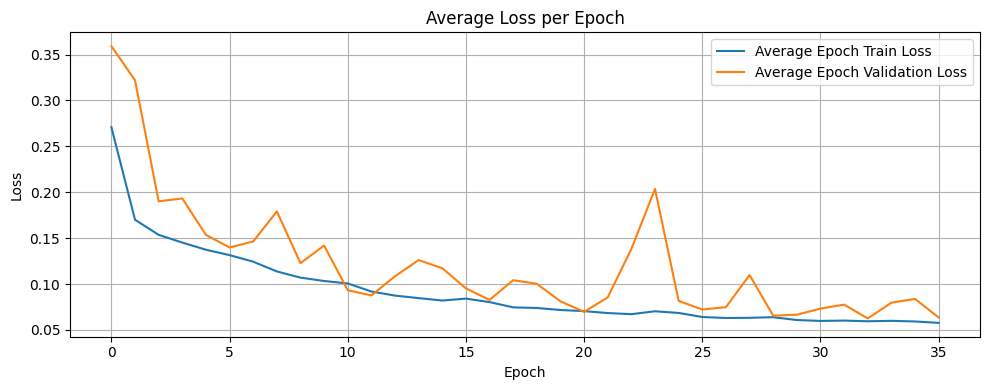

Epoch  37, Batch   1: loss =  0.0569, output_mean =  0.0367, target_mean =  0.0369
Epoch  37, Batch   2: loss =  0.0554, output_mean =  0.0436, target_mean =  0.0433
Epoch  37, Batch   3: loss =  0.0537, output_mean =  0.0383, target_mean =  0.0372
Epoch  37, Batch   4: loss =  0.0544, output_mean =  0.0443, target_mean =  0.0428
Epoch  37, Batch   5: loss =  0.0661, output_mean =  0.0387, target_mean =  0.0357
Epoch  37, Batch   6: loss =  0.0527, output_mean =  0.0339, target_mean =  0.0360
Epoch  37, Batch   7: loss =  0.0657, output_mean =  0.0354, target_mean =  0.0405
Epoch  37, Batch   8: loss =  0.0645, output_mean =  0.0343, target_mean =  0.0414
Epoch  37, Batch   9: loss =  0.0606, output_mean =  0.0399, target_mean =  0.0384
Epoch  37, Batch  10: loss =  0.0546, output_mean =  0.0387, target_mean =  0.0318
Epoch 37 Average Loss: 0.0584 Validation loss: 0.0742
Validation accuracy: 0.9750


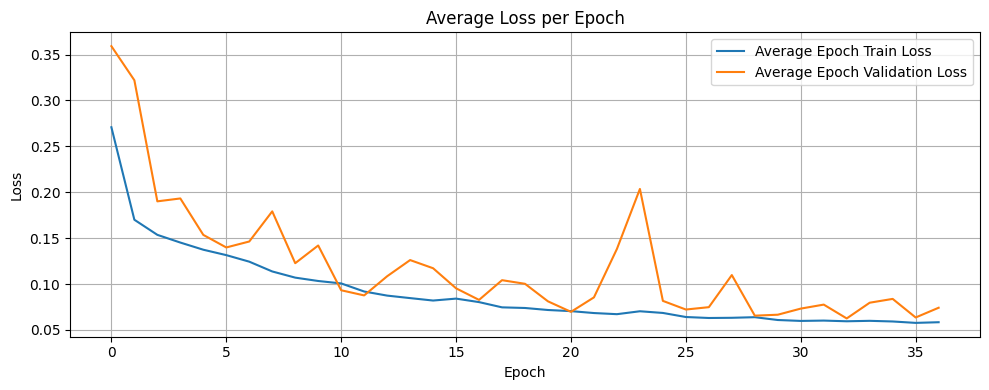

Epoch  38, Batch   1: loss =  0.0551, output_mean =  0.0443, target_mean =  0.0401
Epoch  38, Batch   2: loss =  0.0563, output_mean =  0.0408, target_mean =  0.0422
Epoch  38, Batch   3: loss =  0.0673, output_mean =  0.0359, target_mean =  0.0407
Epoch  38, Batch   4: loss =  0.0619, output_mean =  0.0399, target_mean =  0.0405
Epoch  38, Batch   5: loss =  0.0556, output_mean =  0.0375, target_mean =  0.0341
Epoch  38, Batch   6: loss =  0.0564, output_mean =  0.0374, target_mean =  0.0393
Epoch  38, Batch   7: loss =  0.0557, output_mean =  0.0367, target_mean =  0.0379
Epoch  38, Batch   8: loss =  0.0626, output_mean =  0.0358, target_mean =  0.0333
Epoch  38, Batch   9: loss =  0.0574, output_mean =  0.0343, target_mean =  0.0384
Epoch  38, Batch  10: loss =  0.0575, output_mean =  0.0397, target_mean =  0.0376
Epoch 38 Average Loss: 0.0586 Validation loss: 0.1234
Validation accuracy: 0.9706


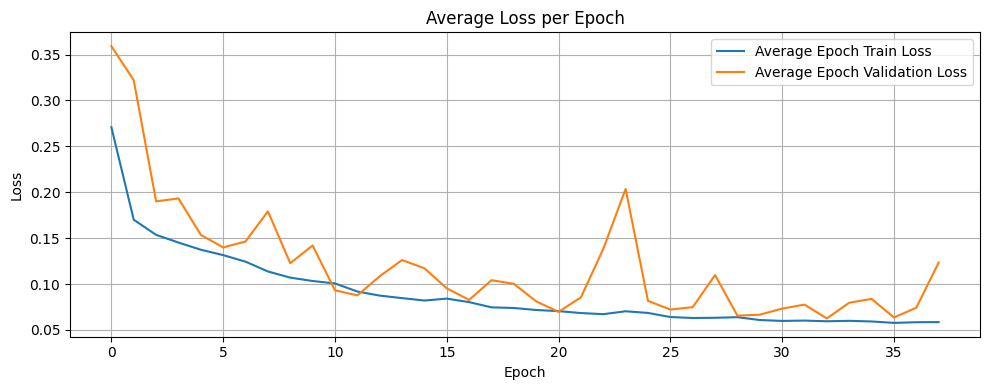

Epoch  39, Batch   1: loss =  0.0598, output_mean =  0.0411, target_mean =  0.0445
Epoch  39, Batch   2: loss =  0.0499, output_mean =  0.0350, target_mean =  0.0361
Epoch  39, Batch   3: loss =  0.0603, output_mean =  0.0339, target_mean =  0.0411
Epoch  39, Batch   4: loss =  0.0539, output_mean =  0.0418, target_mean =  0.0370
Epoch  39, Batch   5: loss =  0.0610, output_mean =  0.0485, target_mean =  0.0429
Epoch  39, Batch   6: loss =  0.0589, output_mean =  0.0471, target_mean =  0.0435
Epoch  39, Batch   7: loss =  0.0458, output_mean =  0.0301, target_mean =  0.0291
Epoch  39, Batch   8: loss =  0.0585, output_mean =  0.0323, target_mean =  0.0408
Epoch  39, Batch   9: loss =  0.0538, output_mean =  0.0264, target_mean =  0.0317
Epoch  39, Batch  10: loss =  0.0541, output_mean =  0.0360, target_mean =  0.0374
Epoch 39 Average Loss: 0.0556 Validation loss: 0.0643
Validation accuracy: 0.9798


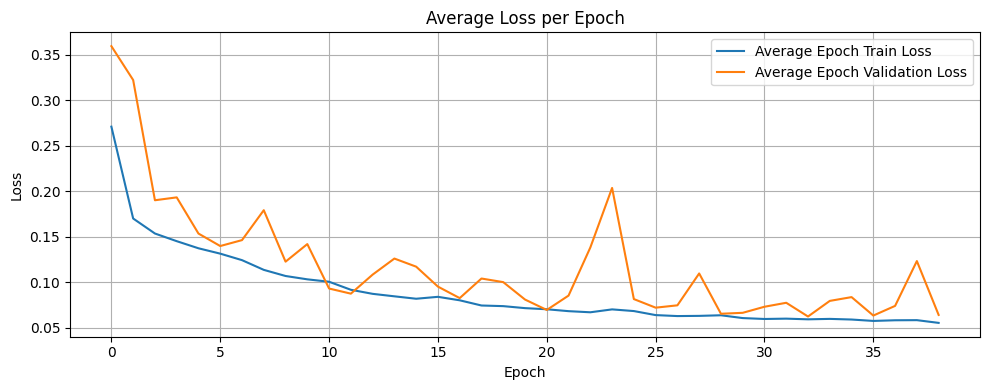

Epoch  40, Batch   1: loss =  0.0565, output_mean =  0.0474, target_mean =  0.0413
Epoch  40, Batch   2: loss =  0.0546, output_mean =  0.0428, target_mean =  0.0370
Epoch  40, Batch   3: loss =  0.0515, output_mean =  0.0371, target_mean =  0.0373
Epoch  40, Batch   4: loss =  0.0542, output_mean =  0.0340, target_mean =  0.0390
Epoch  40, Batch   5: loss =  0.0559, output_mean =  0.0328, target_mean =  0.0400
Epoch  40, Batch   6: loss =  0.0541, output_mean =  0.0333, target_mean =  0.0354
Epoch  40, Batch   7: loss =  0.0562, output_mean =  0.0433, target_mean =  0.0450
Epoch  40, Batch   8: loss =  0.0550, output_mean =  0.0421, target_mean =  0.0377
Epoch  40, Batch   9: loss =  0.0611, output_mean =  0.0430, target_mean =  0.0366
Epoch  40, Batch  10: loss =  0.0562, output_mean =  0.0380, target_mean =  0.0350
Epoch 40 Average Loss: 0.0555 Validation loss: 0.1324
Validation accuracy: 0.9719


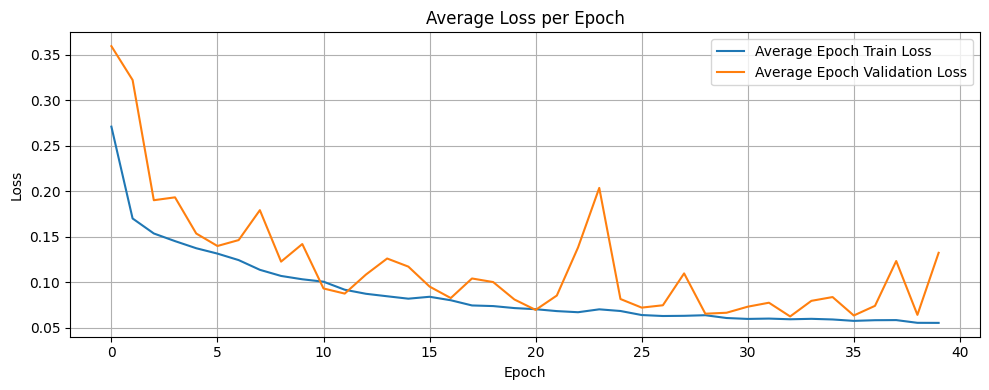

Epoch  41, Batch   1: loss =  0.0580, output_mean =  0.0390, target_mean =  0.0415
Epoch  41, Batch   2: loss =  0.0530, output_mean =  0.0287, target_mean =  0.0307
Epoch  41, Batch   3: loss =  0.0629, output_mean =  0.0388, target_mean =  0.0420
Epoch  41, Batch   4: loss =  0.0479, output_mean =  0.0273, target_mean =  0.0318
Epoch  41, Batch   5: loss =  0.0609, output_mean =  0.0332, target_mean =  0.0414
Epoch  41, Batch   6: loss =  0.0516, output_mean =  0.0388, target_mean =  0.0361
Epoch  41, Batch   7: loss =  0.0568, output_mean =  0.0416, target_mean =  0.0343
Epoch  41, Batch   8: loss =  0.0568, output_mean =  0.0465, target_mean =  0.0400
Epoch  41, Batch   9: loss =  0.0572, output_mean =  0.0405, target_mean =  0.0431
Epoch  41, Batch  10: loss =  0.0571, output_mean =  0.0377, target_mean =  0.0431
Epoch 41 Average Loss: 0.0562 Validation loss: 0.0592
Validation accuracy: 0.9811


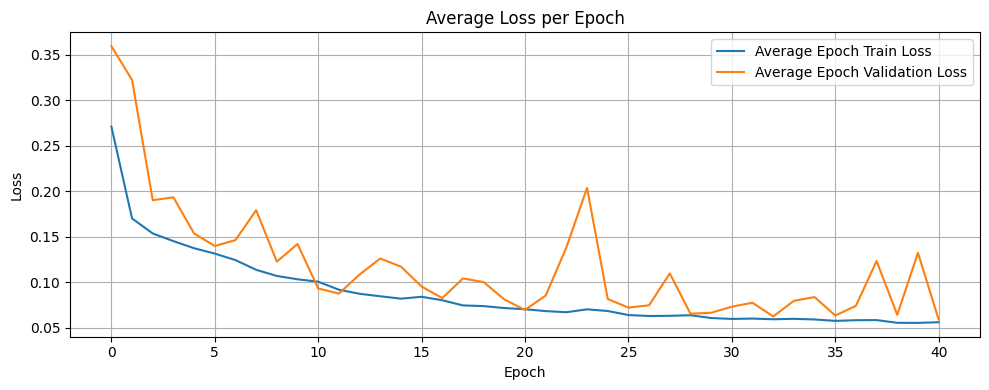

Epoch  42, Batch   1: loss =  0.0623, output_mean =  0.0432, target_mean =  0.0451
Epoch  42, Batch   2: loss =  0.0542, output_mean =  0.0372, target_mean =  0.0316
Epoch  42, Batch   3: loss =  0.0477, output_mean =  0.0254, target_mean =  0.0275
Epoch  42, Batch   4: loss =  0.0787, output_mean =  0.0385, target_mean =  0.0495
Epoch  42, Batch   5: loss =  0.0564, output_mean =  0.0375, target_mean =  0.0351
Epoch  42, Batch   6: loss =  0.0570, output_mean =  0.0439, target_mean =  0.0427
Epoch  42, Batch   7: loss =  0.0556, output_mean =  0.0429, target_mean =  0.0340
Epoch  42, Batch   8: loss =  0.0638, output_mean =  0.0445, target_mean =  0.0447
Epoch  42, Batch   9: loss =  0.0511, output_mean =  0.0358, target_mean =  0.0349
Epoch  42, Batch  10: loss =  0.0598, output_mean =  0.0319, target_mean =  0.0389
Epoch 42 Average Loss: 0.0587 Validation loss: 0.0992
Validation accuracy: 0.9622


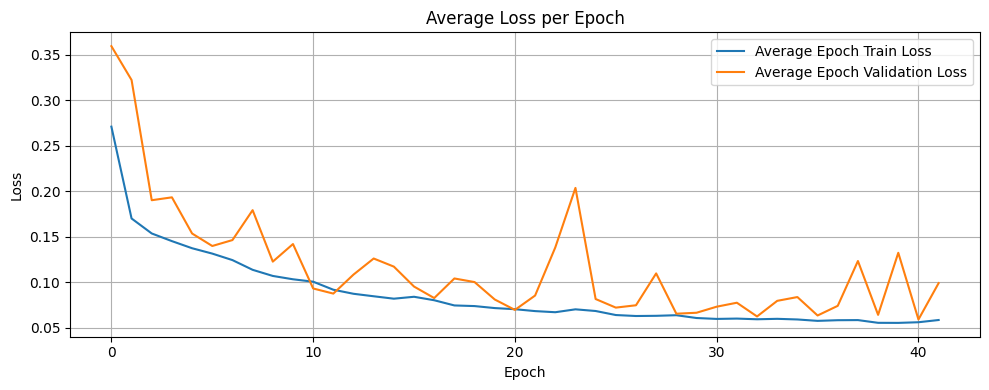

Epoch  43, Batch   1: loss =  0.0576, output_mean =  0.0322, target_mean =  0.0386
Epoch  43, Batch   2: loss =  0.0633, output_mean =  0.0480, target_mean =  0.0437
Epoch  43, Batch   3: loss =  0.0602, output_mean =  0.0477, target_mean =  0.0382
Epoch  43, Batch   4: loss =  0.0592, output_mean =  0.0330, target_mean =  0.0335
Epoch  43, Batch   5: loss =  0.0500, output_mean =  0.0248, target_mean =  0.0285
Epoch  43, Batch   6: loss =  0.0629, output_mean =  0.0294, target_mean =  0.0403
Epoch  43, Batch   7: loss =  0.0604, output_mean =  0.0395, target_mean =  0.0438
Epoch  43, Batch   8: loss =  0.0636, output_mean =  0.0484, target_mean =  0.0435
Epoch  43, Batch   9: loss =  0.0566, output_mean =  0.0422, target_mean =  0.0364
Epoch  43, Batch  10: loss =  0.0522, output_mean =  0.0414, target_mean =  0.0376
Epoch 43 Average Loss: 0.0586 Validation loss: 0.2026
Validation accuracy: 0.9098


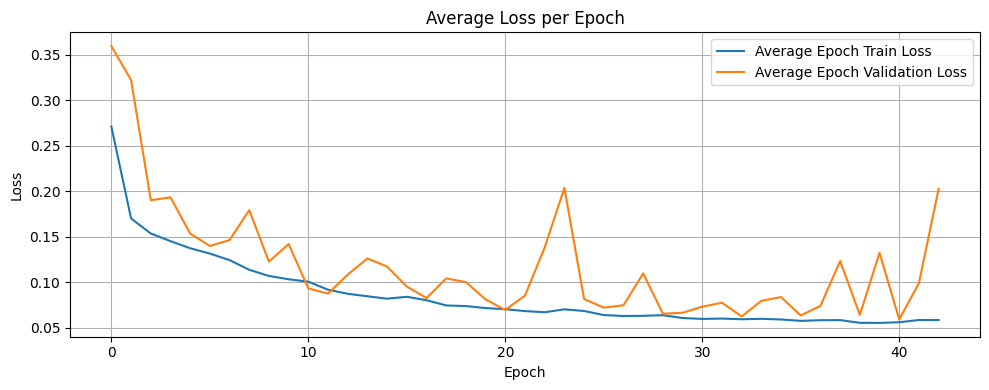

Epoch  44, Batch   1: loss =  0.0661, output_mean =  0.0381, target_mean =  0.0422
Epoch  44, Batch   2: loss =  0.0621, output_mean =  0.0343, target_mean =  0.0378
Epoch  44, Batch   3: loss =  0.0528, output_mean =  0.0354, target_mean =  0.0319
Epoch  44, Batch   4: loss =  0.0577, output_mean =  0.0391, target_mean =  0.0372
Epoch  44, Batch   5: loss =  0.0559, output_mean =  0.0396, target_mean =  0.0410
Epoch  44, Batch   6: loss =  0.0487, output_mean =  0.0337, target_mean =  0.0335
Epoch  44, Batch   7: loss =  0.0622, output_mean =  0.0357, target_mean =  0.0422
Epoch  44, Batch   8: loss =  0.0599, output_mean =  0.0391, target_mean =  0.0428
Epoch  44, Batch   9: loss =  0.0521, output_mean =  0.0400, target_mean =  0.0320
Epoch  44, Batch  10: loss =  0.0546, output_mean =  0.0428, target_mean =  0.0436
Epoch 44 Average Loss: 0.0572 Validation loss: 0.0779
Validation accuracy: 0.9770


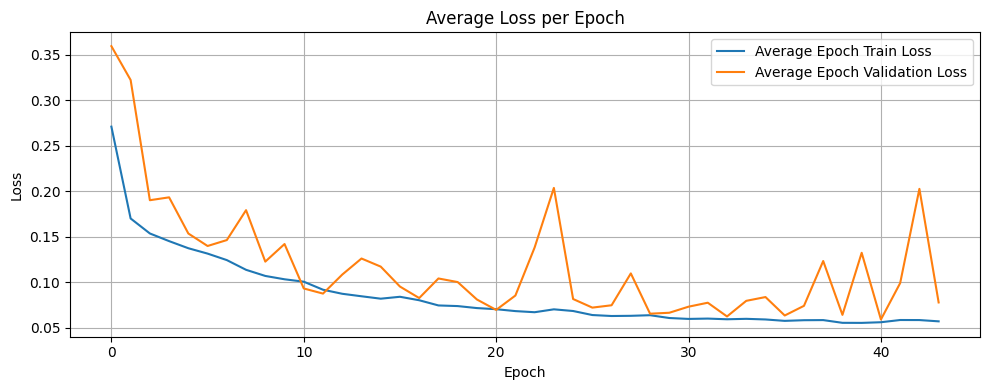

Epoch  45, Batch   1: loss =  0.0536, output_mean =  0.0419, target_mean =  0.0382
Epoch  45, Batch   2: loss =  0.0529, output_mean =  0.0346, target_mean =  0.0362
Epoch  45, Batch   3: loss =  0.0591, output_mean =  0.0324, target_mean =  0.0389
Epoch  45, Batch   4: loss =  0.0573, output_mean =  0.0342, target_mean =  0.0423
Epoch  45, Batch   5: loss =  0.0504, output_mean =  0.0412, target_mean =  0.0382
Epoch  45, Batch   6: loss =  0.0544, output_mean =  0.0445, target_mean =  0.0366
Epoch  45, Batch   7: loss =  0.0558, output_mean =  0.0450, target_mean =  0.0397
Epoch  45, Batch   8: loss =  0.0574, output_mean =  0.0334, target_mean =  0.0360
Epoch  45, Batch   9: loss =  0.0559, output_mean =  0.0344, target_mean =  0.0363
Epoch  45, Batch  10: loss =  0.0612, output_mean =  0.0414, target_mean =  0.0417
Epoch 45 Average Loss: 0.0558 Validation loss: 0.0843
Validation accuracy: 0.9790


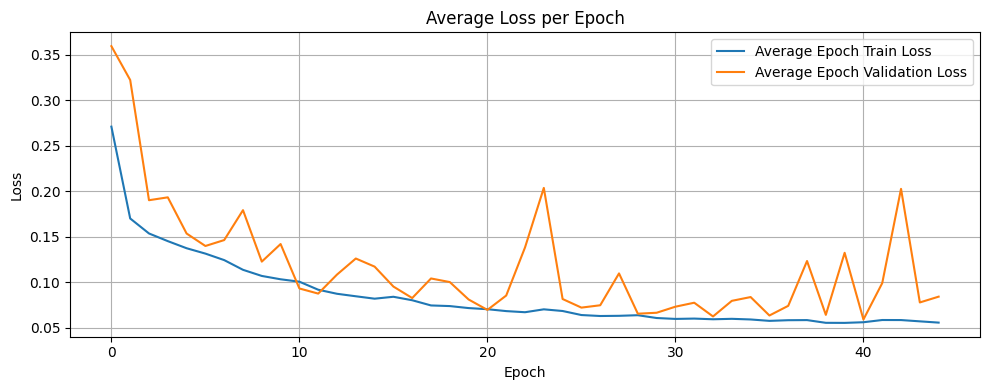

Epoch  46, Batch   1: loss =  0.0482, output_mean =  0.0329, target_mean =  0.0350
Epoch  46, Batch   2: loss =  0.0574, output_mean =  0.0370, target_mean =  0.0411
Epoch  46, Batch   3: loss =  0.0526, output_mean =  0.0372, target_mean =  0.0379
Epoch  46, Batch   4: loss =  0.0512, output_mean =  0.0415, target_mean =  0.0423
Epoch  46, Batch   5: loss =  0.0559, output_mean =  0.0456, target_mean =  0.0443
Epoch  46, Batch   6: loss =  0.0519, output_mean =  0.0392, target_mean =  0.0323
Epoch  46, Batch   7: loss =  0.0591, output_mean =  0.0406, target_mean =  0.0424
Epoch  46, Batch   8: loss =  0.0540, output_mean =  0.0334, target_mean =  0.0363
Epoch  46, Batch   9: loss =  0.0516, output_mean =  0.0299, target_mean =  0.0327
Epoch  46, Batch  10: loss =  0.0554, output_mean =  0.0351, target_mean =  0.0400
Epoch 46 Average Loss: 0.0537 Validation loss: 0.0863
Validation accuracy: 0.9782


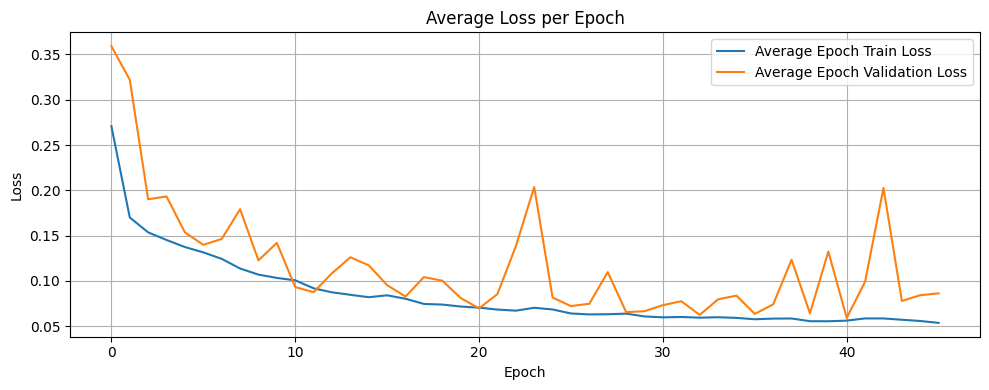

Epoch  47, Batch   1: loss =  0.0599, output_mean =  0.0432, target_mean =  0.0441
Epoch  47, Batch   2: loss =  0.0525, output_mean =  0.0328, target_mean =  0.0338
Epoch  47, Batch   3: loss =  0.0582, output_mean =  0.0404, target_mean =  0.0425
Epoch  47, Batch   4: loss =  0.0558, output_mean =  0.0448, target_mean =  0.0443
Epoch  47, Batch   5: loss =  0.0684, output_mean =  0.0495, target_mean =  0.0364
Epoch  47, Batch   6: loss =  0.0518, output_mean =  0.0436, target_mean =  0.0425
Epoch  47, Batch   7: loss =  0.0695, output_mean =  0.0340, target_mean =  0.0384
Epoch  47, Batch   8: loss =  0.0553, output_mean =  0.0313, target_mean =  0.0358
Epoch  47, Batch   9: loss =  0.0504, output_mean =  0.0307, target_mean =  0.0337
Epoch  47, Batch  10: loss =  0.0531, output_mean =  0.0294, target_mean =  0.0325
Epoch 47 Average Loss: 0.0575 Validation loss: 0.1019
Validation accuracy: 0.9726


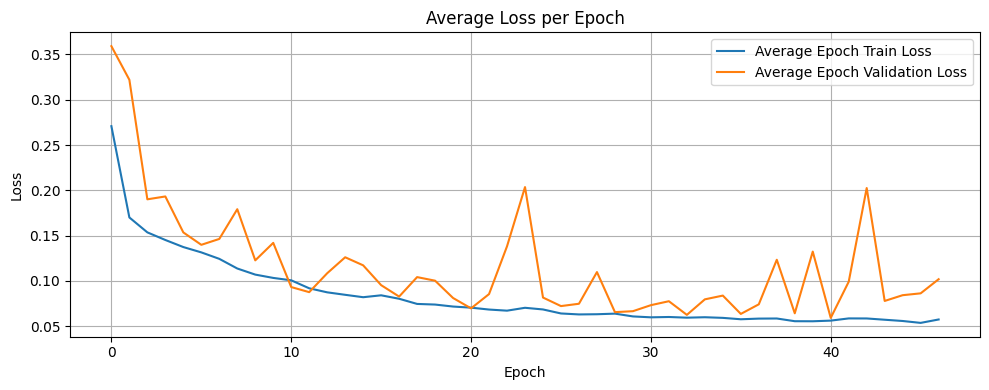

Epoch  48, Batch   1: loss =  0.0725, output_mean =  0.0433, target_mean =  0.0405
Epoch  48, Batch   2: loss =  0.0562, output_mean =  0.0361, target_mean =  0.0373
Epoch  48, Batch   3: loss =  0.0592, output_mean =  0.0360, target_mean =  0.0338
Epoch  48, Batch   4: loss =  0.0769, output_mean =  0.0342, target_mean =  0.0404
Epoch  48, Batch   5: loss =  0.0681, output_mean =  0.0410, target_mean =  0.0393
Epoch  48, Batch   6: loss =  0.0603, output_mean =  0.0442, target_mean =  0.0423
Epoch  48, Batch   7: loss =  0.0496, output_mean =  0.0409, target_mean =  0.0381
Epoch  48, Batch   8: loss =  0.0527, output_mean =  0.0390, target_mean =  0.0386
Epoch  48, Batch   9: loss =  0.0550, output_mean =  0.0342, target_mean =  0.0355
Epoch  48, Batch  10: loss =  0.0635, output_mean =  0.0357, target_mean =  0.0384
Epoch 48 Average Loss: 0.0614 Validation loss: 0.0955
Validation accuracy: 0.9643


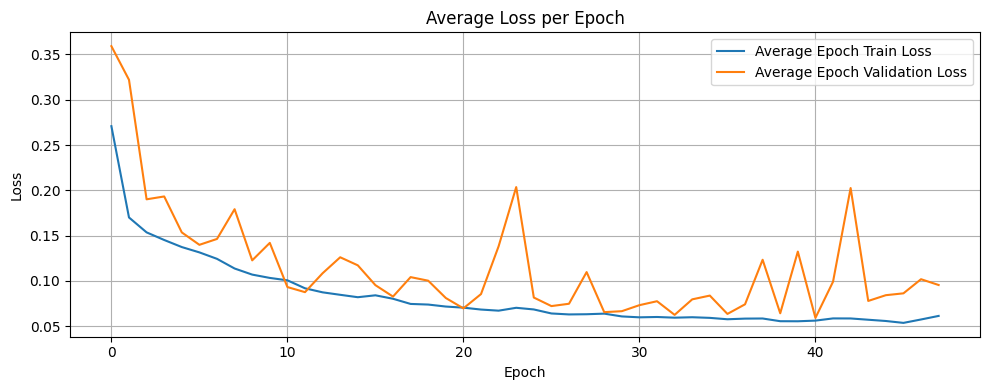

Epoch  49, Batch   1: loss =  0.0588, output_mean =  0.0394, target_mean =  0.0395
Epoch  49, Batch   2: loss =  0.0617, output_mean =  0.0368, target_mean =  0.0342
Epoch  49, Batch   3: loss =  0.0521, output_mean =  0.0423, target_mean =  0.0369
Epoch  49, Batch   4: loss =  0.0689, output_mean =  0.0403, target_mean =  0.0368
Epoch  49, Batch   5: loss =  0.0656, output_mean =  0.0331, target_mean =  0.0425
Epoch  49, Batch   6: loss =  0.0544, output_mean =  0.0349, target_mean =  0.0371
Epoch  49, Batch   7: loss =  0.0623, output_mean =  0.0432, target_mean =  0.0475
Epoch  49, Batch   8: loss =  0.0561, output_mean =  0.0473, target_mean =  0.0348
Epoch  49, Batch   9: loss =  0.0563, output_mean =  0.0402, target_mean =  0.0344
Epoch  49, Batch  10: loss =  0.0582, output_mean =  0.0373, target_mean =  0.0404
Epoch 49 Average Loss: 0.0595 Validation loss: 0.0786
Validation accuracy: 0.9764


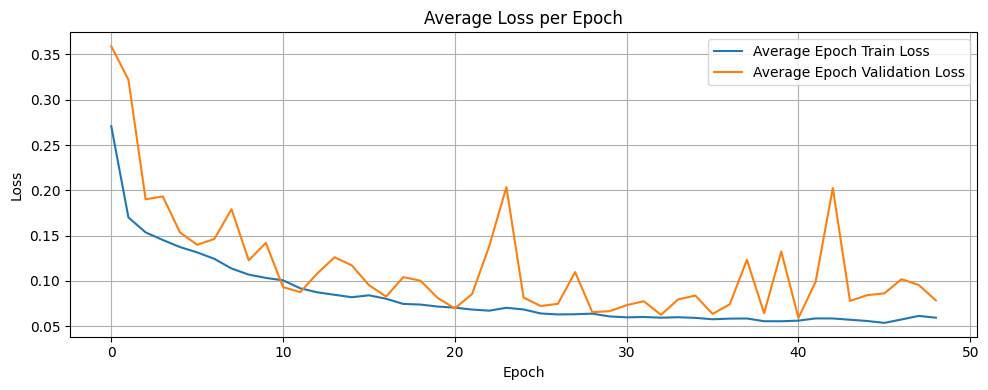

Epoch  50, Batch   1: loss =  0.0626, output_mean =  0.0357, target_mean =  0.0420
Epoch  50, Batch   2: loss =  0.0602, output_mean =  0.0335, target_mean =  0.0422
Epoch  50, Batch   3: loss =  0.0545, output_mean =  0.0366, target_mean =  0.0377
Epoch  50, Batch   4: loss =  0.0618, output_mean =  0.0425, target_mean =  0.0382
Epoch  50, Batch   5: loss =  0.0618, output_mean =  0.0427, target_mean =  0.0384
Epoch  50, Batch   6: loss =  0.0523, output_mean =  0.0362, target_mean =  0.0344
Epoch  50, Batch   7: loss =  0.0645, output_mean =  0.0366, target_mean =  0.0433
Epoch  50, Batch   8: loss =  0.0526, output_mean =  0.0354, target_mean =  0.0400
Epoch  50, Batch   9: loss =  0.0569, output_mean =  0.0411, target_mean =  0.0369
Epoch  50, Batch  10: loss =  0.0531, output_mean =  0.0394, target_mean =  0.0311
Epoch 50 Average Loss: 0.0580 Validation loss: 0.0665
Validation accuracy: 0.9798


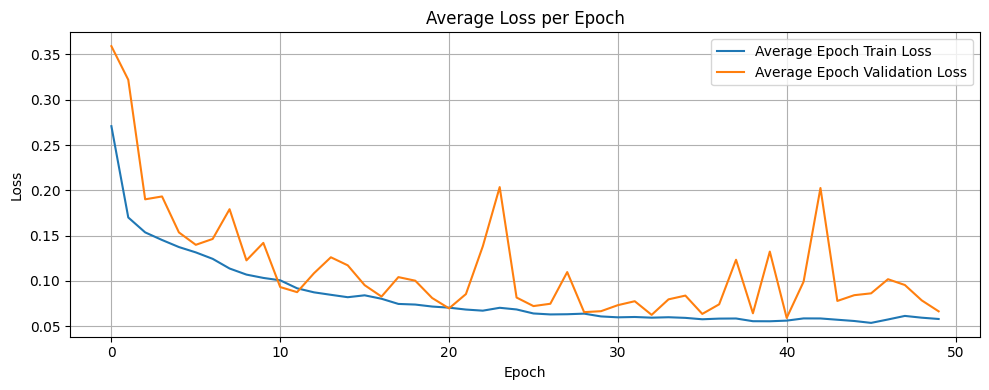

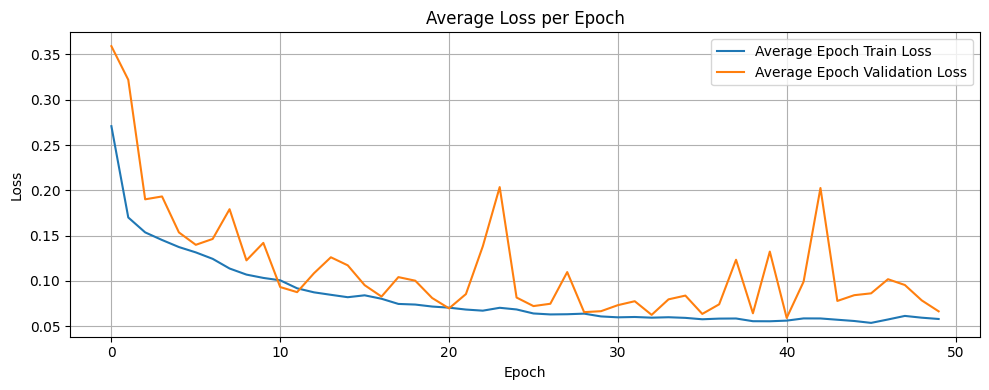

In [ ]:
def savePlot(epoch, batch_id, output, target):
    # Compare results
    output_image = torch.sigmoid(output[-1]).cpu().detach().numpy()
    target_image = target[-1].cpu().detach().numpy()

    _, axes = plt.subplots(1, 2, figsize=(20, 10))
    axes[0].imshow(output_image.squeeze(), cmap='gray')
    axes[0].set_title(f"Epoch {epoch + 1} - Output Image")
    axes[0].axis("off")

    axes[1].imshow(target_image.squeeze(), cmap='gray')
    axes[1].set_title("Target Image")
    axes[1].axis("off")

    plt.tight_layout()
    plotDirectory = f"{trainDirectory}/epoch{epoch + 1}"
    os.makedirs(plotDirectory, exist_ok=True)
    plt.savefig(plotDirectory + f"/batch_{batch_id + 1}.png")
    plt.close()

def validate_segmentation_model(model, validation_loader, criterion, device):
    """
    Validates a segmentation model and returns the average loss and accuracy.

    Args:
        model (torch.nn.Module): The segmentation model.
        validation_loader (DataLoader): The data loader for the validation set.
        criterion (torch.nn.Module): The loss function.
        device (str): The device to run the validation on ('cuda' or 'cpu').

    Returns:
        tuple: A tuple containing the average loss and accuracy.
    """
    model.eval()
    total_loss = 0.0
    correct_pixels = 0
    total_pixels = 0

    with torch.no_grad():
        for _, (images, masks) in enumerate(validation_loader):
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)

            total_loss += loss.item()

            predicted_masks = (torch.sigmoid(outputs) > 0.5).float()
            correct_pixels += (predicted_masks == masks).sum().item()
            total_pixels += masks.numel()

    avg_loss = total_loss / len(validation_loader)
    accuracy = correct_pixels / total_pixels

    return avg_loss, accuracy

losses = []
epoch_losses = []
validation_epoch_losses = []
epochs = 50
trainDirectory = "D:/COMP9444/spallsV1/training"
os.makedirs(trainDirectory, exist_ok=True)

for epoch in range(epochs):
    epoch_loss_total = 0
    num_batches = 0
    model.train()
    for batch_id, (data, target) in enumerate(train_loader):
        data = data.to(device)
        target = target.to(device)

        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        num_batches += 1

        loss.backward()
        optimizer.step()
        epoch_loss_total += loss.item()

        
        # Save and print loss
        losses.append(loss.item())
        print('Epoch %3d, Batch %3d: loss = %7.4f, output_mean = %7.4f, target_mean = %7.4f' %
        (epoch + 1, batch_id + 1, loss.item(), torch.sigmoid(output).mean().item(), target.mean().item()))
        savePlot(epoch, batch_id, output, target)

       
    # Validation step
    avg_validation_epoch_loss, val_accuracy = validate_segmentation_model(model, validation_loader, criterion, device)


    # Compute and log average loss for this epoch
    avg_epoch_loss = epoch_loss_total / num_batches
    epoch_losses.append(avg_epoch_loss)
    validation_epoch_losses.append(avg_validation_epoch_loss)
    print(f"Epoch {epoch + 1} Average Loss: {avg_epoch_loss:.4f} Validation loss: {avg_validation_epoch_loss:.4f}")
    print(f"Validation accuracy: {val_accuracy:.4f}")
    plt.figure(figsize=(10, 4))
    plt.plot(epoch_losses, label='Average Epoch Train Loss')
    plt.plot(validation_epoch_losses, label='Average Epoch Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Average Loss per Epoch')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


plt.figure(figsize=(10, 4))
plt.plot(epoch_losses, label='Average Epoch Train Loss')
plt.plot(validation_epoch_losses, label='Average Epoch Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Average Loss per Epoch')
plt.legend()
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig(trainDirectory + "/epochLoss.png")


## 3.5. Download model (optional)

In [ ]:
torch.save(model.state_dict(), "finalSpalls.pth")

## 3.6. Test model

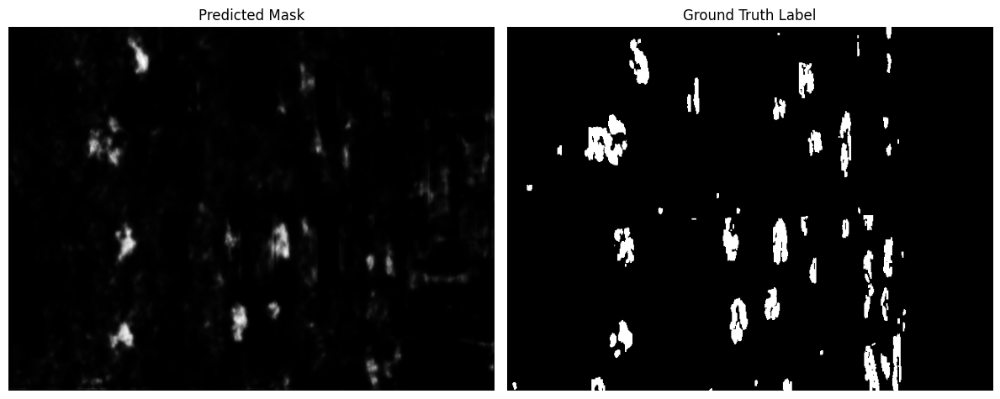

{'iou': 0.5836742520332336, 'precision': 0.7680497169494629, 'recall': 0.7085738778114319, 'f1': 0.7371140122413635}


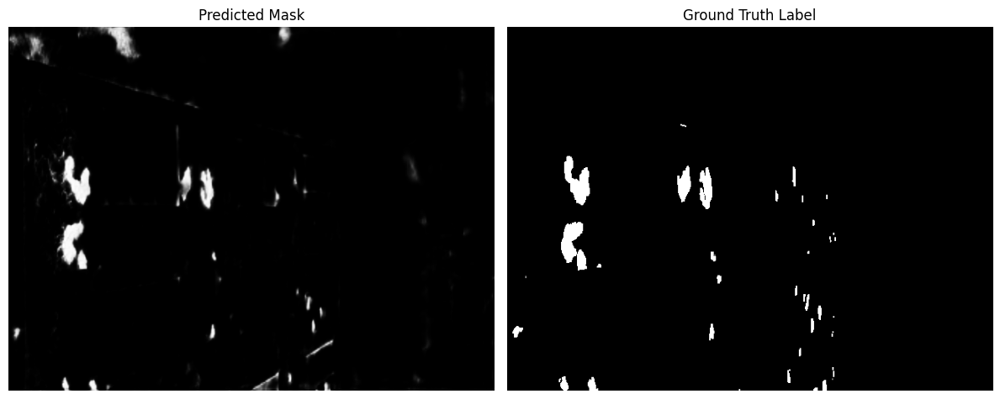

{'iou': 0.5888503193855286, 'precision': 0.7618382573127747, 'recall': 0.721703827381134, 'f1': 0.7412281632423401}


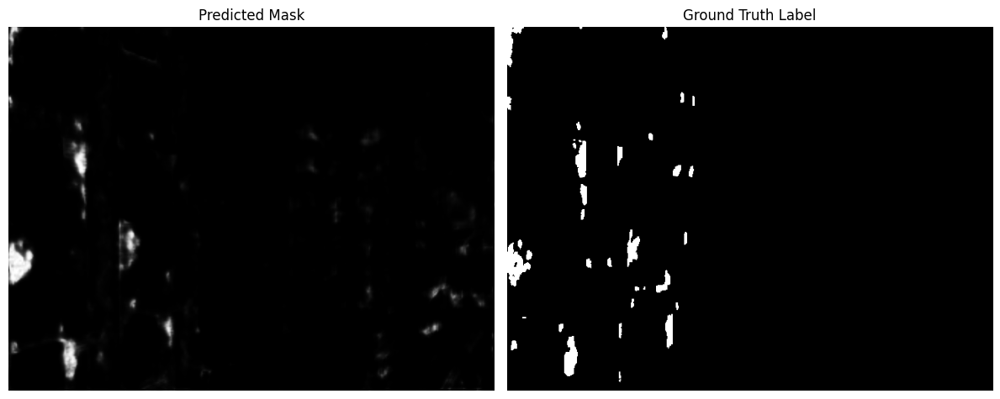

{'iou': 0.5992423892021179, 'precision': 0.7717335820198059, 'recall': 0.7283374667167664, 'f1': 0.7494078278541565}


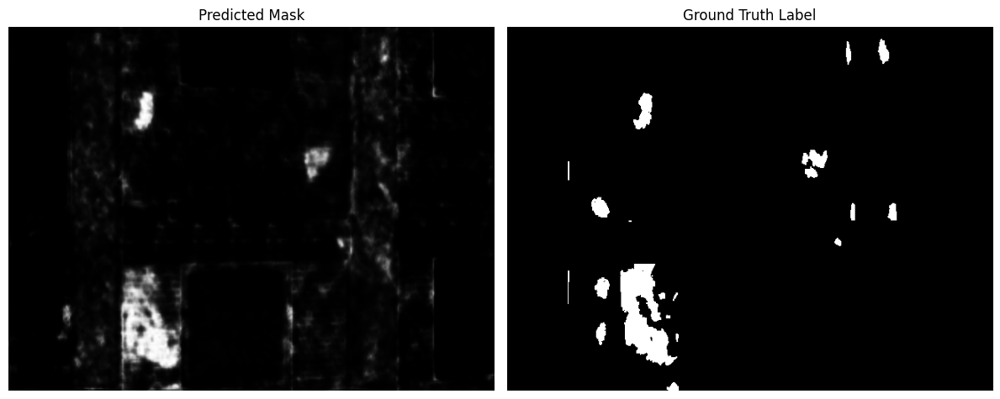

{'iou': 0.5435566902160645, 'precision': 0.7314139604568481, 'recall': 0.6791080236434937, 'f1': 0.7042911648750305}


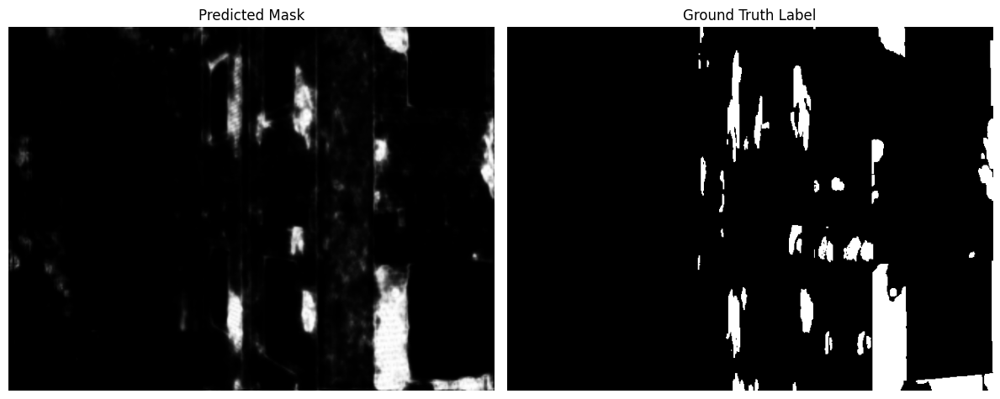

{'iou': 0.5766679644584656, 'precision': 0.7442830204963684, 'recall': 0.7191526889801025, 'f1': 0.731502115726471}


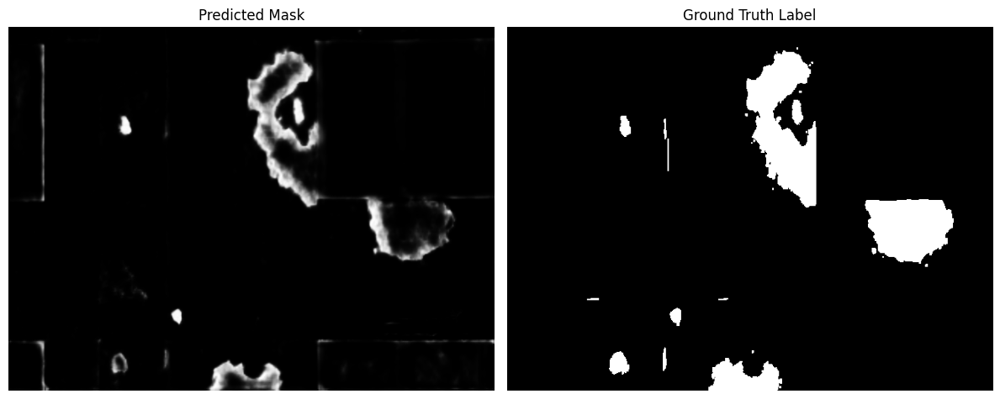

{'iou': 0.5538250803947449, 'precision': 0.7333738803863525, 'recall': 0.6934508085250854, 'f1': 0.7128537893295288}


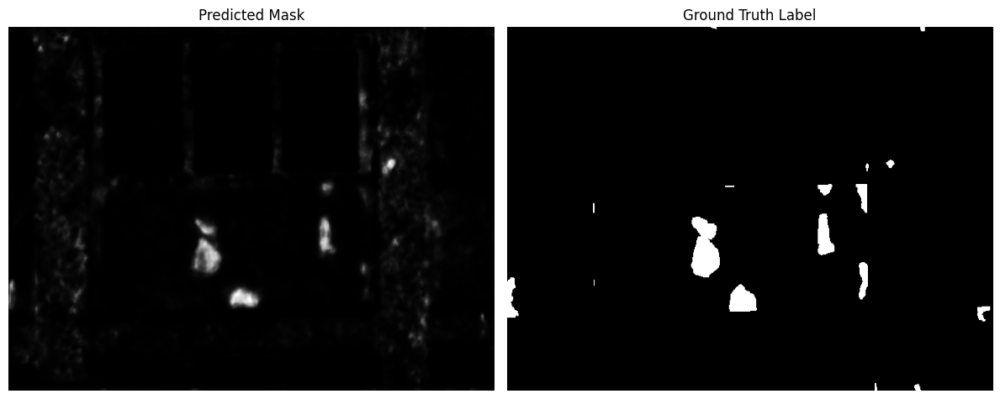

{'iou': 0.597809374332428, 'precision': 0.7567797899246216, 'recall': 0.7399811744689941, 'f1': 0.748286247253418}


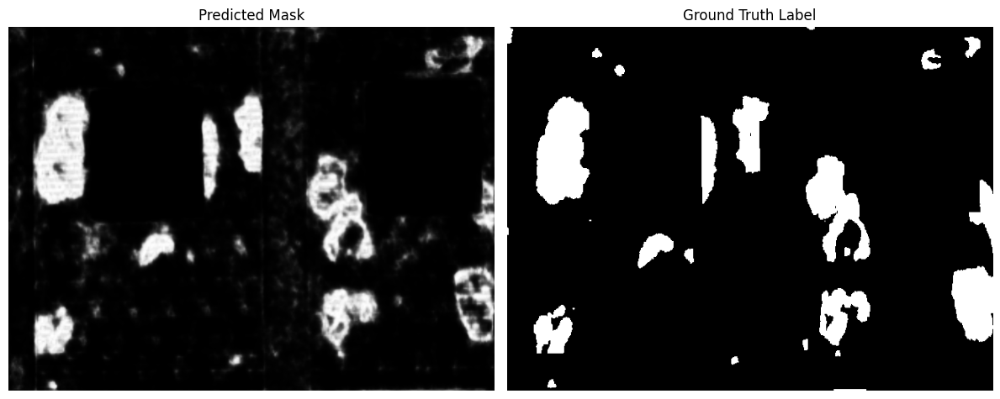

{'iou': 0.6003187894821167, 'precision': 0.753568172454834, 'recall': 0.7469589114189148, 'f1': 0.7502489686012268}


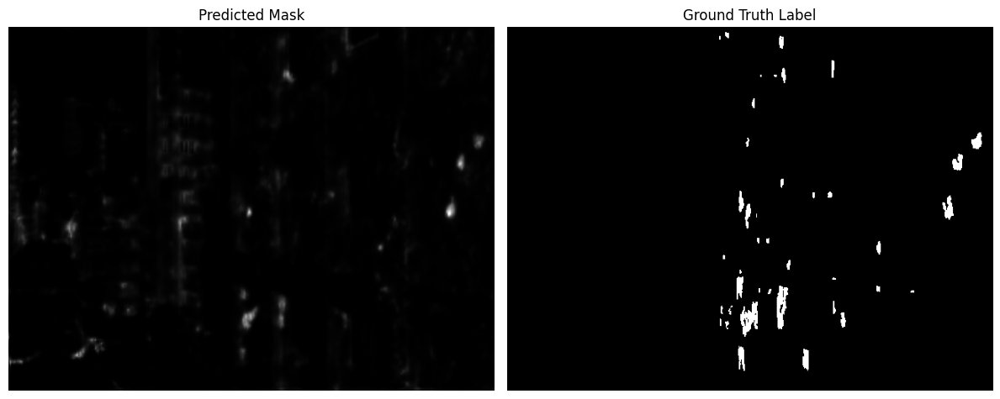

{'iou': 0.5706642866134644, 'precision': 0.7532751560211182, 'recall': 0.7018491625785828, 'f1': 0.7266533970832825}


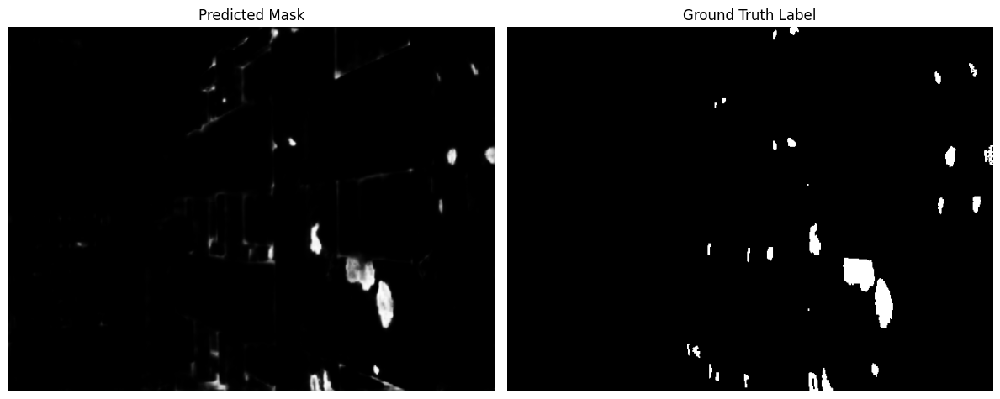

{'iou': 0.6116116046905518, 'precision': 0.7742846012115479, 'recall': 0.7443191409111023, 'f1': 0.7590062022209167}
Validation - IoU: 0.5826, Precision: 0.7549, Recall: 0.7183, F1: 0.7361, 


In [ ]:
from torchmetrics.classification import (
    BinaryJaccardIndex,
    BinaryPrecision,
    BinaryRecall,
    BinaryF1Score
)

def visualize_results(pred_mask, label_mask):
    """Display the predicted and ground truth masks."""
    _, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(pred_mask, cmap='gray')
    axes[0].set_title("Predicted Mask")
    axes[0].axis("off")

    axes[1].imshow(label_mask, cmap='gray')
    axes[1].set_title("Ground Truth Label")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()


def iou_score(outputs, targets, threshold):
    outputs = torch.sigmoid(outputs)

    # --- Visualization only ---
    pred_mask_vis = outputs[-1].squeeze().detach().cpu().numpy()
    label_mask_vis = targets[-1].squeeze().detach().cpu().numpy()
    visualize_results(pred_mask_vis, label_mask_vis)

    # --- Prepare predictions and labels ---
    preds = (outputs > threshold).int().squeeze(1)   # [B, H, W]
    targets = targets.int().squeeze(1)   # [B, H, W]

    # --- Initialize metrics ---
    iou = BinaryJaccardIndex(threshold=threshold).to(outputs.device)
    precision = BinaryPrecision(threshold=threshold).to(outputs.device)
    recall = BinaryRecall(threshold=threshold).to(outputs.device)
    f1 = BinaryF1Score(threshold=threshold).to(outputs.device)

    # --- Update metrics ---
    iou.update(preds, targets)
    precision.update(preds, targets)
    recall.update(preds, targets)
    f1.update(preds, targets)

    # --- Compute metrics ---
    return {
        'iou': iou.compute().item(),
        'precision': precision.compute().item(),
        'recall': recall.compute().item(),
        'f1': f1.compute().item()
    }



model.eval()
total_metrics = {'iou': 0, 'precision': 0, 'recall': 0, 'f1': 0}

with torch.no_grad():
    for images, masks in test_loader:
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)
        scores = iou_score(outputs, masks, 0.2)
        for k in total_metrics:
            total_metrics[k] += scores[k]
        print(scores)

# Average metrics
num_batches = len(test_loader)
avg_metrics = {k: v / num_batches for k, v in total_metrics.items()}
print(
    f"Validation - IoU: {avg_metrics['iou']:.4f}, "
    f"Precision: {avg_metrics['precision']:.4f}, "
    f"Recall: {avg_metrics['recall']:.4f}, "
    f"F1: {avg_metrics['f1']:.4f}, "
)

# 4. Rebar model

## 4.1. Compile 2000 images

In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import cv2
from PIL import Image

# Constants
IMAGE_WIDTH, IMAGE_HEIGHT = 1920, 1080  # Adjust based on dataset
NEW_FOLDER = 'D:/COMP9444/top_2000_image'
SECONDARY_IMAGE_FOLDER = 'secondary_images'  # Folder containing additional images to move

# Read file list
train_df = pd.read_csv('train.csv', header=None, names=['filename'])
all_files = train_df['filename'].tolist()

# Store top images
top_images = {'rebar': []}
non_black_counts = {'rebar': {}}

# First pass: count non-black pixels
for (_, filename) in enumerate(all_files):
    mask_path = f'../QuakeCity/label/rebar/{filename}'
    if not os.path.exists(mask_path):
        continue
    
    with Image.open(mask_path) as mask:
        mask_array = np.array(mask)
        non_black_counts['rebar'][filename] = np.count_nonzero(mask_array)

# Select top 1000 for each damage type
sorted_files = sorted(non_black_counts['rebar'].items(), key=lambda x: x[1], reverse=True)
top_images['rebar'] = [file[0] for file in sorted_files[:2000]]

# Move mask files to new folders
os.makedirs(f'{NEW_FOLDER}/rebar', exist_ok=True)
for filename in top_images['rebar']:
    src_path = f'../QuakeCity/label/rebar/{filename}'
    dst_path = f'{NEW_FOLDER}/rebar/{filename}'
    shutil.copy(src_path, dst_path)

os.makedirs(f'{NEW_FOLDER}/images', exist_ok=True)
for filename in top_images['rebar']:
    src_path = f'../QuakeCity/image/{filename}'
    dst_path = f'{NEW_FOLDER}/images/'
    shutil.copy(src_path, dst_path)

os.makedirs(f'{NEW_FOLDER}/rebar', exist_ok=True)
for filename in top_images['rebar']:
    src_path = f'../QuakeCity/label/rebar/{filename}'
    dst_path = f'{NEW_FOLDER}/rebar/{filename}'
    shutil.copy(src_path, dst_path)

# Move original images matching top 1000 names
os.makedirs(f'{NEW_FOLDER}/images', exist_ok=True)
for filename in set(sum(top_images.values(), [])):
    src_path = f'../QuakeCity/images/{filename}'
    dst_path = f'{NEW_FOLDER}/images/{filename}'
    if os.path.exists(src_path):
        shutil.copy(src_path, dst_path)

# Move secondary images matching top 1000 names
os.makedirs(f'{NEW_FOLDER}/secondary_images', exist_ok=True)
for filename in set(sum(top_images.values(), [])):
    src_path = f'{SECONDARY_IMAGE_FOLDER}/{filename}'
    dst_path = f'{NEW_FOLDER}/secondary_images/{filename}'
    if os.path.exists(src_path):
        shutil.copy(src_path, dst_path)

# Process only top images
for (_, filename) in enumerate(top_images['rebar']):
    mask_path = f'{NEW_FOLDER}/rebar/{filename}'
    with Image.open(mask_path) as mask:
        mask_array = np.array(mask)
        mask_binary = (mask_array > 0).astype(np.uint8)

    # Find contours
    contours, _ = cv2.findContours(mask_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    annotation_lines = []
    
    for contour in contours:
        if cv2.contourArea(contour) < 10:
            continue  # Skip small areas

        epsilon = 0.001 * cv2.arcLength(contour, True)
        approx = cv2.approxPolyDP(contour, epsilon, True).squeeze()
        
        if len(approx) < 3:
            continue  # Need at least 3 points for polygon
        
        # Normalize coordinates
        points = []
        for x, y in approx:
            points.extend([x / IMAGE_WIDTH, y / IMAGE_HEIGHT])

## 4.2. Create model

In [50]:
class CustomFCN(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super(CustomFCN, self).__init__()

        # Downsampling (Encoder)
        self.enc1 = self.conv_chain(in_channels, 3, 3, 8, 1, 1)
        self.pool1 = nn.MaxPool2d(2, stride=2)

        self.enc2 = self.conv_chain(8, 3, 3, 16, 1, 1)
        self.pool2 = nn.MaxPool2d(2, stride=2)

        self.enc3 = self.conv_chain(16, 3, 3, 32, 1, 1)
        self.pool3 = nn.MaxPool2d(2, stride=2)

       # Upsampling (Decoder)
        self.up1 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dec1 = self.conv_chain(32, 3, 3, 16, 1, 1)

        self.up2 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dec2 = self.conv_chain(32, 3, 3, 8, 1, 1)

        self.up3 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dec3 = nn.Conv2d(in_channels=16, out_channels=out_channels, kernel_size=1, padding=0, stride=1)

    def conv_chain(self, Din, L, M, D, S, P):
      return nn.Sequential(
          nn.Conv2d(in_channels=Din, out_channels=D, kernel_size=(L, M), padding=P, stride=S),
          nn.BatchNorm2d(D),
          nn.ReLU(inplace=True)
      )

    def forward(self, x):
        # Encoder
        x1 = self.pool1(self.enc1(x))
        x2 = self.pool2(self.enc2(x1))
        x3 = self.pool3(self.enc3(x2))

        # Decoder
        y = self.up1(x3)
        y = self.dec1(y)
        y = torch.cat([y, x2], dim=1)

        y = self.up2(y)
        y = self.dec2(y)
        y = torch.cat([y, x1], dim=1)

        y = self.up3(y)
        y = self.dec3(y)

        return y
# Create model instance
model = CustomFCN()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)


CustomFCN(
  (enc1): Sequential(
    (0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (enc2): Sequential(
    (0): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (enc3): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (up1): Upsample(scale_factor=2.0, mode='bilinear')
  (dec1): Sequential(
    (0

## 4.3. Prepare data

In [51]:
IMAGE_PATH = 'D:/COMP9444/top_2000_images/image'
LABEL_PATH = 'D:/COMP9444/top_2000_images'

def load_image(path, isLabel=False):
    """Load an RGB image and convert to a tensor"""
    img = Image.open(path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((480, 640)),  # Resize images
        transforms.ToTensor(),  # Convert to tensor

    ])
    if isLabel:
        transform = transforms.Compose([
            transforms.Grayscale(num_output_channels=1),
            transforms.Resize((480, 640)),  # Resize images
            transforms.ToTensor(),  # Convert to tensor
        ])
        return (transform(img) > 0).float()
    return transform(img)  # Apply transform

class QuakeCityDataset(torch.utils.data.Dataset):
    def __init__(self, file_list):
        self.file_list = file_list

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        filename = self.file_list[idx]
        img = load_image(os.path.join(IMAGE_PATH, filename))
        crack = load_image(os.path.join(LABEL_PATH, "rebar", filename), isLabel=True)
        return img, crack

total = 1920
all_files = sorted(os.listdir(IMAGE_PATH))[:total]
random.shuffle(all_files)
split_size = total//3
train_files = all_files[:split_size]
val_files = all_files[split_size:2*split_size]
test_files = all_files[2*split_size:3*split_size]

train_dataset = QuakeCityDataset(train_files)
validation_dataset = QuakeCityDataset(val_files)
test_dataset = QuakeCityDataset(test_files)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=split_size//10, shuffle=True)
validation_loader = torch.utils.data.DataLoader(validation_dataset, batch_size=split_size//10, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=split_size//10, shuffle=False)


img_test_batch, label_test_batch = next(iter(validation_loader))
print("Test image batch shape:", img_test_batch.shape)
print("Test label batch shape:", label_test_batch.shape)


Test image batch shape: torch.Size([64, 3, 480, 640])
Test label batch shape: torch.Size([64, 1, 480, 640])


## 4.4 Choose criterion and optimizer

In [52]:
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.8, momentum=0.9)

## 4.5. Train model

Epoch   1, Batch   1: loss =  0.6004, output_mean =  0.4440, target_mean =  0.0004
Epoch   1, Batch   2: loss =  0.1669, output_mean =  0.1512, target_mean =  0.0004
Epoch   1, Batch   3: loss =  0.0301, output_mean =  0.0283, target_mean =  0.0003
Epoch   1, Batch   4: loss =  0.0066, output_mean =  0.0053, target_mean =  0.0002
Epoch   1, Batch   5: loss =  0.0037, output_mean =  0.0012, target_mean =  0.0004
Epoch   1, Batch   6: loss =  0.0034, output_mean =  0.0003, target_mean =  0.0004
Epoch   1, Batch   7: loss =  0.0028, output_mean =  0.0001, target_mean =  0.0003
Epoch   1, Batch   8: loss =  0.0038, output_mean =  0.0000, target_mean =  0.0003
Epoch   1, Batch   9: loss =  0.0033, output_mean =  0.0000, target_mean =  0.0003
Epoch   1, Batch  10: loss =  0.0055, output_mean =  0.0000, target_mean =  0.0004
Epoch 1 Average Loss: 0.0826 Validation loss: 0.0041
Validation accuracy: 0.9997


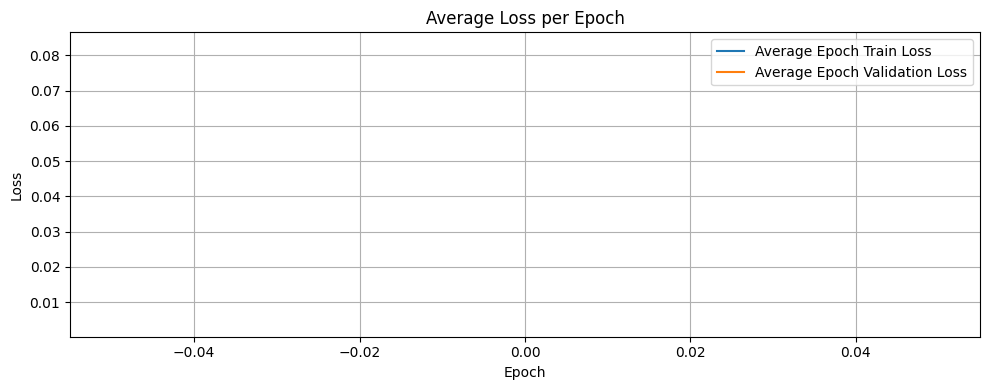

Epoch   2, Batch   1: loss =  0.0060, output_mean =  0.0000, target_mean =  0.0004
Epoch   2, Batch   2: loss =  0.0037, output_mean =  0.0000, target_mean =  0.0003
Epoch   2, Batch   3: loss =  0.0051, output_mean =  0.0000, target_mean =  0.0003
Epoch   2, Batch   4: loss =  0.0046, output_mean =  0.0000, target_mean =  0.0003
Epoch   2, Batch   5: loss =  0.0049, output_mean =  0.0000, target_mean =  0.0003
Epoch   2, Batch   6: loss =  0.0053, output_mean =  0.0000, target_mean =  0.0003
Epoch   2, Batch   7: loss =  0.0056, output_mean =  0.0000, target_mean =  0.0003
Epoch   2, Batch   8: loss =  0.0069, output_mean =  0.0000, target_mean =  0.0004
Epoch   2, Batch   9: loss =  0.0052, output_mean =  0.0000, target_mean =  0.0003
Epoch   2, Batch  10: loss =  0.0062, output_mean =  0.0000, target_mean =  0.0004
Epoch 2 Average Loss: 0.0053 Validation loss: 0.0059
Validation accuracy: 0.9997


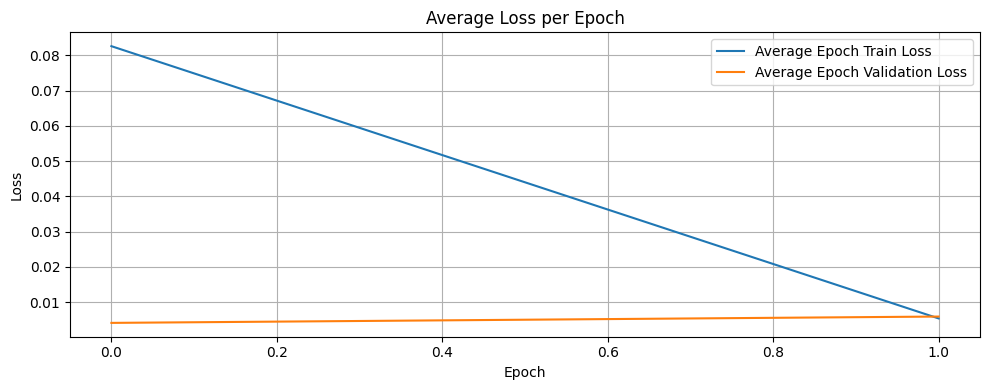

Epoch   3, Batch   1: loss =  0.0073, output_mean =  0.0000, target_mean =  0.0004
Epoch   3, Batch   2: loss =  0.0057, output_mean =  0.0000, target_mean =  0.0003
Epoch   3, Batch   3: loss =  0.0051, output_mean =  0.0000, target_mean =  0.0003
Epoch   3, Batch   4: loss =  0.0062, output_mean =  0.0000, target_mean =  0.0004
Epoch   3, Batch   5: loss =  0.0054, output_mean =  0.0000, target_mean =  0.0003
Epoch   3, Batch   6: loss =  0.0058, output_mean =  0.0000, target_mean =  0.0003
Epoch   3, Batch   7: loss =  0.0056, output_mean =  0.0000, target_mean =  0.0004
Epoch   3, Batch   8: loss =  0.0064, output_mean =  0.0000, target_mean =  0.0004
Epoch   3, Batch   9: loss =  0.0043, output_mean =  0.0000, target_mean =  0.0003
Epoch   3, Batch  10: loss =  0.0046, output_mean =  0.0000, target_mean =  0.0003
Epoch 3 Average Loss: 0.0057 Validation loss: 0.0060
Validation accuracy: 0.9997


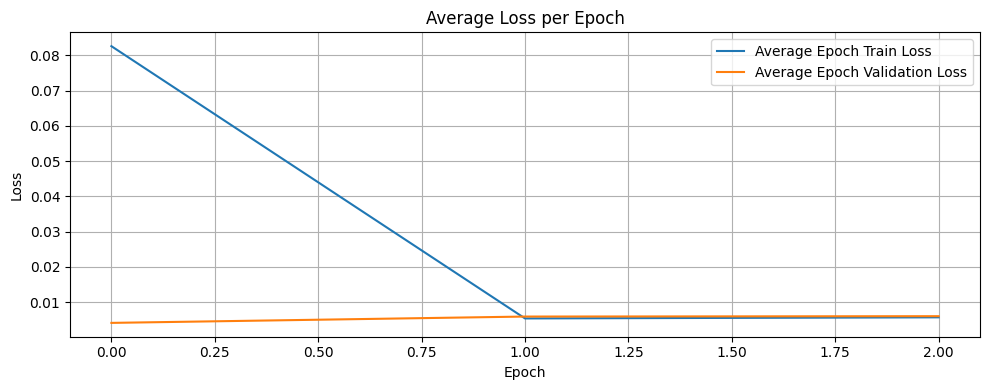

Epoch   4, Batch   1: loss =  0.0072, output_mean =  0.0000, target_mean =  0.0004
Epoch   4, Batch   2: loss =  0.0055, output_mean =  0.0000, target_mean =  0.0003
Epoch   4, Batch   3: loss =  0.0043, output_mean =  0.0000, target_mean =  0.0003
Epoch   4, Batch   4: loss =  0.0044, output_mean =  0.0000, target_mean =  0.0003
Epoch   4, Batch   5: loss =  0.0044, output_mean =  0.0000, target_mean =  0.0003
Epoch   4, Batch   6: loss =  0.0075, output_mean =  0.0000, target_mean =  0.0005
Epoch   4, Batch   7: loss =  0.0066, output_mean =  0.0000, target_mean =  0.0004
Epoch   4, Batch   8: loss =  0.0040, output_mean =  0.0000, target_mean =  0.0003
Epoch   4, Batch   9: loss =  0.0048, output_mean =  0.0000, target_mean =  0.0003
Epoch   4, Batch  10: loss =  0.0052, output_mean =  0.0000, target_mean =  0.0003
Epoch 4 Average Loss: 0.0054 Validation loss: 0.0055
Validation accuracy: 0.9997


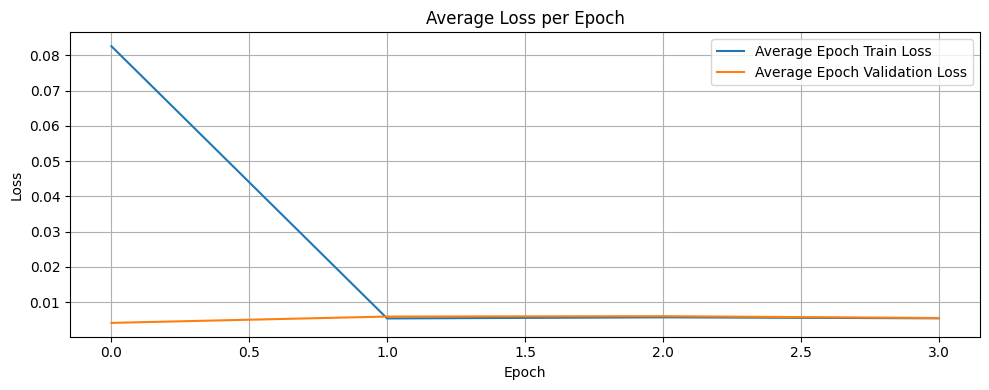

Epoch   5, Batch   1: loss =  0.0041, output_mean =  0.0000, target_mean =  0.0003
Epoch   5, Batch   2: loss =  0.0056, output_mean =  0.0000, target_mean =  0.0004
Epoch   5, Batch   3: loss =  0.0051, output_mean =  0.0000, target_mean =  0.0003
Epoch   5, Batch   4: loss =  0.0058, output_mean =  0.0000, target_mean =  0.0004
Epoch   5, Batch   5: loss =  0.0046, output_mean =  0.0000, target_mean =  0.0003
Epoch   5, Batch   6: loss =  0.0056, output_mean =  0.0000, target_mean =  0.0004
Epoch   5, Batch   7: loss =  0.0051, output_mean =  0.0000, target_mean =  0.0004
Epoch   5, Batch   8: loss =  0.0057, output_mean =  0.0000, target_mean =  0.0004
Epoch   5, Batch   9: loss =  0.0036, output_mean =  0.0000, target_mean =  0.0003
Epoch   5, Batch  10: loss =  0.0046, output_mean =  0.0000, target_mean =  0.0003
Epoch 5 Average Loss: 0.0050 Validation loss: 0.0050
Validation accuracy: 0.9997


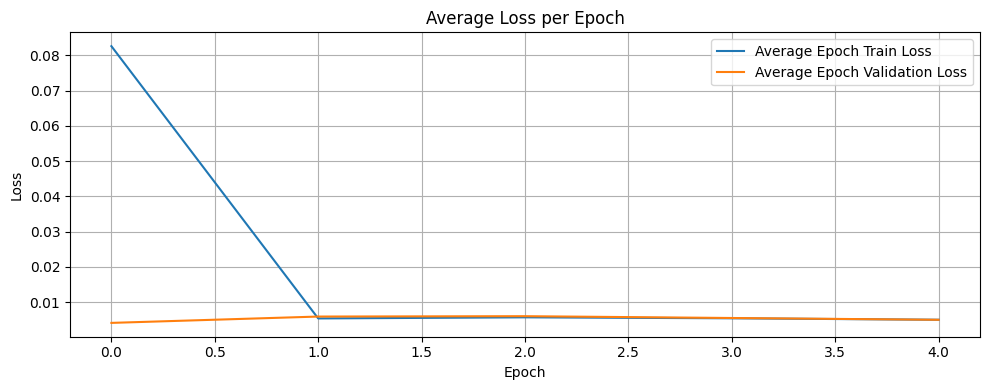

Epoch   6, Batch   1: loss =  0.0056, output_mean =  0.0000, target_mean =  0.0004
Epoch   6, Batch   2: loss =  0.0031, output_mean =  0.0000, target_mean =  0.0002
Epoch   6, Batch   3: loss =  0.0055, output_mean =  0.0000, target_mean =  0.0004
Epoch   6, Batch   4: loss =  0.0058, output_mean =  0.0000, target_mean =  0.0004
Epoch   6, Batch   5: loss =  0.0040, output_mean =  0.0000, target_mean =  0.0003
Epoch   6, Batch   6: loss =  0.0038, output_mean =  0.0000, target_mean =  0.0003
Epoch   6, Batch   7: loss =  0.0049, output_mean =  0.0000, target_mean =  0.0004
Epoch   6, Batch   8: loss =  0.0049, output_mean =  0.0000, target_mean =  0.0004
Epoch   6, Batch   9: loss =  0.0043, output_mean =  0.0001, target_mean =  0.0003
Epoch   6, Batch  10: loss =  0.0032, output_mean =  0.0001, target_mean =  0.0002
Epoch 6 Average Loss: 0.0045 Validation loss: 0.0046
Validation accuracy: 0.9997


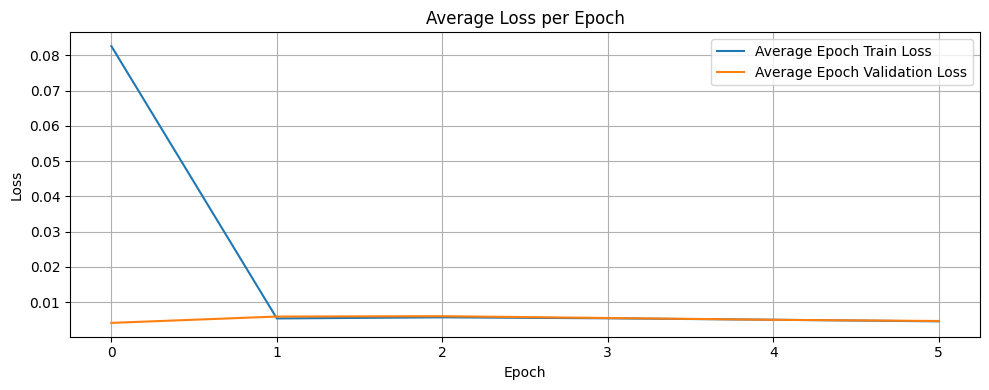

Epoch   7, Batch   1: loss =  0.0047, output_mean =  0.0001, target_mean =  0.0004
Epoch   7, Batch   2: loss =  0.0032, output_mean =  0.0001, target_mean =  0.0003
Epoch   7, Batch   3: loss =  0.0043, output_mean =  0.0001, target_mean =  0.0003
Epoch   7, Batch   4: loss =  0.0040, output_mean =  0.0001, target_mean =  0.0003
Epoch   7, Batch   5: loss =  0.0045, output_mean =  0.0001, target_mean =  0.0004
Epoch   7, Batch   6: loss =  0.0035, output_mean =  0.0001, target_mean =  0.0003
Epoch   7, Batch   7: loss =  0.0042, output_mean =  0.0001, target_mean =  0.0004
Epoch   7, Batch   8: loss =  0.0038, output_mean =  0.0001, target_mean =  0.0003
Epoch   7, Batch   9: loss =  0.0055, output_mean =  0.0001, target_mean =  0.0005
Epoch   7, Batch  10: loss =  0.0040, output_mean =  0.0001, target_mean =  0.0003
Epoch 7 Average Loss: 0.0042 Validation loss: 0.0040
Validation accuracy: 0.9997


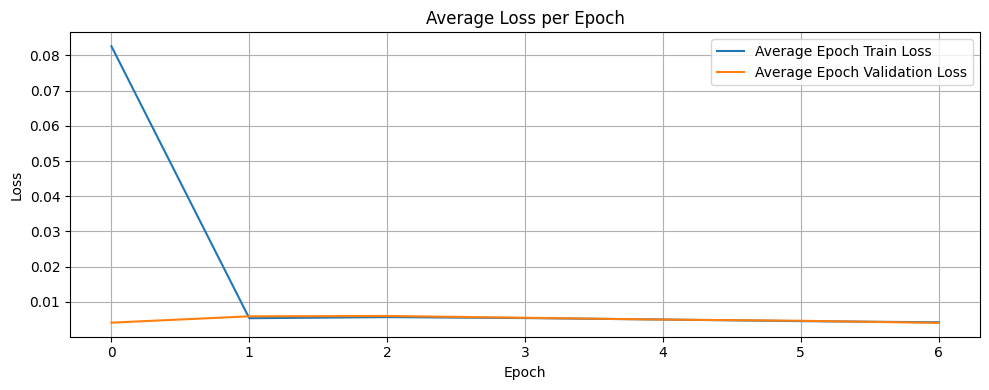

Epoch   8, Batch   1: loss =  0.0044, output_mean =  0.0001, target_mean =  0.0004
Epoch   8, Batch   2: loss =  0.0040, output_mean =  0.0001, target_mean =  0.0003
Epoch   8, Batch   3: loss =  0.0041, output_mean =  0.0001, target_mean =  0.0003
Epoch   8, Batch   4: loss =  0.0035, output_mean =  0.0001, target_mean =  0.0003
Epoch   8, Batch   5: loss =  0.0034, output_mean =  0.0001, target_mean =  0.0003
Epoch   8, Batch   6: loss =  0.0049, output_mean =  0.0001, target_mean =  0.0004
Epoch   8, Batch   7: loss =  0.0044, output_mean =  0.0001, target_mean =  0.0004
Epoch   8, Batch   8: loss =  0.0033, output_mean =  0.0001, target_mean =  0.0003
Epoch   8, Batch   9: loss =  0.0040, output_mean =  0.0001, target_mean =  0.0004
Epoch   8, Batch  10: loss =  0.0035, output_mean =  0.0001, target_mean =  0.0003
Epoch 8 Average Loss: 0.0039 Validation loss: 0.0039
Validation accuracy: 0.9997


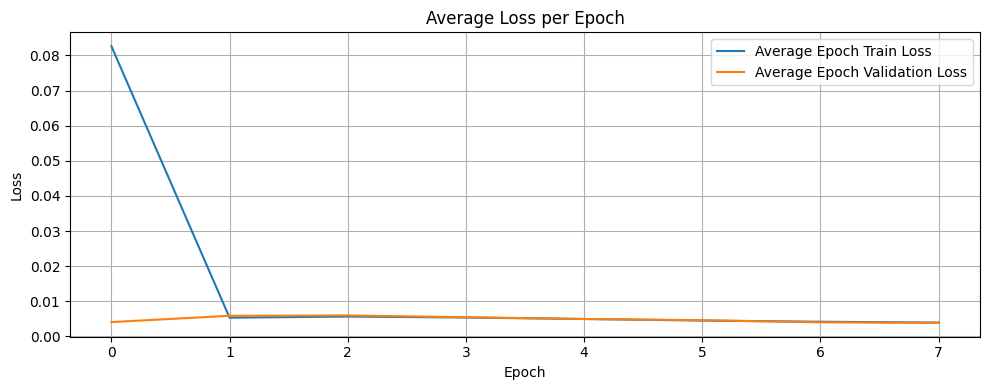

Epoch   9, Batch   1: loss =  0.0045, output_mean =  0.0001, target_mean =  0.0004
Epoch   9, Batch   2: loss =  0.0032, output_mean =  0.0001, target_mean =  0.0003
Epoch   9, Batch   3: loss =  0.0043, output_mean =  0.0001, target_mean =  0.0004
Epoch   9, Batch   4: loss =  0.0037, output_mean =  0.0001, target_mean =  0.0003
Epoch   9, Batch   5: loss =  0.0035, output_mean =  0.0001, target_mean =  0.0003
Epoch   9, Batch   6: loss =  0.0043, output_mean =  0.0001, target_mean =  0.0004
Epoch   9, Batch   7: loss =  0.0033, output_mean =  0.0001, target_mean =  0.0003
Epoch   9, Batch   8: loss =  0.0045, output_mean =  0.0001, target_mean =  0.0004
Epoch   9, Batch   9: loss =  0.0030, output_mean =  0.0001, target_mean =  0.0003
Epoch   9, Batch  10: loss =  0.0033, output_mean =  0.0001, target_mean =  0.0003
Epoch 9 Average Loss: 0.0038 Validation loss: 0.0037
Validation accuracy: 0.9997


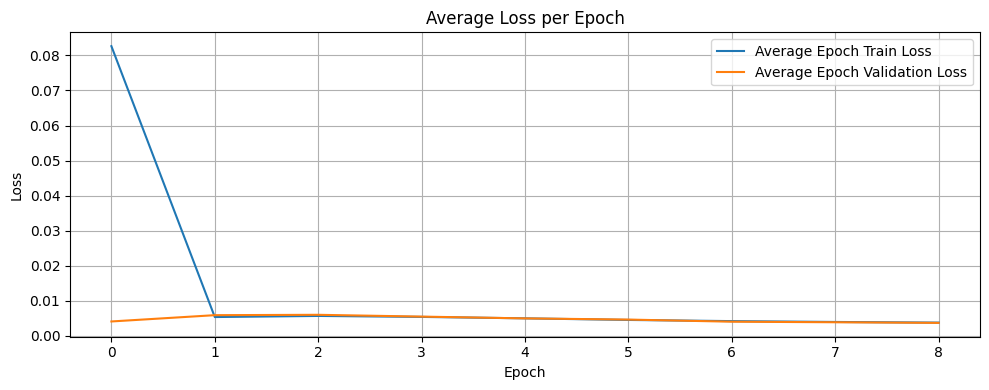

Epoch  10, Batch   1: loss =  0.0030, output_mean =  0.0001, target_mean =  0.0003
Epoch  10, Batch   2: loss =  0.0026, output_mean =  0.0001, target_mean =  0.0002
Epoch  10, Batch   3: loss =  0.0035, output_mean =  0.0001, target_mean =  0.0003
Epoch  10, Batch   4: loss =  0.0041, output_mean =  0.0001, target_mean =  0.0004
Epoch  10, Batch   5: loss =  0.0046, output_mean =  0.0001, target_mean =  0.0004
Epoch  10, Batch   6: loss =  0.0036, output_mean =  0.0001, target_mean =  0.0004
Epoch  10, Batch   7: loss =  0.0033, output_mean =  0.0001, target_mean =  0.0003
Epoch  10, Batch   8: loss =  0.0031, output_mean =  0.0001, target_mean =  0.0003
Epoch  10, Batch   9: loss =  0.0033, output_mean =  0.0001, target_mean =  0.0003
Epoch  10, Batch  10: loss =  0.0048, output_mean =  0.0001, target_mean =  0.0005
Epoch 10 Average Loss: 0.0036 Validation loss: 0.0034
Validation accuracy: 0.9997


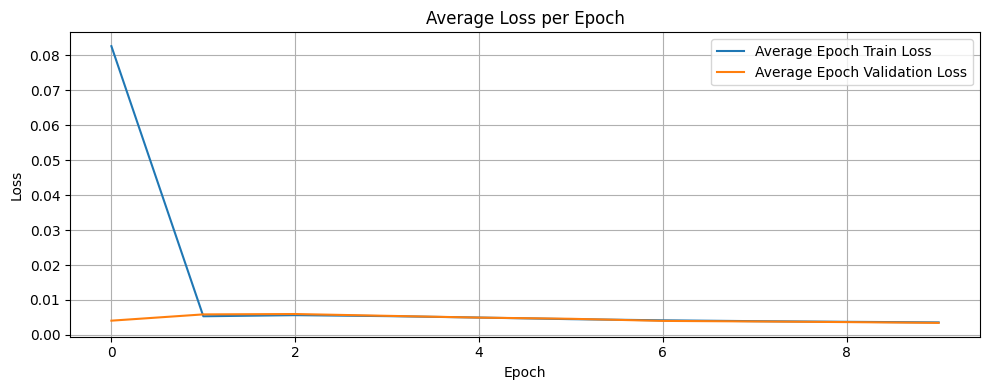

Epoch  11, Batch   1: loss =  0.0034, output_mean =  0.0001, target_mean =  0.0003
Epoch  11, Batch   2: loss =  0.0045, output_mean =  0.0001, target_mean =  0.0004
Epoch  11, Batch   3: loss =  0.0041, output_mean =  0.0001, target_mean =  0.0004
Epoch  11, Batch   4: loss =  0.0024, output_mean =  0.0001, target_mean =  0.0002
Epoch  11, Batch   5: loss =  0.0038, output_mean =  0.0001, target_mean =  0.0004
Epoch  11, Batch   6: loss =  0.0036, output_mean =  0.0002, target_mean =  0.0004
Epoch  11, Batch   7: loss =  0.0034, output_mean =  0.0001, target_mean =  0.0003
Epoch  11, Batch   8: loss =  0.0032, output_mean =  0.0002, target_mean =  0.0003
Epoch  11, Batch   9: loss =  0.0027, output_mean =  0.0001, target_mean =  0.0003
Epoch  11, Batch  10: loss =  0.0033, output_mean =  0.0001, target_mean =  0.0003
Epoch 11 Average Loss: 0.0034 Validation loss: 0.0032
Validation accuracy: 0.9997


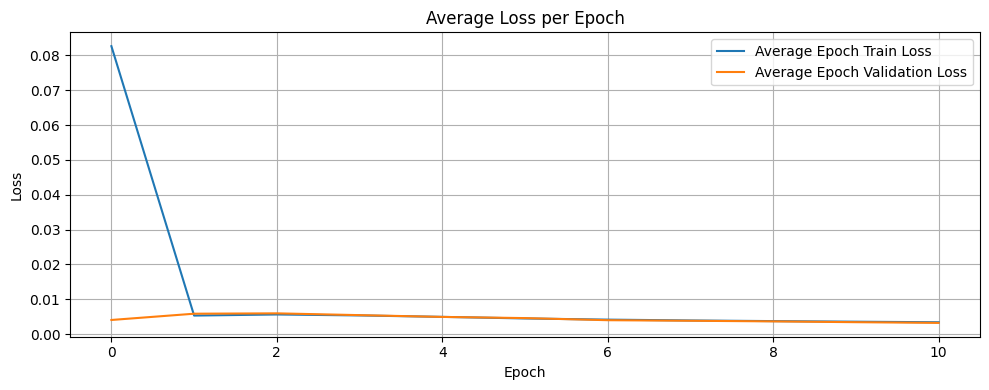

Epoch  12, Batch   1: loss =  0.0038, output_mean =  0.0001, target_mean =  0.0004
Epoch  12, Batch   2: loss =  0.0022, output_mean =  0.0001, target_mean =  0.0002
Epoch  12, Batch   3: loss =  0.0033, output_mean =  0.0001, target_mean =  0.0003
Epoch  12, Batch   4: loss =  0.0036, output_mean =  0.0001, target_mean =  0.0004
Epoch  12, Batch   5: loss =  0.0032, output_mean =  0.0001, target_mean =  0.0003
Epoch  12, Batch   6: loss =  0.0030, output_mean =  0.0002, target_mean =  0.0003
Epoch  12, Batch   7: loss =  0.0039, output_mean =  0.0002, target_mean =  0.0004
Epoch  12, Batch   8: loss =  0.0032, output_mean =  0.0002, target_mean =  0.0003
Epoch  12, Batch   9: loss =  0.0036, output_mean =  0.0002, target_mean =  0.0003
Epoch  12, Batch  10: loss =  0.0032, output_mean =  0.0002, target_mean =  0.0003
Epoch 12 Average Loss: 0.0033 Validation loss: 0.0032
Validation accuracy: 0.9997


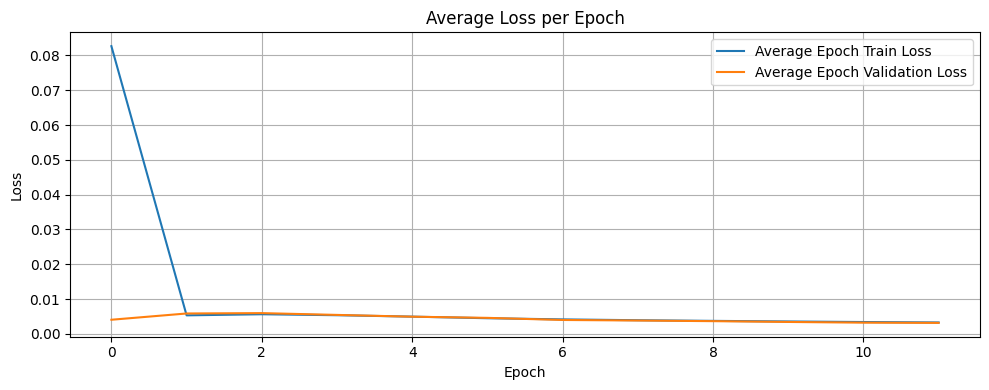

Epoch  13, Batch   1: loss =  0.0038, output_mean =  0.0002, target_mean =  0.0004
Epoch  13, Batch   2: loss =  0.0032, output_mean =  0.0002, target_mean =  0.0003
Epoch  13, Batch   3: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  13, Batch   4: loss =  0.0043, output_mean =  0.0001, target_mean =  0.0005
Epoch  13, Batch   5: loss =  0.0027, output_mean =  0.0001, target_mean =  0.0003
Epoch  13, Batch   6: loss =  0.0033, output_mean =  0.0001, target_mean =  0.0004
Epoch  13, Batch   7: loss =  0.0029, output_mean =  0.0001, target_mean =  0.0003
Epoch  13, Batch   8: loss =  0.0032, output_mean =  0.0001, target_mean =  0.0004
Epoch  13, Batch   9: loss =  0.0027, output_mean =  0.0002, target_mean =  0.0003
Epoch  13, Batch  10: loss =  0.0032, output_mean =  0.0002, target_mean =  0.0004
Epoch 13 Average Loss: 0.0032 Validation loss: 0.0031
Validation accuracy: 0.9997


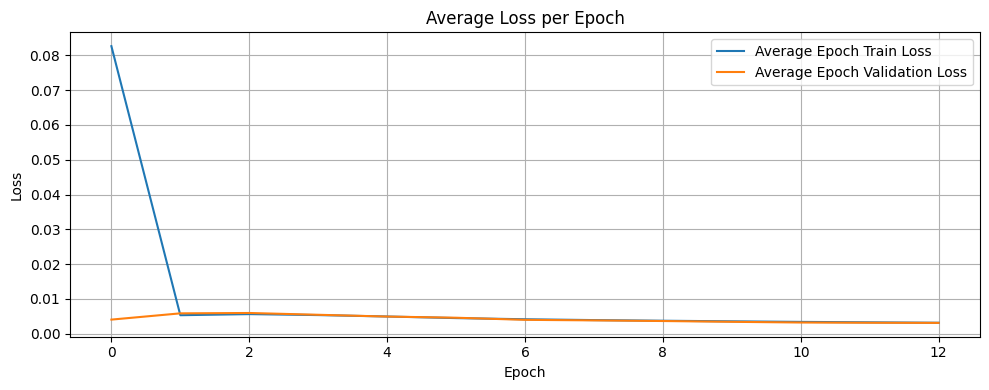

Epoch  14, Batch   1: loss =  0.0042, output_mean =  0.0002, target_mean =  0.0005
Epoch  14, Batch   2: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0003
Epoch  14, Batch   3: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0003
Epoch  14, Batch   4: loss =  0.0033, output_mean =  0.0002, target_mean =  0.0004
Epoch  14, Batch   5: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0003
Epoch  14, Batch   6: loss =  0.0024, output_mean =  0.0001, target_mean =  0.0003
Epoch  14, Batch   7: loss =  0.0030, output_mean =  0.0002, target_mean =  0.0003
Epoch  14, Batch   8: loss =  0.0030, output_mean =  0.0001, target_mean =  0.0003
Epoch  14, Batch   9: loss =  0.0032, output_mean =  0.0001, target_mean =  0.0004
Epoch  14, Batch  10: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0003
Epoch 14 Average Loss: 0.0031 Validation loss: 0.0031
Validation accuracy: 0.9997


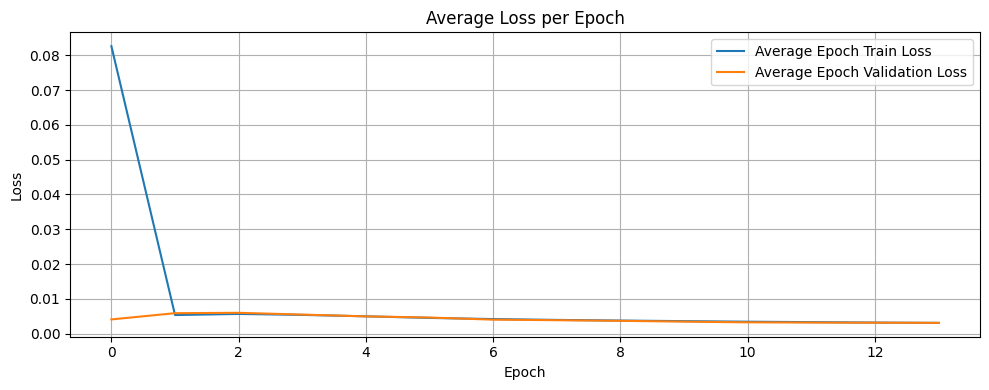

Epoch  15, Batch   1: loss =  0.0025, output_mean =  0.0002, target_mean =  0.0003
Epoch  15, Batch   2: loss =  0.0035, output_mean =  0.0002, target_mean =  0.0004
Epoch  15, Batch   3: loss =  0.0034, output_mean =  0.0002, target_mean =  0.0004
Epoch  15, Batch   4: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  15, Batch   5: loss =  0.0030, output_mean =  0.0002, target_mean =  0.0003
Epoch  15, Batch   6: loss =  0.0034, output_mean =  0.0002, target_mean =  0.0004
Epoch  15, Batch   7: loss =  0.0034, output_mean =  0.0002, target_mean =  0.0004
Epoch  15, Batch   8: loss =  0.0030, output_mean =  0.0002, target_mean =  0.0003
Epoch  15, Batch   9: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  15, Batch  10: loss =  0.0031, output_mean =  0.0002, target_mean =  0.0004
Epoch 15 Average Loss: 0.0030 Validation loss: 0.0030
Validation accuracy: 0.9997


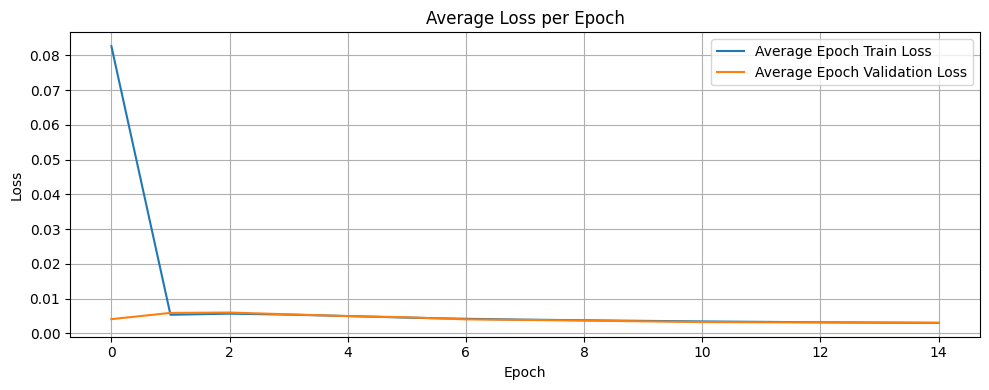

Epoch  16, Batch   1: loss =  0.0033, output_mean =  0.0002, target_mean =  0.0004
Epoch  16, Batch   2: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0003
Epoch  16, Batch   3: loss =  0.0028, output_mean =  0.0002, target_mean =  0.0003
Epoch  16, Batch   4: loss =  0.0026, output_mean =  0.0002, target_mean =  0.0003
Epoch  16, Batch   5: loss =  0.0035, output_mean =  0.0003, target_mean =  0.0004
Epoch  16, Batch   6: loss =  0.0030, output_mean =  0.0002, target_mean =  0.0003
Epoch  16, Batch   7: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  16, Batch   8: loss =  0.0026, output_mean =  0.0001, target_mean =  0.0003
Epoch  16, Batch   9: loss =  0.0026, output_mean =  0.0001, target_mean =  0.0003
Epoch  16, Batch  10: loss =  0.0036, output_mean =  0.0002, target_mean =  0.0004
Epoch 16 Average Loss: 0.0029 Validation loss: 0.0029
Validation accuracy: 0.9997


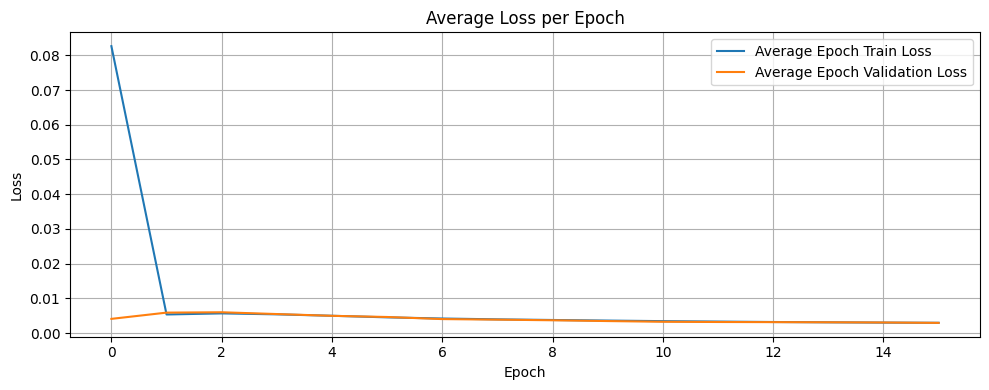

Epoch  17, Batch   1: loss =  0.0023, output_mean =  0.0002, target_mean =  0.0003
Epoch  17, Batch   2: loss =  0.0031, output_mean =  0.0002, target_mean =  0.0004
Epoch  17, Batch   3: loss =  0.0026, output_mean =  0.0003, target_mean =  0.0003
Epoch  17, Batch   4: loss =  0.0030, output_mean =  0.0002, target_mean =  0.0003
Epoch  17, Batch   5: loss =  0.0021, output_mean =  0.0002, target_mean =  0.0002
Epoch  17, Batch   6: loss =  0.0033, output_mean =  0.0002, target_mean =  0.0004
Epoch  17, Batch   7: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0004
Epoch  17, Batch   8: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0004
Epoch  17, Batch   9: loss =  0.0034, output_mean =  0.0002, target_mean =  0.0004
Epoch  17, Batch  10: loss =  0.0034, output_mean =  0.0002, target_mean =  0.0004
Epoch 17 Average Loss: 0.0029 Validation loss: 0.0030
Validation accuracy: 0.9997


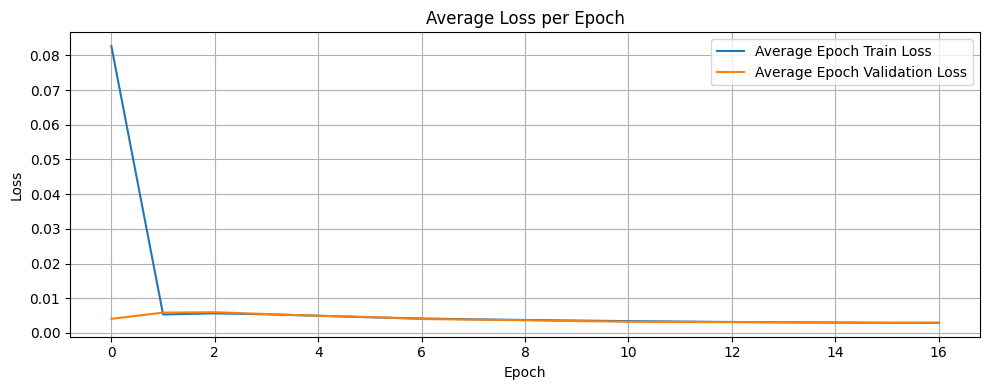

Epoch  18, Batch   1: loss =  0.0021, output_mean =  0.0002, target_mean =  0.0002
Epoch  18, Batch   2: loss =  0.0026, output_mean =  0.0002, target_mean =  0.0003
Epoch  18, Batch   3: loss =  0.0027, output_mean =  0.0003, target_mean =  0.0003
Epoch  18, Batch   4: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0003
Epoch  18, Batch   5: loss =  0.0037, output_mean =  0.0002, target_mean =  0.0005
Epoch  18, Batch   6: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0003
Epoch  18, Batch   7: loss =  0.0028, output_mean =  0.0002, target_mean =  0.0003
Epoch  18, Batch   8: loss =  0.0033, output_mean =  0.0002, target_mean =  0.0004
Epoch  18, Batch   9: loss =  0.0026, output_mean =  0.0002, target_mean =  0.0003
Epoch  18, Batch  10: loss =  0.0030, output_mean =  0.0002, target_mean =  0.0004
Epoch 18 Average Loss: 0.0029 Validation loss: 0.0029
Validation accuracy: 0.9997


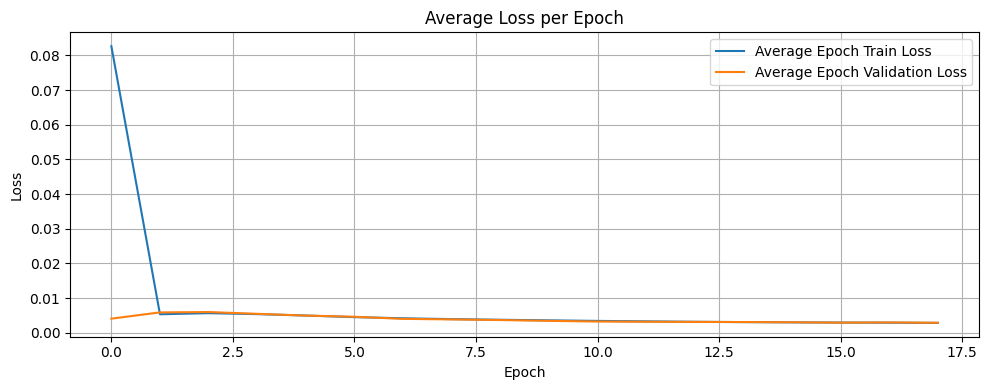

Epoch  19, Batch   1: loss =  0.0030, output_mean =  0.0003, target_mean =  0.0004
Epoch  19, Batch   2: loss =  0.0034, output_mean =  0.0002, target_mean =  0.0004
Epoch  19, Batch   3: loss =  0.0034, output_mean =  0.0003, target_mean =  0.0004
Epoch  19, Batch   4: loss =  0.0028, output_mean =  0.0003, target_mean =  0.0003
Epoch  19, Batch   5: loss =  0.0026, output_mean =  0.0003, target_mean =  0.0003
Epoch  19, Batch   6: loss =  0.0027, output_mean =  0.0002, target_mean =  0.0003
Epoch  19, Batch   7: loss =  0.0027, output_mean =  0.0002, target_mean =  0.0003
Epoch  19, Batch   8: loss =  0.0027, output_mean =  0.0002, target_mean =  0.0003
Epoch  19, Batch   9: loss =  0.0025, output_mean =  0.0002, target_mean =  0.0003
Epoch  19, Batch  10: loss =  0.0028, output_mean =  0.0002, target_mean =  0.0003
Epoch 19 Average Loss: 0.0028 Validation loss: 0.0029
Validation accuracy: 0.9997


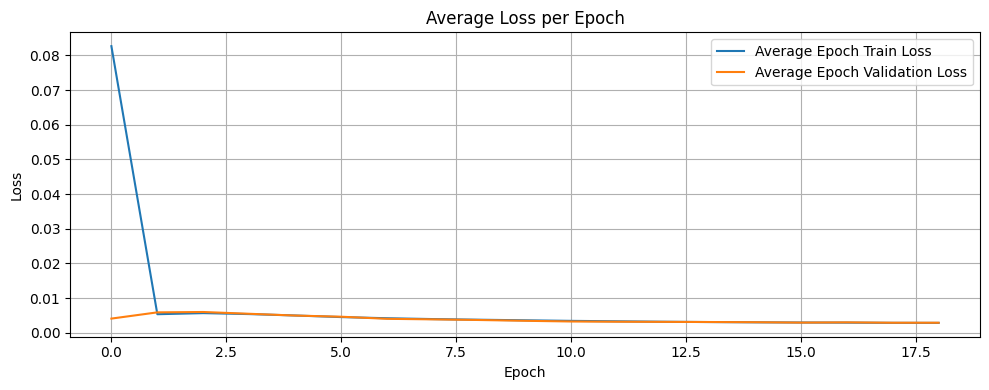

Epoch  20, Batch   1: loss =  0.0023, output_mean =  0.0002, target_mean =  0.0003
Epoch  20, Batch   2: loss =  0.0028, output_mean =  0.0002, target_mean =  0.0003
Epoch  20, Batch   3: loss =  0.0022, output_mean =  0.0003, target_mean =  0.0003
Epoch  20, Batch   4: loss =  0.0033, output_mean =  0.0002, target_mean =  0.0004
Epoch  20, Batch   5: loss =  0.0028, output_mean =  0.0002, target_mean =  0.0003
Epoch  20, Batch   6: loss =  0.0030, output_mean =  0.0003, target_mean =  0.0004
Epoch  20, Batch   7: loss =  0.0028, output_mean =  0.0002, target_mean =  0.0003
Epoch  20, Batch   8: loss =  0.0031, output_mean =  0.0002, target_mean =  0.0004
Epoch  20, Batch   9: loss =  0.0026, output_mean =  0.0002, target_mean =  0.0003
Epoch  20, Batch  10: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0003
Epoch 20 Average Loss: 0.0028 Validation loss: 0.0028
Validation accuracy: 0.9997


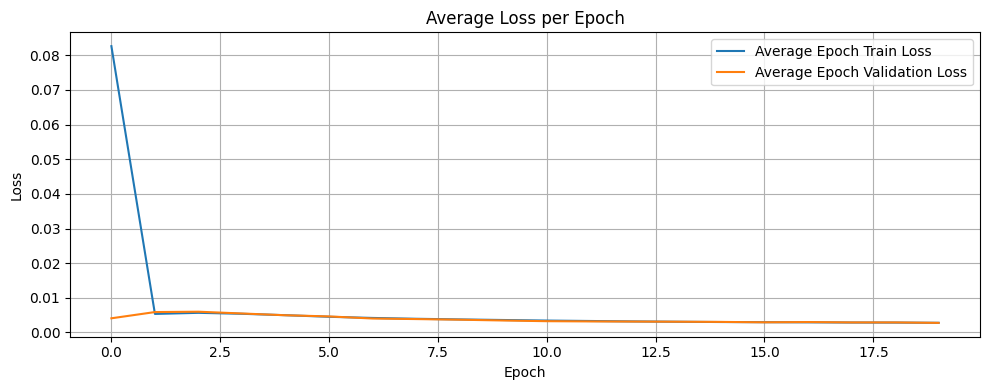

Epoch  21, Batch   1: loss =  0.0027, output_mean =  0.0002, target_mean =  0.0003
Epoch  21, Batch   2: loss =  0.0022, output_mean =  0.0002, target_mean =  0.0003
Epoch  21, Batch   3: loss =  0.0034, output_mean =  0.0002, target_mean =  0.0004
Epoch  21, Batch   4: loss =  0.0025, output_mean =  0.0003, target_mean =  0.0003
Epoch  21, Batch   5: loss =  0.0025, output_mean =  0.0003, target_mean =  0.0003
Epoch  21, Batch   6: loss =  0.0026, output_mean =  0.0002, target_mean =  0.0003
Epoch  21, Batch   7: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0004
Epoch  21, Batch   8: loss =  0.0027, output_mean =  0.0003, target_mean =  0.0003
Epoch  21, Batch   9: loss =  0.0031, output_mean =  0.0002, target_mean =  0.0004
Epoch  21, Batch  10: loss =  0.0031, output_mean =  0.0002, target_mean =  0.0004
Epoch 21 Average Loss: 0.0028 Validation loss: 0.0028
Validation accuracy: 0.9997


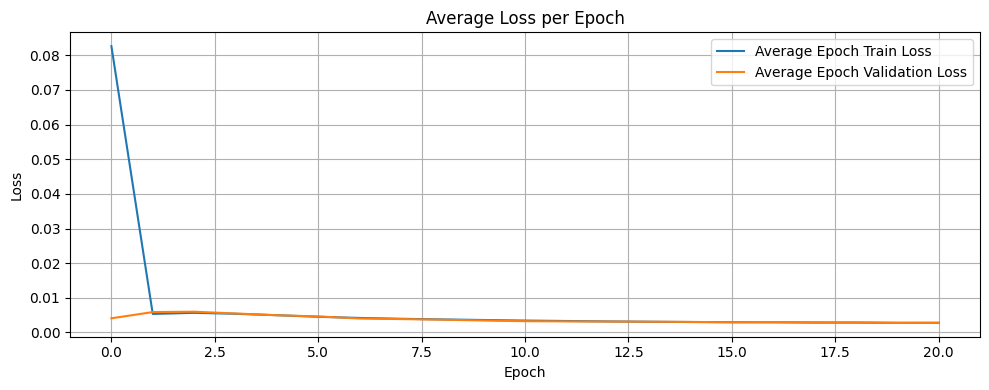

Epoch  22, Batch   1: loss =  0.0025, output_mean =  0.0003, target_mean =  0.0003
Epoch  22, Batch   2: loss =  0.0032, output_mean =  0.0003, target_mean =  0.0004
Epoch  22, Batch   3: loss =  0.0028, output_mean =  0.0002, target_mean =  0.0003
Epoch  22, Batch   4: loss =  0.0027, output_mean =  0.0003, target_mean =  0.0003
Epoch  22, Batch   5: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0003
Epoch  22, Batch   6: loss =  0.0030, output_mean =  0.0002, target_mean =  0.0004
Epoch  22, Batch   7: loss =  0.0030, output_mean =  0.0003, target_mean =  0.0004
Epoch  22, Batch   8: loss =  0.0021, output_mean =  0.0003, target_mean =  0.0002
Epoch  22, Batch   9: loss =  0.0023, output_mean =  0.0002, target_mean =  0.0003
Epoch  22, Batch  10: loss =  0.0030, output_mean =  0.0002, target_mean =  0.0004
Epoch 22 Average Loss: 0.0027 Validation loss: 0.0027
Validation accuracy: 0.9997


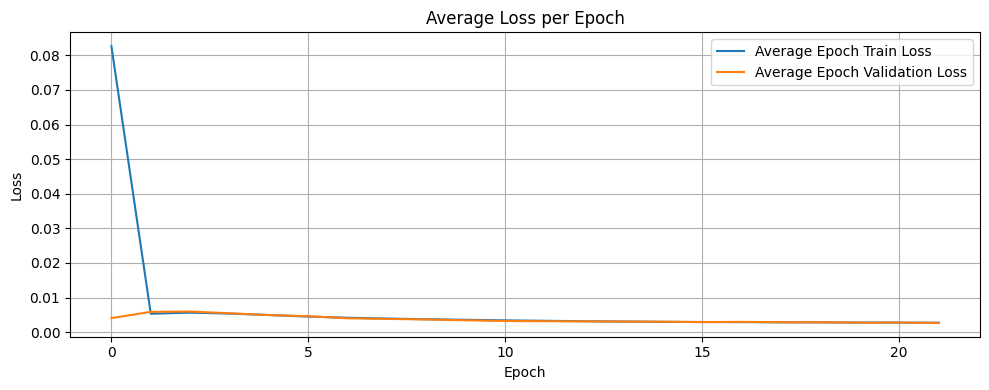

Epoch  23, Batch   1: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0004
Epoch  23, Batch   2: loss =  0.0028, output_mean =  0.0002, target_mean =  0.0004
Epoch  23, Batch   3: loss =  0.0030, output_mean =  0.0003, target_mean =  0.0004
Epoch  23, Batch   4: loss =  0.0033, output_mean =  0.0002, target_mean =  0.0004
Epoch  23, Batch   5: loss =  0.0028, output_mean =  0.0003, target_mean =  0.0004
Epoch  23, Batch   6: loss =  0.0033, output_mean =  0.0003, target_mean =  0.0004
Epoch  23, Batch   7: loss =  0.0025, output_mean =  0.0002, target_mean =  0.0003
Epoch  23, Batch   8: loss =  0.0022, output_mean =  0.0003, target_mean =  0.0003
Epoch  23, Batch   9: loss =  0.0017, output_mean =  0.0002, target_mean =  0.0002
Epoch  23, Batch  10: loss =  0.0027, output_mean =  0.0002, target_mean =  0.0003
Epoch 23 Average Loss: 0.0027 Validation loss: 0.0027
Validation accuracy: 0.9997


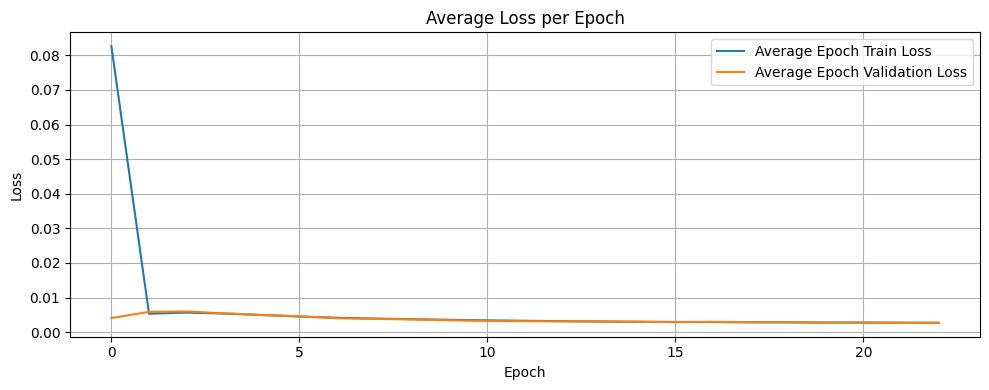

Epoch  24, Batch   1: loss =  0.0022, output_mean =  0.0002, target_mean =  0.0003
Epoch  24, Batch   2: loss =  0.0022, output_mean =  0.0002, target_mean =  0.0003
Epoch  24, Batch   3: loss =  0.0026, output_mean =  0.0002, target_mean =  0.0003
Epoch  24, Batch   4: loss =  0.0027, output_mean =  0.0002, target_mean =  0.0003
Epoch  24, Batch   5: loss =  0.0028, output_mean =  0.0003, target_mean =  0.0003
Epoch  24, Batch   6: loss =  0.0031, output_mean =  0.0002, target_mean =  0.0004
Epoch  24, Batch   7: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0004
Epoch  24, Batch   8: loss =  0.0030, output_mean =  0.0002, target_mean =  0.0004
Epoch  24, Batch   9: loss =  0.0027, output_mean =  0.0002, target_mean =  0.0004
Epoch  24, Batch  10: loss =  0.0027, output_mean =  0.0002, target_mean =  0.0003
Epoch 24 Average Loss: 0.0027 Validation loss: 0.0028
Validation accuracy: 0.9997


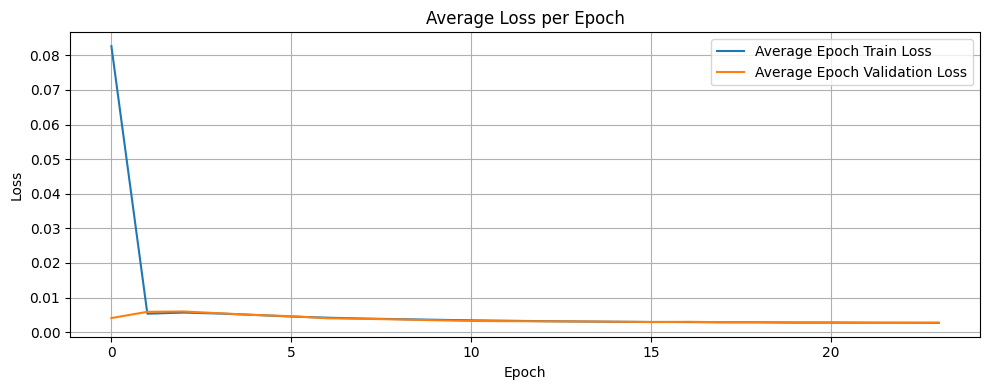

Epoch  25, Batch   1: loss =  0.0020, output_mean =  0.0002, target_mean =  0.0002
Epoch  25, Batch   2: loss =  0.0031, output_mean =  0.0002, target_mean =  0.0004
Epoch  25, Batch   3: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0004
Epoch  25, Batch   4: loss =  0.0025, output_mean =  0.0002, target_mean =  0.0003
Epoch  25, Batch   5: loss =  0.0027, output_mean =  0.0003, target_mean =  0.0003
Epoch  25, Batch   6: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  25, Batch   7: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0004
Epoch  25, Batch   8: loss =  0.0022, output_mean =  0.0003, target_mean =  0.0003
Epoch  25, Batch   9: loss =  0.0032, output_mean =  0.0003, target_mean =  0.0004
Epoch  25, Batch  10: loss =  0.0028, output_mean =  0.0003, target_mean =  0.0004
Epoch 25 Average Loss: 0.0027 Validation loss: 0.0026
Validation accuracy: 0.9997


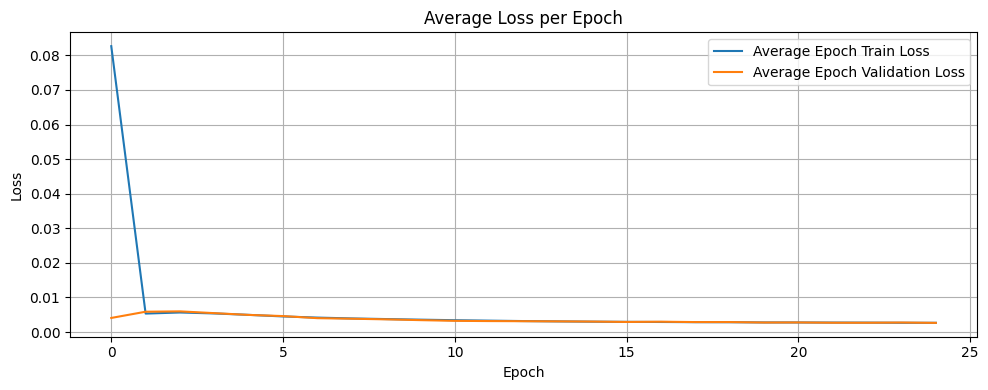

Epoch  26, Batch   1: loss =  0.0025, output_mean =  0.0003, target_mean =  0.0003
Epoch  26, Batch   2: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  26, Batch   3: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  26, Batch   4: loss =  0.0031, output_mean =  0.0002, target_mean =  0.0004
Epoch  26, Batch   5: loss =  0.0031, output_mean =  0.0002, target_mean =  0.0004
Epoch  26, Batch   6: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  26, Batch   7: loss =  0.0025, output_mean =  0.0002, target_mean =  0.0003
Epoch  26, Batch   8: loss =  0.0023, output_mean =  0.0003, target_mean =  0.0003
Epoch  26, Batch   9: loss =  0.0028, output_mean =  0.0002, target_mean =  0.0004
Epoch  26, Batch  10: loss =  0.0028, output_mean =  0.0003, target_mean =  0.0004
Epoch 26 Average Loss: 0.0026 Validation loss: 0.0027
Validation accuracy: 0.9997


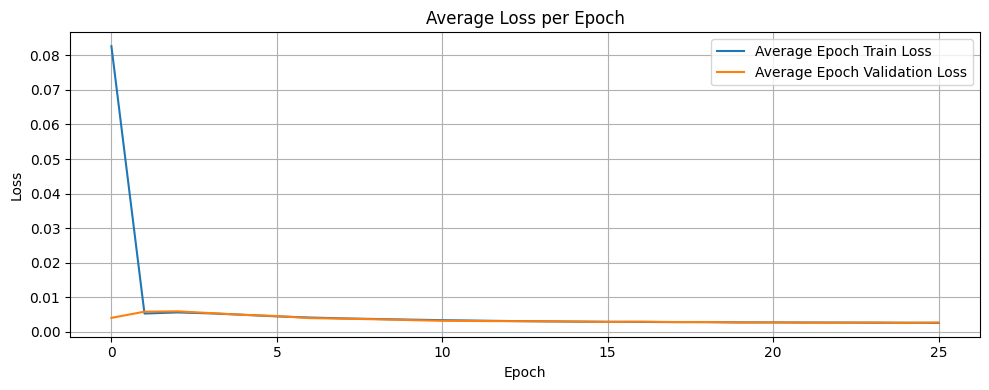

Epoch  27, Batch   1: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  27, Batch   2: loss =  0.0022, output_mean =  0.0002, target_mean =  0.0003
Epoch  27, Batch   3: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  27, Batch   4: loss =  0.0033, output_mean =  0.0002, target_mean =  0.0004
Epoch  27, Batch   5: loss =  0.0030, output_mean =  0.0002, target_mean =  0.0004
Epoch  27, Batch   6: loss =  0.0029, output_mean =  0.0003, target_mean =  0.0004
Epoch  27, Batch   7: loss =  0.0023, output_mean =  0.0003, target_mean =  0.0003
Epoch  27, Batch   8: loss =  0.0027, output_mean =  0.0003, target_mean =  0.0003
Epoch  27, Batch   9: loss =  0.0030, output_mean =  0.0003, target_mean =  0.0004
Epoch  27, Batch  10: loss =  0.0027, output_mean =  0.0002, target_mean =  0.0003
Epoch 27 Average Loss: 0.0027 Validation loss: 0.0027
Validation accuracy: 0.9997


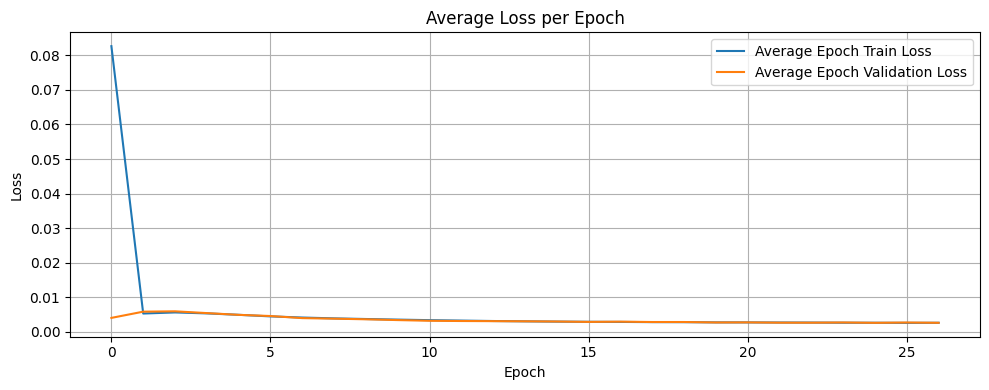

Epoch  28, Batch   1: loss =  0.0030, output_mean =  0.0003, target_mean =  0.0004
Epoch  28, Batch   2: loss =  0.0024, output_mean =  0.0003, target_mean =  0.0003
Epoch  28, Batch   3: loss =  0.0021, output_mean =  0.0003, target_mean =  0.0003
Epoch  28, Batch   4: loss =  0.0031, output_mean =  0.0002, target_mean =  0.0004
Epoch  28, Batch   5: loss =  0.0025, output_mean =  0.0002, target_mean =  0.0003
Epoch  28, Batch   6: loss =  0.0030, output_mean =  0.0003, target_mean =  0.0004
Epoch  28, Batch   7: loss =  0.0034, output_mean =  0.0003, target_mean =  0.0004
Epoch  28, Batch   8: loss =  0.0026, output_mean =  0.0003, target_mean =  0.0003
Epoch  28, Batch   9: loss =  0.0020, output_mean =  0.0003, target_mean =  0.0002
Epoch  28, Batch  10: loss =  0.0023, output_mean =  0.0004, target_mean =  0.0003
Epoch 28 Average Loss: 0.0026 Validation loss: 0.0029
Validation accuracy: 0.9997


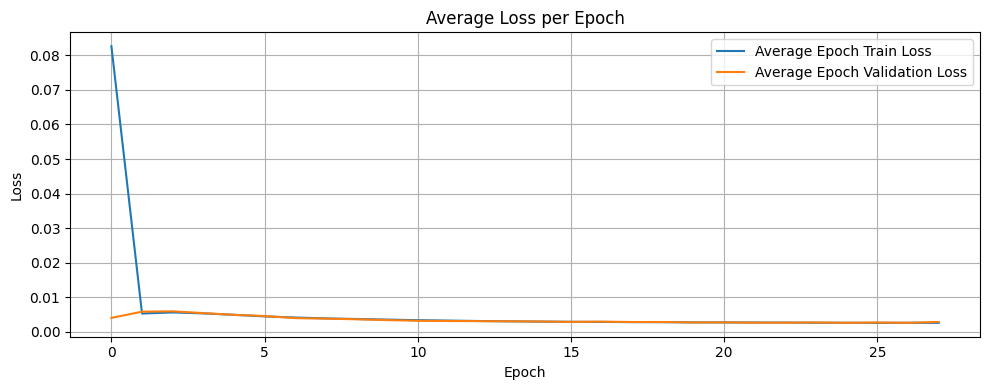

Epoch  29, Batch   1: loss =  0.0021, output_mean =  0.0003, target_mean =  0.0003
Epoch  29, Batch   2: loss =  0.0021, output_mean =  0.0002, target_mean =  0.0003
Epoch  29, Batch   3: loss =  0.0031, output_mean =  0.0002, target_mean =  0.0004
Epoch  29, Batch   4: loss =  0.0025, output_mean =  0.0002, target_mean =  0.0003
Epoch  29, Batch   5: loss =  0.0032, output_mean =  0.0002, target_mean =  0.0004
Epoch  29, Batch   6: loss =  0.0020, output_mean =  0.0002, target_mean =  0.0002
Epoch  29, Batch   7: loss =  0.0032, output_mean =  0.0003, target_mean =  0.0004
Epoch  29, Batch   8: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  29, Batch   9: loss =  0.0024, output_mean =  0.0003, target_mean =  0.0003
Epoch  29, Batch  10: loss =  0.0030, output_mean =  0.0003, target_mean =  0.0004
Epoch 29 Average Loss: 0.0026 Validation loss: 0.0028
Validation accuracy: 0.9997


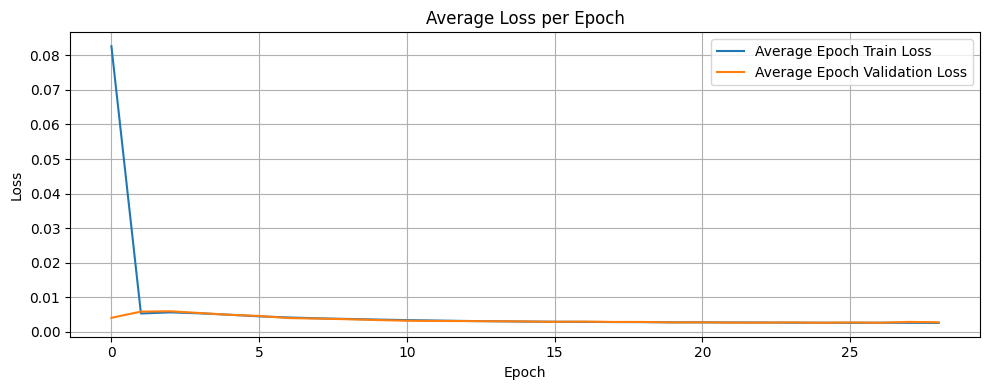

Epoch  30, Batch   1: loss =  0.0028, output_mean =  0.0003, target_mean =  0.0004
Epoch  30, Batch   2: loss =  0.0029, output_mean =  0.0003, target_mean =  0.0004
Epoch  30, Batch   3: loss =  0.0025, output_mean =  0.0003, target_mean =  0.0003
Epoch  30, Batch   4: loss =  0.0030, output_mean =  0.0002, target_mean =  0.0004
Epoch  30, Batch   5: loss =  0.0023, output_mean =  0.0002, target_mean =  0.0003
Epoch  30, Batch   6: loss =  0.0028, output_mean =  0.0002, target_mean =  0.0004
Epoch  30, Batch   7: loss =  0.0021, output_mean =  0.0002, target_mean =  0.0003
Epoch  30, Batch   8: loss =  0.0018, output_mean =  0.0003, target_mean =  0.0002
Epoch  30, Batch   9: loss =  0.0028, output_mean =  0.0002, target_mean =  0.0004
Epoch  30, Batch  10: loss =  0.0028, output_mean =  0.0002, target_mean =  0.0004
Epoch 30 Average Loss: 0.0026 Validation loss: 0.0027
Validation accuracy: 0.9997


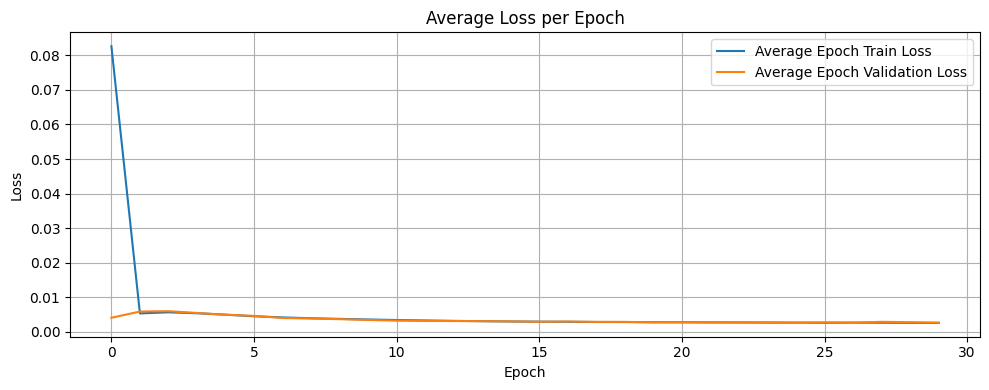

Epoch  31, Batch   1: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  31, Batch   2: loss =  0.0022, output_mean =  0.0003, target_mean =  0.0003
Epoch  31, Batch   3: loss =  0.0031, output_mean =  0.0002, target_mean =  0.0004
Epoch  31, Batch   4: loss =  0.0027, output_mean =  0.0002, target_mean =  0.0004
Epoch  31, Batch   5: loss =  0.0022, output_mean =  0.0002, target_mean =  0.0003
Epoch  31, Batch   6: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  31, Batch   7: loss =  0.0023, output_mean =  0.0003, target_mean =  0.0003
Epoch  31, Batch   8: loss =  0.0032, output_mean =  0.0002, target_mean =  0.0004
Epoch  31, Batch   9: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0004
Epoch  31, Batch  10: loss =  0.0024, output_mean =  0.0003, target_mean =  0.0003
Epoch 31 Average Loss: 0.0026 Validation loss: 0.0027
Validation accuracy: 0.9997


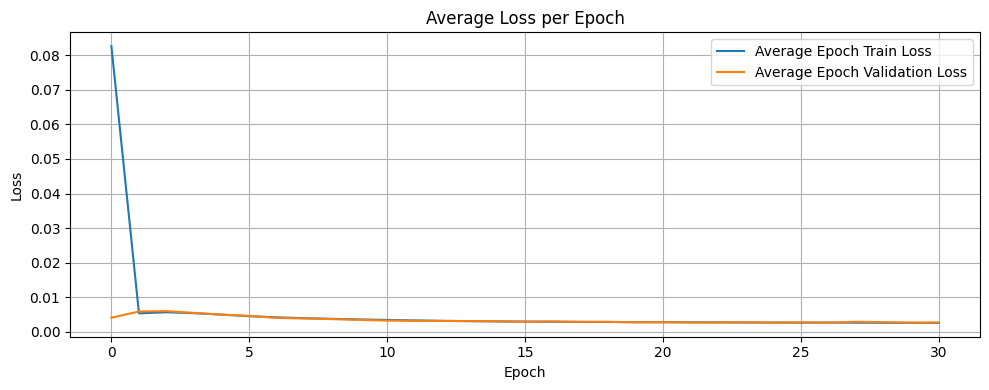

Epoch  32, Batch   1: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  32, Batch   2: loss =  0.0022, output_mean =  0.0003, target_mean =  0.0003
Epoch  32, Batch   3: loss =  0.0024, output_mean =  0.0003, target_mean =  0.0003
Epoch  32, Batch   4: loss =  0.0026, output_mean =  0.0003, target_mean =  0.0004
Epoch  32, Batch   5: loss =  0.0021, output_mean =  0.0003, target_mean =  0.0003
Epoch  32, Batch   6: loss =  0.0031, output_mean =  0.0003, target_mean =  0.0004
Epoch  32, Batch   7: loss =  0.0023, output_mean =  0.0002, target_mean =  0.0003
Epoch  32, Batch   8: loss =  0.0027, output_mean =  0.0002, target_mean =  0.0004
Epoch  32, Batch   9: loss =  0.0036, output_mean =  0.0002, target_mean =  0.0005
Epoch  32, Batch  10: loss =  0.0025, output_mean =  0.0003, target_mean =  0.0003
Epoch 32 Average Loss: 0.0026 Validation loss: 0.0026
Validation accuracy: 0.9997


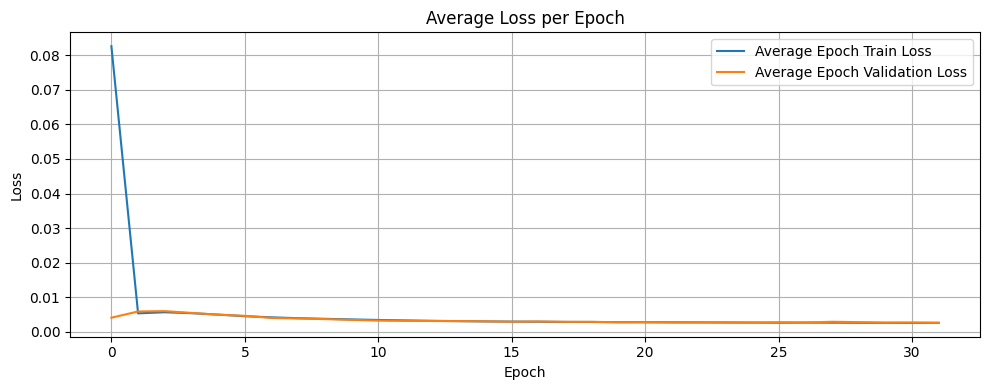

Epoch  33, Batch   1: loss =  0.0023, output_mean =  0.0003, target_mean =  0.0003
Epoch  33, Batch   2: loss =  0.0021, output_mean =  0.0003, target_mean =  0.0003
Epoch  33, Batch   3: loss =  0.0034, output_mean =  0.0003, target_mean =  0.0005
Epoch  33, Batch   4: loss =  0.0024, output_mean =  0.0003, target_mean =  0.0003
Epoch  33, Batch   5: loss =  0.0030, output_mean =  0.0003, target_mean =  0.0004
Epoch  33, Batch   6: loss =  0.0028, output_mean =  0.0002, target_mean =  0.0004
Epoch  33, Batch   7: loss =  0.0025, output_mean =  0.0003, target_mean =  0.0003
Epoch  33, Batch   8: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  33, Batch   9: loss =  0.0025, output_mean =  0.0003, target_mean =  0.0003
Epoch  33, Batch  10: loss =  0.0024, output_mean =  0.0003, target_mean =  0.0003
Epoch 33 Average Loss: 0.0026 Validation loss: 0.0026
Validation accuracy: 0.9997


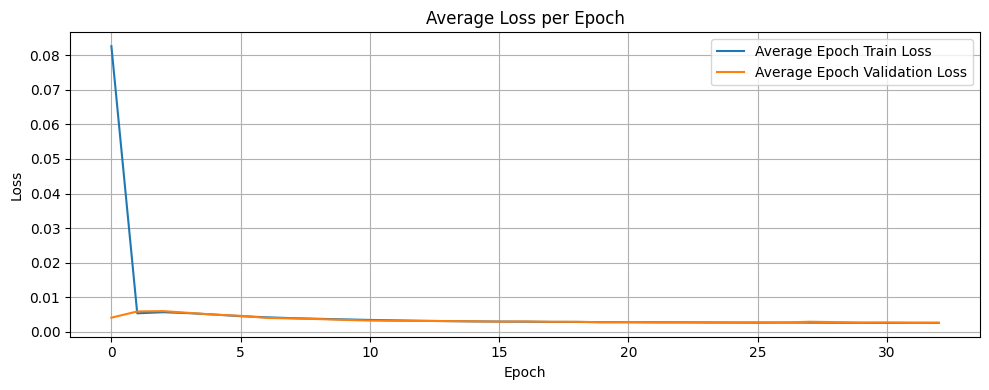

Epoch  34, Batch   1: loss =  0.0025, output_mean =  0.0003, target_mean =  0.0003
Epoch  34, Batch   2: loss =  0.0021, output_mean =  0.0003, target_mean =  0.0003
Epoch  34, Batch   3: loss =  0.0027, output_mean =  0.0003, target_mean =  0.0004
Epoch  34, Batch   4: loss =  0.0029, output_mean =  0.0003, target_mean =  0.0004
Epoch  34, Batch   5: loss =  0.0029, output_mean =  0.0003, target_mean =  0.0004
Epoch  34, Batch   6: loss =  0.0021, output_mean =  0.0003, target_mean =  0.0003
Epoch  34, Batch   7: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  34, Batch   8: loss =  0.0020, output_mean =  0.0002, target_mean =  0.0003
Epoch  34, Batch   9: loss =  0.0031, output_mean =  0.0002, target_mean =  0.0004
Epoch  34, Batch  10: loss =  0.0028, output_mean =  0.0002, target_mean =  0.0004
Epoch 34 Average Loss: 0.0026 Validation loss: 0.0026
Validation accuracy: 0.9997


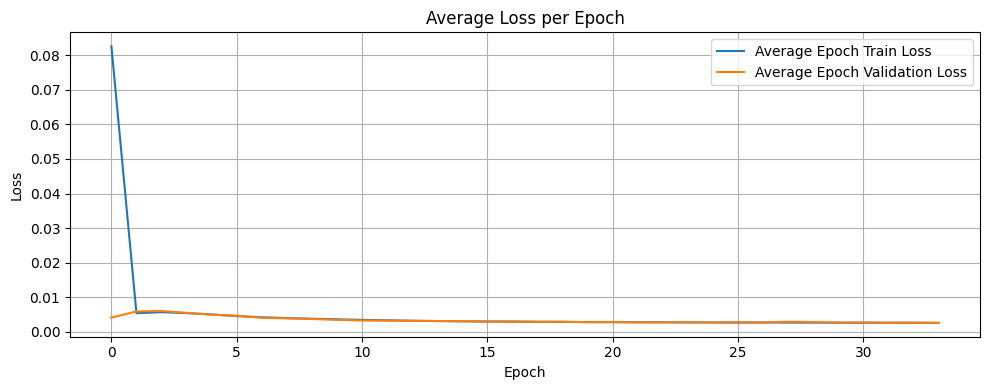

Epoch  35, Batch   1: loss =  0.0022, output_mean =  0.0002, target_mean =  0.0003
Epoch  35, Batch   2: loss =  0.0020, output_mean =  0.0003, target_mean =  0.0003
Epoch  35, Batch   3: loss =  0.0023, output_mean =  0.0002, target_mean =  0.0003
Epoch  35, Batch   4: loss =  0.0025, output_mean =  0.0002, target_mean =  0.0003
Epoch  35, Batch   5: loss =  0.0025, output_mean =  0.0003, target_mean =  0.0003
Epoch  35, Batch   6: loss =  0.0027, output_mean =  0.0003, target_mean =  0.0004
Epoch  35, Batch   7: loss =  0.0030, output_mean =  0.0003, target_mean =  0.0004
Epoch  35, Batch   8: loss =  0.0022, output_mean =  0.0003, target_mean =  0.0003
Epoch  35, Batch   9: loss =  0.0028, output_mean =  0.0003, target_mean =  0.0004
Epoch  35, Batch  10: loss =  0.0032, output_mean =  0.0002, target_mean =  0.0005
Epoch 35 Average Loss: 0.0025 Validation loss: 0.0027
Validation accuracy: 0.9997


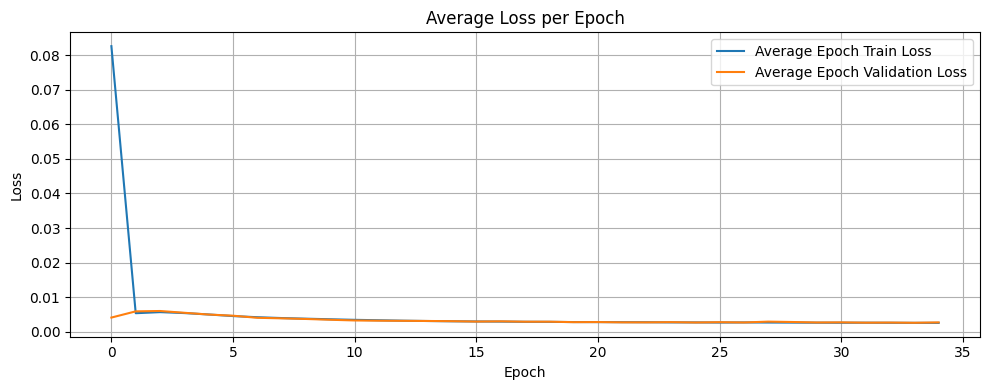

Epoch  36, Batch   1: loss =  0.0025, output_mean =  0.0002, target_mean =  0.0003
Epoch  36, Batch   2: loss =  0.0026, output_mean =  0.0002, target_mean =  0.0004
Epoch  36, Batch   3: loss =  0.0028, output_mean =  0.0002, target_mean =  0.0004
Epoch  36, Batch   4: loss =  0.0020, output_mean =  0.0003, target_mean =  0.0002
Epoch  36, Batch   5: loss =  0.0032, output_mean =  0.0002, target_mean =  0.0004
Epoch  36, Batch   6: loss =  0.0020, output_mean =  0.0002, target_mean =  0.0003
Epoch  36, Batch   7: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  36, Batch   8: loss =  0.0027, output_mean =  0.0003, target_mean =  0.0004
Epoch  36, Batch   9: loss =  0.0023, output_mean =  0.0003, target_mean =  0.0003
Epoch  36, Batch  10: loss =  0.0030, output_mean =  0.0003, target_mean =  0.0004
Epoch 36 Average Loss: 0.0025 Validation loss: 0.0025
Validation accuracy: 0.9997


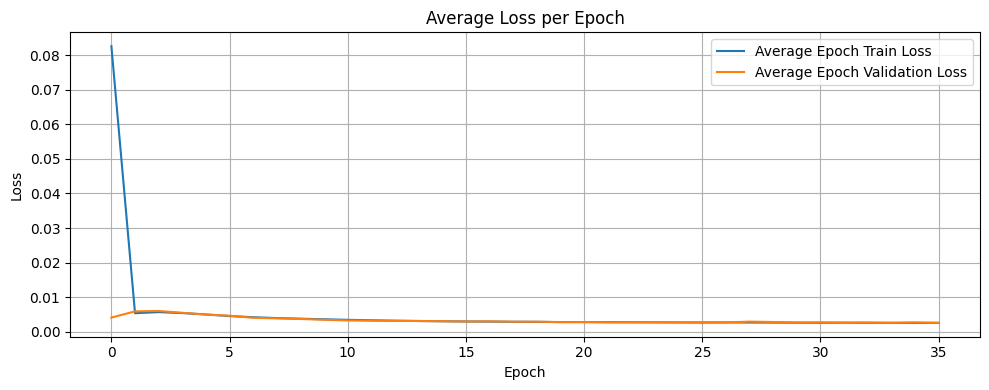

Epoch  37, Batch   1: loss =  0.0022, output_mean =  0.0002, target_mean =  0.0003
Epoch  37, Batch   2: loss =  0.0028, output_mean =  0.0003, target_mean =  0.0004
Epoch  37, Batch   3: loss =  0.0020, output_mean =  0.0003, target_mean =  0.0003
Epoch  37, Batch   4: loss =  0.0023, output_mean =  0.0003, target_mean =  0.0003
Epoch  37, Batch   5: loss =  0.0028, output_mean =  0.0002, target_mean =  0.0004
Epoch  37, Batch   6: loss =  0.0021, output_mean =  0.0003, target_mean =  0.0003
Epoch  37, Batch   7: loss =  0.0030, output_mean =  0.0002, target_mean =  0.0004
Epoch  37, Batch   8: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  37, Batch   9: loss =  0.0026, output_mean =  0.0002, target_mean =  0.0004
Epoch  37, Batch  10: loss =  0.0032, output_mean =  0.0003, target_mean =  0.0005
Epoch 37 Average Loss: 0.0025 Validation loss: 0.0026
Validation accuracy: 0.9997


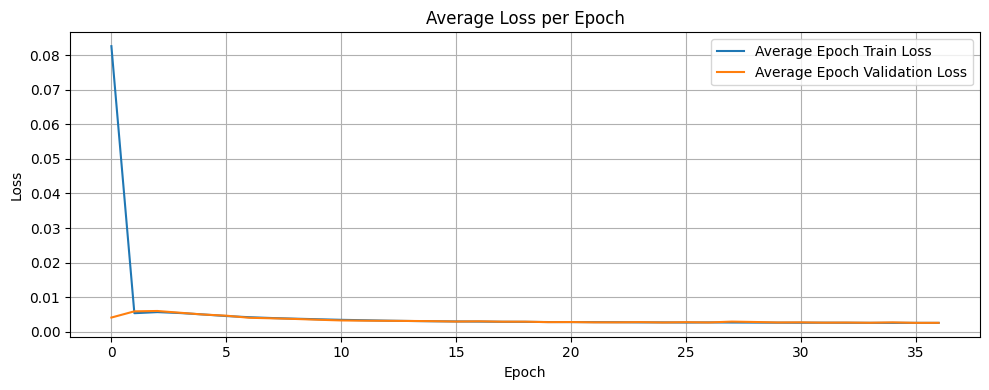

Epoch  38, Batch   1: loss =  0.0020, output_mean =  0.0003, target_mean =  0.0003
Epoch  38, Batch   2: loss =  0.0025, output_mean =  0.0003, target_mean =  0.0003
Epoch  38, Batch   3: loss =  0.0025, output_mean =  0.0003, target_mean =  0.0003
Epoch  38, Batch   4: loss =  0.0022, output_mean =  0.0002, target_mean =  0.0003
Epoch  38, Batch   5: loss =  0.0028, output_mean =  0.0003, target_mean =  0.0004
Epoch  38, Batch   6: loss =  0.0023, output_mean =  0.0003, target_mean =  0.0003
Epoch  38, Batch   7: loss =  0.0023, output_mean =  0.0002, target_mean =  0.0003
Epoch  38, Batch   8: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0004
Epoch  38, Batch   9: loss =  0.0028, output_mean =  0.0002, target_mean =  0.0004
Epoch  38, Batch  10: loss =  0.0030, output_mean =  0.0002, target_mean =  0.0004
Epoch 38 Average Loss: 0.0025 Validation loss: 0.0025
Validation accuracy: 0.9997


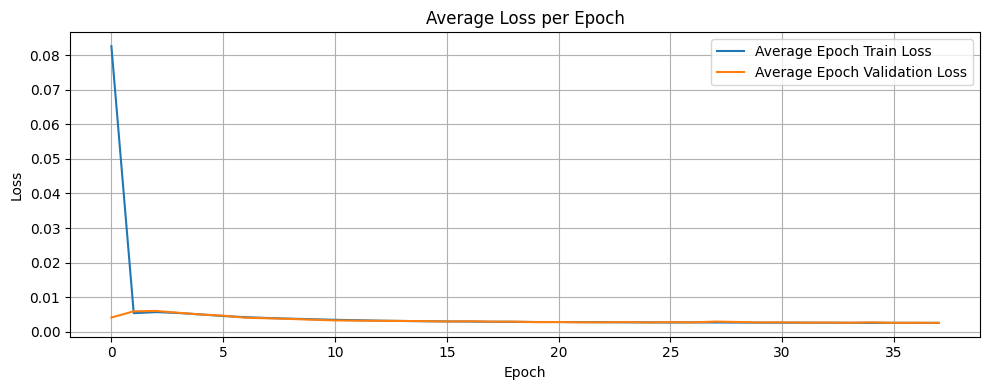

Epoch  39, Batch   1: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  39, Batch   2: loss =  0.0028, output_mean =  0.0003, target_mean =  0.0004
Epoch  39, Batch   3: loss =  0.0023, output_mean =  0.0003, target_mean =  0.0003
Epoch  39, Batch   4: loss =  0.0021, output_mean =  0.0003, target_mean =  0.0003
Epoch  39, Batch   5: loss =  0.0023, output_mean =  0.0003, target_mean =  0.0003
Epoch  39, Batch   6: loss =  0.0030, output_mean =  0.0003, target_mean =  0.0004
Epoch  39, Batch   7: loss =  0.0023, output_mean =  0.0002, target_mean =  0.0003
Epoch  39, Batch   8: loss =  0.0026, output_mean =  0.0002, target_mean =  0.0004
Epoch  39, Batch   9: loss =  0.0026, output_mean =  0.0002, target_mean =  0.0004
Epoch  39, Batch  10: loss =  0.0026, output_mean =  0.0002, target_mean =  0.0004
Epoch 39 Average Loss: 0.0025 Validation loss: 0.0025
Validation accuracy: 0.9997


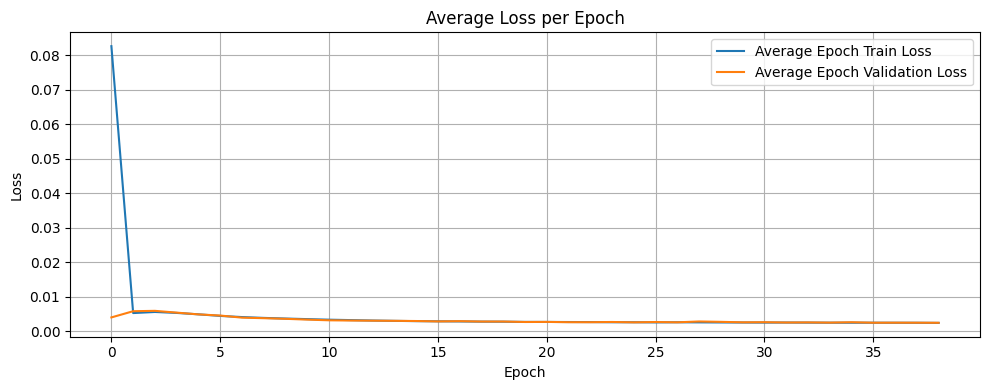

Epoch  40, Batch   1: loss =  0.0028, output_mean =  0.0002, target_mean =  0.0004
Epoch  40, Batch   2: loss =  0.0019, output_mean =  0.0003, target_mean =  0.0003
Epoch  40, Batch   3: loss =  0.0026, output_mean =  0.0002, target_mean =  0.0003
Epoch  40, Batch   4: loss =  0.0020, output_mean =  0.0003, target_mean =  0.0003
Epoch  40, Batch   5: loss =  0.0024, output_mean =  0.0003, target_mean =  0.0003
Epoch  40, Batch   6: loss =  0.0031, output_mean =  0.0003, target_mean =  0.0005
Epoch  40, Batch   7: loss =  0.0030, output_mean =  0.0003, target_mean =  0.0004
Epoch  40, Batch   8: loss =  0.0027, output_mean =  0.0003, target_mean =  0.0004
Epoch  40, Batch   9: loss =  0.0025, output_mean =  0.0003, target_mean =  0.0003
Epoch  40, Batch  10: loss =  0.0020, output_mean =  0.0003, target_mean =  0.0003
Epoch 40 Average Loss: 0.0025 Validation loss: 0.0025
Validation accuracy: 0.9997


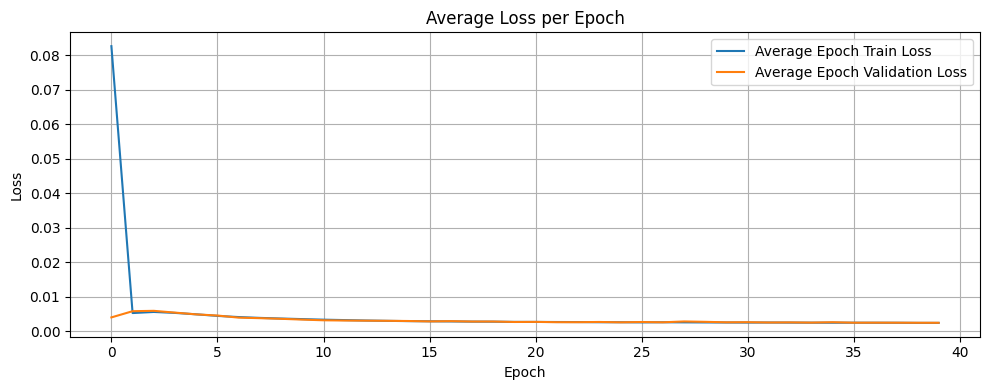

Epoch  41, Batch   1: loss =  0.0023, output_mean =  0.0003, target_mean =  0.0003
Epoch  41, Batch   2: loss =  0.0023, output_mean =  0.0002, target_mean =  0.0003
Epoch  41, Batch   3: loss =  0.0026, output_mean =  0.0002, target_mean =  0.0003
Epoch  41, Batch   4: loss =  0.0027, output_mean =  0.0002, target_mean =  0.0004
Epoch  41, Batch   5: loss =  0.0027, output_mean =  0.0002, target_mean =  0.0004
Epoch  41, Batch   6: loss =  0.0027, output_mean =  0.0002, target_mean =  0.0004
Epoch  41, Batch   7: loss =  0.0017, output_mean =  0.0003, target_mean =  0.0002
Epoch  41, Batch   8: loss =  0.0029, output_mean =  0.0003, target_mean =  0.0004
Epoch  41, Batch   9: loss =  0.0030, output_mean =  0.0003, target_mean =  0.0004
Epoch  41, Batch  10: loss =  0.0023, output_mean =  0.0003, target_mean =  0.0003
Epoch 41 Average Loss: 0.0025 Validation loss: 0.0026
Validation accuracy: 0.9997


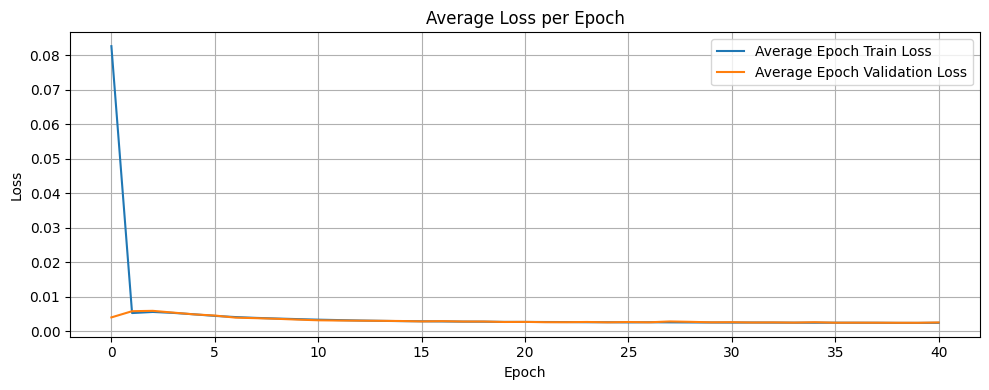

Epoch  42, Batch   1: loss =  0.0024, output_mean =  0.0003, target_mean =  0.0003
Epoch  42, Batch   2: loss =  0.0020, output_mean =  0.0003, target_mean =  0.0003
Epoch  42, Batch   3: loss =  0.0023, output_mean =  0.0003, target_mean =  0.0003
Epoch  42, Batch   4: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  42, Batch   5: loss =  0.0034, output_mean =  0.0002, target_mean =  0.0005
Epoch  42, Batch   6: loss =  0.0021, output_mean =  0.0003, target_mean =  0.0003
Epoch  42, Batch   7: loss =  0.0032, output_mean =  0.0003, target_mean =  0.0004
Epoch  42, Batch   8: loss =  0.0021, output_mean =  0.0003, target_mean =  0.0003
Epoch  42, Batch   9: loss =  0.0023, output_mean =  0.0004, target_mean =  0.0003
Epoch  42, Batch  10: loss =  0.0029, output_mean =  0.0003, target_mean =  0.0004
Epoch 42 Average Loss: 0.0025 Validation loss: 0.0028
Validation accuracy: 0.9997


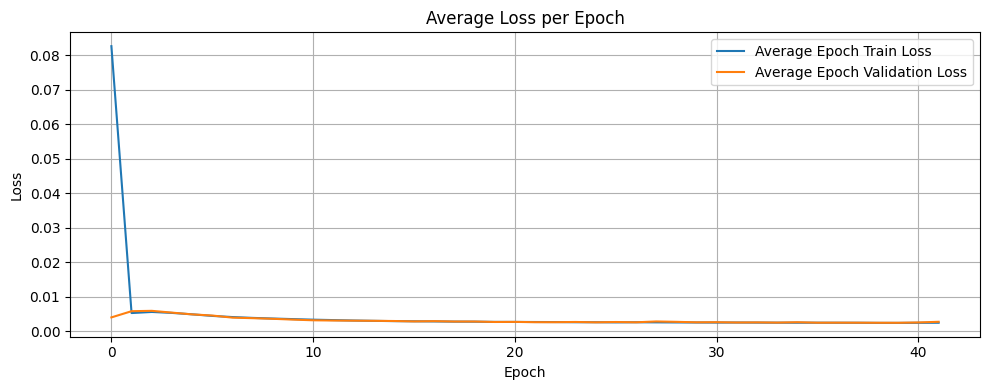

Epoch  43, Batch   1: loss =  0.0025, output_mean =  0.0003, target_mean =  0.0003
Epoch  43, Batch   2: loss =  0.0029, output_mean =  0.0003, target_mean =  0.0004
Epoch  43, Batch   3: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0004
Epoch  43, Batch   4: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0004
Epoch  43, Batch   5: loss =  0.0019, output_mean =  0.0002, target_mean =  0.0003
Epoch  43, Batch   6: loss =  0.0032, output_mean =  0.0002, target_mean =  0.0005
Epoch  43, Batch   7: loss =  0.0022, output_mean =  0.0002, target_mean =  0.0003
Epoch  43, Batch   8: loss =  0.0021, output_mean =  0.0002, target_mean =  0.0003
Epoch  43, Batch   9: loss =  0.0023, output_mean =  0.0003, target_mean =  0.0003
Epoch  43, Batch  10: loss =  0.0021, output_mean =  0.0003, target_mean =  0.0003
Epoch 43 Average Loss: 0.0025 Validation loss: 0.0028
Validation accuracy: 0.9997


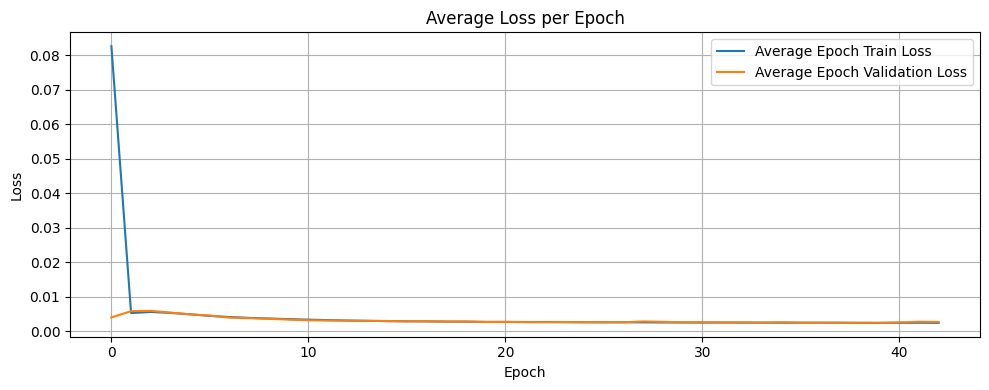

Epoch  44, Batch   1: loss =  0.0024, output_mean =  0.0003, target_mean =  0.0003
Epoch  44, Batch   2: loss =  0.0025, output_mean =  0.0003, target_mean =  0.0003
Epoch  44, Batch   3: loss =  0.0017, output_mean =  0.0003, target_mean =  0.0002
Epoch  44, Batch   4: loss =  0.0025, output_mean =  0.0003, target_mean =  0.0003
Epoch  44, Batch   5: loss =  0.0023, output_mean =  0.0002, target_mean =  0.0003
Epoch  44, Batch   6: loss =  0.0029, output_mean =  0.0003, target_mean =  0.0004
Epoch  44, Batch   7: loss =  0.0022, output_mean =  0.0003, target_mean =  0.0003
Epoch  44, Batch   8: loss =  0.0037, output_mean =  0.0003, target_mean =  0.0005
Epoch  44, Batch   9: loss =  0.0025, output_mean =  0.0003, target_mean =  0.0004
Epoch  44, Batch  10: loss =  0.0021, output_mean =  0.0003, target_mean =  0.0003
Epoch 44 Average Loss: 0.0025 Validation loss: 0.0025
Validation accuracy: 0.9997


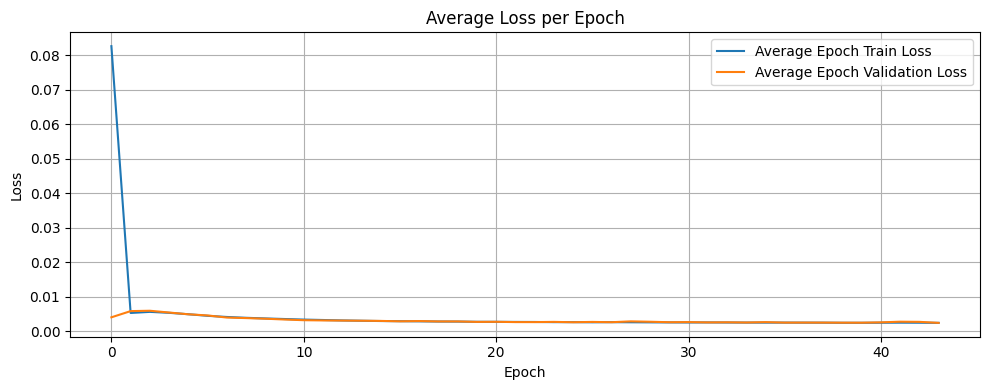

Epoch  45, Batch   1: loss =  0.0026, output_mean =  0.0003, target_mean =  0.0004
Epoch  45, Batch   2: loss =  0.0016, output_mean =  0.0003, target_mean =  0.0002
Epoch  45, Batch   3: loss =  0.0027, output_mean =  0.0003, target_mean =  0.0004
Epoch  45, Batch   4: loss =  0.0022, output_mean =  0.0002, target_mean =  0.0003
Epoch  45, Batch   5: loss =  0.0029, output_mean =  0.0002, target_mean =  0.0004
Epoch  45, Batch   6: loss =  0.0030, output_mean =  0.0002, target_mean =  0.0004
Epoch  45, Batch   7: loss =  0.0030, output_mean =  0.0002, target_mean =  0.0004
Epoch  45, Batch   8: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  45, Batch   9: loss =  0.0023, output_mean =  0.0003, target_mean =  0.0003
Epoch  45, Batch  10: loss =  0.0021, output_mean =  0.0003, target_mean =  0.0003
Epoch 45 Average Loss: 0.0025 Validation loss: 0.0026
Validation accuracy: 0.9997


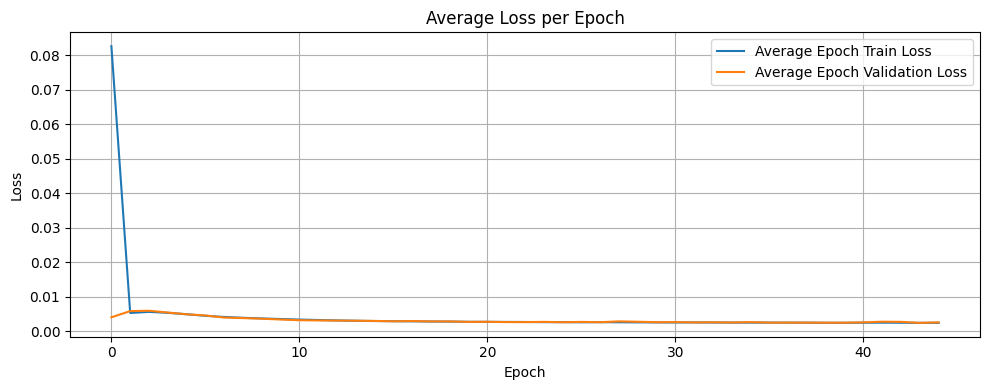

Epoch  46, Batch   1: loss =  0.0023, output_mean =  0.0003, target_mean =  0.0003
Epoch  46, Batch   2: loss =  0.0032, output_mean =  0.0003, target_mean =  0.0005
Epoch  46, Batch   3: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  46, Batch   4: loss =  0.0027, output_mean =  0.0003, target_mean =  0.0004
Epoch  46, Batch   5: loss =  0.0025, output_mean =  0.0002, target_mean =  0.0004
Epoch  46, Batch   6: loss =  0.0023, output_mean =  0.0002, target_mean =  0.0003
Epoch  46, Batch   7: loss =  0.0025, output_mean =  0.0002, target_mean =  0.0003
Epoch  46, Batch   8: loss =  0.0023, output_mean =  0.0002, target_mean =  0.0003
Epoch  46, Batch   9: loss =  0.0019, output_mean =  0.0002, target_mean =  0.0003
Epoch  46, Batch  10: loss =  0.0027, output_mean =  0.0002, target_mean =  0.0004
Epoch 46 Average Loss: 0.0025 Validation loss: 0.0025
Validation accuracy: 0.9997


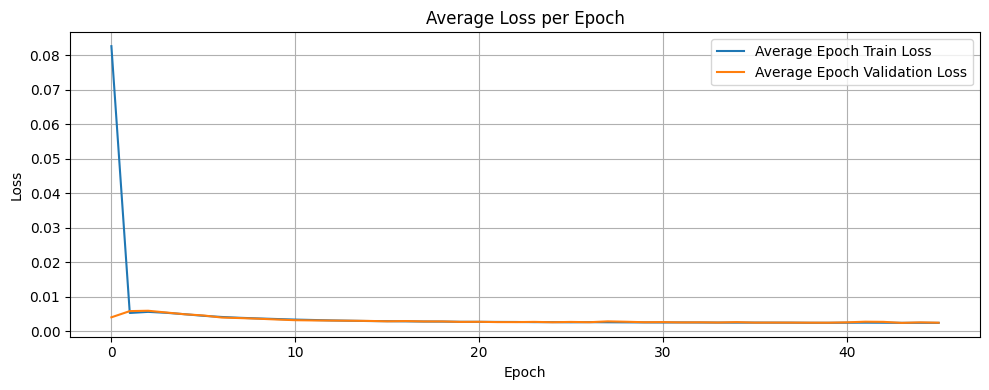

Epoch  47, Batch   1: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  47, Batch   2: loss =  0.0022, output_mean =  0.0003, target_mean =  0.0003
Epoch  47, Batch   3: loss =  0.0020, output_mean =  0.0003, target_mean =  0.0003
Epoch  47, Batch   4: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch  47, Batch   5: loss =  0.0030, output_mean =  0.0003, target_mean =  0.0004
Epoch  47, Batch   6: loss =  0.0024, output_mean =  0.0003, target_mean =  0.0003
Epoch  47, Batch   7: loss =  0.0024, output_mean =  0.0003, target_mean =  0.0003
Epoch  47, Batch   8: loss =  0.0026, output_mean =  0.0003, target_mean =  0.0004
Epoch  47, Batch   9: loss =  0.0024, output_mean =  0.0003, target_mean =  0.0003
Epoch  47, Batch  10: loss =  0.0028, output_mean =  0.0003, target_mean =  0.0004
Epoch 47 Average Loss: 0.0025 Validation loss: 0.0028
Validation accuracy: 0.9997


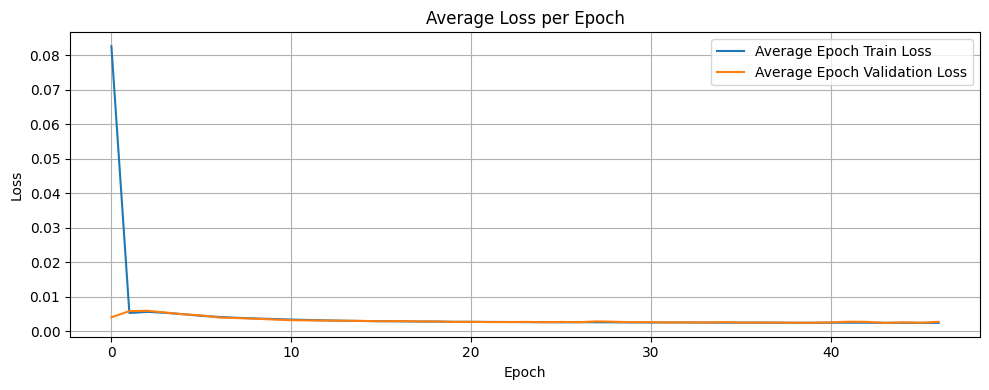

Epoch  48, Batch   1: loss =  0.0027, output_mean =  0.0003, target_mean =  0.0004
Epoch  48, Batch   2: loss =  0.0030, output_mean =  0.0004, target_mean =  0.0004
Epoch  48, Batch   3: loss =  0.0023, output_mean =  0.0004, target_mean =  0.0003
Epoch  48, Batch   4: loss =  0.0023, output_mean =  0.0003, target_mean =  0.0003
Epoch  48, Batch   5: loss =  0.0025, output_mean =  0.0002, target_mean =  0.0004
Epoch  48, Batch   6: loss =  0.0019, output_mean =  0.0002, target_mean =  0.0003
Epoch  48, Batch   7: loss =  0.0030, output_mean =  0.0002, target_mean =  0.0004
Epoch  48, Batch   8: loss =  0.0025, output_mean =  0.0002, target_mean =  0.0004
Epoch  48, Batch   9: loss =  0.0023, output_mean =  0.0002, target_mean =  0.0003
Epoch  48, Batch  10: loss =  0.0024, output_mean =  0.0002, target_mean =  0.0003
Epoch 48 Average Loss: 0.0025 Validation loss: 0.0024
Validation accuracy: 0.9997


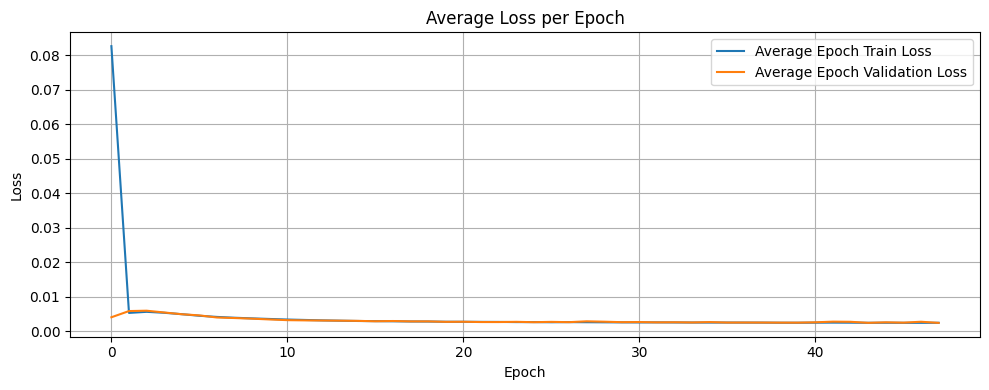

Epoch  49, Batch   1: loss =  0.0028, output_mean =  0.0003, target_mean =  0.0004
Epoch  49, Batch   2: loss =  0.0018, output_mean =  0.0003, target_mean =  0.0002
Epoch  49, Batch   3: loss =  0.0027, output_mean =  0.0003, target_mean =  0.0004
Epoch  49, Batch   4: loss =  0.0030, output_mean =  0.0003, target_mean =  0.0004
Epoch  49, Batch   5: loss =  0.0022, output_mean =  0.0003, target_mean =  0.0003
Epoch  49, Batch   6: loss =  0.0024, output_mean =  0.0003, target_mean =  0.0003
Epoch  49, Batch   7: loss =  0.0022, output_mean =  0.0003, target_mean =  0.0003
Epoch  49, Batch   8: loss =  0.0023, output_mean =  0.0003, target_mean =  0.0003
Epoch  49, Batch   9: loss =  0.0021, output_mean =  0.0002, target_mean =  0.0003
Epoch  49, Batch  10: loss =  0.0028, output_mean =  0.0003, target_mean =  0.0004
Epoch 49 Average Loss: 0.0024 Validation loss: 0.0025
Validation accuracy: 0.9997


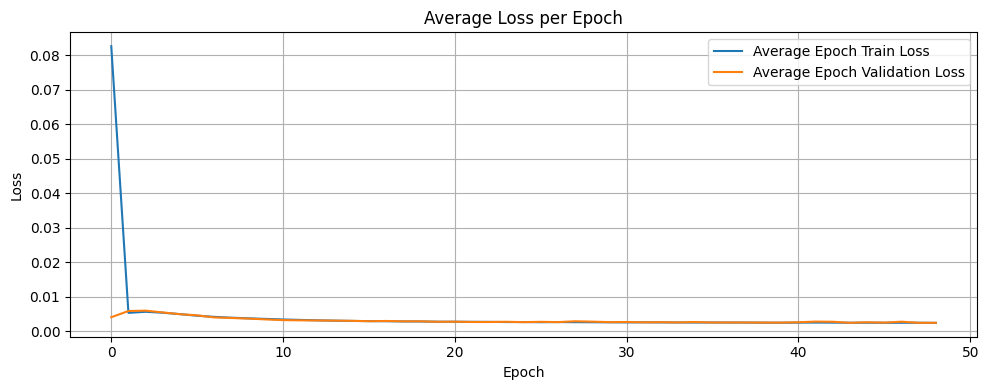

Epoch  50, Batch   1: loss =  0.0034, output_mean =  0.0002, target_mean =  0.0005
Epoch  50, Batch   2: loss =  0.0023, output_mean =  0.0002, target_mean =  0.0003
Epoch  50, Batch   3: loss =  0.0023, output_mean =  0.0002, target_mean =  0.0003
Epoch  50, Batch   4: loss =  0.0020, output_mean =  0.0003, target_mean =  0.0003
Epoch  50, Batch   5: loss =  0.0020, output_mean =  0.0003, target_mean =  0.0003
Epoch  50, Batch   6: loss =  0.0025, output_mean =  0.0002, target_mean =  0.0004
Epoch  50, Batch   7: loss =  0.0025, output_mean =  0.0002, target_mean =  0.0004
Epoch  50, Batch   8: loss =  0.0022, output_mean =  0.0003, target_mean =  0.0003
Epoch  50, Batch   9: loss =  0.0028, output_mean =  0.0002, target_mean =  0.0004
Epoch  50, Batch  10: loss =  0.0022, output_mean =  0.0003, target_mean =  0.0003
Epoch 50 Average Loss: 0.0024 Validation loss: 0.0024
Validation accuracy: 0.9997


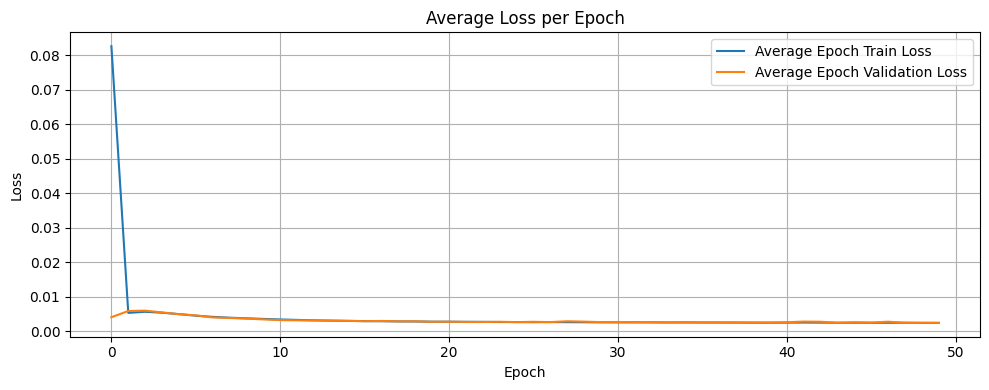

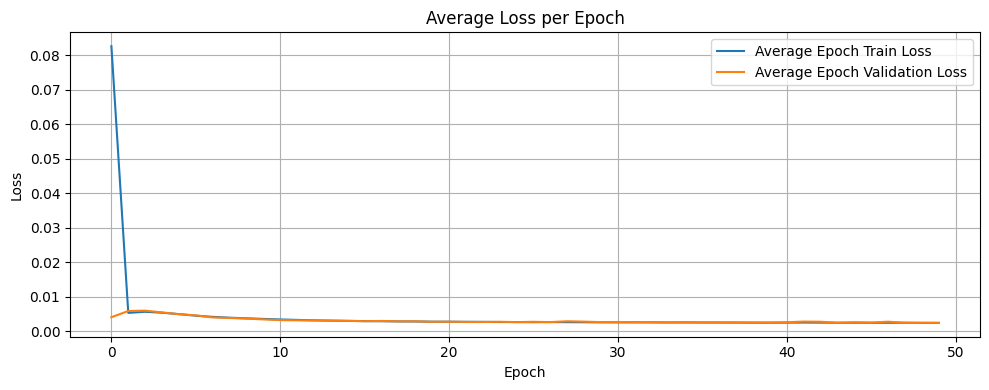

In [53]:
def savePlot(epoch, batch_id, output, target):
    # Compare results
    output_image = torch.sigmoid(output[-1]).cpu().detach().numpy()
    target_image = target[-1].cpu().detach().numpy()

    _, axes = plt.subplots(1, 2, figsize=(20, 10))
    axes[0].imshow(output_image.squeeze(), cmap='gray')
    axes[0].set_title(f"Epoch {epoch + 1} - Output Image")
    axes[0].axis("off")

    axes[1].imshow(target_image.squeeze(), cmap='gray')
    axes[1].set_title("Target Image")
    axes[1].axis("off")

    plt.tight_layout()
    plotDirectory = f"{trainDirectory}/epoch{epoch + 1}"
    os.makedirs(plotDirectory, exist_ok=True)
    plt.savefig(plotDirectory + f"/batch_{batch_id + 1}.png")
    plt.close()

def validate_segmentation_model(model, validation_loader, criterion, device):
    """
    Validates a segmentation model and returns the average loss and accuracy.

    Args:
        model (torch.nn.Module): The segmentation model.
        validation_loader (DataLoader): The data loader for the validation set.
        criterion (torch.nn.Module): The loss function.
        device (str): The device to run the validation on ('cuda' or 'cpu').

    Returns:
        tuple: A tuple containing the average loss and accuracy.
    """
    model.eval()
    total_loss = 0.0
    correct_pixels = 0
    total_pixels = 0

    with torch.no_grad():
        for _, (images, masks) in enumerate(validation_loader):
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)

            total_loss += loss.item()

            predicted_masks = (torch.sigmoid(outputs) > 0.5).float()
            correct_pixels += (predicted_masks == masks).sum().item()
            total_pixels += masks.numel()

    avg_loss = total_loss / len(validation_loader)
    accuracy = correct_pixels / total_pixels

    return avg_loss, accuracy

losses = []
epoch_losses = []
validation_epoch_losses = []
epochs = 50
trainDirectory = "D:/COMP9444/rebarV1/training"
os.makedirs(trainDirectory, exist_ok=True)

for epoch in range(epochs):
    epoch_loss_total = 0
    num_batches = 0
    model.train()
    for batch_id, (data, target) in enumerate(train_loader):
        data = data.to(device)
        target = target.to(device)

        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        num_batches += 1

        loss.backward()
        optimizer.step()
        epoch_loss_total += loss.item()

        
        # Save and print loss
        losses.append(loss.item())
        print('Epoch %3d, Batch %3d: loss = %7.4f, output_mean = %7.4f, target_mean = %7.4f' %
        (epoch + 1, batch_id + 1, loss.item(), torch.sigmoid(output).mean().item(), target.mean().item()))
        savePlot(epoch, batch_id, output, target)

       
    # Validation step
    avg_validation_epoch_loss, val_accuracy = validate_segmentation_model(model, validation_loader, criterion, device)


    # Compute and log average loss for this epoch
    avg_epoch_loss = epoch_loss_total / num_batches
    epoch_losses.append(avg_epoch_loss)
    validation_epoch_losses.append(avg_validation_epoch_loss)
    print(f"Epoch {epoch + 1} Average Loss: {avg_epoch_loss:.4f} Validation loss: {avg_validation_epoch_loss:.4f}")
    print(f"Validation accuracy: {val_accuracy:.4f}")
    plt.figure(figsize=(10, 4))
    plt.plot(epoch_losses, label='Average Epoch Train Loss')
    plt.plot(validation_epoch_losses, label='Average Epoch Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Average Loss per Epoch')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


plt.figure(figsize=(10, 4))
plt.plot(epoch_losses, label='Average Epoch Train Loss')
plt.plot(validation_epoch_losses, label='Average Epoch Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Average Loss per Epoch')
plt.legend()
plt.grid(True)
plt.tight_layout()

# Save the plot
plt.savefig(trainDirectory + "/epochLoss.png")

## 4.6. Download model (optional)

In [54]:
torch.save(model.state_dict(), "finalRebar.pth")

## 4.7. Test model

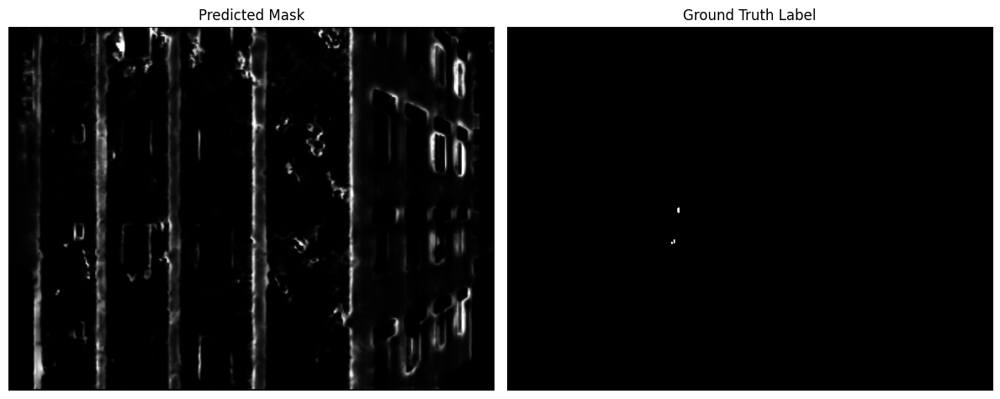

{'iou': 0.0, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0}


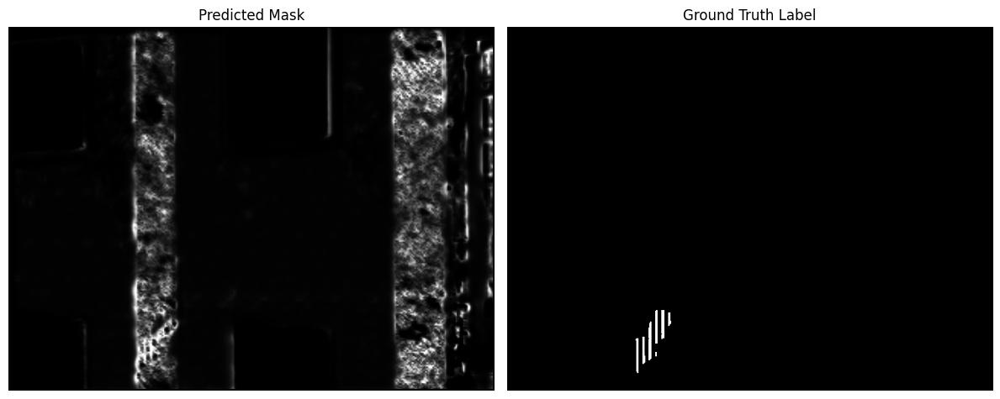

{'iou': 0.0, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0}


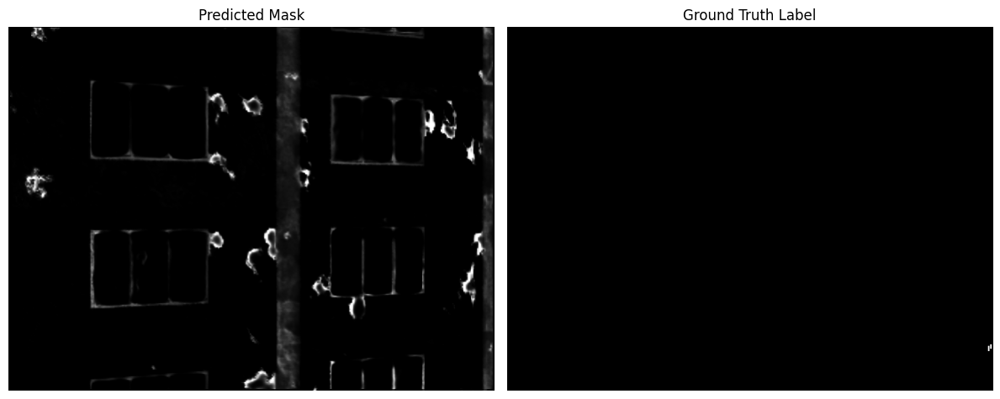

{'iou': 0.0, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0}


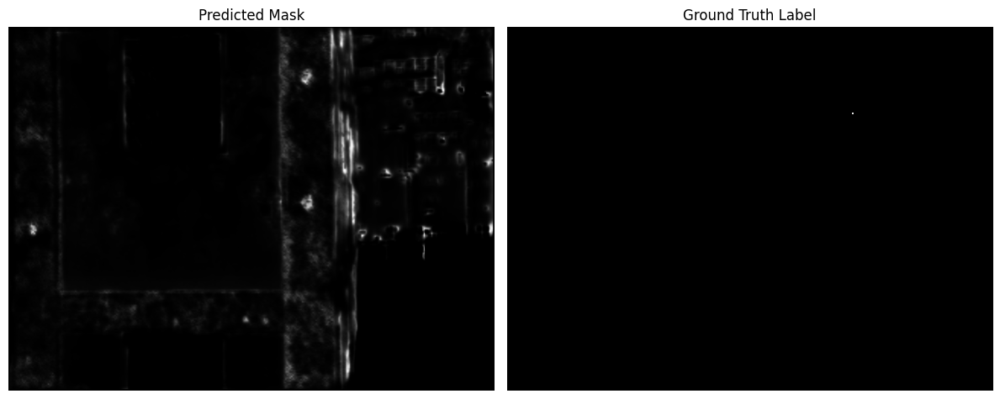

{'iou': 0.0, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0}


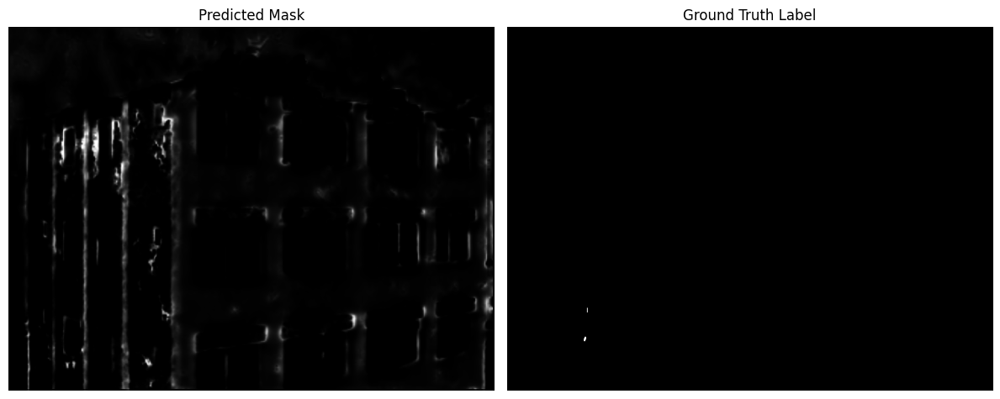

{'iou': 0.0, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0}


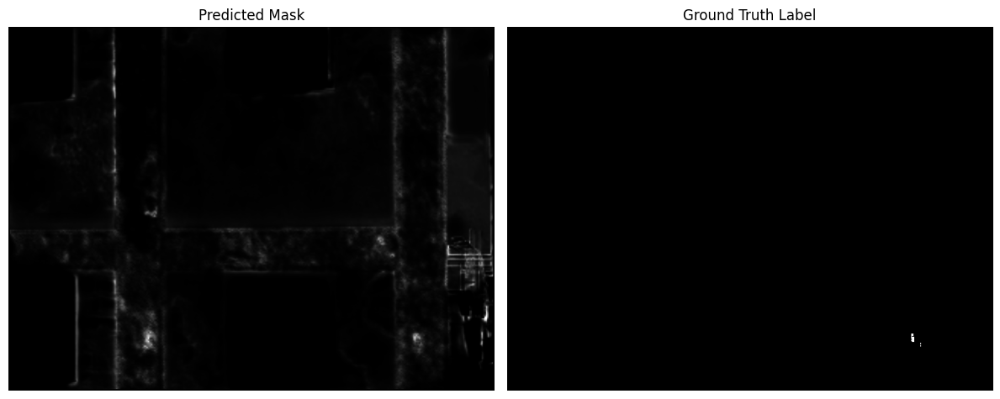

{'iou': 0.0, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0}


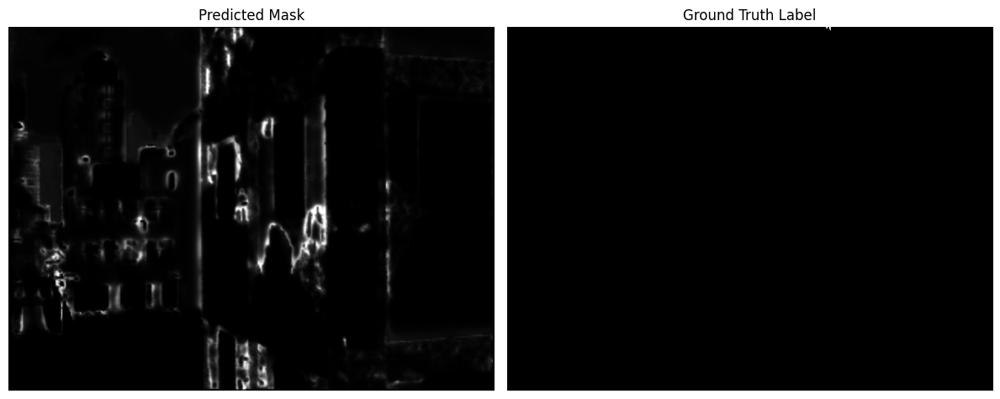

{'iou': 0.0, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0}


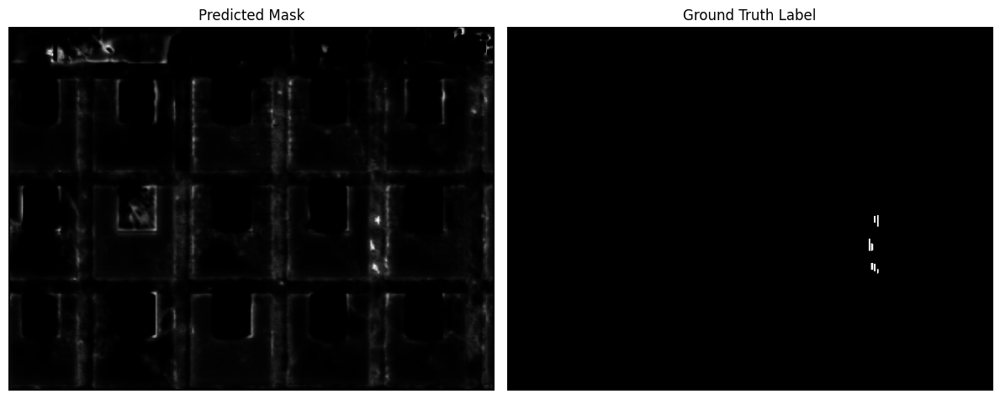

{'iou': 0.0, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0}


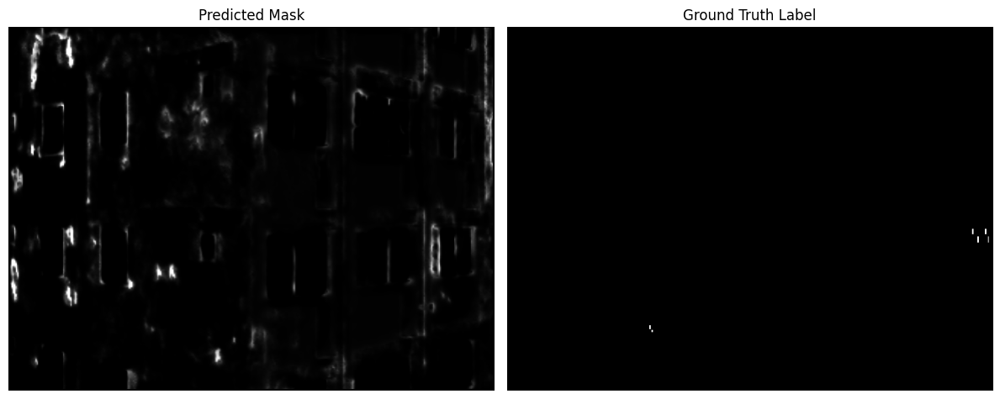

{'iou': 0.0, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0}


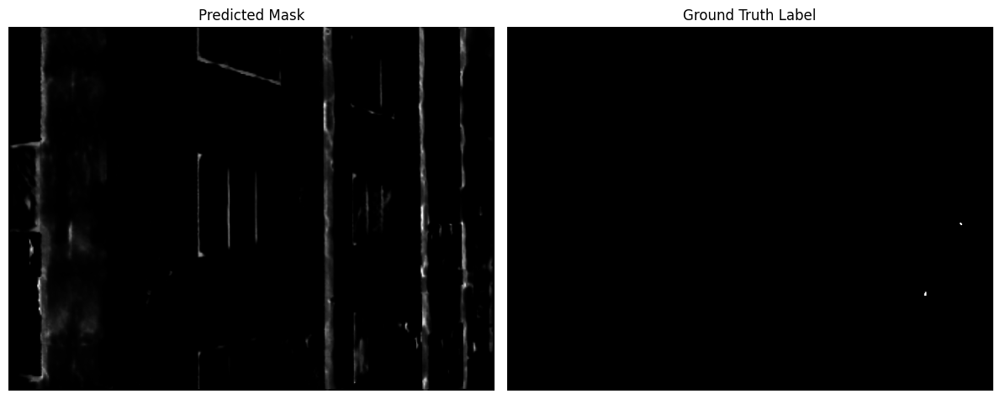

{'iou': 0.0, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0}
Validation - IoU: 0.0000, Precision: 0.0000, Recall: 0.0000, F1: 0.0000, 


In [55]:
from torchmetrics.classification import (
    BinaryJaccardIndex,
    BinaryPrecision,
    BinaryRecall,
    BinaryF1Score
)

def visualize_results(pred_mask, label_mask):
    """Display the predicted and ground truth masks."""
    _, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(pred_mask, cmap='gray')
    axes[0].set_title("Predicted Mask")
    axes[0].axis("off")

    axes[1].imshow(label_mask, cmap='gray')
    axes[1].set_title("Ground Truth Label")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()


def iou_score(outputs, targets, threshold):
    outputs = torch.sigmoid(outputs)

    # --- Visualization only ---
    pred_mask_vis = outputs[-1].squeeze().detach().cpu().numpy()
    label_mask_vis = targets[-1].squeeze().detach().cpu().numpy()
    visualize_results(pred_mask_vis, label_mask_vis)

    # --- Prepare predictions and labels ---
    preds = (outputs > threshold).int().squeeze(1)   # [B, H, W]
    targets = targets.int().squeeze(1)   # [B, H, W]

    # --- Initialize metrics ---
    iou = BinaryJaccardIndex(threshold=threshold).to(outputs.device)
    precision = BinaryPrecision(threshold=threshold).to(outputs.device)
    recall = BinaryRecall(threshold=threshold).to(outputs.device)
    f1 = BinaryF1Score(threshold=threshold).to(outputs.device)

    # --- Update metrics ---
    iou.update(preds, targets)
    precision.update(preds, targets)
    recall.update(preds, targets)
    f1.update(preds, targets)

    # --- Compute metrics ---
    return {
        'iou': iou.compute().item(),
        'precision': precision.compute().item(),
        'recall': recall.compute().item(),
        'f1': f1.compute().item()
    }



model.eval()
total_metrics = {'iou': 0, 'precision': 0, 'recall': 0, 'f1': 0}

with torch.no_grad():
    for images, masks in test_loader:
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)
        scores = iou_score(outputs, masks, 0.2)
        for k in total_metrics:
            total_metrics[k] += scores[k]
        print(scores)

# Average metrics
num_batches = len(test_loader)
avg_metrics = {k: v / num_batches for k, v in total_metrics.items()}
print(
    f"Validation - IoU: {avg_metrics['iou']:.4f}, "
    f"Precision: {avg_metrics['precision']:.4f}, "
    f"Recall: {avg_metrics['recall']:.4f}, "
    f"F1: {avg_metrics['f1']:.4f}, "
)

## 5. Results
### 5.1. Crack detection
| Method                      | Precision | Recall | F1     | Accuracy | IoU   |
|----------------------------|-----------|--------|--------|----------|-------|
| Truncated Yolov8                   | 0.7340    | 0.0754 | 0.1376 | 0.9606  |  --------     |
| SegFormer + Custom Multi-task | 0.2763    | 0.5472 | 0.3661 | 0.9194   | 0.1493|
| CustomFCN              | 0.4113    | 0.5544 | 0.4721 |   --------       | 0.3092 |  

![Crack result images](notebook_images/Crack%20results.png)
![Crack Epoch vs Training and Validation Loss ](notebook_images/CrackEpochLoss.png)

Crack detection was the most successful outcome of our model. CustomFCN effectively learned to identify fine, linear features representative of cracks across a variety of textures and lighting conditions. The predicted masks closely resembled the ground truth labels, with only minimal over-prediction along structural edges. This performance indicates that the model has generalized well, capturing crack-like structures without exhibiting signs of overfitting. It demonstrates the network's ability to recognize subtle visual cues associated with surface-level damage.

The training loss curve for cracks demonstrates a stable and consistent downward trend. After an initial period of rapid learning, the loss steadily decreases and eventually plateaus. The absence of significant fluctuations or divergence suggests that the model converged smoothly and maintained generalization without overfitting. This trend aligns well with the observed quality of the crack predictions and confirms that the training process was effective.

### 5.2. Spall detection
| Method                      | Precision | Recall | F1     | Accuracy | IoU   |
|----------------------------|-----------|--------|--------|----------|-------|
|Truncated Yolov8  | 0.808 | 0.791 | 0.7935 | 0.9180 | --------|
|SegFormer + Custom Multi-task | 0.2654 | 0.4128 | 0.3215 | 0.9023 | 0.1249|
|CustomFCN | 0.5826 | 0.7549 | 0.7183 | -------- | 0.7361  |

![Spall result images](notebook_images/Spalls%20results.png)
![Spall Epoch vs Training and Validation Loss ](notebook_images/SpallEpochLoss.png)

Spall detection, while more challenging, produced reasonably accurate results. Spalls often exhibit irregular, diffuse shapes with poorly defined boundaries, making them more difficult to localize. Despite this, the model was able to highlight relevant regions, particularly for larger spalls in its prediction masks. Although the predictions lack precise edge alignment, they show good regional localization. This suggests that the model relied more on learning global shape and texture features rather than sharp edge boundaries, which is appropriate given the nature of spalling damage.

The loss curve for spalls shows a generally decreasing trend, although with more variability compared to cracks. This noisier trajectory reflects the increased complexity and ambiguity of the spall class. Factors such as inconsistent mask quality or varying texture patterns across different spalls likely introduced noise into the learning process. Nevertheless, the downward trend indicates that the model did improve with training, albeit at a slower and less stable rate than for cracks.

### 5.3. Rebar detection
|Method | Precision | Recall | F1 | Accuracy | IoU |
|----------------------------|-----------|--------|--------|----------|-------|
|Truncated Yolov8  | 0.0011 | 0.0327 | 0.0022 | 0.9910 | --------|
|SegFormer + Custom Multi-task | 0.2651 | 0.3338 | 0.2953 | 0.8917 | 0.1096 |
|CustomFCN | 0 | 0 | 0 |--------  | 0 |  

![Rebar result images](notebook_images/Rebar%20results.png)
![Rebar Epoch vs Training and Validation Loss ](notebook_images/RebarEpochLoss.png)

Rebar detection proved to be the most difficult task for the model. In almost all cases, the model failed to accurately localize the presence of rebar, with only faint or partial activations in the correct regions. The predicted masks for rebar lacked consistency and showed minimal correlation with the ground truth. This underperformance can largely be attributed to the extremely limited number of annotated rebar samples in the dataset. Deep learning models require sufficient class representation to learn meaningful features, and the underrepresentation of rebar made it difficult for the model to generalize any robust detection pattern.

The training loss curve for rebar reflects the model's difficulty in learning this class. The loss begins at a relatively high value and remains mostly stagnant throughout training, indicating that the model failed to minimize error meaningfully for rebar predictions. It emphasizes the need for a more balanced dataset or targeted data augmentation strategies that specifically enhance the visibility and frequency of rebar instances in training data.

### 5.5. Comparision with previous methods and state of the art
???

## 6. Discussion

### 6.1. Results discussion and analysis
- The Custom FCN was the best performing model
- Data preparation did not take into account individual image population
### 6.3. Strengths
- Less complicated neural network, small size when downsampled 
- More task specific NN memory modelling
- Lower computational costs for higher accuracy
- Best recall (not many things missed)
### 6.4. Weaknesses
- Accuracy was not considered for Custom FCN as they were close to 100%. This was due to the model predicting the background correctly more than the foreground. Seen across the board.
### 6.4. Limitations
???
### 6.5. Possible future work
- Low rebar
- High crack
- Without manual selection
- High disparity and count. 
- Potential to include depth map into the residual network (reduced noise)
- Image segmentation to isolate individual occurences.
